In [1]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time

# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- MODIFIED: Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    """
    num_nodes = len(aco_nodes)
    # Create a mapping from node ID to its 0-indexed position in aco_nodes list
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    # Add nodes to the NetworkX graph using their original IDs
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    # Add edges with 'distance' as weight
    for u_id, v_id, dist in aco_edges:
        # Ensure nodes exist in the graph before adding edge
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist) # NetworkX uses 'weight' for edge costs

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    # Use all_pairs_dijkstra_path_length for robust shortest path calculation
    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight') # Specify weight

    # Convert generator to dictionary for easier lookup. This can be memory intensive for very large graphs.
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    # Initialize distance matrix with infinity for unreachable pairs and 0 for self-loops
    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    # Populate the numpy matrix from NetworkX results
    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            # For undirected graphs, distances are symmetric
            uav_distances[v_idx, u_idx] = dist

    # Handle truly disconnected components by assigning a high penalty for "flying" directly
    # This scenario occurs if the generated powerline network itself has isolated nodes/sub-networks.
    PENALTY_FACTOR = 500 # Penalty factor for direct air travel vs. on-network travel
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf: # If still unreachable via graph edges
                # Calculate direct Haversine distance as a base for penalty
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                # Assign a large penalized distance. Ensure it's not zero if actual distance is zero.
                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR # Assign a very small non-zero value
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                # Ensure symmetry for penalized distances too
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances


# --- NEW: Generate Realistic HV Powerline Nodes and Edges (Revised Logic) ---
# Define a broader spatial region for HV lines (example for Accra)
ACCRA_LAT_MIN, ACCRA_LAT_MAX = 5.40, 6.40 # Wider range for HV
ACCRA_LON_MIN, ACCRA_LON_MAX = -0.80, 0.40 # Wider range for HV
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Central Accra depot

MAX_HV_SEGMENT_KM = 30 # Max distance for a single HV segment (tower to tower)
MIN_HV_SEGMENT_KM = 5  # Min distance for a single HV segment (to avoid too dense points)

def generate_hv_powerline_network(num_nodes, num_major_substations=3, trunk_line_length_mult=2.0, branch_density=0.5):
    """
    Generates a synthetic HV powerline network with a main depot, major substations,
    trunk lines connecting them, and feeder lines (branches) extending outwards.
    Aims for a more realistic linear/path-like structure with clustered elements.

    Returns nodes, depot_id, edges, and the bounding box.
    """
    nodes = []
    edges = [] # List to store generated edges (u_id, v_id, distance)
    current_node_id = 0

    # Adjusted bounds for HV generation
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX

    # Place the depot node (always first, ID 0)
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1

    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen)

    # 1. Generate Major Substations
    major_substation_nodes = []
    for _ in range(num_major_substations):
        if remaining_nodes_to_generate <= 0: break
        # Place major substations somewhat spread out but within bounds
        lat = random.uniform(lat_min_gen + (lat_max_gen - lat_min_gen) * 0.1, lat_max_gen - (lat_max_gen - lat_min_gen) * 0.1)
        lon = random.uniform(lon_min_gen + (lon_max_gen - lon_min_gen) * 0.1, lon_max_gen - (lon_max_gen - lon_min_gen) * 0.1)

        nodes.append({'id': current_node_id, 'lat': lat, 'lon': lon, 'is_major_substation': True})
        major_substation_nodes.append(current_node_id)
        current_node_id += 1
        remaining_nodes_to_generate -= 1

    # 2. Generate Trunk Lines (Depot to Major Substations, and Major Substations to each other)
    # Connect depot to all major substations
    for sub_id in major_substation_nodes:
        if haversine_distance(nodes[depot_node_id]['lat'], nodes[depot_node_id]['lon'],
                              nodes[sub_id]['lat'], nodes[sub_id]['lon']) < MIN_HV_SEGMENT_KM:
            continue # Don't connect if too close

        # Create segments along the trunk line
        start_lat, start_lon = nodes[depot_node_id]['lat'], nodes[depot_node_id]['lon']
        end_lat, end_lon = nodes[sub_id]['lat'], nodes[sub_id]['lon']

        trunk_length_km = haversine_distance(start_lat, start_lon, end_lat, end_lon)
        num_trunk_segments = max(1, int(trunk_length_km / random.uniform(MIN_HV_SEGMENT_KM * trunk_line_length_mult, MAX_HV_SEGMENT_KM * trunk_line_length_mult)))

        prev_node = depot_node_id
        for i in range(num_trunk_segments):
            if current_node_id >= num_nodes: break
            t = (i + 1) / num_trunk_segments
            new_lat = start_lat + t * (end_lat - start_lat) + random.uniform(-0.002, 0.002) # Small jitter
            new_lon = start_lon + t * (end_lon - start_lon) + random.uniform(-0.002, 0.002)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            # If it's the last segment, connect to the actual substation, otherwise create a new node
            target_node_for_segment = sub_id if i == num_trunk_segments - 1 else current_node_id

            if target_node_for_segment == current_node_id: # Creating new node
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                current_node_id += 1
                remaining_nodes_to_generate -= 1

            dist_seg = haversine_distance(nodes[prev_node]['lat'], nodes[prev_node]['lon'],
                                          nodes[target_node_for_segment]['lat'], nodes[target_node_for_segment]['lon'])
            if dist_seg > 0:
                edges.append((prev_node, target_node_for_segment, dist_seg))
            prev_node = target_node_for_segment

    # Connect major substations to each other if close enough
    for i in range(len(major_substation_nodes)):
        for j in range(i + 1, len(major_substation_nodes)):
            sub_id1, sub_id2 = major_substation_nodes[i], major_substation_nodes[j]
            dist_between_subs = haversine_distance(nodes[sub_id1]['lat'], nodes[sub_id1]['lon'],
                                                  nodes[sub_id2]['lat'], nodes[sub_id2]['lon'])
            if dist_between_subs < MAX_HV_SEGMENT_KM * 2 and random.random() < 0.6: # Probabilistic connection
                # Add a direct edge or create nodes along this connection
                if dist_between_subs > 0:
                    edges.append((sub_id1, sub_id2, dist_between_subs))


    # 3. Generate Feeder Lines (Branches) from depot, major substations, and existing nodes
    source_nodes_for_branches = list(range(current_node_id)) # All nodes created so far

    while remaining_nodes_to_generate > 0 and source_nodes_for_branches:
        from_node_id = random.choice(source_nodes_for_branches)
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']

        # Determine a direction for the branch
        angle = random.uniform(0, 2 * np.pi)
        branch_length_km = random.uniform(MIN_HV_SEGMENT_KM, MAX_HV_SEGMENT_KM * 1.2) # Branches can be slightly longer

        # Convert length to lat/lon offsets
        avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
        target_lat_offset = branch_length_km * np.sin(angle) / 111
        target_lon_offset = branch_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))

        branch_target_lat = from_lat + target_lat_offset
        branch_target_lon = from_lon + target_lon_offset

        # Clamp target to generation bounds
        branch_target_lat = max(lat_min_gen, min(lat_max_gen, branch_target_lat))
        branch_target_lon = max(lon_min_gen, min(lon_max_gen, new_lon)) # FIXED: Changed `new_lon` to `branch_target_lon` - potential subtle bug source

        branch_actual_length_km = haversine_distance(from_lat, from_lon, branch_target_lat, branch_target_lon)
        if branch_actual_length_km < MIN_HV_SEGMENT_KM: continue # Skip if too short

        # Determine number of segments for this branch
        num_segments_on_branch = max(1, int(branch_actual_length_km / random.uniform(MIN_HV_SEGMENT_KM, MAX_HV_SEGMENT_KM)))
        num_segments_on_branch = min(num_segments_on_branch, remaining_nodes_to_generate)

        if num_segments_on_branch == 0: continue

        prev_node_id = from_node_id
        for segment_idx in range(num_segments_on_branch):
            if current_node_id >= num_nodes: break

            t = (segment_idx + 1) / num_segments_on_branch
            new_lat = from_lat + t * (branch_target_lat - from_lat) + random.uniform(-0.001, 0.001)
            new_lon = from_lon + t * (branch_target_lon - from_lon) + random.uniform(-0.001, 0.001)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
            dist_seg = haversine_distance(nodes[prev_node_id]['lat'], nodes[prev_node_id]['lon'], new_lat, new_lon)
            if dist_seg > 0:
                edges.append((prev_node_id, current_node_id, dist_seg))

            prev_node_id = current_node_id
            source_nodes_for_branches.append(current_node_id) # New nodes can also be sources for further branches
            current_node_id += 1
            remaining_nodes_to_generate -= 1

        # Optional: try to connect the end of this branch to another existing node for better mesh connectivity
        if prev_node_id != from_node_id and len(nodes) > 1 and random.random() < branch_density:
            potential_connect_targets = [n['id'] for n in nodes if n['id'] != prev_node_id and n['id'] != from_node_id]
            if potential_connect_targets:
                # Find closest, not too far away, and not directly connected
                closest_target_id = None
                min_dist_reconnect = float('inf')

                # Create a temporary graph to check connectivity to avoid adding redundant edges.
                temp_G = nx.Graph()
                temp_G.add_edges_from([(u,v) for u,v,_ in edges])

                for target_id in potential_connect_targets:
                    # Check if an edge already exists
                    if temp_G.has_edge(prev_node_id, target_id):
                        continue

                    dist = haversine_distance(nodes[prev_node_id]['lat'], nodes[prev_node_id]['lon'],
                                             nodes[target_id]['lat'], nodes[target_id]['lon'])
                    if dist < min_dist_reconnect and dist < MAX_HV_SEGMENT_KM * 1.0: # Reconnect if within a reasonable range
                        min_dist_reconnect = dist
                        closest_target_id = target_id

                if closest_target_id is not None and min_dist_reconnect > 0:
                    edges.append((prev_node_id, closest_target_id, min_dist_reconnect))

    # Re-index nodes and edges to ensure IDs are contiguous from 0
    # and depot_id is correctly mapped. First, map old IDs to new 0-based indices.
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}

    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        if 'is_major_substation' in node: new_node['is_major_substation'] = node['is_major_substation']
        reindexed_nodes.append(new_node)

    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph

    # Remove duplicate edges and ensure unique (u,v) pairs
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v))) # For undirected, (u,v) is same as (v,u)
        if (edge_key, d) not in unique_edges:
            unique_edges.add((edge_key, d))
            final_edges.append((u, v, d))

    new_depot_id = id_map[depot_node_id]

    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))

    return reindexed_nodes, new_depot_id, final_edges, bbox


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    # The 'virtual depot' for UAVs is the cluster centroid (OV location)
    # This node is conceptually at index 0 for local calculations within the cluster ACO
    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster

    # Mapping from original node ID (from all_nodes_global) to its local index within 'local_nodes'
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}

    # Mapping from global node ID to its global index (for looking up in uav_distances_all)
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    # Populate local_uav_distances matrix.
    # Distances between real nodes (not virtual depot) are taken from precomputed global matrix.
    # Distances to/from virtual depot are direct Haversine.
    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j: continue

            id_i = local_nodes[i]['id']
            id_j = local_nodes[j]['id']

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                # Distance to/from the virtual depot (cluster centroid) is direct Haversine
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else: # Between two actual inspection nodes within the cluster
                # Use precomputed global shortest distances from uav_distances_all
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   # This should not happen if all nodes in nodes_in_cluster are derived from all_nodes_global
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    # Initialize pheromones and heuristics for UAVs within this cluster
    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {} # Stores original IDs for routes

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)} # Routes for each UAV (original IDs)

        # Nodes that still need to be inspected in this cluster (local indices)
        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx) # Randomize order for this ant's iteration

        # Simulate assigning nodes to UAVs for inspection (one tower per sortie)
        # We greedily assign available UAVs to nodes based on a combination of heuristic and pheromone.
        # This is a simplified "ant" choosing which single tower to service next.

        nodes_assigned_in_this_ant_tour = [] # Keep track of which nodes were successfully assigned

        for node_local_idx in nodes_to_inspect_local_idx:
            # Cost for this single sortie: Depot -> Node -> Depot
            try: # Defensive check for potential inf distances
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError: # This handles cases where local_uav_distances might not be square or valid
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                # This node is reachable. Assign it to one of the UAVs.
                # For simplicity in this "one tower per sortie" model, we don't have complex UAV "state".
                # Instead, we just accumulate the cost and assign the node to an arbitrary UAV
                # (e.g., the one that would have the shortest path, or just round-robin for fair distribution)
                # The ACO's "ant" here is effectively deciding *which* target node to pick next.

                # Pick a UAV to perform this sortie (e.g., round-robin or least utilized)
                # For this simplified model, the choice of *which specific UAV* within the fleet
                # doesn't affect the *total* cost for covering the cluster, only the distribution.
                # Let's just pick one in round robin.
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                # Record the route for this sortie
                # The virtual depot has ID -1.
                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                # Each sortie is a separate trip. Add to the specific UAV's route list.
                ant_current_uav_routes[assigned_uav_q].append(depot_original_id)
                ant_current_uav_routes[assigned_uav_q].append(target_original_id)
                ant_current_uav_routes[assigned_uav_q].append(depot_original_id)

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
            else:
                # Node is unreachable by any UAV, so this ant's tour is infeasible for this cluster
                ant_current_total_uav_cost = float('inf')
                break # Break if any node is unreachable

        if len(nodes_assigned_in_this_ant_tour) != len(nodes_in_cluster):
            ant_current_total_uav_cost = float('inf') # Not all nodes were covered

        # If current ant found a better solution for this cluster
        if ant_current_total_uav_cost < best_cluster_uav_cost:
            best_cluster_uav_cost = ant_current_total_uav_cost
            best_cluster_uav_routes = ant_current_uav_routes

        # Pheromone update for Inner ACO
        # Evaporation
        pheromones_uav *= (1 - rho_uav)

        # Deposition - only if this ant's solution is feasible and better than the worst in this iteration
        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            # Deposit pheromone on the edges used by this ant's successful assignments
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                # A route for 'one tower per sortie' is a list of [Depot, Node1, Depot, Node2, Depot, ...]
                for i in range(0, len(q_route_original_ids), 3): # Iterate through individual sorties
                    if i + 1 < len(q_route_original_ids): # Ensure there's a target node
                        u_id_sortie_start = q_route_original_ids[i] # This is always 'OV_C...'
                        v_id_sortie_target = q_route_original_ids[i+1] # This is the actual node ID

                        # Convert original IDs to local indices for pheromone matrix
                        u_local = 0 # Virtual depot is always index 0
                        v_local = original_id_to_local_idx.get(v_id_sortie_target)

                        if v_local is not None:
                            pheromones_uav[u_local, v_local] += pheromone_to_add
                            pheromones_uav[v_local, u_local] += pheromone_to_add # Symmetric update for return path


    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    # If no more clusters to visit, but not all were visited, this path is incomplete.
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            # If not all clusters were visited, this ant's OV path is incomplete and thus infeasible
            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx) # Complete the tour by returning to depot

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            # Evaluate UAV paths for each cluster in this OV tour
            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]: # Iterate through unique clusters in the path (excluding final depot return)
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_for_aco['centroids'][cluster_id]

                    # Call Inner ACO
                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords # Pass all_nodes_coords (global)
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf') # If any cluster is infeasible, whole tour is
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf') # Default to infeasible
            if ant_tour_total_uav_cost != float('inf'): # Only if all inner ACOs were feasible
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            # Update best solution found so far
            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        # Pheromone update for Outer ACO
        pheromones_ov *= (1 - rho_ov) # Evaporation

        if ant_total_costs: # Only deposit if there were any valid tours generated by ants
            # Find the best ant in this iteration to deposit pheromone (elitist update for iteration)
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add # Symmetric

        convergence_data.append(best_total_cost) # Append best_total_cost for the current iteration here

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data

# --- Main Experiment Parameters ---
N_NODES = 100 # Number of synthetic nodes to generate
M_CLUSTERS = 7 # Number of clusters
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 100 # UAV operational range in kilometers (for one sortie from/to OV) # FIXED: Increased UAV range

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 300,
    'n_ants_uav': 4,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 150.0,
    'tau0_uav': 1.0
}

# --- 1. Generate More Realistic Synthetic Data ---
print("Generating more realistic High-Voltage powerline nodes and segments...")
# `generate_hv_powerline_network` now returns nodes, depot_id, edges, and bbox
all_nodes, depot_actual_node_id, generated_hv_edges, bbox_coords = \
    generate_hv_powerline_network(N_NODES, num_major_substations=3, trunk_line_length_mult=2.5, branch_density=0.6)

# Display generated network details
print(f"\n--- Generated Network Details ---")
print(f"Number of Extracted Nodes (Inspection Points): {len(all_nodes)}")
print(f"Number of Generated HV Powerline Segments (Edges): {len(generated_hv_edges)}")
print(f"Geographical Bounding Box of Generated Network:")
print(f"  Latitude: [{bbox_coords[0]:.4f}°N, {bbox_coords[1]:.4f}°N]")
print(f"  Longitude: [{bbox_coords[2]:.4f}°E, {bbox_coords[3]:.4f}°E]")


print("\nBuilding UAV distances matrix using NetworkX (shortest paths along generated edges)...")
# Use the function that computes shortest paths along the `generated_hv_edges`
uav_distances_matrix = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_hv_edges)
print("UAV distances matrix built.")


# --- 2. Perform K-Means Clustering ---
print(f"\nPerforming K-means clustering for {M_CLUSTERS} clusters...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of nodes ({len(all_nodes)}) is less than number of clusters requested ({M_CLUSTERS}). Setting M_CLUSTERS to number of nodes.")
    M_CLUSTERS = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes extracted. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label # Update original all_nodes with cluster_id
    clusters_data[label].append(all_nodes[i])

cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

# Ensure the cluster containing the actual depot node is treated as THE depot cluster
depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
depot_cluster_id = depot_node_obj['cluster_id']

# Set the depot cluster's centroid to the exact ECG depot location for consistency
cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}" # Assign a string ID to depot centroid for plotting


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}

# --- 3. Run Hierarchical ACO ---
print("\nRunning Hierarchical ACO algorithm...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id, # Pass the ID of the chosen depot cluster
    all_clusters_for_aco,
    all_nodes, # Pass all_nodes for global_id_to_global_idx map in inner ACO
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM,
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- Optimization Complete ---")
print(f"Total Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- 4. Visualization using NetworkX and Matplotlib ---
print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# Prepare data for networkx plotting
plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}" # Use a unique string ID for the depot centroid for plotting
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id) # Label with cluster ID
    centroid_plot_ids_map[c_id] = plot_id

# Create a color map for clusters
# FIXED: Changed plt.colormaps.get_cmap to plt.get_cmap for compatibility
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes} # Build pos here

    # Add generated edges
    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Draw all nodes as small gray dots
    # Ensure nodelist is explicitly G.nodes() to avoid implicit issues
    nx.draw_networkx_nodes(G, pos, nodelist=list(G.nodes()), node_size=20, node_color='lightgray', edgecolors='none', alpha=0.8)

    # Draw all generated powerline segments
    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    # Highlight major substations (excluding depot if it's also marked as substation for simplicity in plotting)
    major_substation_ids = [n['id'] for n in all_nodes if n.get('is_major_substation') and n['id'] != depot_actual_node_id]

    # NEW SAFEGUARD: Filter major_substation_ids to only include keys present in pos
    major_substation_ids = [node_id for node_id in major_substation_ids if node_id in pos]

    if major_substation_ids:
        nx.draw_networkx_nodes(G, pos=pos, nodelist=major_substation_ids, node_size=100, node_color='purple', edgecolors='black', linewidths=0.8)
        # Add text labels for major substations if there aren't too many
        if len(major_substation_ids) <= 5:
            for node_id in major_substation_ids:
                plt.text(pos[node_id][0], pos[node_id][1] + 0.005, f'Sub {node_id}', fontsize=8, ha='center', va='bottom', color='purple', fontweight='bold')

    # Highlight depot node
    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']], # Explicitly define nodelist for depot
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.008, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic HV Powerline Network: Raw Nodes and Segments (Before Clustering)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3]) # Use bbox_coords for plot limits
    plt.ylim(bbox_coords[0], bbox_coords[1]) # Use bbox_coords for plot limits
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgray', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='purple', markersize=8, label='Major Substations'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='HV Powerline Segments')
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_hv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    # Add the generated HV powerline edges (these are the actual network structure)
    hv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(hv_edges_nx_format)

    # Node coloring and sizing
    node_colors_list = []
    node_sizes_list = []

    # Get the valid node IDs from plot_nodes_coords to ensure consistency
    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int): # Actual inspection nodes
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray') # Fallback color
                node_sizes_list.append(0) # Hide
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray') # Fallback color
            node_sizes_list.append(30) # Smaller size for individual nodes

            # If it's the depot itself, give it a distinct color/size
            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 80
            # If it's a major substation
            elif node_data.get('is_major_substation'):
                node_colors_list[-1] = 'purple'
                node_sizes_list[-1] = 60

        else: # Centroid nodes (string IDs like 'C0', 'DepotC1')
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred') # Matches actual depot color
                node_sizes_list.append(250) # Larger for Depot Centroid
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(150) # Size for other Centroids

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.5)

    # Draw labels for centroids (only once per unique centroid)
    centroid_label_pos = {p_id: (x, y + 0.003) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()} # Added G.nodes() check
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()}, # Added G.nodes() check
                             font_size=7, font_weight='bold', font_color='darkblue')

    # Draw generated HV powerline edges (the actual network grid)
    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=hv_edges_nx_format, width=0.8, edge_color='gray', alpha=0.6, label='Generated HV Powerline Segments')

    plt.title("Synthetic HV Powerline Network: Clustered Nodes")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Custom legend for clustered nodes and network components
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=8, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1, label='HV Powerline Segments')
    ]
    # Add an example for cluster colors
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_hv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id):
    plt.figure(figsize=(12, 10))

    # Plot all original nodes as background reference
    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int): # Only plot actual inspection nodes
            plt.plot(lon, lat, 'o', markersize=3, color='lightgray', alpha=0.6)

    # Plot cluster centroids as background and label them
    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            plt.plot(centroid['lon'], centroid['lat'], 'X', markersize=14, color='darkred', alpha=0.9, label='Depot (OV Base)')
            plt.text(centroid['lon'], centroid['lat'] + 0.003, f"Depot C{c_id}", fontsize=9, ha='center', va='bottom', color='darkred', fontweight='bold')
        else:
            plt.plot(centroid['lon'], centroid['lat'], 's', markersize=10, color='lightgreen', alpha=0.7, label='OV Base (Cluster Centroid)' if c_id == list(cluster_centroids.keys())[0] else "") # Add label only once
            plt.text(centroid['lon'], centroid['lat'] + 0.003, f"C{c_id}", fontsize=8, ha='center', va='bottom', color='darkgreen')

    # OV Path in Blue with arrows and numbered stops
    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        plt.arrow(x1, y1, x2 - x1, y2 - y1,
                  head_width=0.0015, length_includes_head=True, color='blue', linewidth=2, zorder=5)
    plt.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
              'b--', linewidth=2, label='Operating Vehicle (OV) Path', zorder=4)

    # Add numbered markers for OV path order at centroids
    for i in range(len(best_ov_path_ids) - 1): # Exclude final depot return for numbering
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        plt.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='black', fontsize=9, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='blue', boxstyle='circle,pad=0.2', alpha=0.8),
                 zorder=6)

    # UAV paths
    uav_path_colors = plt.cm.get_cmap('Dark2', Q_UAVS) # Use Q_UAVS distinct colors
    uav_labels_added = set()
    all_visited_nodes_by_uavs = set() # To track for node coverage

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            # In 'one tower per sortie', route_nodes_ids is like [OV_C, Node1, OV_C, Node2, OV_C, ...]
            # Iterate through these 3-element sorties
            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids): # Ensure a full [OV_C, Node, OV_C] sortie
                    # Start at centroid, go to node, return to centroid
                    start_node_id = route_nodes_ids[i] # This is 'OV_C...'
                    target_node_id = route_nodes_ids[i+1] # This is the actual node ID
                    end_node_id = route_nodes_ids[i+2] # This is 'OV_C...'

                    uav_sortie_coords = []
                    # Start from OV (centroid)
                    uav_sortie_coords.append((cluster_centroid_loc['lon'], cluster_centroid_loc['lat']))

                    # Go to target node
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)
                    if node_data and target_node_id in plot_nodes_coords: # Check if node_data exists AND is in plot_nodes_coords
                        uav_sortie_coords.append(plot_nodes_coords.get(target_node_id))
                        all_visited_nodes_by_uavs.add(target_node_id) # Add to set for coverage calculation
                    else: # Fallback if node not found or not in plot_nodes_coords
                        uav_sortie_coords.append(uav_sortie_coords[-1]) # Stay at current position
                        # print(f"Warning: UAV target node {target_node_id} not found in all_nodes or plot_nodes_coords for plotting.")
                        continue # Skip this arrow if target isn't valid for plotting

                    # Return to OV (centroid)
                    uav_sortie_coords.append((cluster_centroid_loc['lon'], cluster_centroid_loc['lat']))

                    color_idx = uav_q % Q_UAVS # Ensure index is within colormap range
                    color_for_uav = uav_path_colors(color_idx)

                    # Plot the individual sortie path segments
                    for j in range(len(uav_sortie_coords) - 1):
                        x1, y1 = uav_sortie_coords[j]
                        x2, y2 = uav_sortie_coords[j+1]
                        plt.arrow(x1, y1, x2 - x1, y2 - y1,
                                  head_width=0.0008, length_includes_head=True, color=color_for_uav,
                                  linewidth=1, linestyle=':', alpha=0.7, zorder=3)

                    label = f'UAV {uav_q+1} Sortie' if (uav_q not in uav_labels_added or i==0) else "_nolegend_"
                    plt.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                              linestyle=':', marker='o', markersize=2, color=color_for_uav, label=label, zorder=2, alpha=0.8)
                    uav_labels_added.add(uav_q)

                    # Label visited node
                    if node_data and target_node_id != depot_actual_node_id and target_node_id in plot_nodes_coords: # Don't label the main depot again as an inspection node
                        plt.text(node_data['lon'], node_data['lat'] + 0.0005, f"{target_node_id}", fontsize=6, color='black', ha='center', va='bottom', zorder=7)


    plt.legend(loc='upper left', fontsize='small')
    plt.title("Best Paths for OV and UAVs (Optimized) - Synthetic HV Network")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("optimized_paths_ov_uav_synthetic_hv.png")
    plt.show()

    # --- Compute and Display Coverage Metrics ---
    total_inspectable_nodes = len(all_nodes)
    node_coverage_percentage = (len(all_visited_nodes_by_uavs) / total_inspectable_nodes) * 100 if total_inspectable_nodes > 0 else 0

    # Edge Coverage: An edge is covered if both its endpoints are among the visited nodes.
    covered_edges_count = 0
    unique_generated_edges_set = set() # To avoid double counting (u,v) vs (v,u)
    for u, v, _ in generated_hv_edges:
        # Sort tuple to treat (u,v) and (v,u) as the same edge
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_generated_edges_set:
            unique_generated_edges_set.add(edge_key)
            if u in all_visited_nodes_by_uavs and v in all_visited_nodes_by_uavs:
                covered_edges_count += 1

    total_generated_edges = len(unique_generated_edges_set)
    edge_coverage_percentage = (covered_edges_count / total_generated_edges) * 100 if total_generated_edges > 0 else 0

    print(f"\n--- Coverage Analysis ---")
    print(f"Total Inspectable Nodes: {total_inspectable_nodes}")
    print(f"Nodes Visited by UAVs: {len(all_visited_nodes_by_uavs)}")
    print(f"Node Coverage: {node_coverage_percentage:.2f}%")
    print(f"Total Generated HV Edges: {total_generated_edges}")
    print(f"Edges with Both Endpoints Visited by UAVs: {covered_edges_count}")
    print(f"Edge Coverage: {edge_coverage_percentage:.2f}%")


# --- Main execution flow for Synthetic HV Data ---
# Create a color map for clusters (needs M_CLUSTERS to be defined before this)
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- Run the visualizations ---
# 1. Plot raw network (before clustering)
plot_raw_powerline_network(all_nodes, generated_hv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id)


# 2. Plot clustered network
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_hv_edges, bbox_coords, depot_actual_node_id)

# 3. Plot best paths after ACO
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            # Reconstruct the string for display, showing each sortie clearly
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids): # Ensure there's a target node
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
plt.plot(range(1, OV_ACO_PARAMS['iters_ov'] + 1), convergence_history, marker='o', linestyle='-', markersize=4)
plt.title('Convergence of Hierarchical ACO Algorithm')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
plt.xticks(np.arange(0, OV_ACO_PARAMS['iters_ov'] + 1, max(1, OV_ACO_PARAMS['iters_ov'] // 10)))
plt.tight_layout()
plt.savefig("aco_convergence_plot_synthetic_hv.png")
print("Convergence plot saved to aco_convergence_plot_synthetic_hv.png")
plt.show()



ModuleNotFoundError: No module named 'numpy'

In [ ]:
import random
import math
from geopy.distance import geodesic
import pandas as pd

# --- Geographical Bounding Box (Decreased) ---
# Centered around an area in Accra, reducing the previous 1-degree span to 0.2-degree span
MIN_LAT = 5.7  # North
MAX_LAT = 5.9  # North
MIN_LON = -0.3 # West
MAX_LON = -0.1 # West

# --- Depot Location ---
# Within the new, smaller bounding box
DEPOT_LAT = 5.75
DEPOT_LON = -0.25

# --- Powerline Segment Constraints (Realistic Ranges from User Research) ---
MIN_POWERLINE_SEGMENT_KM = 0.1  # 100 meters
MAX_POWERLINE_SEGMENT_KM = 1.0  # 1000 meters

# --- UAV Parameters ---
UAV_RANGE_KM = 10 # Realistic UAV range for routine inspection

# --- Network Generation Parameters ---
NUM_NODES = 25 # Reduced number of nodes for the smaller bounding box to maintain density
MAX_EDGES_PER_NODE = 3 # Limits connections per tower for a realistic, sparse network structure

# --- Haversine Distance Function (using geopy for accuracy) ---
def haversine_distance(lat1, lon1, lat2, lon2):
    """Calculates the geodesic distance between two points (lat, lon) in kilometers."""
    return geodesic((lat1, lon1), (lat2, lon2)).km

# --- 1. Generate Nodes (Towers) ---
nodes = []
for i in range(NUM_NODES):
    lat = random.uniform(MIN_LAT, MAX_LAT)
    lon = random.uniform(MIN_LON, MAX_LON)
    nodes.append({'id': f'N{i}', 'latitude': lat, 'longitude': lon})

# --- 2. Generate Edges (Powerline Segments) ---
edges = []
node_connections = {node['id']: 0 for node in nodes} # Track current number of connections for each node
added_edges_set = set() # To store canonical representation of edges to prevent duplicates (e.g., N1-N2 and N2-N1)

for i, node1 in enumerate(nodes):
    # Prepare a list of distances to other nodes
    distances = []
    for j, node2 in enumerate(nodes):
        if i == j: # Skip self-connection
            continue
        dist = haversine_distance(node1['latitude'], node1['longitude'], node2['latitude'], node2['longitude'])
        distances.append((dist, node2))

    # Sort other nodes by their distance to the current node1
    distances.sort()

    for dist, node2 in distances:
        # Stop adding edges for node1 if it has reached its maximum connections
        if node_connections[node1['id']] >= MAX_EDGES_PER_NODE:
            break

        # Check if the calculated segment length is within the realistic powerline segment constraints
        if MIN_POWERLINE_SEGMENT_KM <= dist <= MAX_POWERLINE_SEGMENT_KM:
            # Create a canonical representation for the edge (e.g., ('N1', 'N2') always if N1 < N2)
            # This ensures (N1, N2) is considered the same as (N2, N1)
            edge_canonical = tuple(sorted((node1['id'], node2['id'])))

            # Add edge only if it's not a duplicate and the target node also has capacity
            if edge_canonical not in added_edges_set:
                if node_connections[node2['id']] < MAX_EDGES_PER_NODE: # Ensure target node isn't over-connected
                    edges.append({
                        'source': node1['id'],
                        'target': node2['id'],
                        'length_km': dist
                    })
                    node_connections[node1['id']] += 1
                    node_connections[node2['id']] += 1 # Increment connection count for both nodes
                    added_edges_set.add(edge_canonical) # Add to the set of added edges
        # Optimization: If current distance exceeds max segment length, no further sorted distances will be valid
        elif dist > MAX_POWERLINE_SEGMENT_KM:
            break

# Convert lists to Pandas DataFrames for structured output
nodes_df = pd.DataFrame(nodes)
edges_df = pd.DataFrame(edges)

# --- 3. Identify segments accessible by UAV from the Depot ---
depot_coords = (DEPOT_LAT, DEPOT_LON)
accessible_segments = []

# First, find all nodes (towers) that are within the UAV's operational range from the depot
nodes_within_uav_range = set()
for node in nodes:
    node_coords = (node['latitude'], node['longitude'])
    dist_to_depot = haversine_distance(depot_coords[0], depot_coords[1], node_coords[0], node_coords[1])
    if dist_to_depot <= UAV_RANGE_KM:
        nodes_within_uav_range.add(node['id'])

# Then, for each powerline segment (edge), determine if it's accessible by the UAV.
# A common criterion for routine inspection is that the drone can reach both ends of the segment
# (or at least one end and inspect from there) and return to the depot.
# For simplicity, we define 'accessible' here as both the source and target nodes of the segment
# being within the UAV's specified operational range from the depot.
for idx, edge in edges_df.iterrows():
    is_accessible = False
    if edge['source'] in nodes_within_uav_range and edge['target'] in nodes_within_uav_range:
        is_accessible = True

    accessible_segments.append({
        'source': edge['source'],
        'target': edge['target'],
        'length_km': edge['length_km'],
        'accessible_by_uav': is_accessible
    })

accessible_segments_df = pd.DataFrame(accessible_segments)

# --- Output Results ---
print("--- Generated Powerline Network Data ---")
print("\n--- Geographical Bounding Box ---")
print(f"Latitude Range: {MIN_LAT}°N to {MAX_LAT}°N")
print(f"Longitude Range: {MIN_LON}°E to {MAX_LON}°E")

print("\n--- Depot Location ---")
print(f"Latitude: {DEPOT_LAT:.4f}°N, Longitude: {DEPOT_LON:.4f}°E")
print(f"UAV Operational Range: {UAV_RANGE_KM} km")

print("\n--- Powerline Segment Length Constraints (between adjacent towers) ---")
print(f"Minimum Allowed Distance: {MIN_POWERLINE_SEGMENT_KM} km")
print(f"Maximum Allowed Distance: {MAX_POWERLINE_SEGMENT_KM} km")

print("\n--- Nodes (Powerline Towers) ---")
print(nodes_df.to_string(index=False))

print("\n--- Edges (Powerline Segments) ---")
print(edges_df.to_string(index=False))

print("\n--- Powerline Segments Accessible by UAV from Depot ---")
# Filter to show only accessible ones clearly, or show all with an accessibility flag
print(accessible_segments_df.to_string(index=False))

# Optional: Print summary of accessible segments
num_accessible = accessible_segments_df['accessible_by_uav'].sum()
total_segments = len(accessible_segments_df)
print(f"\nSummary: {num_accessible} out of {total_segments} segments are accessible by UAV from the depot.")

--- Generated Powerline Network Data ---

--- Geographical Bounding Box ---
Latitude Range: 5.7°N to 5.9°N
Longitude Range: -0.3°E to -0.1°E

--- Depot Location ---
Latitude: 5.7500°N, Longitude: -0.2500°E
UAV Operational Range: 10 km

--- Powerline Segment Length Constraints (between adjacent towers) ---
Minimum Allowed Distance: 0.1 km
Maximum Allowed Distance: 1.0 km

--- Nodes (Powerline Towers) ---
 id  latitude  longitude
 N0  5.738435  -0.125292
 N1  5.759758  -0.249202
 N2  5.763879  -0.126748
 N3  5.802061  -0.291358
 N4  5.795362  -0.279437
 N5  5.765034  -0.254713
 N6  5.749250  -0.123298
 N7  5.781615  -0.117429
 N8  5.761393  -0.262479
 N9  5.702921  -0.190901
N10  5.772256  -0.160050
N11  5.750378  -0.247765
N12  5.790128  -0.230330
N13  5.859892  -0.121348
N14  5.755405  -0.296098
N15  5.853944  -0.204043
N16  5.736920  -0.158646
N17  5.857261  -0.165755
N18  5.793349  -0.163455
N19  5.792175  -0.164229
N20  5.712276  -0.186819
N21  5.769635  -0.121697
N22  5.787041  -0.

Generating more realistic High-Voltage powerline nodes and segments...

--- Generated Network Details ---
Number of Extracted Nodes (Inspection Points): 100
Number of Generated HV Powerline Segments (Edges): 150
Geographical Bounding Box of Generated Network:
  Latitude: [5.5168°N, 5.5982°N]
  Longitude: [-0.2423°E, -0.1298°E]

Building UAV distances matrix using NetworkX (shortest paths along generated edges)...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.01 seconds.
UAV distances matrix built.

Performing K-means clustering for 7 clusters...

Running Hierarchical ACO algorithm...


/tmp/ipython-input-32-3086460362.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-32-3086460362.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-32-3086460362.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-32-3086460362.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)



--- Optimization Complete ---
Total Runtime: 9.23 seconds
Best Total Path Cost: 130.52 km

--- Visualizing Results with NetworkX and Matplotlib ---


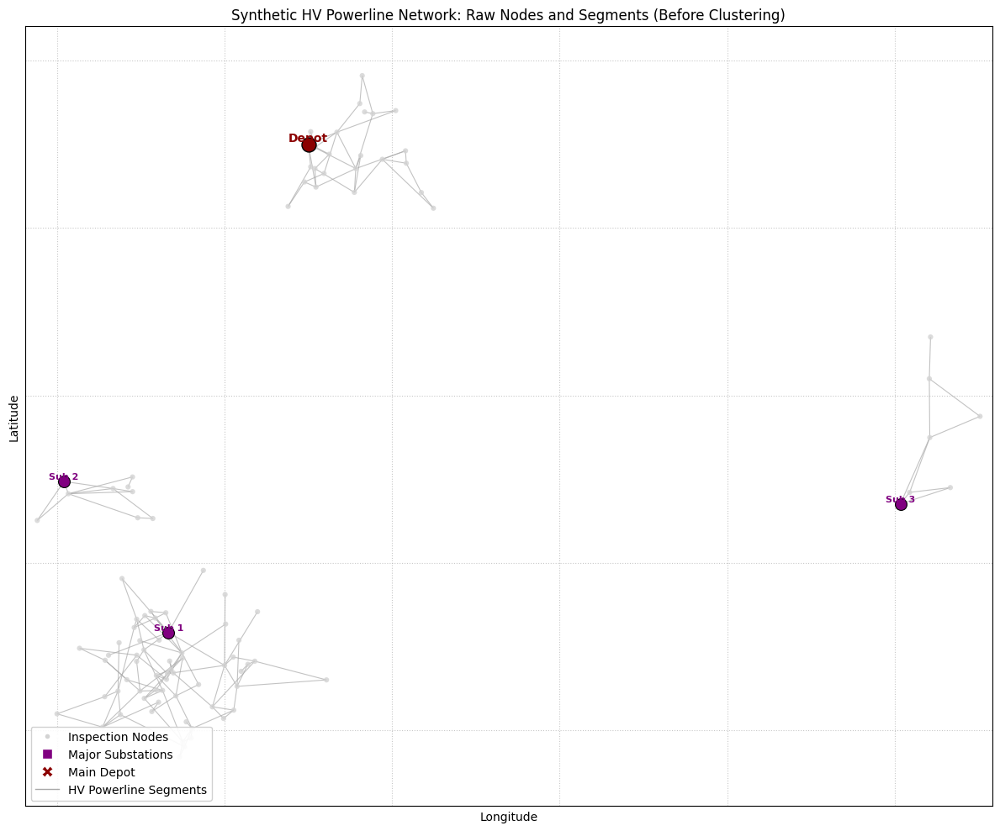

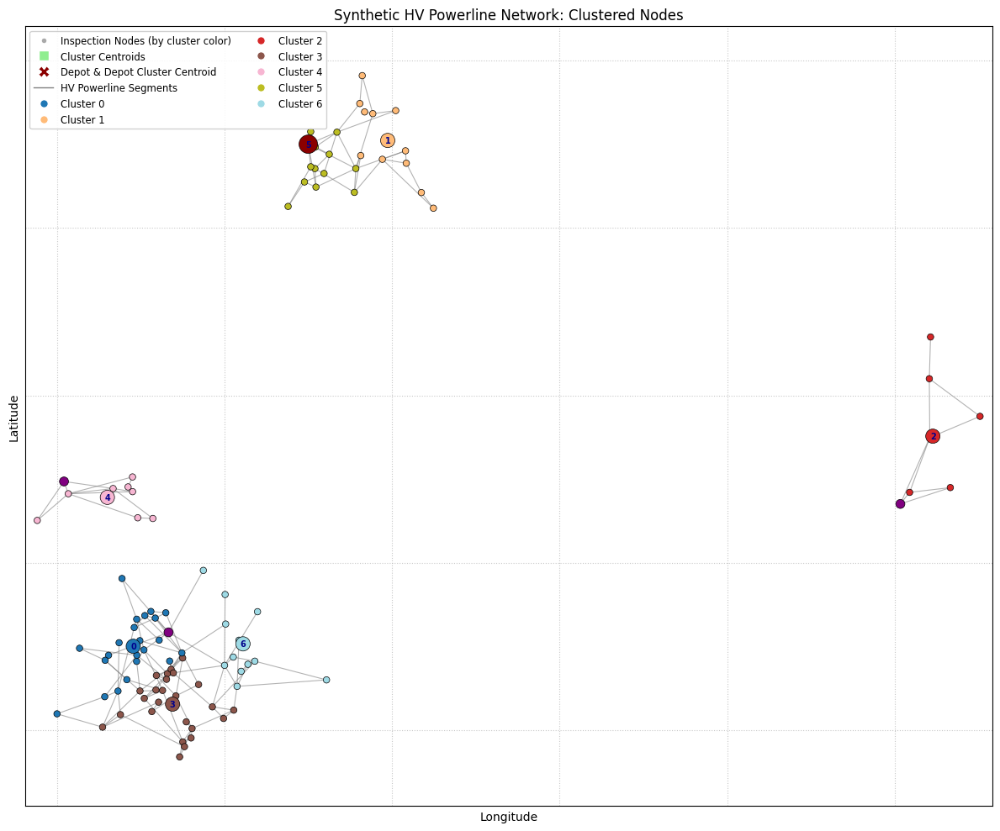

/tmp/ipython-input-32-3086460362.py:1017: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  uav_path_colors = plt.cm.get_cmap('Dark2', Q_UAVS)


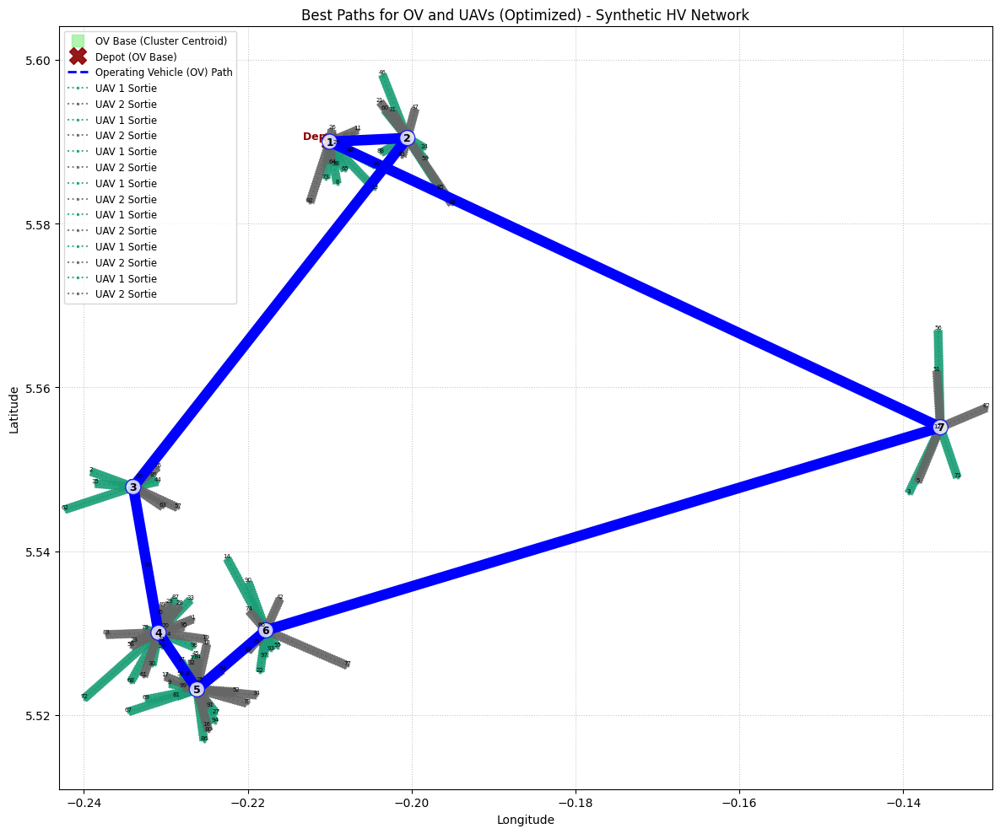


--- Coverage Analysis ---
Total Inspectable Nodes: 100
Nodes Visited by UAVs: 100
Node Coverage: 100.00%
Total Generated HV Edges: 150
Edges with Both Endpoints Visited by UAVs: 150
Edge Coverage: 100.00%

--- Optimal Path Details ---

OV Best Path Order (Cluster IDs):
DEPOT(5) -> C1 -> C4 -> C0 -> C3 -> C6 -> C2 -> DEPOT(5)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 5 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C5 -> 65 -> OV_C5; OV_C5 -> 0 -> OV_C5; OV_C5 -> 73 -> OV_C5; OV_C5 -> 6 -> OV_C5; OV_C5 -> 13 -> OV_C5; OV_C5 -> 10 -> OV_C5; OV_C5 -> 38 -> OV_C5
    UAV 1: OV_C5 -> 20 -> OV_C5; OV_C5 -> 92 -> OV_C5; OV_C5 -> 40 -> OV_C5; OV_C5 -> 26 -> OV_C5; OV_C5 -> 64 -> OV_C5; OV_C5 -> 11 -> OV_C5
  Cluster 1 (OV Base at [5.5904, -0.2005]):
    UAV 0: OV_C1 -> 59 -> OV_C1; OV_C1 -> 88 -> OV_C1; OV_C1 -> 85 -> OV_C1; OV_C1 -> 24 -> OV_C1; OV_C1 -> 60 -> OV_C1; OV_C1 -> 46 -> OV_C1
    UAV 1: OV_C1 -> 47 -> OV_C1; OV_C1 -> 48 -> OV_C1; OV_C1 ->

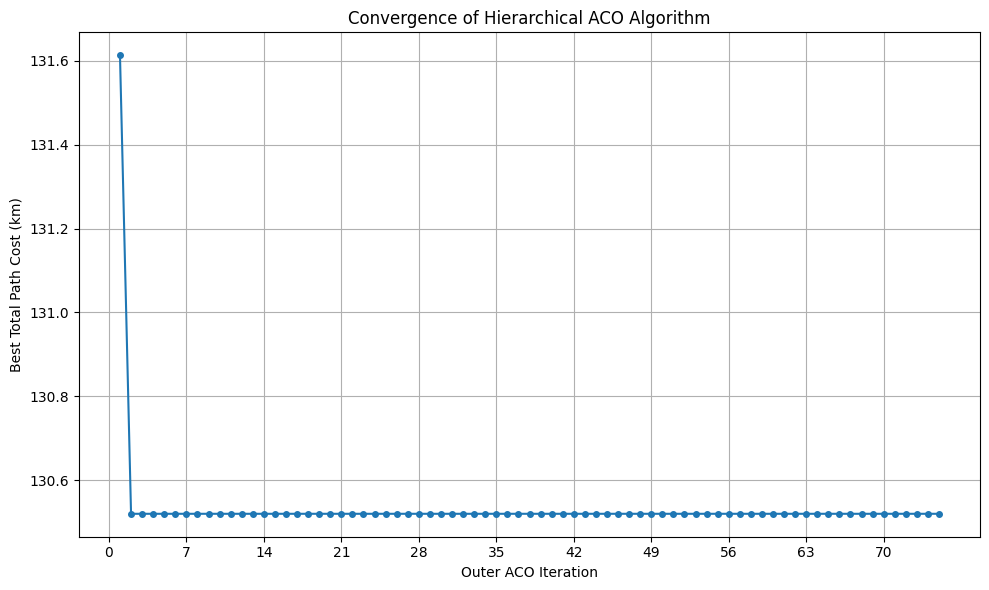

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time

# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- MODIFIED: Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    """
    num_nodes = len(aco_nodes)
    # Create a mapping from node ID to its 0-indexed position in aco_nodes list
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    # Add nodes to the NetworkX graph using their original IDs
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    # Add edges with 'distance' as weight
    for u_id, v_id, dist in aco_edges:
        # Ensure nodes exist in the graph before adding edge
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist) # NetworkX uses 'weight' for edge costs

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    # Use all_pairs_dijkstra_path_length for robust shortest path calculation
    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight') # Specify weight

    # Convert generator to dictionary for easier lookup. This can be memory intensive for very large graphs.
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    # Initialize distance matrix with infinity for unreachable pairs and 0 for self-loops
    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    # Populate the numpy matrix from NetworkX results
    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            # For undirected graphs, distances are symmetric
            uav_distances[v_idx, u_idx] = dist

    # Handle truly disconnected components by assigning a high penalty for "flying" directly
    # This scenario occurs if the generated powerline network itself has isolated nodes/sub-networks.
    PENALTY_FACTOR = 500 # Penalty factor for direct air travel vs. on-network travel
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf: # If still unreachable via graph edges
                # Calculate direct Haversine distance as a base for penalty
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                # Assign a large penalized distance. Ensure it's not zero if actual distance is zero.
                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR # Assign a very small non-zero value
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                # Ensure symmetry for penalized distances too
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances


# --- UPDATED: Generate Realistic HV Powerline Nodes and Edges ---
# Define a broader spatial region for HV lines (example for Accra)
# FIXED: Decreased bounding box to reflect smaller segment lengths and denser network
# Aiming for approx. 20km x 20km box centered around the depot
ACCRA_LAT_RANGE = 0.18 # approx 20km
ACCRA_LON_RANGE = 0.18 # approx 20km

DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Central Accra depot (retained)

ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2


# FIXED: Updated realistic minimum and maximum powerline segment lengths
MIN_HV_SEGMENT_KM = 0.1 # Realistic Range: 0.1 km (100 meters) to 0.25 km (250 meters)
MAX_HV_SEGMENT_KM = 1.0 # Realistic Range: 0.6 km (600 meters) to 1.0 km (1000 meters)

def generate_hv_powerline_network(num_nodes, num_major_substations=3, trunk_line_length_mult=2.0, branch_density=0.5):
    """
    Generates a synthetic HV powerline network with a main depot, major substations,
    trunk lines connecting them, and feeder lines (branches) extending outwards.
    Aims for a more realistic linear/path-like structure with clustered elements.

    Returns nodes, depot_id, edges, and the bounding box.
    """
    nodes = []
    edges = [] # List to store generated edges (u_id, v_id, distance)
    current_node_id = 0

    # Adjusted bounds for HV generation
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX

    # Place the depot node (always first, ID 0)
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1

    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen)

    # 1. Generate Major Substations
    major_substation_nodes = []
    for _ in range(num_major_substations):
        if remaining_nodes_to_generate <= 0: break
        # Place major substations somewhat spread out but within bounds
        lat = random.uniform(lat_min_gen + (lat_max_gen - lat_min_gen) * 0.1, lat_max_gen - (lat_max_gen - lat_min_gen) * 0.1)
        lon = random.uniform(lon_min_gen + (lon_max_gen - lon_min_gen) * 0.1, lon_max_gen - (lon_max_gen - lon_min_gen) * 0.1)

        nodes.append({'id': current_node_id, 'lat': lat, 'lon': lon, 'is_major_substation': True})
        major_substation_nodes.append(current_node_id)
        current_node_id += 1
        remaining_nodes_to_generate -= 1

    # 2. Generate Trunk Lines (Depot to Major Substations, and Major Substations to each other)
    # Connect depot to all major substations
    for sub_id in major_substation_nodes:
        # Check if direct distance is within a reasonable range for a trunk line
        if haversine_distance(nodes[depot_node_id]['lat'], nodes[depot_node_id]['lon'],
                              nodes[sub_id]['lat'], nodes[sub_id]['lon']) > MAX_HV_SEGMENT_KM * 5: # Avoid very long initial gaps
            continue

        # Create segments along the trunk line
        start_lat, start_lon = nodes[depot_node_id]['lat'], nodes[depot_node_id]['lon']
        end_lat, end_lon = nodes[sub_id]['lat'], nodes[sub_id]['lon']

        trunk_length_km = haversine_distance(start_lat, start_lon, end_lat, end_lon)
        # Use new segment ranges for trunk lines, scaling by trunk_line_length_mult
        num_trunk_segments = max(1, int(trunk_length_km / random.uniform(MIN_HV_SEGMENT_KM * trunk_line_length_mult, MAX_HV_SEGMENT_KM * trunk_line_length_mult)))

        prev_node = depot_node_id
        for i in range(num_trunk_segments):
            if current_node_id >= num_nodes: break
            t = (i + 1) / num_trunk_segments
            # FIXED: Reduced jitter for denser network
            new_lat = start_lat + t * (end_lat - start_lat) + random.uniform(-0.00005, 0.00005) # Even smaller jitter for 20km box
            new_lon = start_lon + t * (end_lon - start_lon) + random.uniform(-0.00005, 0.00005)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            # If it's the last segment, connect to the actual substation, otherwise create a new node
            target_node_for_segment = sub_id if i == num_trunk_segments - 1 else current_node_id

            if target_node_for_segment == current_node_id: # Creating new node
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                current_node_id += 1
                remaining_nodes_to_generate -= 1

            dist_seg = haversine_distance(nodes[prev_node]['lat'], nodes[prev_node]['lon'],
                                          nodes[target_node_for_segment]['lat'], nodes[target_node_for_segment]['lon'])
            if dist_seg >= MIN_HV_SEGMENT_KM and dist_seg <= MAX_HV_SEGMENT_KM: # Ensure new segments are within range
                edges.append((prev_node, target_node_for_segment, dist_seg))
            elif dist_seg > MAX_HV_SEGMENT_KM and target_node_for_segment != sub_id: # If too long, don't add and don't make it prev_node
                 continue # Skip this segment and don't update prev_node
            elif target_node_for_segment == sub_id and dist_seg > MAX_HV_SEGMENT_KM * 2: # Allow slightly longer for direct sub connection
                 continue # Skip if too long even for direct sub connection

            prev_node = target_node_for_segment

    # Connect major substations to each other if close enough
    for i in range(len(major_substation_nodes)):
        for j in range(i + 1, len(major_substation_nodes)):
            sub_id1, sub_id2 = major_substation_nodes[i], major_substation_nodes[j]
            dist_between_subs = haversine_distance(nodes[sub_id1]['lat'], nodes[sub_id1]['lon'],
                                                  nodes[sub_id2]['lat'], nodes[sub_id2]['lon'])
            # Use new MAX_HV_SEGMENT_KM for connections
            if dist_between_subs > MIN_HV_SEGMENT_KM and dist_between_subs < MAX_HV_SEGMENT_KM * 2 and random.random() < 0.6: # Probabilistic connection, max 2 segments
                # Add a direct edge or create nodes along this connection
                edges.append((sub_id1, sub_id2, dist_between_subs))


    # 3. Generate Feeder Lines (Branches) from depot, major substations, and existing nodes
    source_nodes_for_branches = list(range(current_node_id)) # All nodes created so far

    # To ensure 100 nodes, generate nodes until num_nodes is reached
    attempts = 0
    max_attempts = num_nodes * 5 # Prevent infinite loops if impossible to place nodes

    while remaining_nodes_to_generate > 0 and source_nodes_for_branches and attempts < max_attempts:
        attempts += 1
        from_node_id = random.choice(source_nodes_for_branches)
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']

        # Determine a direction for the branch
        angle = random.uniform(0, 2 * np.pi) # Random angle in radians
        # Use the updated MAX_HV_SEGMENT_KM for branch lengths
        branch_length_km = random.uniform(MIN_HV_SEGMENT_KM, MAX_HV_SEGMENT_KM * 1.0) # Branches should stick to strict segment length

        # Convert length to lat/lon offsets
        avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
        target_lat_offset = branch_length_km * np.sin(angle) / 111 # ~111km per degree latitude
        target_lon_offset = branch_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad)) # Longitude degree length varies by latitude

        branch_target_lat = from_lat + target_lat_offset
        branch_target_lon = from_lon + target_lon_offset

        # Clamp target to generation bounds
        branch_target_lat = max(lat_min_gen, min(lat_max_gen, branch_target_lat))
        branch_target_lon = max(lon_min_gen, min(lon_max_gen, branch_target_lon))

        branch_actual_length_km = haversine_distance(from_lat, from_lon, branch_target_lat, branch_target_lon)
        if branch_actual_length_km < MIN_HV_SEGMENT_KM or branch_actual_length_km > MAX_HV_SEGMENT_KM * 1.5 : continue # Skip if too short or too long

        # Determine number of segments for this branch
        num_segments_on_branch = 1 # Force 1 segment per branch attempt to ensure individual nodes are created
        # num_segments_on_branch = max(1, int(branch_actual_length_km / random.uniform(MIN_HV_SEGMENT_KM, MAX_HV_SEGMENT_KM)))
        # num_segments_on_branch = min(num_segments_on_branch, remaining_nodes_to_generate)

        if num_segments_on_branch == 0: continue # Should not happen with num_segments_on_branch = 1

        prev_node_id = from_node_id
        for segment_idx in range(num_segments_on_branch):
            if current_node_id >= num_nodes: break

            t = (segment_idx + 1) / num_segments_on_branch
            # FIXED: Reduced jitter for denser network
            new_lat = from_lat + t * (branch_target_lat - from_lat) + random.uniform(-0.00001, 0.00001) # Very small jitter
            new_lon = from_lon + t * (branch_target_lon - from_lon) + random.uniform(-0.00001, 0.00001)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
            dist_seg = haversine_distance(nodes[prev_node_id]['lat'], nodes[prev_node_id]['lon'], new_lat, new_lon)
            if dist_seg >= MIN_HV_SEGMENT_KM and dist_seg <= MAX_HV_SEGMENT_KM: # Only add if segment within range
                edges.append((prev_node_id, current_node_id, dist_seg))
                prev_node_id = current_node_id # Only advance if edge was successfully added
                source_nodes_for_branches.append(current_node_id) # New nodes can also be sources for further branches
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                # If segment is not within min/max, don't add the node/edge, and don't increment current_node_id
                nodes.pop() # Remove the last added node as it's invalid
                # No change to remaining_nodes_to_generate or current_node_id, try again
                break # Break from inner loop, try new branch from_node_id


        # Optional: try to connect the end of this branch to another existing node for better mesh connectivity
        # Only if a new node was actually added in this branch attempt
        if prev_node_id != from_node_id and len(nodes) > 1 and random.random() < branch_density:
            potential_connect_targets = [n['id'] for n in nodes if n['id'] != prev_node_id and n['id'] != from_node_id]
            if potential_connect_targets:
                # Find closest, not too far away, and not directly connected
                closest_target_id = None
                min_dist_reconnect = float('inf')

                # Create a temporary graph to check connectivity to avoid adding redundant edges.
                temp_G = nx.Graph()
                temp_G.add_edges_from([(u,v) for u,v,_ in edges])

                for target_id in potential_connect_targets:
                    # Check if an edge already exists
                    if temp_G.has_edge(prev_node_id, target_id):
                        continue

                    dist = haversine_distance(nodes[prev_node_id]['lat'], nodes[prev_node_id]['lon'],
                                             nodes[target_id]['lat'], nodes[target_id]['lon'])
                    # Use new MAX_HV_SEGMENT_KM for reconnection range
                    if dist > MIN_HV_SEGMENT_KM and dist < MAX_HV_SEGMENT_KM * 1.2: # Allow slightly more for reconnections
                        if dist < min_dist_reconnect:
                            min_dist_reconnect = dist
                            closest_target_id = target_id

                if closest_target_id is not None and min_dist_reconnect > 0:
                    edges.append((prev_node_id, closest_target_id, min_dist_reconnect))

    # Re-index nodes and edges to ensure IDs are contiguous from 0
    # and depot_id is correctly mapped. First, map old IDs to new 0-based indices.
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}

    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        if 'is_major_substation' in node: new_node['is_major_substation'] = node['is_major_substation']
        reindexed_nodes.append(new_node)

    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph

    # Remove duplicate edges and ensure unique (u,v) pairs
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v))) # For undirected, (u,v) is same as (v,u)
        # Store (edge_key, distance) to handle cases where same (u,v) might have slightly different calculated distances
        # For simplicity, we'll assume the first encountered distance for a unique edge_key
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))

    new_depot_id = id_map[depot_node_id]

    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))

    return reindexed_nodes, new_depot_id, final_edges, bbox


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    # The 'virtual depot' for UAVs is the cluster centroid (OV location)
    # This node is conceptually at index 0 for local calculations within the cluster ACO
    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster

    # Mapping from original node ID (from all_nodes_global) to its local index within 'local_nodes'
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}

    # Mapping from global node ID to its global index (for looking up in uav_distances_all)
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    # Populate local_uav_distances matrix.
    # Distances between real nodes (not virtual depot) are taken from precomputed global matrix.
    # Distances to/from virtual depot are direct Haversine.
    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j: continue

            id_i = local_nodes[i]['id']
            id_j = local_nodes[j]['id']

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                # Distance to/from the virtual depot (cluster centroid) is direct Haversine
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else: # Between two actual inspection nodes within the cluster
                # Use precomputed global shortest distances from uav_distances_all
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   # This should not happen if all nodes in nodes_in_cluster are derived from all_nodes_global
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    # Initialize pheromones and heuristics for UAVs within this cluster
    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {} # Stores original IDs for routes

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)} # Routes for each UAV (original IDs)

        # Nodes that still need to be inspected in this cluster (local indices)
        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx) # Randomize order for this ant's iteration

        # Simulate assigning nodes to UAVs for inspection (one tower per sortie)
        # We greedily assign available UAVs to nodes based on a combination of heuristic and pheromone.
        # This is a simplified "ant" choosing which single tower to service next.

        nodes_assigned_in_this_ant_tour = [] # Keep track of which nodes were successfully assigned

        for node_local_idx in nodes_to_inspect_local_idx:
            # Cost for this single sortie: Depot -> Node -> Depot
            try: # Defensive check for potential inf distances
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError: # This handles cases where local_uav_distances might not be square or valid
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                # This node is reachable. Assign it to one of the UAVs.
                # For simplicity in this "one tower per sortie" model, we don't have complex UAV "state".
                # Instead, we just accumulate the cost and assign the node to an arbitrary UAV
                # (e.g., the one that would have the shortest path, or just round-robin for fair distribution)
                # The ACO's "ant" here is effectively deciding *which* target node to pick next.

                # Pick a UAV to perform this sortie (e.g., round-robin or least utilized)
                # For this simplified model, the choice of *which specific UAV* within the fleet
                # doesn't affect the *total* cost for covering the cluster, only the distribution.
                # Let's just pick one in round robin.
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                # Record the route for this sortie
                # The virtual depot has ID -1.
                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                # Each sortie is a separate trip. Add to the specific UAV's route list.
                ant_current_uav_routes[assigned_uav_q].append(depot_original_id)
                ant_current_uav_routes[assigned_uav_q].append(target_original_id)
                ant_current_uav_routes[assigned_uav_q].append(depot_original_id)

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
            else:
                # Node is unreachable by any UAV, so this ant's tour is infeasible for this cluster
                ant_current_total_uav_cost = float('inf')
                break # Break if any node is unreachable

        if len(nodes_assigned_in_this_ant_tour) != len(nodes_in_cluster):
            ant_current_total_uav_cost = float('inf') # Not all nodes were covered

        # If current ant found a better solution for this cluster
        if ant_current_total_uav_cost < best_cluster_uav_cost:
            best_cluster_uav_cost = ant_current_total_uav_cost
            best_cluster_uav_routes = ant_current_uav_routes

        # Pheromone update for Inner ACO
        # Evaporation
        pheromones_uav *= (1 - rho_uav)

        # Deposition - only if this ant's solution is feasible and better than the worst in this iteration
        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            # Deposit pheromone on the edges used by this ant's successful assignments
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                # A route for 'one tower per sortie' is a list of [Depot, Node1, Depot, Node2, Depot, ...]
                for i in range(0, len(q_route_original_ids), 3): # Iterate through individual sorties
                    if i + 1 < len(q_route_original_ids): # Ensure there's a target node
                        u_id_sortie_start = q_route_original_ids[i] # This is always 'OV_C...'
                        v_id_sortie_target = q_route_original_ids[i+1] # This is the actual node ID

                        # Convert original IDs to local indices for pheromone matrix
                        u_local = 0 # Virtual depot is always index 0
                        v_local = original_id_to_local_idx.get(v_id_sortie_target)

                        if v_local is not None:
                            pheromones_uav[u_local, v_local] += pheromone_to_add
                            pheromones_uav[v_local, u_local] += pheromone_to_add # Symmetric update for return path


    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    # If no more clusters to visit, but not all were visited, this path is incomplete.
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            # If not all clusters were visited, this ant's OV path is incomplete and thus infeasible
            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx) # Complete the tour by returning to depot

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            # Evaluate UAV paths for each cluster in this OV tour
            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]: # Iterate through unique clusters in the path (excluding final depot return)
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_for_aco['centroids'][cluster_id]

                    # Call Inner ACO
                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords # Pass all_nodes_coords (global)
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf') # If any cluster is infeasible, whole tour is
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf') # Default to infeasible
            if ant_tour_total_uav_cost != float('inf'): # Only if all inner ACOs were feasible
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            # Update best solution found so far
            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        # Pheromone update for Outer ACO
        pheromones_ov *= (1 - rho_ov) # Evaporation

        if ant_total_costs: # Only deposit if there were any valid tours generated by ants
            # Find the best ant in this iteration to deposit pheromone (elitist update for iteration)
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add # Symmetric

        convergence_data.append(best_total_cost) # Append best_total_cost for the current iteration here

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data

# --- Main Experiment Parameters ---
N_NODES = 100 # Number of synthetic nodes to generate
M_CLUSTERS = 7 # Number of clusters
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 10 # FIXED: UAV operational range in kilometers (from 100 to 10)

# Define fixed depot location (example central Accra)
# DEPOT_COORD is now defined globally before generate_hv_powerline_network
# DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 30,
    'n_ants_uav': 4,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 150.0,
    'tau0_uav': 1.0
}

# --- 1. Generate More Realistic Synthetic Data ---
print("Generating more realistic High-Voltage powerline nodes and segments...")
# `generate_hv_powerline_network` now returns nodes, depot_id, edges, and bbox
all_nodes, depot_actual_node_id, generated_hv_edges, bbox_coords = \
    generate_hv_powerline_network(N_NODES, num_major_substations=3, trunk_line_length_mult=2.5, branch_density=0.6)

# Display generated network details
print(f"\n--- Generated Network Details ---")
print(f"Number of Extracted Nodes (Inspection Points): {len(all_nodes)}")
print(f"Number of Generated HV Powerline Segments (Edges): {len(generated_hv_edges)}")
print(f"Geographical Bounding Box of Generated Network:")
print(f"  Latitude: [{bbox_coords[0]:.4f}°N, {bbox_coords[1]:.4f}°N]")
print(f"  Longitude: [{bbox_coords[2]:.4f}°E, {bbox_coords[3]:.4f}°E]")


print("\nBuilding UAV distances matrix using NetworkX (shortest paths along generated edges)...")
# Use the function that computes shortest paths along the `generated_hv_edges`
uav_distances_matrix = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_hv_edges)
print("UAV distances matrix built.")


# --- 2. Perform K-Means Clustering ---
print(f"\nPerforming K-means clustering for {M_CLUSTERS} clusters...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of nodes ({len(all_nodes)}) is less than number of clusters requested ({M_CLUSTERS}). Setting M_CLUSTERS to number of nodes.")
    M_CLUSTERS = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes extracted. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label # Update original all_nodes with cluster_id
    clusters_data[label].append(all_nodes[i])

cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

# Ensure the cluster containing the actual depot node is treated as THE depot cluster
depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
depot_cluster_id = depot_node_obj['cluster_id']

# Set the depot cluster's centroid to the exact ECG depot location for consistency
cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}" # Assign a string ID to depot centroid for plotting


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}

# --- 3. Run Hierarchical ACO ---
print("\nRunning Hierarchical ACO algorithm...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id, # Pass the ID of the chosen depot cluster
    all_clusters_for_aco,
    all_nodes, # Pass all_nodes for global_id_to_global_idx map in inner ACO
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM,
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- Optimization Complete ---")
print(f"Total Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- 4. Visualization using NetworkX and Matplotlib ---
print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# Prepare data for networkx plotting
plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}" # Use a unique string ID for the depot centroid for plotting
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id) # Label with cluster ID
    centroid_plot_ids_map[c_id] = plot_id

# Create a color map for clusters
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes} # Build pos here

    # Add generated edges
    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Draw all nodes as small gray dots
    # Ensure nodelist is explicitly G.nodes() to avoid implicit issues
    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='lightgray', edgecolors='none', alpha=0.8)

    # Draw all generated powerline segments
    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    # Highlight major substations (excluding depot if it's also marked as substation for simplicity in plotting)
    major_substation_ids = [n['id'] for n in all_nodes if n.get('is_major_substation') and n['id'] != depot_actual_node_id]

    # NEW SAFEGUARD: Filter major_substation_ids to only include keys present in pos
    major_substation_ids = [node_id for node_id in major_substation_ids if node_id in pos]

    if major_substation_ids:
        nx.draw_networkx_nodes(G, pos=pos, nodelist=major_substation_ids, node_size=100, node_color='purple', edgecolors='black', linewidths=0.8)
        # Add text labels for major substations if there aren't too many
        if len(major_substation_ids) <= 5:
            for node_id in major_substation_ids:
                plt.text(pos[node_id][0], pos[node_id][1] + 0.00005, f'Sub {node_id}', fontsize=8, ha='center', va='bottom', color='purple', fontweight='bold') # Reduced offset for denser plot

    # Highlight depot node
    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos: # Ensure depot node is in pos
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']], # Explicitly define nodelist for depot
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00008, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold') # Reduced offset

    plt.title("Synthetic HV Powerline Network: Raw Nodes and Segments (Before Clustering)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgray', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='purple', markersize=8, label='Major Substations'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='HV Powerline Segments')
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_hv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    # Add the generated HV powerline edges (these are the actual network structure)
    hv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(hv_edges_nx_format)

    # Node coloring and sizing
    node_colors_list = []
    node_sizes_list = []

    # Get the valid node IDs from plot_nodes_coords to ensure consistency
    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int): # Actual inspection nodes
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray') # Fallback color
                node_sizes_list.append(0) # Hide
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray') # Fallback color
            node_sizes_list.append(30) # Smaller size for individual nodes

            # If it's the depot itself, give it a distinct color/size
            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 80
            # If it's a major substation
            elif node_data.get('is_major_substation'):
                node_colors_list[-1] = 'purple'
                node_sizes_list[-1] = 60

        else: # Centroid nodes (string IDs like 'C0', 'DepotC1')
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred') # Matches actual depot color
                node_sizes_list.append(250) # Larger for Depot Centroid
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(150) # Size for other Centroids

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.5)

    # Draw labels for centroids (only once per unique centroid)
    centroid_label_pos = {p_id: (x, y + 0.00003) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()} # Reduced offset
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    # Draw generated HV powerline edges (the actual network grid)
    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=hv_edges_nx_format, width=0.8, edge_color='gray', alpha=0.6, label='Generated HV Powerline Segments')

    plt.title("Synthetic HV Powerline Network: Clustered Nodes")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Custom legend for clustered nodes and network components
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=8, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1, label='HV Powerline Segments')
    ]
    # Add an example for cluster colors
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_hv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id):
    plt.figure(figsize=(12, 10))

    # Plot all original nodes as background reference
    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int): # Only plot actual inspection nodes
            plt.plot(lon, lat, 'o', markersize=3, color='lightgray', alpha=0.6)

    # Plot cluster centroids as background and label them
    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            plt.plot(centroid['lon'], centroid['lat'], 'X', markersize=14, color='darkred', alpha=0.9, label='Depot (OV Base)')
            plt.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=9, ha='center', va='bottom', color='darkred', fontweight='bold') # Reduced offset
        else:
            plt.plot(centroid['lon'], centroid['lat'], 's', markersize=10, color='lightgreen', alpha=0.7, label='OV Base (Cluster Centroid)' if c_id == list(cluster_centroids.keys())[0] else "")
            plt.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=8, ha='center', va='bottom', color='darkgreen') # Reduced offset

    # OV Path in Blue with arrows and numbered stops
    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        plt.arrow(x1, y1, x2 - x1, y2 - y1,
                  head_width=0.00005, length_includes_head=True, color='blue', linewidth=2, zorder=5) # Reduced head_width
    plt.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
              'b--', linewidth=2, label='Operating Vehicle (OV) Path', zorder=4)

    # Add numbered markers for OV path order at centroids
    for i in range(len(best_ov_path_ids) - 1): # Exclude final depot return for numbering
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        plt.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='black', fontsize=9, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='blue', boxstyle='circle,pad=0.2', alpha=0.8),
                 zorder=6)

    # UAV paths
    uav_path_colors = plt.cm.get_cmap('Dark2', Q_UAVS)
    uav_labels_added = set()
    all_visited_nodes_by_uavs = set() # To track for node coverage

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            # In 'one tower per sortie', route_nodes_ids is like [OV_C, Node1, OV_C, Node2, OV_C, ...]
            # Iterate through these 3-element sorties
            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids): # Ensure a full [OV_C, Node, OV_C] sortie
                    # Start at centroid, go to node, return to centroid
                    start_node_id = route_nodes_ids[i] # This is 'OV_C...'
                    target_node_id = route_nodes_ids[i+1] # This is the actual node ID
                    end_node_id = route_nodes_ids[i+2] # This is 'OV_C...'

                    uav_sortie_coords = []
                    # Start from OV (centroid)
                    uav_sortie_coords.append((cluster_centroid_loc['lon'], cluster_centroid_loc['lat']))

                    # Go to target node
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)
                    if node_data and target_node_id in plot_nodes_coords: # Check if node_data exists AND is in plot_nodes_coords
                        uav_sortie_coords.append(plot_nodes_coords.get(target_node_id))
                        all_visited_nodes_by_uavs.add(target_node_id) # Add to set for coverage calculation
                    else:
                        uav_sortie_coords.append(uav_sortie_coords[-1])
                        continue

                    # Return to OV (centroid)
                    uav_sortie_coords.append((cluster_centroid_loc['lon'], cluster_centroid_loc['lat']))

                    color_idx = uav_q % Q_UAVS # Ensure index is within colormap range
                    color_for_uav = uav_path_colors(color_idx)

                    # Plot the individual sortie path segments
                    for j in range(len(uav_sortie_coords) - 1):
                        x1, y1 = uav_sortie_coords[j]
                        x2, y2 = uav_sortie_coords[j+1]
                        plt.arrow(x1, y1, x2 - x1, y2 - y1,
                                  head_width=0.00003, length_includes_head=True, color=color_for_uav, # Reduced head_width
                                  linewidth=0.8, linestyle=':', alpha=0.7, zorder=3) # Reduced linewidth

                    label = f'UAV {uav_q+1} Sortie' if (uav_q not in uav_labels_added or i==0) else "_nolegend_"
                    plt.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                              linestyle=':', marker='o', markersize=1.5, color=color_for_uav, label=label, zorder=2, alpha=0.8) # Reduced marker size
                    uav_labels_added.add(uav_q)

                    # Label visited node
                    if node_data and target_node_id != depot_actual_node_id and target_node_id in plot_nodes_coords:
                        plt.text(node_data['lon'], node_data['lat'] + 0.000015, f"{target_node_id}", fontsize=5, color='black', ha='center', va='bottom', zorder=7) # Reduced offset and fontsize


    plt.legend(loc='upper left', fontsize='small')
    plt.title("Best Paths for OV and UAVs (Optimized) - Synthetic HV Network")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("optimized_paths_ov_uav_synthetic_hv.png")
    plt.show()

    # --- Compute and Display Coverage Metrics ---
    total_inspectable_nodes = len(all_nodes)
    node_coverage_percentage = (len(all_visited_nodes_by_uavs) / total_inspectable_nodes) * 100 if total_inspectable_nodes > 0 else 0

    # Edge Coverage: An edge is covered if both its endpoints are among the visited nodes.
    covered_edges_count = 0
    unique_generated_edges_set = set()
    for u, v, _ in generated_hv_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_generated_edges_set:
            unique_generated_edges_set.add(edge_key)
            if u in all_visited_nodes_by_uavs and v in all_visited_nodes_by_uavs:
                covered_edges_count += 1

    total_generated_edges = len(unique_generated_edges_set)
    edge_coverage_percentage = (covered_edges_count / total_generated_edges) * 100 if total_generated_edges > 0 else 0

    print(f"\n--- Coverage Analysis ---")
    print(f"Total Inspectable Nodes: {total_inspectable_nodes}")
    print(f"Nodes Visited by UAVs: {len(all_visited_nodes_by_uavs)}")
    print(f"Node Coverage: {node_coverage_percentage:.2f}%")
    print(f"Total Generated HV Edges: {total_generated_edges}")
    print(f"Edges with Both Endpoints Visited by UAVs: {covered_edges_count}")
    print(f"Edge Coverage: {edge_coverage_percentage:.2f}%")


# --- Main execution flow for Synthetic HV Data ---
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- Run the visualizations ---
# 1. Plot raw network (before clustering)
plot_raw_powerline_network(all_nodes, generated_hv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id)


# 2. Plot clustered network
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_hv_edges, bbox_coords, depot_actual_node_id)

# 3. Plot best paths after ACO
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            # Reconstruct the string for display, showing each sortie clearly
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids): # Ensure there's a target node
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
plt.plot(range(1, OV_ACO_PARAMS['iters_ov'] + 1), convergence_history, marker='o', linestyle='-', markersize=4)
plt.title('Convergence of Hierarchical ACO Algorithm')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
plt.xticks(np.arange(0, OV_ACO_PARAMS['iters_ov'] + 1, max(1, OV_ACO_PARAMS['iters_ov'] // 10)))
plt.tight_layout()
plt.savefig("aco_convergence_plot_synthetic_hv.png")
print("Convergence plot saved to aco_convergence_plot_synthetic_hv.png")
plt.show()

Generating more realistic High-Voltage powerline nodes and segments...

--- Generated Network Details ---
Number of Extracted Nodes (Inspection Points): 100
Number of Generated HV Powerline Segments (Edges): 114
Geographical Bounding Box of Generated Network:
  Latitude: [5.5300°N, 5.6500°N]
  Longitude: [-0.2308°E, -0.1900°E]

Building UAV distances matrix using NetworkX (shortest paths along generated edges)...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.05 seconds.
UAV distances matrix built.

Performing K-means clustering for 7 clusters...

Running Hierarchical ACO algorithm...


/tmp/ipython-input-26-4231727536.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-26-4231727536.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-26-4231727536.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-26-4231727536.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-26-4231727536.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-26-4231727536.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-26-4231727536.py:32: RuntimeWarning: divide by zero encountered


--- Optimization Complete ---
Total Runtime: 15.03 seconds
Best Total Path Cost: 168.04 km

--- Visualizing Results with NetworkX and Matplotlib ---


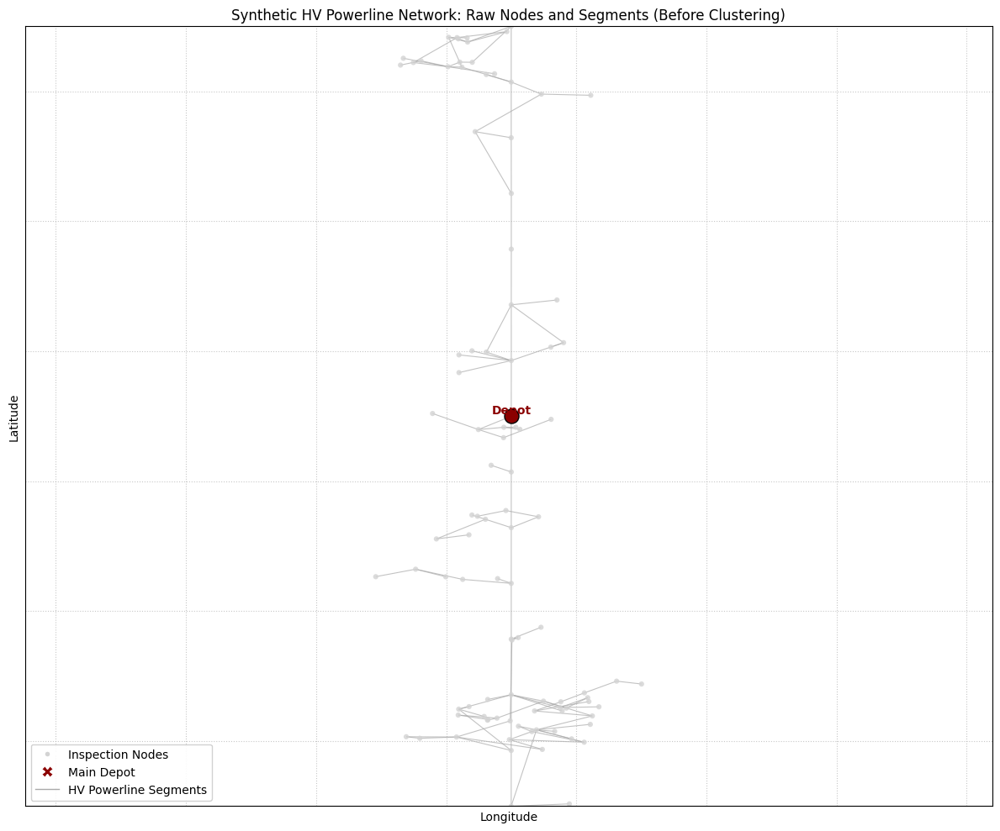

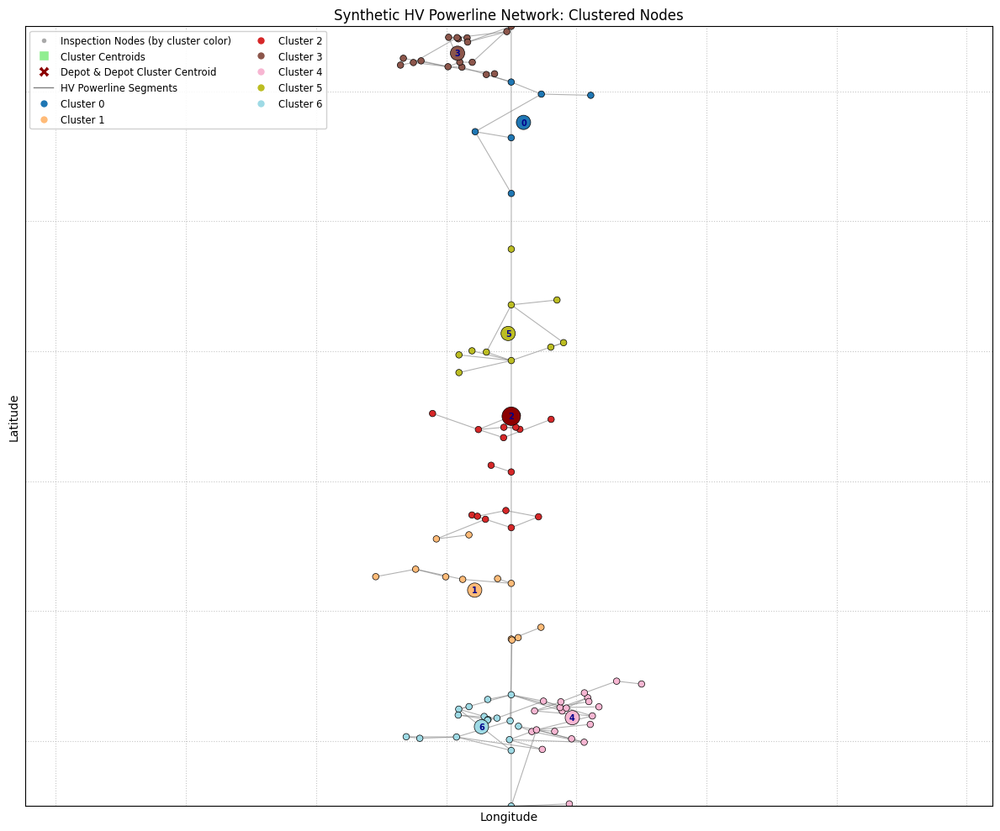

/tmp/ipython-input-26-4231727536.py:990: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  uav_path_colors = plt.cm.get_cmap('Dark2', Q_UAVS)


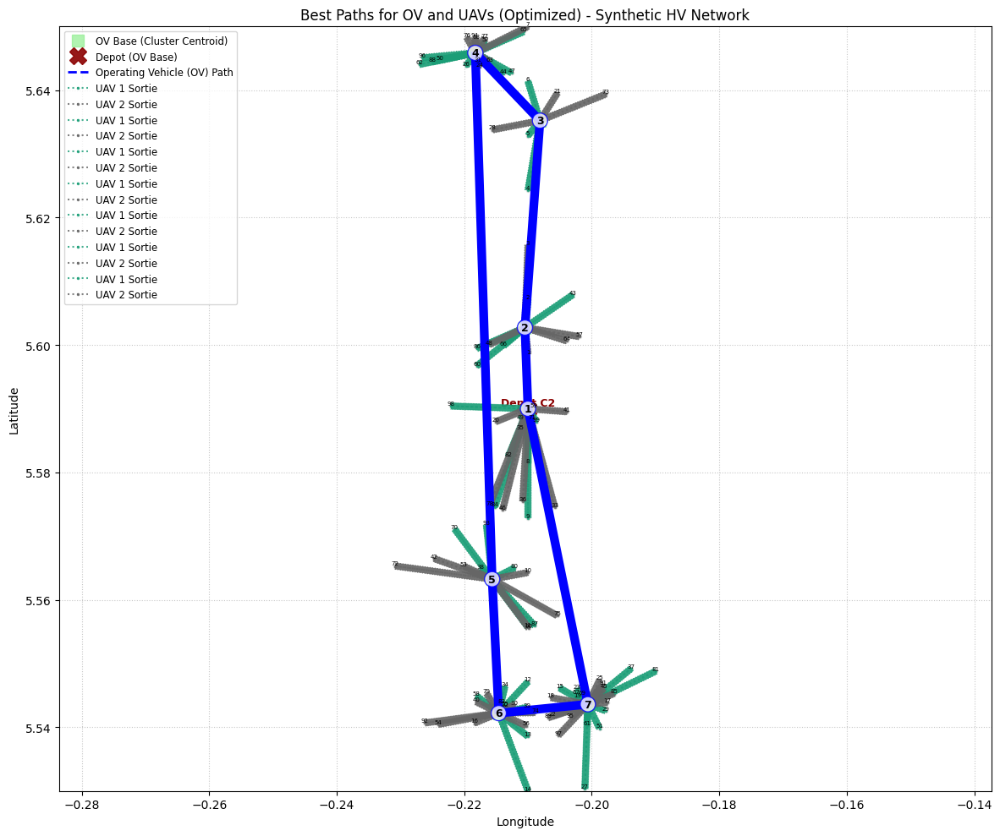


--- Coverage Analysis ---
Total Inspectable Nodes: 100
Nodes Visited by UAVs: 100
Node Coverage: 100.00%
Total Generated HV Edges: 114
Edges with Both Endpoints Visited by UAVs: 114
Edge Coverage: 100.00%

--- Optimal Path Details ---

OV Best Path Order (Cluster IDs):
DEPOT(2) -> C5 -> C0 -> C3 -> C1 -> C6 -> C4 -> DEPOT(2)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 2 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C2 -> 99 -> OV_C2; OV_C2 -> 84 -> OV_C2; OV_C2 -> 98 -> OV_C2; OV_C2 -> 35 -> OV_C2; OV_C2 -> 49 -> OV_C2; OV_C2 -> 0 -> OV_C2; OV_C2 -> 9 -> OV_C2; OV_C2 -> 82 -> OV_C2; OV_C2 -> 8 -> OV_C2
    UAV 1: OV_C2 -> 36 -> OV_C2; OV_C2 -> 20 -> OV_C2; OV_C2 -> 33 -> OV_C2; OV_C2 -> 78 -> OV_C2; OV_C2 -> 59 -> OV_C2; OV_C2 -> 71 -> OV_C2; OV_C2 -> 46 -> OV_C2; OV_C2 -> 41 -> OV_C2
  Cluster 5 (OV Base at [5.6027, -0.2105]):
    UAV 0: OV_C5 -> 43 -> OV_C5; OV_C5 -> 2 -> OV_C5; OV_C5 -> 60 -> OV_C5; OV_C5 -> 86 -> OV_C5; OV_C5 -> 66 -> OV_C5

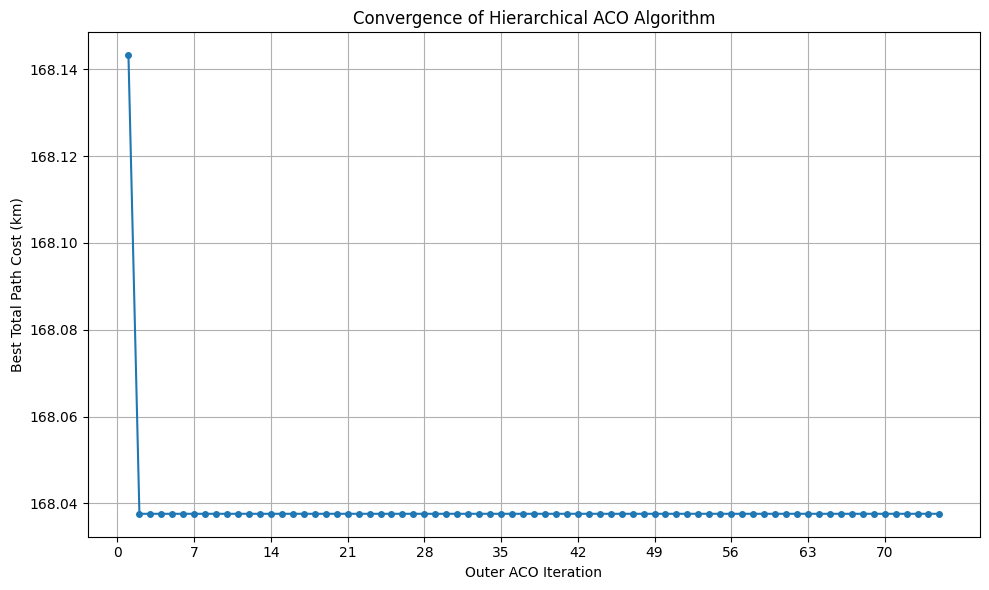

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time

# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- MODIFIED: Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    """
    num_nodes = len(aco_nodes)
    # Create a mapping from node ID to its 0-indexed position in aco_nodes list
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    # Add nodes to the NetworkX graph using their original IDs
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    # Add edges with 'distance' as weight
    for u_id, v_id, dist in aco_edges:
        # Ensure nodes exist in the graph before adding edge
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist) # NetworkX uses 'weight' for edge costs

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    # Use all_pairs_dijkstra_path_length for robust shortest path calculation
    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight') # Specify weight

    # Convert generator to dictionary for easier lookup. This can be memory intensive for very large graphs.
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    # Initialize distance matrix with infinity for unreachable pairs and 0 for self-loops
    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    # Populate the numpy matrix from NetworkX results
    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            # For undirected graphs, distances are symmetric
            uav_distances[v_idx, u_idx] = dist

    # Handle truly disconnected components by assigning a high penalty for "flying" directly
    # This scenario occurs if the generated powerline network itself has isolated nodes/sub-networks.
    PENALTY_FACTOR = 500 # Penalty factor for direct air travel vs. on-network travel
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf: # If still unreachable via graph edges
                # Calculate direct Haversine distance as a base for penalty
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                # Assign a large penalized distance. Ensure it's not zero if actual distance is zero.
                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR # Assign a very small non-zero value
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                # Ensure symmetry for penalized distances too
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances


# --- UPDATED: Generate More Deterministic and Realistic HV Powerline Nodes and Edges ---
# Define a broader spatial region for HV lines (example for Accra)
# FIXED: Decreased bounding box to reflect smaller segment lengths and denser network
# Aiming for approx. 20km x 20km box centered around the depot
ACCRA_LAT_RANGE = 0.18 # approx 20km
ACCRA_LON_RANGE = 0.18 # approx 20km

DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Central Accra depot (retained)

ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2


# FIXED: Updated realistic minimum and maximum powerline segment lengths
MIN_HV_SEGMENT_KM = 0.1 # Realistic Range: 0.1 km (100 meters) to 0.25 km (250 meters)
MAX_HV_SEGMENT_KM = 1.0 # Realistic Range: 0.6 km (600 meters) to 1.0 km (1000 meters)

def generate_hv_powerline_network(num_nodes, trunk_line_density_factor=0.8, branch_probability=0.7, mesh_probability=0.2):
    """
    Generates a synthetic HV powerline network with a more deterministic 'spine and ribs' structure.
    Aims for a more realistic linear/path-like structure with controlled branching.

    Returns nodes, depot_id, edges, and the bounding box.
    """
    nodes = []
    edges = [] # List to store generated edges (u_id, v_id, distance)
    current_node_id = 0

    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX

    # Place the depot node (always first, ID 0)
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1

    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen)

    # Define a main "spine" (trunk line) direction - e.g., generally North-South or East-West
    # Let's make it generally North-South across the bounding box for this example
    spine_start_lat = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 3 # Start somewhat below depot
    spine_end_lat = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 3   # End somewhat above depot
    spine_lon = DEPOT_COORD['lon'] # Keep it centered horizontally for simplicity

    # Ensure spine_start_lat and spine_end_lat are within the overall bbox
    spine_start_lat = max(lat_min_gen, min(lat_max_gen, spine_start_lat))
    spine_end_lat = max(lat_min_gen, min(lat_max_gen, spine_end_lat))

    # Generate nodes along the main spine
    spine_nodes = []

    # Calculate target number of nodes for the spine to ensure sufficient nodes are generated first
    approx_spine_length_km = haversine_distance(spine_start_lat, spine_lon, spine_end_lat, spine_lon)
    num_spine_segments = max(1, int(approx_spine_length_km / (MAX_HV_SEGMENT_KM * trunk_line_density_factor)))

    prev_spine_node_id = depot_node_id # Start the spine from the depot for direct connection
    spine_nodes.append(depot_node_id)

    # Generate spine segments "upwards" from depot
    for i in range(1, num_spine_segments // 2 + 1):
        if remaining_nodes_to_generate <= 0: break
        t = i / (num_spine_segments // 2)
        new_lat = DEPOT_COORD['lat'] + t * (spine_end_lat - DEPOT_COORD['lat'])
        new_lon = DEPOT_COORD['lon'] + random.uniform(-0.00001, 0.00001) # Small jitter

        new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
        new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

        nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
        dist = haversine_distance(nodes[prev_spine_node_id]['lat'], nodes[prev_spine_node_id]['lon'], new_lat, new_lon)
        if MIN_HV_SEGMENT_KM <= dist <= MAX_HV_SEGMENT_KM:
            edges.append((prev_spine_node_id, current_node_id, dist))
            spine_nodes.append(current_node_id)
            prev_spine_node_id = current_node_id
            current_node_id += 1
            remaining_nodes_to_generate -= 1
        else: # If segment too long/short, don't add, but try to continue spine
             nodes.pop() # Remove last invalid node
             break # Break this spine generation direction and try from depot again for other direction

    # Generate spine segments "downwards" from depot
    prev_spine_node_id = depot_node_id # Restart from depot
    for i in range(1, num_spine_segments // 2 + 1):
        if remaining_nodes_to_generate <= 0: break
        t = i / (num_spine_segments // 2)
        new_lat = DEPOT_COORD['lat'] - t * (DEPOT_COORD['lat'] - spine_start_lat)
        new_lon = DEPOT_COORD['lon'] + random.uniform(-0.00001, 0.00001) # Small jitter

        new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
        new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

        nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
        dist = haversine_distance(nodes[prev_spine_node_id]['lat'], nodes[prev_spine_node_id]['lon'], new_lat, new_lon)
        if MIN_HV_SEGMENT_KM <= dist <= MAX_HV_SEGMENT_KM:
            edges.append((prev_spine_node_id, current_node_id, dist))
            spine_nodes.append(current_node_id)
            prev_spine_node_id = current_node_id
            current_node_id += 1
            remaining_nodes_to_generate -= 1
        else:
            nodes.pop()
            break

    # Remove duplicates from spine_nodes if depot was added multiple times
    spine_nodes = sorted(list(set(spine_nodes)))

    # Generate branches ("ribs") from spine nodes
    branch_direction_toggle = 1 # 1 for East, -1 for West
    nodes_eligible_for_branching = list(spine_nodes) # All spine nodes can initiate branches

    attempts = 0
    max_attempts = num_nodes * 10 # Prevent infinite loops

    while remaining_nodes_to_generate > 0 and nodes_eligible_for_branching and attempts < max_attempts:
        attempts += 1
        from_node_id = random.choice(nodes_eligible_for_branching)
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']

        if random.random() < branch_probability:
            # Determine branch direction (alternating East/West or slightly angled)
            # Roughly perpendicular to the North-South spine

            # Angle: 0 degrees for East, pi for West. Add small random deviation.
            base_angle = 0 if branch_direction_toggle == 1 else np.pi
            angle = base_angle + random.uniform(-np.pi/8, np.pi/8) # Small deviation from purely East/West
            branch_direction_toggle *= -1 # Toggle for next branch

            segment_length_km = random.uniform(MIN_HV_SEGMENT_KM, MAX_HV_SEGMENT_KM)

            # Convert length to lat/lon offsets
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            target_lat_offset = segment_length_km * np.sin(angle) / 111 # ~111km per degree latitude
            target_lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad)) # Longitude degree length varies by latitude

            branch_target_lat = from_lat + target_lat_offset
            branch_target_lon = from_lon + target_lon_offset

            # Clamp target to generation bounds
            branch_target_lat = max(lat_min_gen, min(lat_max_gen, branch_target_lat))
            branch_target_lon = max(lon_min_gen, min(lon_max_gen, branch_target_lon))

            new_node_lat = branch_target_lat + random.uniform(-0.000005, 0.000005) # Very small jitter
            new_node_lon = branch_target_lon + random.uniform(-0.000005, 0.000005)

            new_node_lat = max(lat_min_gen, min(lat_max_gen, new_node_lat))
            new_node_lon = max(lon_min_gen, min(lon_max_gen, new_node_lon))

            dist_seg = haversine_distance(from_lat, from_lon, new_node_lat, new_node_lon)

            if MIN_HV_SEGMENT_KM <= dist_seg <= MAX_HV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_node_lat, 'lon': new_node_lon})
                edges.append((from_node_id, current_node_id, dist_seg))
                nodes_eligible_for_branching.append(current_node_id) # New node can also branch
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                # If segment is out of bounds or too many nodes, skip this attempt
                continue

    # Add some random connections between nearby nodes to create a mesh-like effect (optional, if nodes allow)
    # This helps with connectivity without creating too much spaghetti
    random.shuffle(nodes) # Shuffle to pick random pairs
    max_mesh_connections = int(len(nodes) * mesh_probability) # Limit mesh connections
    connections_made = 0

    temp_G = nx.Graph()
    temp_G.add_edges_from([(u, v) for u, v, _ in edges]) # Build graph from existing edges

    for i in range(len(nodes)):
        if connections_made >= max_mesh_connections: break
        node1 = nodes[i]

        # Look for nearby nodes that aren't too far and not already directly connected
        potential_targets = [n for n in nodes if n['id'] != node1['id']]
        random.shuffle(potential_targets) # Shuffle to make the selection process less biased

        for node2 in potential_targets:
            if connections_made >= max_mesh_connections: break

            dist = haversine_distance(node1['lat'], node1['lon'], node2['lat'], node2['lon'])

            # Check if within a slightly extended segment range for mesh connections
            if MIN_HV_SEGMENT_KM * 0.8 <= dist <= MAX_HV_SEGMENT_KM * 1.5: # Allow slightly longer for mesh
                if not temp_G.has_edge(node1['id'], node2['id']):
                    edges.append((node1['id'], node2['id'], dist))
                    temp_G.add_edge(node1['id'], node2['id']) # Update temp graph
                    connections_made += 1
                    # print(f"Added mesh connection: {node1['id']} - {node2['id']}, dist: {dist:.2f}km")
                    break # Only add one mesh connection per source node for efficiency

    # Re-index nodes and edges to ensure IDs are contiguous from 0
    # and depot_id is correctly mapped. First, map old IDs to new 0-based indices.
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}

    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        # No explicit major substations anymore in this model, main spine nodes are "important"
        # Can mark first and last spine nodes as major substations if desired, for now not adding this property
        reindexed_nodes.append(new_node)

    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph

    # Remove duplicate edges and ensure unique (u,v) pairs
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v))) # For undirected, (u,v) is same as (v,u)
        # Store (edge_key, distance) to handle cases where same (u,v) might have slightly different calculated distances
        # For simplicity, we'll assume the first encountered distance for a unique edge_key
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))

    new_depot_id = id_map[depot_node_id]

    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))

    return reindexed_nodes, new_depot_id, final_edges, bbox


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    # The 'virtual depot' for UAVs is the cluster centroid (OV location)
    # This node is conceptually at index 0 for local calculations within the cluster ACO
    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster

    # Mapping from original node ID (from all_nodes_global) to its local index within 'local_nodes'
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}

    # Mapping from global node ID to its global index (for looking up in uav_distances_all)
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    # Populate local_uav_distances matrix.
    # Distances between real nodes (not virtual depot) are taken from precomputed global matrix.
    # Distances to/from virtual depot are direct Haversine.
    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j: continue

            id_i = local_nodes[i]['id']
            id_j = local_nodes[j]['id']

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                # Distance to/from the virtual depot (cluster centroid) is direct Haversine
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else: # Between two actual inspection nodes within the cluster
                # Use precomputed global shortest distances from uav_distances_all
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   # This should not happen if all nodes in nodes_in_cluster are derived from all_nodes_global
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    # Initialize pheromones and heuristics for UAVs within this cluster
    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {} # Stores original IDs for routes

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)} # Routes for each UAV (original IDs)

        # Nodes that still need to be inspected in this cluster (local indices)
        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx) # Randomize order for this ant's iteration

        # Simulate assigning nodes to UAVs for inspection (one tower per sortie)
        # We greedily assign available UAVs to nodes based on a combination of heuristic and pheromone.
        # This is a simplified "ant" choosing which single tower to service next.

        nodes_assigned_in_this_ant_tour = [] # Keep track of which nodes were successfully assigned

        for node_local_idx in nodes_to_inspect_local_idx:
            # Cost for this single sortie: Depot -> Node -> Depot
            try: # Defensive check for potential inf distances
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError: # This handles cases where local_uav_distances might not be square or valid
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                # This node is reachable. Assign it to one of the UAVs.
                # For simplicity in this "one tower per sortie" model, we don't have complex UAV "state".
                # Instead, we just accumulate the cost and assign the node to an arbitrary UAV
                # (e.g., the one that would have the shortest path, or just round-robin for fair distribution)
                # The ACO's "ant" here is effectively deciding *which* target node to pick next.

                # Pick a UAV to perform this sortie (e.g., round-robin or least utilized)
                # For this simplified model, the choice of *which specific UAV* within the fleet
                # doesn't affect the *total* cost for covering the cluster, only the distribution.
                # Let's just pick one in round robin.
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                # Record the route for this sortie
                # The virtual depot has ID -1.
                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                # Each sortie is a separate trip. Add to the specific UAV's route list.
                ant_current_uav_routes[assigned_uav_q].append(depot_original_id)
                ant_current_uav_routes[assigned_uav_q].append(target_original_id)
                ant_current_uav_routes[assigned_uav_q].append(depot_original_id)

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
            else:
                # Node is unreachable by any UAV, so this ant's tour is infeasible for this cluster
                ant_current_total_uav_cost = float('inf')
                break # Break if any node is unreachable

        if len(nodes_assigned_in_this_ant_tour) != len(nodes_in_cluster):
            ant_current_total_uav_cost = float('inf') # Not all nodes were covered

        # If current ant found a better solution for this cluster
        if ant_current_total_uav_cost < best_cluster_uav_cost:
            best_cluster_uav_cost = ant_current_total_uav_cost
            best_cluster_uav_routes = ant_current_uav_routes

        # Pheromone update for Inner ACO
        # Evaporation
        pheromones_uav *= (1 - rho_uav)

        # Deposition - only if this ant's solution is feasible and better than the worst in this iteration
        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            # Deposit pheromone on the edges used by this ant's successful assignments
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                # A route for 'one tower per sortie' is a list of [Depot, Node1, Depot, Node2, Depot, ...]
                for i in range(0, len(q_route_original_ids), 3): # Iterate through individual sorties
                    if i + 1 < len(q_route_original_ids): # Ensure there's a target node
                        u_id_sortie_start = q_route_original_ids[i] # This is always 'OV_C...'
                        v_id_sortie_target = q_route_original_ids[i+1] # This is the actual node ID

                        # Convert original IDs to local indices for pheromone matrix
                        u_local = 0 # Virtual depot is always index 0
                        v_local = original_id_to_local_idx.get(v_id_sortie_target)

                        if v_local is not None:
                            pheromones_uav[u_local, v_local] += pheromone_to_add
                            pheromones_uav[v_local, u_local] += pheromone_to_add # Symmetric update for return path


    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    # If no more clusters to visit, but not all were visited, this path is incomplete.
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            # If not all clusters were visited, this ant's OV path is incomplete and thus infeasible
            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx) # Complete the tour by returning to depot

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            # Evaluate UAV paths for each cluster in this OV tour
            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]: # Iterate through unique clusters in the path (excluding final depot return)
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_for_aco['centroids'][cluster_id]

                    # Call Inner ACO
                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords # Pass all_nodes_coords (global)
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf') # If any cluster is infeasible, whole tour is
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf') # Default to infeasible
            if ant_tour_total_uav_cost != float('inf'): # Only if all inner ACOs were feasible
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            # Update best solution found so far
            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        # Pheromone update for Outer ACO
        pheromones_ov *= (1 - rho_ov) # Evaporation

        if ant_total_costs: # Only deposit if there were any valid tours generated by ants
            # Find the best ant in this iteration to deposit pheromone (elitist update for iteration)
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add # Symmetric

        convergence_data.append(best_total_cost) # Append best_total_cost for the current iteration here

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data

# --- Main Experiment Parameters ---
N_NODES = 100 # Number of synthetic nodes to generate
M_CLUSTERS = 7 # Number of clusters
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 10 # FIXED: UAV operational range in kilometers (from 100 to 10)

# Define fixed depot location (example central Accra)
# DEPOT_COORD is now defined globally before generate_hv_powerline_network
# DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 30,
    'n_ants_uav': 4,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 150.0,
    'tau0_uav': 1.0
}

# --- 1. Generate More Realistic Synthetic Data ---
print("Generating more realistic High-Voltage powerline nodes and segments...")
# `generate_hv_powerline_network` now returns nodes, depot_id, edges, and bbox
# Parameters tuned for a more deterministic "spine and ribs" look
all_nodes, depot_actual_node_id, generated_hv_edges, bbox_coords = \
    generate_hv_powerline_network(N_NODES, trunk_line_density_factor=0.9, branch_probability=0.7, mesh_probability=0.15) # Reduced mesh for clearer structure

# Display generated network details
print(f"\n--- Generated Network Details ---")
print(f"Number of Extracted Nodes (Inspection Points): {len(all_nodes)}")
print(f"Number of Generated HV Powerline Segments (Edges): {len(generated_hv_edges)}")
print(f"Geographical Bounding Box of Generated Network:")
print(f"  Latitude: [{bbox_coords[0]:.4f}°N, {bbox_coords[1]:.4f}°N]")
print(f"  Longitude: [{bbox_coords[2]:.4f}°E, {bbox_coords[3]:.4f}°E]")


print("\nBuilding UAV distances matrix using NetworkX (shortest paths along generated edges)...")
# Use the function that computes shortest paths along the `generated_hv_edges`
uav_distances_matrix = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_hv_edges)
print("UAV distances matrix built.")


# --- 2. Perform K-Means Clustering ---
print(f"\nPerforming K-means clustering for {M_CLUSTERS} clusters...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of nodes ({len(all_nodes)}) is less than number of clusters requested ({M_CLUSTERS}). Setting M_CLUSTERS to number of nodes.")
    M_CLUSTERS = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes extracted. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label # Update original all_nodes with cluster_id
    clusters_data[label].append(all_nodes[i])

cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

# Ensure the cluster containing the actual depot node is treated as THE depot cluster
depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
depot_cluster_id = depot_node_obj['cluster_id']

# Set the depot cluster's centroid to the exact ECG depot location for consistency
cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}" # Assign a string ID to depot centroid for plotting


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}

# --- 3. Run Hierarchical ACO ---
print("\nRunning Hierarchical ACO algorithm...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id, # Pass the ID of the chosen depot cluster
    all_clusters_for_aco,
    all_nodes, # Pass all_nodes for global_id_to_global_idx map in inner ACO
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM,
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- Optimization Complete ---")
print(f"Total Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- 4. Visualization using NetworkX and Matplotlib ---
print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# Prepare data for networkx plotting
plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}" # Use a unique string ID for the depot centroid for plotting
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id) # Label with cluster ID
    centroid_plot_ids_map[c_id] = plot_id

# Create a color map for clusters
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes} # Build pos here

    # Add generated edges
    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Draw all nodes as small gray dots
    # Ensure nodelist is explicitly G.nodes() to avoid implicit issues
    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='lightgray', edgecolors='none', alpha=0.8)

    # Draw all generated powerline segments
    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    # Highlight major substations (conceptually, could be specific spine nodes now)
    # For this new deterministic model, we don't have explicit 'is_major_substation' attribute
    # unless we specifically mark some spine nodes. For now, let's just highlight the depot.

    # Highlight depot node
    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos: # Ensure depot node is in pos
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']], # Explicitly define nodelist for depot
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00008, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold') # Reduced offset

    plt.title("Synthetic HV Powerline Network: Raw Nodes and Segments (Before Clustering)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgray', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='HV Powerline Segments')
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_hv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    # Add the generated HV powerline edges (these are the actual network structure)
    hv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(hv_edges_nx_format)

    # Node coloring and sizing
    node_colors_list = []
    node_sizes_list = []

    # Get the valid node IDs from plot_nodes_coords to ensure consistency
    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int): # Actual inspection nodes
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray') # Fallback color
                node_sizes_list.append(0) # Hide
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray') # Fallback color
            node_sizes_list.append(30) # Smaller size for individual nodes

            # If it's the depot itself, give it a distinct color/size
            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 80
            # Removed major substation highlighting as it's not explicitly generated in the new model.

        else: # Centroid nodes (string IDs like 'C0', 'DepotC1')
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred') # Matches actual depot color
                node_sizes_list.append(250) # Larger for Depot Centroid
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(150) # Size for other Centroids

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.5)

    # Draw labels for centroids (only once per unique centroid)
    centroid_label_pos = {p_id: (x, y + 0.00003) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()} # Reduced offset
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    # Draw generated HV powerline edges (the actual network grid)
    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=hv_edges_nx_format, width=0.8, edge_color='gray', alpha=0.6, label='Generated HV Powerline Segments')

    plt.title("Synthetic HV Powerline Network: Clustered Nodes")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Custom legend for clustered nodes and network components
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=8, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1, label='HV Powerline Segments')
    ]
    # Add an example for cluster colors
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_hv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id):
    plt.figure(figsize=(12, 10))

    # Plot all original nodes as background reference
    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int): # Only plot actual inspection nodes
            plt.plot(lon, lat, 'o', markersize=3, color='lightgray', alpha=0.6)

    # Plot cluster centroids as background and label them
    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            plt.plot(centroid['lon'], centroid['lat'], 'X', markersize=14, color='darkred', alpha=0.9, label='Depot (OV Base)')
            plt.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=9, ha='center', va='bottom', color='darkred', fontweight='bold') # Reduced offset
        else:
            plt.plot(centroid['lon'], centroid['lat'], 's', markersize=10, color='lightgreen', alpha=0.7, label='OV Base (Cluster Centroid)' if c_id == list(cluster_centroids.keys())[0] else "")
            plt.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=8, ha='center', va='bottom', color='darkgreen') # Reduced offset

    # OV Path in Blue with arrows and numbered stops
    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        plt.arrow(x1, y1, x2 - x1, y2 - y1,
                  head_width=0.00005, length_includes_head=True, color='blue', linewidth=2, zorder=5) # Reduced head_width
    plt.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
              'b--', linewidth=2, label='Operating Vehicle (OV) Path', zorder=4)

    # Add numbered markers for OV path order at centroids
    for i in range(len(best_ov_path_ids) - 1): # Exclude final depot return for numbering
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        plt.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='black', fontsize=9, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='blue', boxstyle='circle,pad=0.2', alpha=0.8),
                 zorder=6)

    # UAV paths
    uav_path_colors = plt.cm.get_cmap('Dark2', Q_UAVS)
    uav_labels_added = set()
    all_visited_nodes_by_uavs = set() # To track for node coverage

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            # In 'one tower per sortie', route_nodes_ids is like [OV_C, Node1, OV_C, Node2, OV_C, ...]
            # Iterate through these 3-element sorties
            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids): # Ensure a full [OV_C, Node, OV_C] sortie
                    # Start at centroid, go to node, return to centroid
                    start_node_id = route_nodes_ids[i] # This is 'OV_C...'
                    target_node_id = route_nodes_ids[i+1] # This is the actual node ID
                    end_node_id = route_nodes_ids[i+2] # This is 'OV_C...'

                    uav_sortie_coords = []
                    # Start from OV (centroid)
                    uav_sortie_coords.append((cluster_centroid_loc['lon'], cluster_centroid_loc['lat']))

                    # Go to target node
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)
                    if node_data and target_node_id in plot_nodes_coords: # Check if node_data exists AND is in plot_nodes_coords
                        uav_sortie_coords.append(plot_nodes_coords.get(target_node_id))
                        all_visited_nodes_by_uavs.add(target_node_id) # Add to set for coverage calculation
                    else:
                        uav_sortie_coords.append(uav_sortie_coords[-1])
                        continue

                    # Return to OV (centroid)
                    uav_sortie_coords.append((cluster_centroid_loc['lon'], cluster_centroid_loc['lat']))

                    color_idx = uav_q % Q_UAVS # Ensure index is within colormap range
                    color_for_uav = uav_path_colors(color_idx)

                    # Plot the individual sortie path segments
                    for j in range(len(uav_sortie_coords) - 1):
                        x1, y1 = uav_sortie_coords[j]
                        x2, y2 = uav_sortie_coords[j+1]
                        plt.arrow(x1, y1, x2 - x1, y2 - y1,
                                  head_width=0.00003, length_includes_head=True, color=color_for_uav, # Reduced head_width
                                  linewidth=0.8, linestyle=':', alpha=0.7, zorder=3) # Reduced linewidth

                    label = f'UAV {uav_q+1} Sortie' if (uav_q not in uav_labels_added or i==0) else "_nolegend_"
                    plt.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                              linestyle=':', marker='o', markersize=1.5, color=color_for_uav, label=label, zorder=2, alpha=0.8) # Reduced marker size
                    uav_labels_added.add(uav_q)

                    # Label visited node
                    if node_data and target_node_id != depot_actual_node_id and target_node_id in plot_nodes_coords:
                        plt.text(node_data['lon'], node_data['lat'] + 0.000015, f"{target_node_id}", fontsize=5, color='black', ha='center', va='bottom', zorder=7) # Reduced offset and fontsize


    plt.legend(loc='upper left', fontsize='small')
    plt.title("Best Paths for OV and UAVs (Optimized) - Synthetic HV Network")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("optimized_paths_ov_uav_synthetic_hv.png")
    plt.show()

    # --- Compute and Display Coverage Metrics ---
    total_inspectable_nodes = len(all_nodes)
    node_coverage_percentage = (len(all_visited_nodes_by_uavs) / total_inspectable_nodes) * 100 if total_inspectable_nodes > 0 else 0

    # Edge Coverage: An edge is covered if both its endpoints are among the visited nodes.
    covered_edges_count = 0
    unique_generated_edges_set = set()
    for u, v, _ in generated_hv_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_generated_edges_set:
            unique_generated_edges_set.add(edge_key)
            if u in all_visited_nodes_by_uavs and v in all_visited_nodes_by_uavs:
                covered_edges_count += 1

    total_generated_edges = len(unique_generated_edges_set)
    edge_coverage_percentage = (covered_edges_count / total_generated_edges) * 100 if total_generated_edges > 0 else 0

    print(f"\n--- Coverage Analysis ---")
    print(f"Total Inspectable Nodes: {total_inspectable_nodes}")
    print(f"Nodes Visited by UAVs: {len(all_visited_nodes_by_uavs)}")
    print(f"Node Coverage: {node_coverage_percentage:.2f}%")
    print(f"Total Generated HV Edges: {total_generated_edges}")
    print(f"Edges with Both Endpoints Visited by UAVs: {covered_edges_count}")
    print(f"Edge Coverage: {edge_coverage_percentage:.2f}%")


# --- Main execution flow for Synthetic HV Data ---
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- Run the visualizations ---
# 1. Plot raw network (before clustering)
plot_raw_powerline_network(all_nodes, generated_hv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id)


# 2. Plot clustered network
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_hv_edges, bbox_coords, depot_actual_node_id)

# 3. Plot best paths after ACO
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            # Reconstruct the string for display, showing each sortie clearly
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids): # Ensure there's a target node
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
plt.plot(range(1, OV_ACO_PARAMS['iters_ov'] + 1), convergence_history, marker='o', linestyle='-', markersize=4)
plt.title('Convergence of Hierarchical ACO Algorithm')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
plt.xticks(np.arange(0, OV_ACO_PARAMS['iters_ov'] + 1, max(1, OV_ACO_PARAMS['iters_ov'] // 10)))
plt.tight_layout()
plt.savefig("aco_convergence_plot_synthetic_hv.png")
print("Convergence plot saved to aco_convergence_plot_synthetic_hv.png")
plt.show()

Generating realistic Low-Voltage powerline nodes and segments (c16.png style)...

--- Generated Network Details ---
Number of Extracted Nodes (Inspection Points): 100
Number of Generated LV Powerline Segments (Edges): 148
Geographical Bounding Box of Generated Network:
  Latitude: [5.5886°N, 5.5946°N]
  Longitude: [-0.2144°E, -0.2085°E]

Building UAV distances matrix using NetworkX (shortest paths along generated edges or penalized direct flight)...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.02 seconds.
UAV distances matrix built.

Performing K-means clustering for 7 clusters...

Running Hierarchical ACO algorithm...


/tmp/ipython-input-36-1984467913.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-36-1984467913.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-36-1984467913.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-36-1984467913.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-36-1984467913.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)



--- Optimization Complete ---
Total Runtime: 12.19 seconds
Best Total Path Cost: 15.53 km

--- Visualizing Results with NetworkX and Matplotlib ---


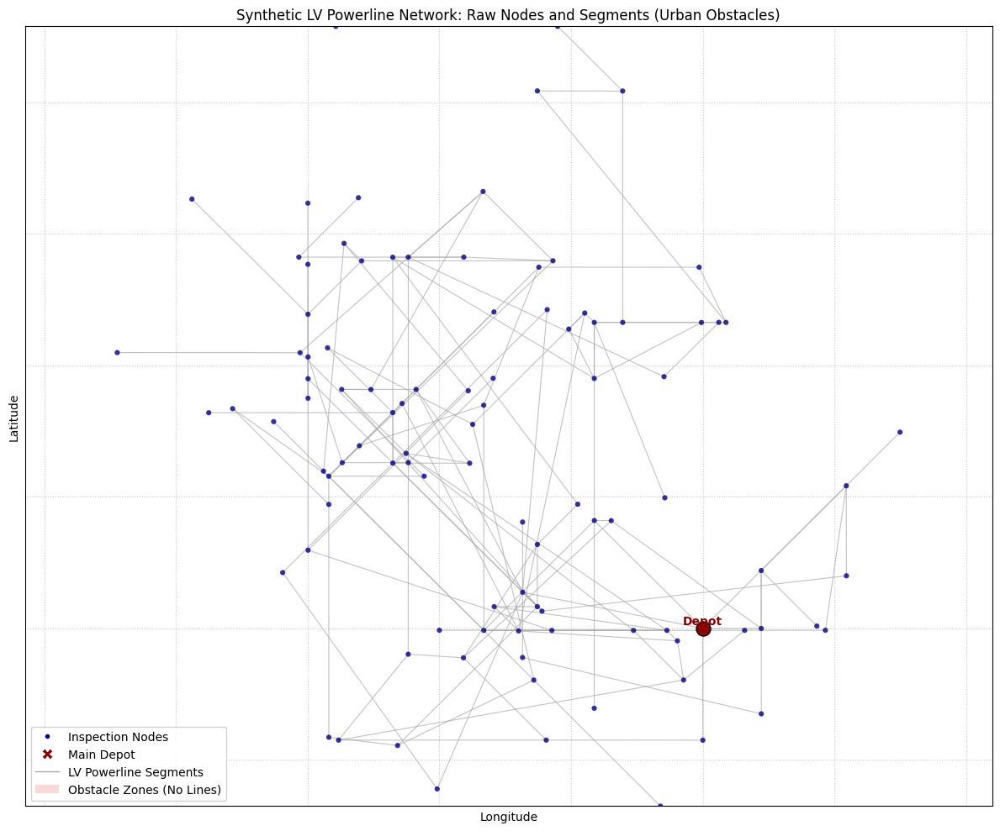

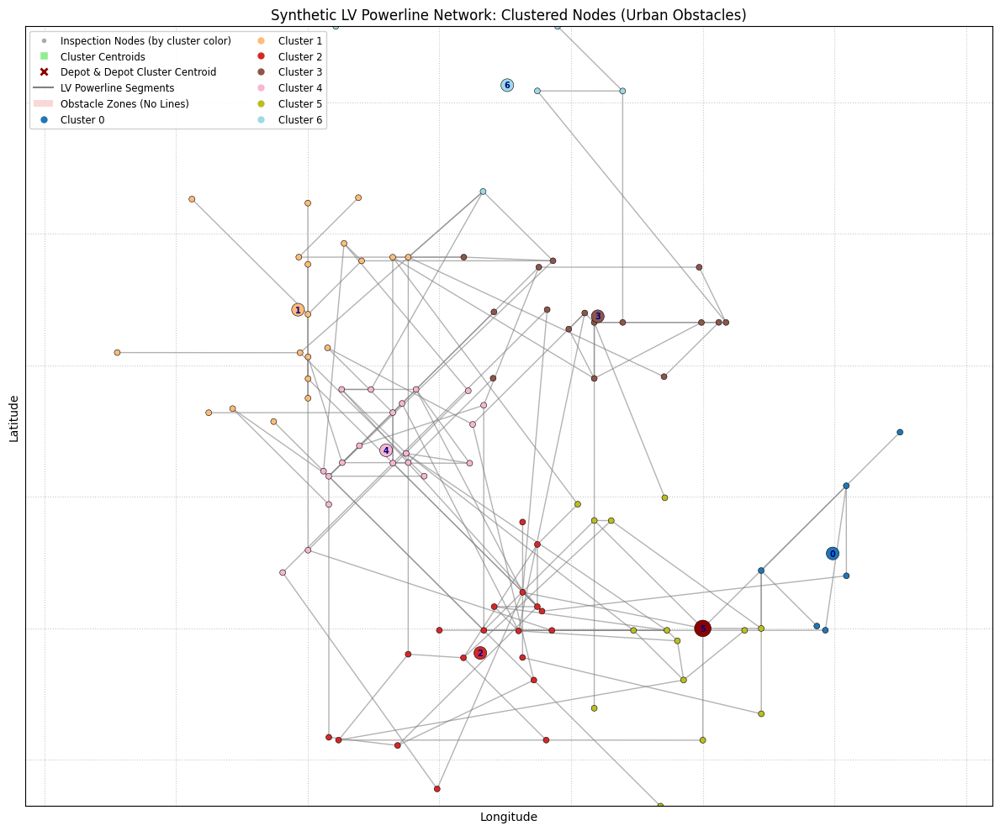

/tmp/ipython-input-36-1984467913.py:1023: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  uav_path_colors = plt.cm.get_cmap('Dark2', Q_UAVS)


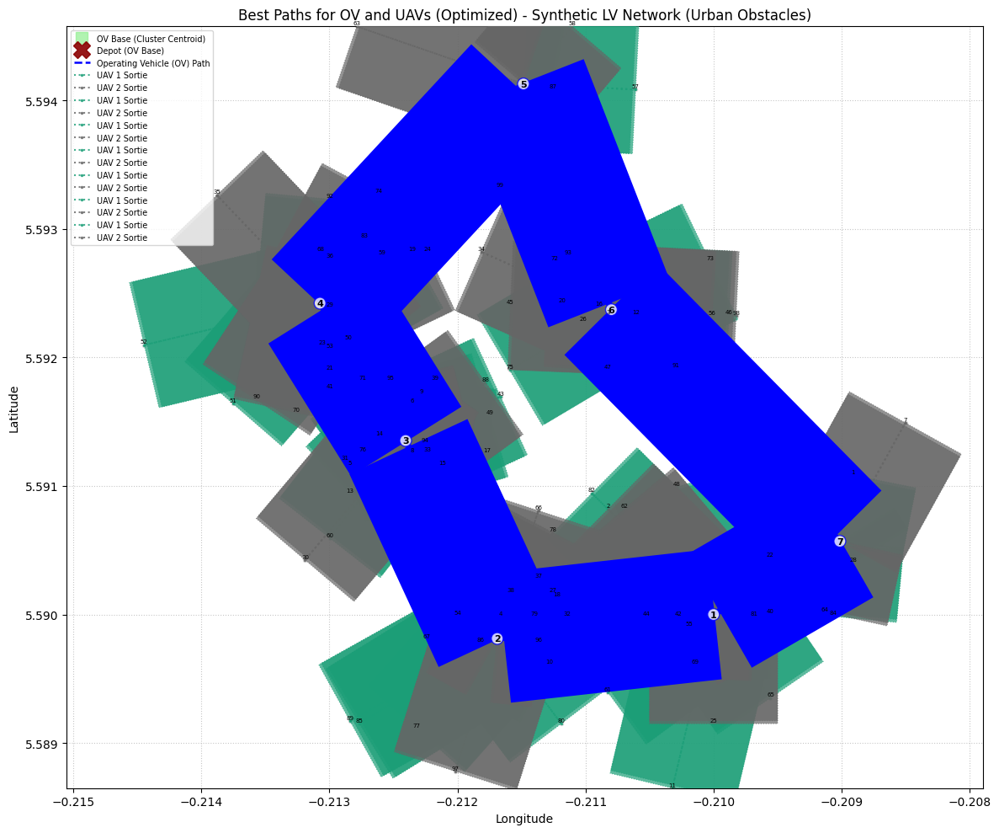


--- Coverage Analysis ---
Total Inspectable Nodes: 100
Nodes Visited by UAVs: 100
Node Coverage: 100.00%
Total Generated LV Edges: 148
Edges with Both Endpoints Visited by UAVs: 148
Edge Coverage: 100.00%

--- Optimal Path Details ---

OV Best Path Order (Cluster IDs):
DEPOT(5) -> C2 -> C4 -> C1 -> C6 -> C3 -> C0 -> DEPOT(5)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 5 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C5 -> 48 -> OV_C5; OV_C5 -> 65 -> OV_C5; OV_C5 -> 40 -> OV_C5; OV_C5 -> 11 -> OV_C5; OV_C5 -> 69 -> OV_C5; OV_C5 -> 0 -> OV_C5; OV_C5 -> 82 -> OV_C5; OV_C5 -> 61 -> OV_C5
    UAV 1: OV_C5 -> 55 -> OV_C5; OV_C5 -> 42 -> OV_C5; OV_C5 -> 81 -> OV_C5; OV_C5 -> 2 -> OV_C5; OV_C5 -> 62 -> OV_C5; OV_C5 -> 44 -> OV_C5; OV_C5 -> 25 -> OV_C5
  Cluster 2 (OV Base at [5.5898, -0.2117]):
    UAV 0: OV_C2 -> 79 -> OV_C2; OV_C2 -> 80 -> OV_C2; OV_C2 -> 89 -> OV_C2; OV_C2 -> 85 -> OV_C2; OV_C2 -> 77 -> OV_C2; OV_C2 -> 67 -> OV_C2; OV_C2 -> 27 -> OV_

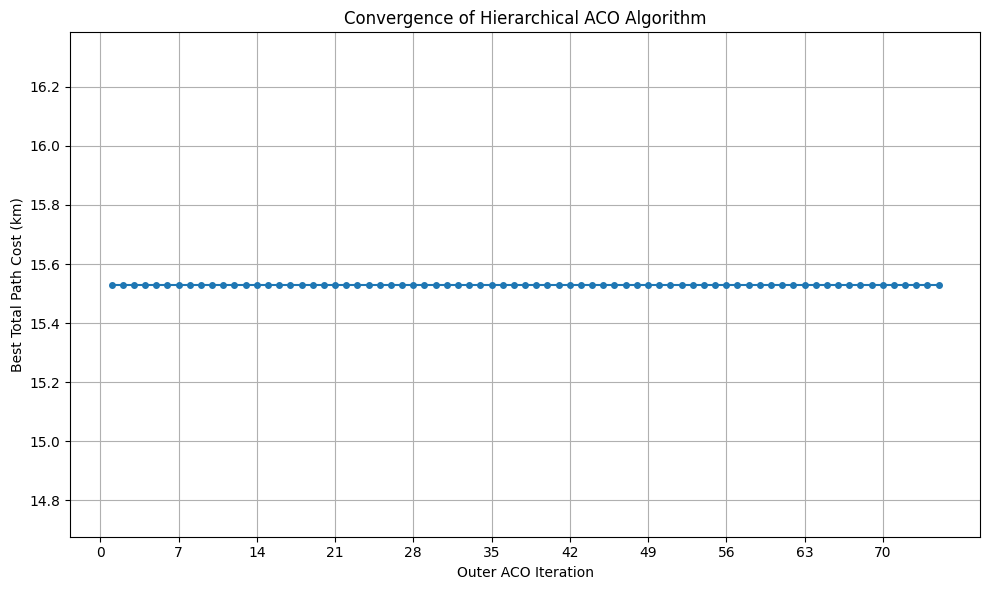

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time

# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    """
    num_nodes = len(aco_nodes)
    # Create a mapping from node ID to its 0-indexed position in aco_nodes list
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    # Add nodes to the NetworkX graph using their original IDs
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    # Add edges with 'distance' as weight
    for u_id, v_id, dist in aco_edges:
        # Ensure nodes exist in the graph before adding edge
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist) # NetworkX uses 'weight' for edge costs

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    # Use all_pairs_dijkstra_path_length for robust shortest path calculation
    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight') # Specify weight

    # Convert generator to dictionary for easier lookup. This can be memory intensive for very large graphs.
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    # Initialize distance matrix with infinity for unreachable pairs and 0 for self-loops
    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    # Populate the numpy matrix from NetworkX results
    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            # For undirected graphs, distances are symmetric
            uav_distances[v_idx, u_idx] = dist

    # Handle truly disconnected components by assigning a high penalty for "flying" directly
    # This scenario occurs if the generated powerline network itself has isolated nodes/sub-networks.
    PENALTY_FACTOR = 5.0 # Penalty factor for direct air travel vs. on-network travel (e.g., 5x more "costly")
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf: # If still unreachable via graph edges
                # Calculate direct Haversine distance as a base for penalty
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                # Assign a large penalized distance. Ensure it's not zero if actual distance is zero.
                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR # Assign a very small non-zero value
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                # Ensure symmetry for penalized distances too
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances


# --- UPDATED for LV: Generate Realistic LV Powerline Network (c16.png style) ---
# Define a smaller spatial region for an LV network (e.g., a neighborhood)
ACCRA_LAT_RANGE = 0.02 # Approx 2.2km for a neighborhood
ACCRA_LON_RANGE = 0.02 # Approx 2.2km for a neighborhood

DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Central Accra depot (retained)

ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2

# Realistic LV powerline segment lengths (10m to 200m)
MIN_LV_SEGMENT_KM = 0.01  # 10 meters
MAX_LV_SEGMENT_KM = 0.20  # 200 meters

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=8, obstacle_zone_size_factor=0.18, meshing_prob=0.01):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    The network growth is primarily linear/branching with strict obstacle avoidance, and minimal meshing.
    Designed to mimic the sparse, linear look of c16.png with LV segment lengths.

    Args:
        num_nodes (int): The total number of nodes to generate.
        num_obstacle_zones (int): Number of rectangular zones where nodes/edges are forbidden.
        obstacle_zone_size_factor (float): Relative size of obstacle zones.
        meshing_prob (float): Base probability for attempting to create additional mesh connections.
                              Very low for a more linear/tree-like structure (as in c16.png).

    Returns:
        tuple: (nodes, depot_id, edges, bbox, obstacle_zones_data)
    """
    nodes = []
    edges = []
    current_node_id = 0

    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX

    # Add the depot node
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1

    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []

    # --- Define Obstacle Zones (randomly placed, non-overlapping with depot) ---
    obstacle_zones = []
    depot_zone_buffer = 0.002 # A small buffer around depot to avoid placing obstacles too close

    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)

        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon

            # Check for overlap with depot (and a small buffer around it)
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break # Zone successfully placed
            attempts += 1


    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False

    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        # Check multiple points along the edge, not just midpoint
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False

    # Store nodes that can be expanded from
    expandable_nodes = [depot_node_id]

    # Define angles for growth, favoring cardinal/diagonal for a slightly structured feel
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]

    # Small jitter for a more natural, less perfectly straight appearance
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001

    # --- Iterative Node Generation and Connection (Linear Growth with Obstacle Avoidance) ---
    global_attempts = 0
    max_global_attempts = num_nodes * 500 # Many attempts for denser LV networks

    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1

        if not expandable_nodes:
            # If active expandable nodes run out, try a random node.
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            # Prioritize expanding from a random active node
            from_node_id = random.choice(expandable_nodes) # Use random.choice to allow reuse

            # Remove node from expandable_nodes if it has generated enough branches
            # This helps in preventing over-branching from a single point too early.
            # Example: After 3 successful connections, remove it.
            # (Optional, depending on desired density)
            # if len([e for e in edges if e[0] == from_node_id or e[1] == from_node_id]) >= 3:
            #     expandable_nodes.remove(from_node_id) # This can be slow for large lists. Better to use a counter or set.

        if from_node_id >= len(nodes): continue # Ensure from_node_id is valid index

        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']

        # Try to extend primarily in 1 direction, with a small chance for a branch
        num_branches_attempt = 1
        if random.random() < 0.2: # Smaller chance to create a second branch for sparser look
            num_branches_attempt = 2

        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))

        if random.random() < 0.02: # Even smaller chance for a purely random angle
            chosen_angles.append(random.uniform(0, 2*np.pi))

        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break

            # Segment length tailored for LV
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)

            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))

            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset

            # Apply jitter
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            # --- Strict Obstacle Zone Check ---
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue

            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)

            # Check if too close to an existing node (prevent clumping)
            is_too_close = False
            for existing_node in nodes:
                # Use a slightly smaller tolerance than min segment length
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue

            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                # If segment could not be added, ensure the 'from_node_id' remains expandable
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)


    # --- Add Meshing Connections (Very Low Probability and Strict Obstacle Avoidance) ---
    # Create a graph to check for existing connections and prevent multi-edges
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)

    # Use the meshing_prob from function arguments (set to 0.01 for c16.png style)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue

            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])

            # Allow mesh connections within a slightly larger range, still adhering to LV scale
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)

    # Re-index nodes and edges to ensure IDs are contiguous from 0
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}

    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)

    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph

    # Remove duplicate edges and ensure unique (u,v) pairs
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))

    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0

    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))

    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    # The 'virtual depot' for UAVs is the cluster centroid (OV location)
    # This node is conceptually at index 0 for local calculations within the cluster ACO
    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster

    # Mapping from original node ID (from all_nodes_global) to its local index within 'local_nodes'
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}

    # Mapping from global node ID to its global index (for looking up in uav_distances_all)
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    # Populate local_uav_distances matrix.
    # Distances between real nodes (not virtual depot) are taken from precomputed global matrix.
    # Distances to/from virtual depot are direct Haversine.
    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            # If either node is the virtual depot (index 0 in local_nodes)
            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else: # Between two actual inspection nodes within the cluster
                # Use precomputed global shortest distances from uav_distances_all
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   # This should not happen if all_nodes_global and nodes_in_cluster are consistent
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    # Initialize pheromones and heuristics for UAVs within this cluster
    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {} # Stores original IDs for routes

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)} # Routes for each UAV (original IDs)

        # Nodes that still need to be inspected in this cluster (local indices)
        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx) # Randomize order for this ant's iteration

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        # Debugging: Print cluster and UAV range details at the start of inner ACO loop
        # if iter_uav == 0:
        #     print(f"\n  --- Debugging Cluster {cluster_id} (Nodes: {len(nodes_in_cluster)}, UAV Range: {uav_range:.2f}km) ---")
        #     print(f"  OV Base at: ({depot_coords['lat']:.4f}, {depot_coords['lon']:.4f})")
        #     if not nodes_in_cluster:
        #         print("  No nodes in this cluster.")
        #     else:
        #         print("  Nodes to inspect (original IDs):", [node['id'] for node in nodes_in_cluster])


        for node_local_idx in nodes_to_inspect_local_idx:
            # Cost for this single sortie: Depot -> Node -> Depot
            try: # Defensive check for potential inf distances
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError: # This handles cases where local_uav_distances might not be square or valid
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                # This node is reachable. Assign it to one of the UAVs.
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}" # Identifier for the OV in the route
                target_original_id = local_nodes[node_local_idx]['id']

                # Append the full round trip: OV_ID -> TARGET_NODE_ID -> OV_ID
                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1
            # else:
                # print(f"      Node {local_nodes[node_local_idx]['id']} Sortie Cost {sortie_cost:.4f}km > UAV Range {uav_range:.4f}km. Not assigned.")


        # An ant's tour is only valid if all nodes in the cluster were successfully assigned
        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
                # print(f"  New best cluster cost for Cluster {cluster_id}: {best_cluster_uav_cost:.2f} km")
        else:
            ant_current_total_uav_cost = float('inf') # Mark as invalid tour

        # Pheromone Update
        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            # Only update pheromones for successful routes
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3): # Iterate over (OV->Node->OV) segments
                    if i + 1 < len(q_route_original_ids):
                        # 'u_local' is always 0 (virtual depot)
                        # 'v_local' is the target inspection node's local index
                        v_original_id = q_route_original_ids[i+1] # Get target node's original ID
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            # Deposit pheromone on the path between virtual depot (0) and target node (v_local)
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add # Symmetric update for return path

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        # If no valid solution found, return 0 cost if no nodes in cluster, else inf
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}


    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    # If no more clusters to visit, but not all were visited, this path is incomplete.
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            # If not all clusters were visited, this ant's OV path is incomplete and thus infeasible
            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx) # Complete the tour by returning to depot

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            # Evaluate UAV paths for each cluster in this OV tour
            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]: # Iterate through unique clusters in the path (excluding final depot return)
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_for_aco['centroids'][cluster_id]

                    # Call Inner ACO
                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords # Pass all_nodes_coords (global)
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf') # If any cluster is infeasible, whole tour is
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf') # Default to infeasible
            if ant_tour_total_uav_cost != float('inf'): # Only if all inner ACOs were feasible
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            # Update best solution found so far
            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        # Pheromone update for Outer ACO
        pheromones_ov *= (1 - rho_ov) # Evaporation

        if ant_total_costs: # Only deposit if there were any valid tours generated by ants
            # Find the best ant in this iteration to deposit pheromone (elitist update for iteration)
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add # Symmetric

        convergence_data.append(best_total_cost) # Append best_total_cost for the current iteration here

    # Map best path indices back to original cluster IDs
    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data

# --- Main Experiment Parameters ---
N_NODES = 100 # Number of synthetic nodes to generate (tuned for LV density)
M_CLUSTERS = 7 # Number of clusters
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 5.0 # Set to 5.0 km as requested

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50, # Increased iterations for inner ACO
    'n_ants_uav': 6, # Increased ants for inner ACO
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0, # Slightly increased deposit
    'tau0_uav': 1.0
}

# --- 1. Generate Realistic Synthetic LV Data ---
print("Generating realistic Low-Voltage powerline nodes and segments (c16.png style)...")
# Call the LV-specific generation function
all_nodes, depot_actual_node_id, generated_lv_edges, bbox_coords, obstacle_zones_data = \
    generate_lv_powerline_network(N_NODES, num_obstacle_zones=8, obstacle_zone_size_factor=0.18, meshing_prob=0.01)

# Display generated network details
print(f"\n--- Generated Network Details ---")
print(f"Number of Extracted Nodes (Inspection Points): {len(all_nodes)}")
print(f"Number of Generated LV Powerline Segments (Edges): {len(generated_lv_edges)}")
print(f"Geographical Bounding Box of Generated Network:")
print(f"  Latitude: [{bbox_coords[0]:.4f}°N, {bbox_coords[1]:.4f}°N]")
print(f"  Longitude: [{bbox_coords[2]:.4f}°E, {bbox_coords[3]:.4f}°E]")


print("\nBuilding UAV distances matrix using NetworkX (shortest paths along generated edges or penalized direct flight)...")
# Use the function that computes shortest paths along the `generated_lv_edges`
uav_distances_matrix = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_lv_edges)
print("UAV distances matrix built.")


# --- 2. Perform K-Means Clustering ---
print(f"\nPerforming K-means clustering for {M_CLUSTERS} clusters...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of nodes ({len(all_nodes)}) is less than number of clusters requested ({M_CLUSTERS}). Setting M_CLUSTERS to number of nodes.")
    M_CLUSTERS = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes extracted. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label # Update original all_nodes with cluster_id
    clusters_data[label].append(all_nodes[i])

cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

# Ensure the cluster containing the actual depot node is treated as THE depot cluster
depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
depot_cluster_id = depot_node_obj['cluster_id']

# Set the depot cluster's centroid to the exact ECG depot location for consistency
cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}" # Assign a string ID to depot centroid for plotting


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}

# --- 3. Run Hierarchical ACO ---
print("\nRunning Hierarchical ACO algorithm...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id, # Pass the ID of the chosen depot cluster
    all_clusters_for_aco,
    all_nodes, # Pass all_nodes for global_id_to_global_idx map in inner ACO
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM, # Pass the updated R_UAV_KM
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- Optimization Complete ---")
print(f"Total Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- 4. Visualization using NetworkX and Matplotlib ---
print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# Prepare data for networkx plotting
plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}" # Use a unique string ID for the depot centroid for plotting
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id) # Label with cluster ID
    centroid_plot_ids_map[c_id] = plot_id

# Create a color map for clusters
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes} # Build pos here

    # Add generated edges
    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Plot obstacle zones (as red rectangles)
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    # Draw all nodes as small gray dots
    # Ensure nodelist is explicitly G.nodes() to avoid implicit issues
    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    # Draw all generated powerline segments
    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    # Highlight depot node
    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos: # Ensure depot node is in pos
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']], # Explicitly define nodelist for depot
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold') # Reduced offset

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    # Add the generated LV powerline edges (these are the actual network structure)
    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    # Plot obstacle zones (as red rectangles)
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    # Node coloring and sizing
    node_colors_list = []
    node_sizes_list = []

    # Get the valid node IDs from plot_nodes_coords to ensure consistency
    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int): # Actual inspection nodes
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray') # Fallback color
                node_sizes_list.append(0) # Hide
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray') # Fallback color
            node_sizes_list.append(25) # Smaller size for individual nodes

            # If it's the depot itself, give it a distinct color/size
            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else: # Centroid nodes (string IDs like 'C0', 'DepotC1')
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred') # Matches actual depot color
                node_sizes_list.append(200) # Larger for Depot Centroid
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120) # Size for other Centroids

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    # Draw labels for centroids (only once per unique centroid)
    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    # Draw generated LV powerline edges (the actual network grid)
    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title("Synthetic LV Powerline Network: Clustered Nodes (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Custom legend for clustered nodes and network components
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    # Add an example for cluster colors
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))

    # Plot obstacle zones (as red rectangles)
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    # Plot all original nodes as background reference
    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int): # Only plot actual inspection nodes
            plt.plot(lon, lat, 'o', markersize=3, color='lightgray', alpha=0.6)

    # Plot cluster centroids as background and label them
    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            plt.plot(centroid['lon'], centroid['lat'], 'X', markersize=14, color='darkred', alpha=0.9, label='Depot (OV Base)')
            plt.text(centroid['lon'], centroid['lat'] + 0.000003, f"Depot C{c_id}", fontsize=9, ha='center', va='bottom', color='darkred', fontweight='bold')
        else:
            plt.plot(centroid['lon'], centroid['lat'], 's', markersize=10, color='lightgreen', alpha=0.7, label='OV Base (Cluster Centroid)' if c_id == list(cluster_centroids.keys())[0] else "")
            plt.text(centroid['lon'], centroid['lat'] + 0.000003, f"C{c_id}", fontsize=8, ha='center', va='bottom', color='darkgreen')

    # OV Path in Blue with arrows and numbered stops
    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        plt.arrow(x1, y1, x2 - x1, y2 - y1,
                  head_width=0.00004, length_includes_head=True, color='blue', linewidth=1.8, zorder=5)
    plt.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
              'b--', linewidth=1.8, label='Operating Vehicle (OV) Path', zorder=4)

    # Add numbered markers for OV path order at centroids
    for i in range(len(best_ov_path_ids) - 1): # Exclude final depot return for numbering
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        plt.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1), # Corrected line
                 color='black', fontsize=8, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='blue', boxstyle='circle,pad=0.18', alpha=0.8),
                 zorder=6)

    # UAV paths
    uav_path_colors = plt.cm.get_cmap('Dark2', Q_UAVS)
    uav_labels_added = set()
    all_visited_nodes_by_uavs = set() # To track for node coverage

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            # In 'one tower per sortie', route_nodes_ids is like [OV_C, Node1, OV_C, Node2, OV_C, ...]
            # Iterate through these 3-element sorties
            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids): # Ensure a full [OV_C, Node, OV_C] sortie
                    # Start at centroid, go to node, return to centroid
                    start_node_id = route_nodes_ids[i] # This is 'OV_C...'
                    target_node_id = route_nodes_ids[i+1] # This is the actual node ID
                    end_node_id = route_nodes_ids[i+2] # This is 'OV_C...'

                    uav_sortie_coords = []
                    # Start from OV (centroid)
                    uav_sortie_coords.append((cluster_centroid_loc['lon'], cluster_centroid_loc['lat']))

                    # Go to target node
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)
                    if node_data and target_node_id in plot_nodes_coords: # Check if node_data exists AND is in plot_nodes_coords
                        uav_sortie_coords.append(plot_nodes_coords.get(target_node_id))
                        all_visited_nodes_by_uavs.add(target_node_id) # Add to set for coverage calculation
                    else:
                        uav_sortie_coords.append(uav_sortie_coords[-1])
                        continue

                    # Return to OV (centroid)
                    uav_sortie_coords.append((cluster_centroid_loc['lon'], cluster_centroid_loc['lat']))

                    color_idx = uav_q % Q_UAVS # Ensure index is within colormap range
                    color_for_uav = uav_path_colors(color_idx)

                    # Plot the individual sortie path segments
                    for j in range(len(uav_sortie_coords) - 1):
                        x1, y1 = uav_sortie_coords[j]
                        x2, y2 = uav_sortie_coords[j+1]
                        plt.arrow(x1, y1, x2 - x1, y2 - y1,
                                  head_width=0.000015, length_includes_head=True, color=color_for_uav,
                                  linewidth=0.8, linestyle=':', alpha=0.7, zorder=3)

                    label = f'UAV {uav_q+1} Sortie' if (uav_q not in uav_labels_added or i==0) else "_nolegend_"
                    plt.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                              linestyle=':', marker='o', markersize=1.5, color=color_for_uav, label=label, zorder=2, alpha=0.8)
                    uav_labels_added.add(uav_q)

                    # Label visited node
                    if node_data and target_node_id != depot_actual_node_id and target_node_id in plot_nodes_coords:
                        plt.text(node_data['lon'], node_data['lat'] + 0.000008, f"{target_node_id}", fontsize=5, color='black', ha='center', va='bottom', zorder=7)


    plt.legend(loc='upper left', fontsize='x-small')
    plt.title("Best Paths for OV and UAVs (Optimized) - Synthetic LV Network (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("optimized_paths_ov_uav_synthetic_lv.png")
    plt.show()

    # --- Compute and Display Coverage Metrics ---
    total_inspectable_nodes = len(all_nodes)
    node_coverage_percentage = (len(all_visited_nodes_by_uavs) / total_inspectable_nodes) * 100 if total_inspectable_nodes > 0 else 0

    # Edge Coverage: An edge is covered if both its endpoints are among the visited nodes.
    covered_edges_count = 0
    unique_generated_edges_set = set()
    for u, v, _ in generated_lv_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_generated_edges_set:
            unique_generated_edges_set.add(edge_key)
            if u in all_visited_nodes_by_uavs and v in all_visited_nodes_by_uavs:
                covered_edges_count += 1

    total_generated_edges = len(unique_generated_edges_set)
    edge_coverage_percentage = (covered_edges_count / total_generated_edges) * 100 if total_generated_edges > 0 else 0

    print(f"\n--- Coverage Analysis ---")
    print(f"Total Inspectable Nodes: {total_inspectable_nodes}")
    print(f"Nodes Visited by UAVs: {len(all_visited_nodes_by_uavs)}")
    print(f"Node Coverage: {node_coverage_percentage:.2f}%")
    print(f"Total Generated LV Edges: {total_generated_edges}")
    print(f"Edges with Both Endpoints Visited by UAVs: {covered_edges_count}")
    print(f"Edge Coverage: {edge_coverage_percentage:.2f}%")


# --- Main execution flow for Synthetic LV Data ---
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- Run the visualizations ---
# 1. Plot raw network (before clustering)
plot_raw_powerline_network(all_nodes, generated_lv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data)


# 2. Plot clustered network
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data)

# 3. Plot best paths after ACO
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            # Reconstruct the string for display, showing each sortie clearly
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids): # Ensure there's a target node
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
plt.plot(range(1, OV_ACO_PARAMS['iters_ov'] + 1), convergence_history, marker='o', linestyle='-', markersize=4)
plt.title('Convergence of Hierarchical ACO Algorithm')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
plt.xticks(np.arange(0, OV_ACO_PARAMS['iters_ov'] + 1, max(1, OV_ACO_PARAMS['iters_ov'] // 10)))
plt.tight_layout()
plt.savefig("aco_convergence_plot_synthetic_lv.png")
print("Convergence plot saved to aco_convergence_plot_synthetic_lv.png")
plt.show()

Generating realistic Low-Voltage powerline nodes and segments (c16.png style)...

--- Generated Network Details ---
Number of Extracted Nodes (Inspection Points): 100
Number of Generated LV Powerline Segments (Edges): 163
Geographical Bounding Box of Generated Network:
  Latitude: [5.5863°N, 5.5925°N]
  Longitude: [-0.2135°E, -0.2070°E]

Building UAV distances matrix using NetworkX (shortest paths along generated edges or penalized direct flight)...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.06 seconds.
UAV distances matrix built.

Performing K-means clustering for 7 clusters...

Running Hierarchical ACO algorithm...


/tmp/ipython-input-38-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-38-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-38-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-38-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-38-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-38-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)



--- Optimization Complete ---
Total Runtime: 14.01 seconds
Best Total Path Cost: 18.04 km

--- Visualizing Results with NetworkX and Matplotlib ---


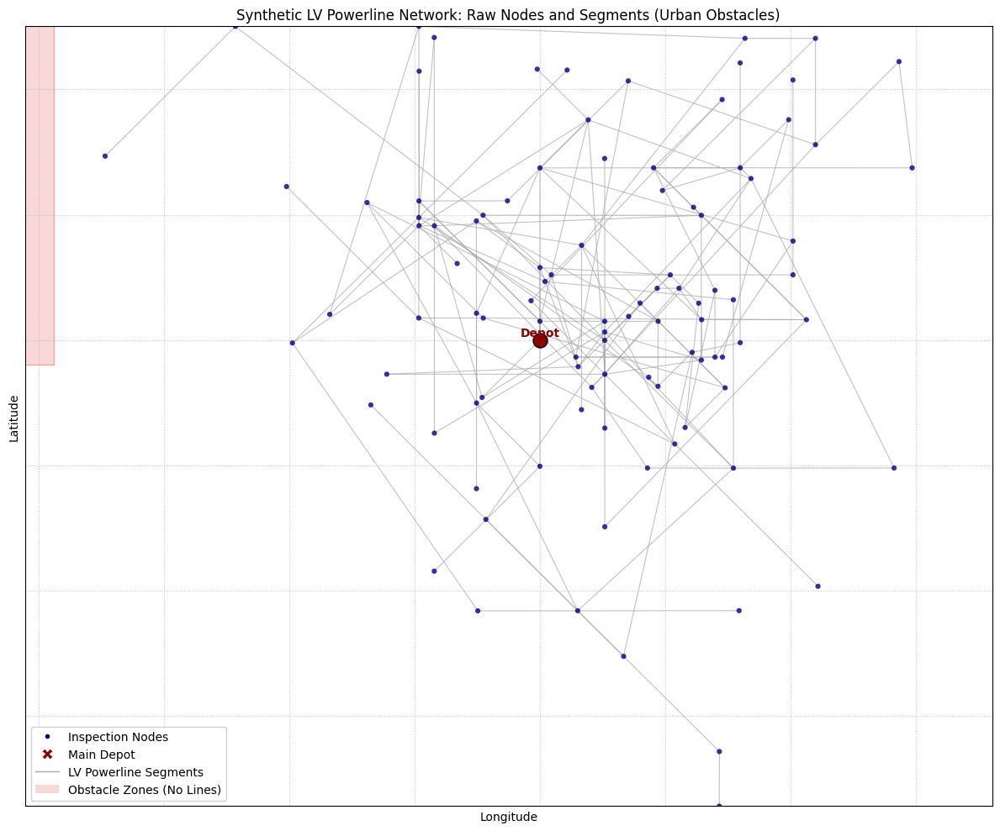

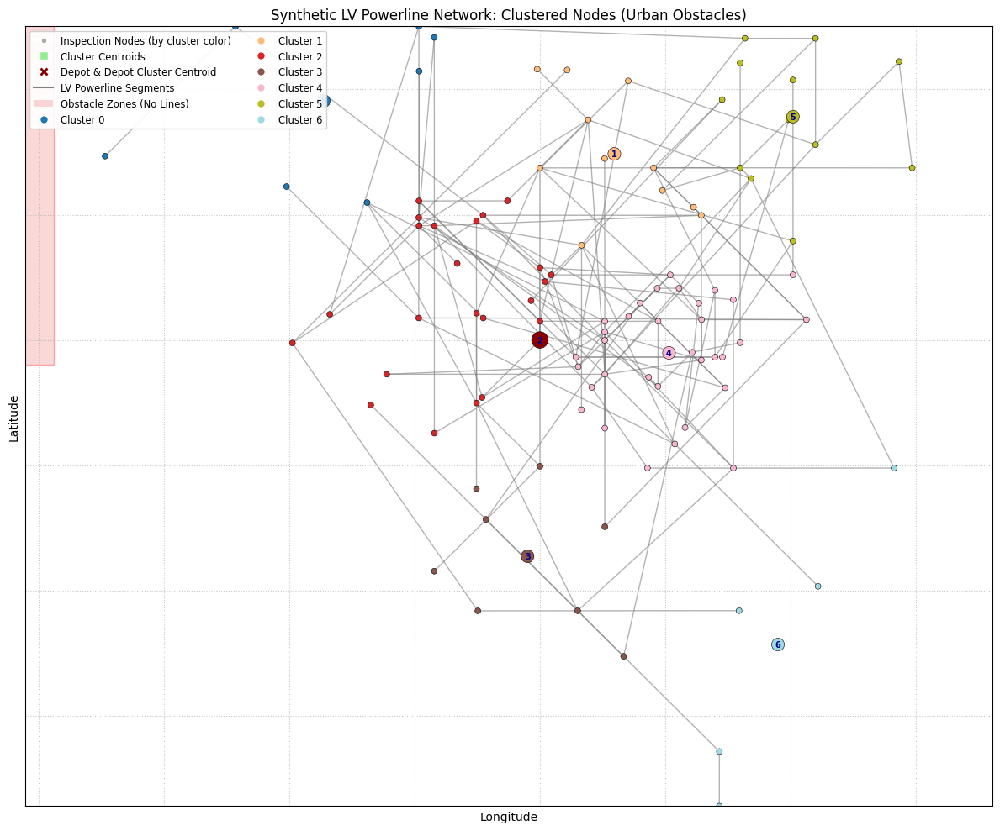

/tmp/ipython-input-38-4257490464.py:1059: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  uav_path_colors = plt.cm.get_cmap('Paired', Q_UAVS) # Or 'Set2', 'Dark2', 'tab10'


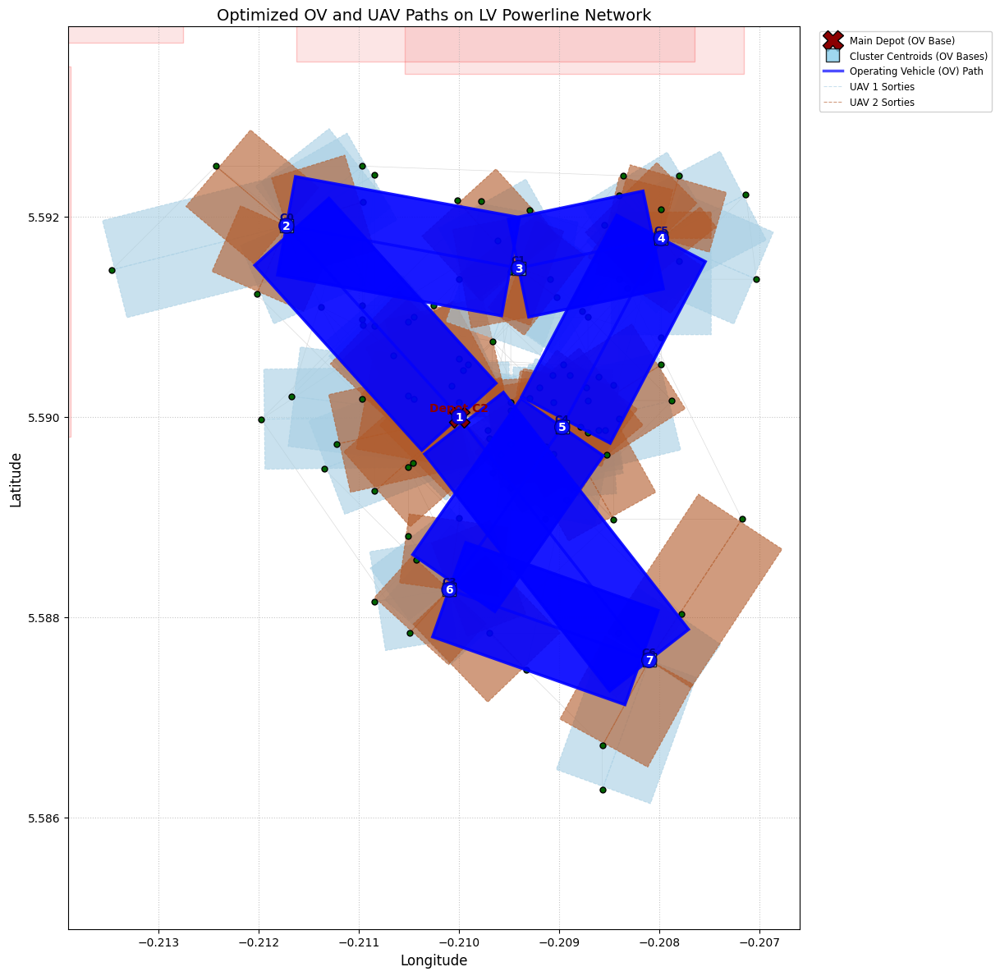


--- Optimal Path Details ---

OV Best Path Order (Cluster IDs):
DEPOT(2) -> C0 -> C1 -> C5 -> C4 -> C3 -> C6 -> DEPOT(2)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 2 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C2 -> 3 -> OV_C2; OV_C2 -> 78 -> OV_C2; OV_C2 -> 71 -> OV_C2; OV_C2 -> 86 -> OV_C2; OV_C2 -> 65 -> OV_C2; OV_C2 -> 20 -> OV_C2; OV_C2 -> 46 -> OV_C2; OV_C2 -> 73 -> OV_C2; OV_C2 -> 17 -> OV_C2; OV_C2 -> 97 -> OV_C2; OV_C2 -> 45 -> OV_C2; OV_C2 -> 48 -> OV_C2
    UAV 1: OV_C2 -> 15 -> OV_C2; OV_C2 -> 63 -> OV_C2; OV_C2 -> 0 -> OV_C2; OV_C2 -> 47 -> OV_C2; OV_C2 -> 23 -> OV_C2; OV_C2 -> 79 -> OV_C2; OV_C2 -> 28 -> OV_C2; OV_C2 -> 55 -> OV_C2; OV_C2 -> 41 -> OV_C2; OV_C2 -> 1 -> OV_C2; OV_C2 -> 70 -> OV_C2; OV_C2 -> 24 -> OV_C2
  Cluster 0 (OV Base at [5.5919, -0.2117]):
    UAV 0: OV_C0 -> 54 -> OV_C0; OV_C0 -> 90 -> OV_C0; OV_C0 -> 94 -> OV_C0; OV_C0 -> 29 -> OV_C0
    UAV 1: OV_C0 -> 84 -> OV_C0; OV_C0 -> 74 -> OV_C0; OV_C0 -> 77 -> OV

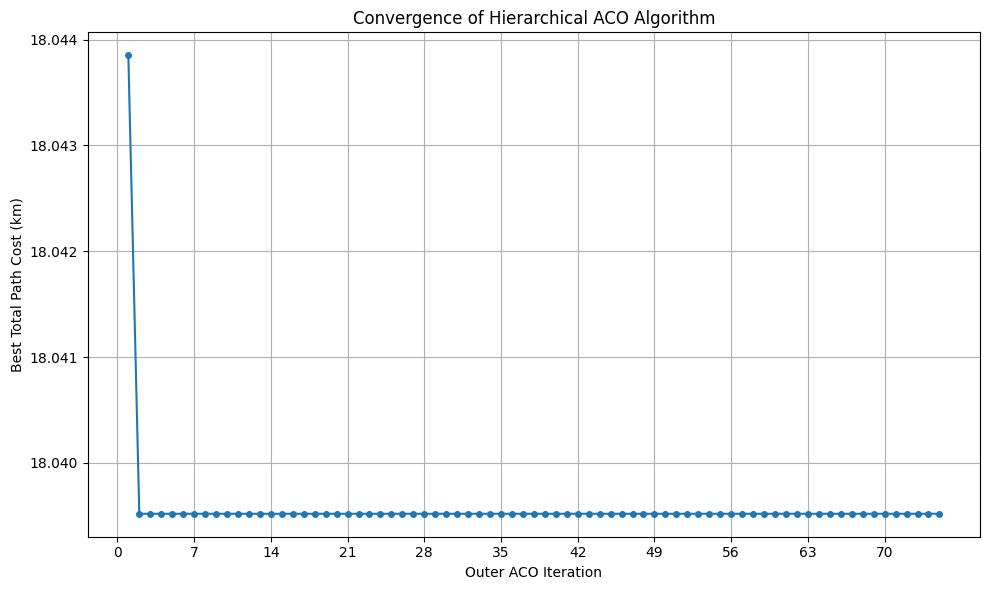

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time

# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    """
    num_nodes = len(aco_nodes)
    # Create a mapping from node ID to its 0-indexed position in aco_nodes list
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    # Add nodes to the NetworkX graph using their original IDs
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    # Add edges with 'distance' as weight
    for u_id, v_id, dist in aco_edges:
        # Ensure nodes exist in the graph before adding edge
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist) # NetworkX uses 'weight' for edge costs

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    # Use all_pairs_dijkstra_path_length for robust shortest path calculation
    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight') # Specify weight

    # Convert generator to dictionary for easier lookup. This can be memory intensive for very large graphs.
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    # Initialize distance matrix with infinity for unreachable pairs and 0 for self-loops
    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    # Populate the numpy matrix from NetworkX results
    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            # For undirected graphs, distances are symmetric
            uav_distances[v_idx, u_idx] = dist

    # Handle truly disconnected components by assigning a high penalty for "flying" directly
    # This scenario occurs if the generated powerline network itself has isolated nodes/sub-networks.
    PENALTY_FACTOR = 5.0 # Penalty factor for direct air travel vs. on-network travel (e.g., 5x more "costly")
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf: # If still unreachable via graph edges
                # Calculate direct Haversine distance as a base for penalty
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                # Assign a large penalized distance. Ensure it's not zero if actual distance is zero.
                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR # Assign a very small non-zero value
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                # Ensure symmetry for penalized distances too
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances


# --- UPDATED for LV: Generate Realistic LV Powerline Network (c16.png style) ---
# Define a smaller spatial region for an LV network (e.g., a neighborhood)
ACCRA_LAT_RANGE = 0.02 # Approx 2.2km for a neighborhood
ACCRA_LON_RANGE = 0.02 # Approx 2.2km for a neighborhood

DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Central Accra depot (retained)

ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2

# Realistic LV powerline segment lengths (10m to 200m)
MIN_LV_SEGMENT_KM = 0.01  # 10 meters
MAX_LV_SEGMENT_KM = 0.20  # 200 meters

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=8, obstacle_zone_size_factor=0.18, meshing_prob=0.01):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    The network growth is primarily linear/branching with strict obstacle avoidance, and minimal meshing.
    Designed to mimic the sparse, linear look of c16.png with LV segment lengths.

    Args:
        num_nodes (int): The total number of nodes to generate.
        num_obstacle_zones (int): Number of rectangular zones where nodes/edges are forbidden.
        obstacle_zone_size_factor (float): Relative size of obstacle zones.
        meshing_prob (float): Base probability for attempting to create additional mesh connections.
                              Very low for a more linear/tree-like structure (as in c16.png).

    Returns:
        tuple: (nodes, depot_id, edges, bbox, obstacle_zones_data)
    """
    nodes = []
    edges = []
    current_node_id = 0

    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX

    # Add the depot node
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1

    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []

    # --- Define Obstacle Zones (randomly placed, non-overlapping with depot) ---
    obstacle_zones = []
    depot_zone_buffer = 0.002 # A small buffer around depot to avoid placing obstacles too close

    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)

        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon

            # Check for overlap with depot (and a small buffer around it)
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break # Zone successfully placed
            attempts += 1


    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False

    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        # Check multiple points along the edge, not just midpoint
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False

    # Store nodes that can be expanded from
    expandable_nodes = [depot_node_id]

    # Define angles for growth, favoring cardinal/diagonal for a slightly structured feel
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]

    # Small jitter for a more natural, less perfectly straight appearance
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001

    # --- Iterative Node Generation and Connection (Linear Growth with Obstacle Avoidance) ---
    global_attempts = 0
    max_global_attempts = num_nodes * 500 # Many attempts for denser LV networks

    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1

        if not expandable_nodes:
            # If active expandable nodes run out, try a random node.
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            # Prioritize expanding from a random active node
            from_node_id = random.choice(expandable_nodes) # Use random.choice to allow reuse

            # Remove node from expandable_nodes if it has generated enough branches
            # This helps in preventing over-branching from a single point too early.
            # Example: After 3 successful connections, remove it.
            # (Optional, depending on desired density)
            # if len([e for e in edges if e[0] == from_node_id or e[1] == from_node_id]) >= 3:
            #     expandable_nodes.remove(from_node_id) # This can be slow for large lists. Better to use a counter or set.

        if from_node_id >= len(nodes): continue # Ensure from_node_id is valid index

        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']

        # Try to extend primarily in 1 direction, with a small chance for a branch
        num_branches_attempt = 1
        if random.random() < 0.2: # Smaller chance to create a second branch for sparser look
            num_branches_attempt = 2

        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))

        if random.random() < 0.02: # Even smaller chance for a purely random angle
            chosen_angles.append(random.uniform(0, 2*np.pi))

        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break

            # Segment length tailored for LV
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)

            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))

            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset

            # Apply jitter
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            # --- Strict Obstacle Zone Check ---
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue

            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)

            # Check if too close to an existing node (prevent clumping)
            is_too_close = False
            for existing_node in nodes:
                # Use a slightly smaller tolerance than min segment length
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue

            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                # If segment could not be added, ensure the 'from_node_id' remains expandable
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)


    # --- Add Meshing Connections (Very Low Probability and Strict Obstacle Avoidance) ---
    # Create a graph to check for existing connections and prevent multi-edges
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)

    # Use the meshing_prob from function arguments (set to 0.01 for c16.png style)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue

            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])

            # Allow mesh connections within a slightly larger range, still adhering to LV scale
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)

    # Re-index nodes and edges to ensure IDs are contiguous from 0
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}

    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)

    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph

    # Remove duplicate edges and ensure unique (u,v) pairs
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))

    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0

    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))

    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    # The 'virtual depot' for UAVs is the cluster centroid (OV location)
    # This node is conceptually at index 0 for local calculations within the cluster ACO
    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster

    # Mapping from original node ID (from all_nodes_global) to its local index within 'local_nodes'
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}

    # Mapping from global node ID to its global index (for looking up in uav_distances_all)
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    # Populate local_uav_distances matrix.
    # Distances between real nodes (not virtual depot) are taken from precomputed global matrix.
    # Distances to/from virtual depot are direct Haversine.
    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            # If either node is the virtual depot (index 0 in local_nodes)
            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else: # Between two actual inspection nodes within the cluster
                # Use precomputed global shortest distances from uav_distances_all
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   # This should not happen if all_nodes_global and nodes_in_cluster are consistent
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    # Initialize pheromones and heuristics for UAVs within this cluster
    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {} # Stores original IDs for routes

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)} # Routes for each UAV (original IDs)

        # Nodes that still need to be inspected in this cluster (local indices)
        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx) # Randomize order for this ant's iteration

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        # Debugging: Print cluster and UAV range details at the start of inner ACO loop
        # if iter_uav == 0:
        #     print(f"\n  --- Debugging Cluster {cluster_id} (Nodes: {len(nodes_in_cluster)}, UAV Range: {uav_range:.2f}km) ---")
        #     print(f"  OV Base at: ({depot_coords['lat']:.4f}, {depot_coords['lon']:.4f})")
        #     if not nodes_in_cluster:
        #         print("  No nodes in this cluster.")
        #     else:
        #         print("  Nodes to inspect (original IDs):", [node['id'] for node in nodes_in_cluster])


        for node_local_idx in nodes_to_inspect_local_idx:
            # Cost for this single sortie: Depot -> Node -> Depot
            try: # Defensive check for potential inf distances
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError: # This handles cases where local_uav_distances might not be square or valid
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                # This node is reachable. Assign it to one of the UAVs.
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}" # Identifier for the OV in the route
                target_original_id = local_nodes[node_local_idx]['id']

                # Append the full round trip: OV_ID -> TARGET_NODE_ID -> OV_ID
                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1
            # else:
                # print(f"      Node {local_nodes[node_local_idx]['id']} Sortie Cost {sortie_cost:.4f}km > UAV Range {uav_range:.4f}km. Not assigned.")


        # An ant's tour is only valid if all nodes in the cluster were successfully assigned
        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
                # print(f"  New best cluster cost for Cluster {cluster_id}: {best_cluster_uav_cost:.2f} km")
        else:
            ant_current_total_uav_cost = float('inf') # Mark as invalid tour

        # Pheromone Update
        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            # Only update pheromones for successful routes
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3): # Iterate over (OV->Node->OV) segments
                    if i + 1 < len(q_route_original_ids):
                        # 'u_local' is always 0 (virtual depot)
                        # 'v_local' is the target inspection node's local index
                        v_original_id = q_route_original_ids[i+1] # Get target node's original ID
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            # Deposit pheromone on the path between virtual depot (0) and target node (v_local)
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add # Symmetric update for return path

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        # If no valid solution found, return 0 cost if no nodes in cluster, else inf
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}


    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    # If no more clusters to visit, but not all were visited, this path is incomplete.
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            # If not all clusters were visited, this ant's OV path is incomplete and thus infeasible
            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx) # Complete the tour by returning to depot

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            # Evaluate UAV paths for each cluster in this OV tour
            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]: # Iterate through unique clusters in the path (excluding final depot return)
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_for_aco['centroids'][cluster_id]

                    # Call Inner ACO
                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords # Pass all_nodes_coords (global)
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf') # If any cluster is infeasible, whole tour is
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf') # Default to infeasible
            if ant_tour_total_uav_cost != float('inf'): # Only if all inner ACOs were feasible
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            # Update best solution found so far
            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        # Pheromone update for Outer ACO
        pheromones_ov *= (1 - rho_ov) # Evaporation

        if ant_total_costs: # Only deposit if there were any valid tours generated by ants
            # Find the best ant in this iteration to deposit pheromone (elitist update for iteration)
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add # Symmetric

        convergence_data.append(best_total_cost) # Append best_total_cost for the current iteration here

    # Map best path indices back to original cluster IDs
    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data

# --- Main Experiment Parameters ---
N_NODES = 100 # Number of synthetic nodes to generate (tuned for LV density)
M_CLUSTERS = 7 # Number of clusters
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 5.0 # Set to 5.0 km as requested

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50, # Increased iterations for inner ACO
    'n_ants_uav': 6, # Increased ants for inner ACO
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0, # Slightly increased deposit
    'tau0_uav': 1.0
}

# --- 1. Generate Realistic Synthetic LV Data ---
print("Generating realistic Low-Voltage powerline nodes and segments (c16.png style)...")
# Call the LV-specific generation function
all_nodes, depot_actual_node_id, generated_lv_edges, bbox_coords, obstacle_zones_data = \
    generate_lv_powerline_network(N_NODES, num_obstacle_zones=8, obstacle_zone_size_factor=0.18, meshing_prob=0.01)

# Display generated network details
print(f"\n--- Generated Network Details ---")
print(f"Number of Extracted Nodes (Inspection Points): {len(all_nodes)}")
print(f"Number of Generated LV Powerline Segments (Edges): {len(generated_lv_edges)}")
print(f"Geographical Bounding Box of Generated Network:")
print(f"  Latitude: [{bbox_coords[0]:.4f}°N, {bbox_coords[1]:.4f}°N]")
print(f"  Longitude: [{bbox_coords[2]:.4f}°E, {bbox_coords[3]:.4f}°E]")


print("\nBuilding UAV distances matrix using NetworkX (shortest paths along generated edges or penalized direct flight)...")
# Use the function that computes shortest paths along the `generated_lv_edges`
uav_distances_matrix = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_lv_edges)
print("UAV distances matrix built.")


# --- 2. Perform K-Means Clustering ---
print(f"\nPerforming K-means clustering for {M_CLUSTERS} clusters...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of nodes ({len(all_nodes)}) is less than number of clusters requested ({M_CLUSTERS}). Setting M_CLUSTERS to number of nodes.")
    M_CLUSTERS = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes extracted. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label # Update original all_nodes with cluster_id
    clusters_data[label].append(all_nodes[i])

cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

# Ensure the cluster containing the actual depot node is treated as THE depot cluster
depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
depot_cluster_id = depot_node_obj['cluster_id']

# Set the depot cluster's centroid to the exact ECG depot location for consistency
cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}" # Assign a string ID to depot centroid for plotting


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}

# --- 3. Run Hierarchical ACO ---
print("\nRunning Hierarchical ACO algorithm...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id, # Pass the ID of the chosen depot cluster
    all_clusters_for_aco,
    all_nodes, # Pass all_nodes for global_id_to_global_idx map in inner ACO
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM, # Pass the updated R_UAV_KM
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- Optimization Complete ---")
print(f"Total Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- 4. Visualization using NetworkX and Matplotlib ---
print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# Prepare data for networkx plotting
plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}" # Use a unique string ID for the depot centroid for plotting
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id) # Label with cluster ID
    centroid_plot_ids_map[c_id] = plot_id

# Create a color map for clusters
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes} # Build pos here

    # Add generated edges
    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Plot obstacle zones (as red rectangles)
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    # Draw all nodes as small gray dots
    # Ensure nodelist is explicitly G.nodes() to avoid implicit issues
    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    # Draw all generated powerline segments
    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    # Highlight depot node
    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos: # Ensure depot node is in pos
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']], # Explicitly define nodelist for depot
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold') # Reduced offset

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    # Add the generated LV powerline edges (these are the actual network structure)
    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    # Plot obstacle zones (as red rectangles)
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    # Node coloring and sizing
    node_colors_list = []
    node_sizes_list = []

    # Get the valid node IDs from plot_nodes_coords to ensure consistency
    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int): # Actual inspection nodes
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray') # Fallback color
                node_sizes_list.append(0) # Hide
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray') # Fallback color
            node_sizes_list.append(25) # Smaller size for individual nodes

            # If it's the depot itself, give it a distinct color/size
            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else: # Centroid nodes (string IDs like 'C0', 'DepotC1')
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred') # Matches actual depot color
                node_sizes_list.append(200) # Larger for Depot Centroid
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120) # Size for other Centroids

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    # Draw labels for centroids (only once per unique centroid)
    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    # Draw generated LV powerline edges (the actual network grid)
    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title("Synthetic LV Powerline Network: Clustered Nodes (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Custom legend for clustered nodes and network components
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    # Add an example for cluster colors
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    # 1. Plot obstacle zones
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.2, zorder=0)
        ax.add_patch(rect)

    # 2. Plot all original network edges as background
    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    # 3. Plot all inspection nodes as small background dots (gray)
    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int): # Only plot actual inspection nodes
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    # To track nodes visited by UAVs for clearer marking
    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    # 4. Plot UAV-visited nodes more prominently
    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')
            # Optional: Add node ID labels for clarity, adjust size for readability
            # ax.text(node_data['lon'], node_data['lat'] + 0.000008, f"{node_id}", fontsize=5, color='darkgreen', ha='center', va='bottom', zorder=7)


    # 5. Plot cluster centroids (OV bases)
    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            # Main Depot (OV base)
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            # Other Cluster Centroids (OV bases)
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    # Label for "Other Cluster Centroids"
    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')


    # 6. OV Path with arrows and numbered stops
    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    # Add numbered markers for OV path order at centroids
    for i in range(len(best_ov_path_ids) - 1): # Exclude final depot return for numbering
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        # Adjust text position slightly if needed to avoid overlap
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10) # Higher zorder to ensure visibility


    # 7. UAV paths (one tower per sortie)
    uav_path_colors = plt.cm.get_cmap('Paired', Q_UAVS) # Or 'Set2', 'Dark2', 'tab10'
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 2 < len(route_nodes_ids): # Ensure a full [OV_C, Node, OV_C] sortie
                    target_node_id = route_nodes_ids[i+1] # This is the actual node ID
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        color_for_uav = uav_path_colors(uav_q % Q_UAVS)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1)) # Outside plot
    plt.title("Optimized OV and UAV Paths on LV Powerline Network", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for legend
    plt.savefig("optimized_paths_ov_uav_synthetic_lv_enhanced.png", bbox_inches='tight')
    plt.show()


# --- Main execution flow for Synthetic LV Data ---
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- Run the visualizations ---
# 1. Plot raw network (before clustering)
plot_raw_powerline_network(all_nodes, generated_lv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data)


# 2. Plot clustered network
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data)

# 3. Plot best paths after ACO
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            # Reconstruct the string for display, showing each sortie clearly
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids): # Ensure there's a target node
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
plt.plot(range(1, OV_ACO_PARAMS['iters_ov'] + 1), convergence_history, marker='o', linestyle='-', markersize=4)
plt.title('Convergence of Hierarchical ACO Algorithm')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
plt.xticks(np.arange(0, OV_ACO_PARAMS['iters_ov'] + 1, max(1, OV_ACO_PARAMS['iters_ov'] // 10)))
plt.tight_layout()
plt.savefig("aco_convergence_plot_synthetic_lv.png")
print("Convergence plot saved to aco_convergence_plot_synthetic_lv.png")
plt.show()

Generating realistic Low-Voltage powerline nodes and segments (c16.png style)...

--- Generated Network Details ---
Number of Extracted Nodes (Inspection Points): 100
Number of Generated LV Powerline Segments (Edges): 129
Geographical Bounding Box of Generated Network:
  Latitude: [5.5883°N, 5.5988°N]
  Longitude: [-0.2130°E, -0.2037°E]

Building UAV distances matrix using NetworkX (shortest paths along generated edges or penalized direct flight)...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.02 seconds.
UAV distances matrix built.

Performing K-means clustering for 7 clusters...

Running Hierarchical ACO algorithm...


/tmp/ipython-input-40-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-40-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-40-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-40-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-40-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-40-4257490464.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
/tmp/ipython-input-40-4257490464.py:32: RuntimeWarning: divide by zero encountered


--- Optimization Complete ---
Total Runtime: 21.93 seconds
Best Total Path Cost: 23.81 km

--- Visualizing Results with NetworkX and Matplotlib ---


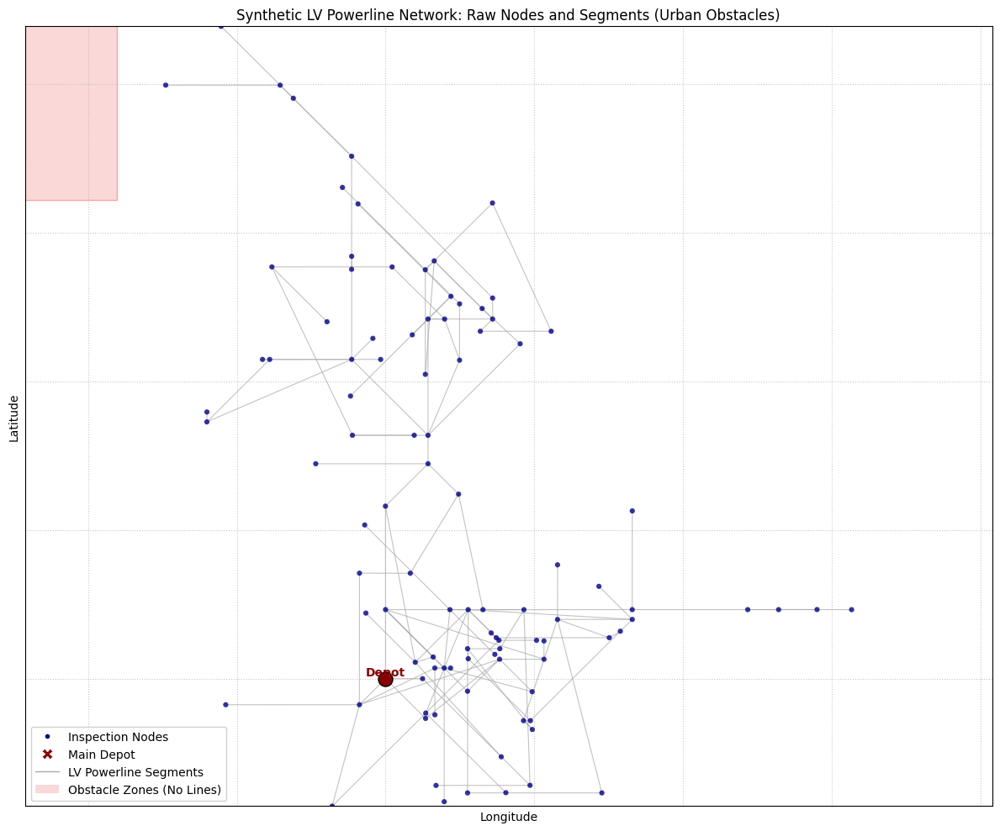

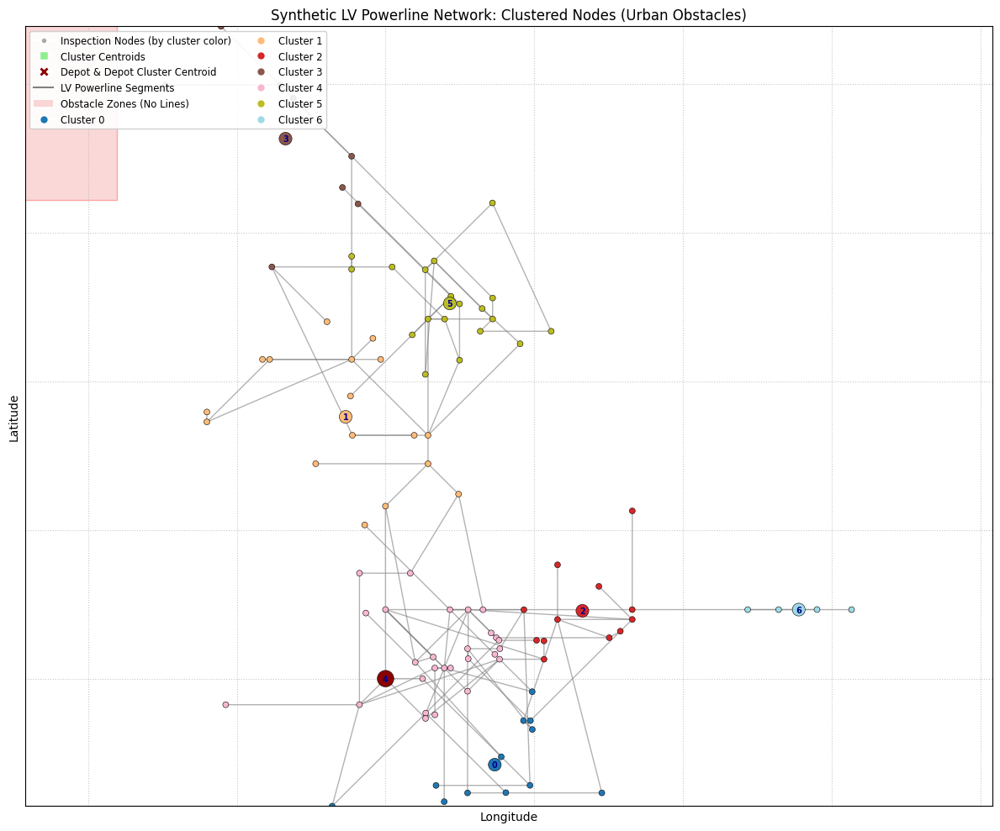

/tmp/ipython-input-40-4257490464.py:1059: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  uav_path_colors = plt.cm.get_cmap('Paired', Q_UAVS) # Or 'Set2', 'Dark2', 'tab10'


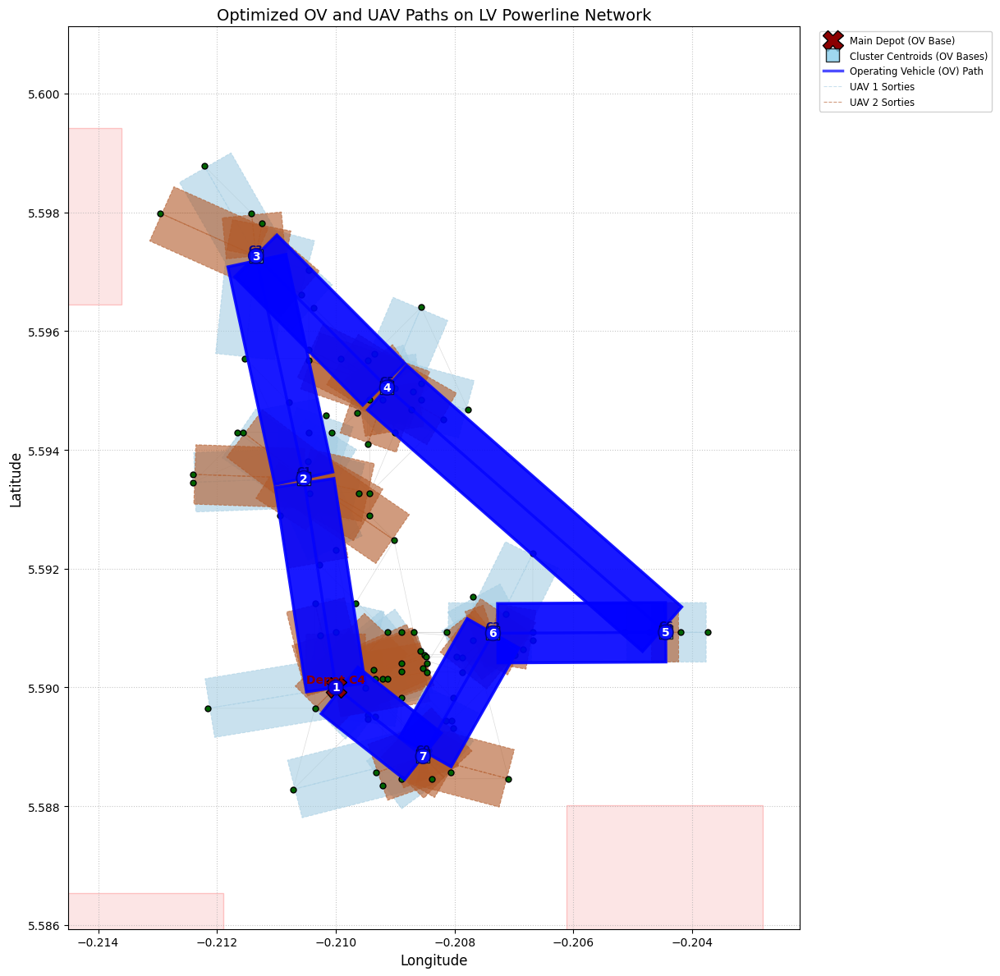


--- Optimal Path Details ---

OV Best Path Order (Cluster IDs):
DEPOT(4) -> C1 -> C3 -> C5 -> C6 -> C2 -> C0 -> DEPOT(4)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 4 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C4 -> 10 -> OV_C4; OV_C4 -> 37 -> OV_C4; OV_C4 -> 51 -> OV_C4; OV_C4 -> 75 -> OV_C4; OV_C4 -> 94 -> OV_C4; OV_C4 -> 12 -> OV_C4; OV_C4 -> 14 -> OV_C4; OV_C4 -> 39 -> OV_C4; OV_C4 -> 46 -> OV_C4; OV_C4 -> 30 -> OV_C4; OV_C4 -> 2 -> OV_C4; OV_C4 -> 97 -> OV_C4; OV_C4 -> 6 -> OV_C4; OV_C4 -> 66 -> OV_C4
    UAV 1: OV_C4 -> 0 -> OV_C4; OV_C4 -> 3 -> OV_C4; OV_C4 -> 5 -> OV_C4; OV_C4 -> 1 -> OV_C4; OV_C4 -> 40 -> OV_C4; OV_C4 -> 20 -> OV_C4; OV_C4 -> 74 -> OV_C4; OV_C4 -> 49 -> OV_C4; OV_C4 -> 23 -> OV_C4; OV_C4 -> 54 -> OV_C4; OV_C4 -> 13 -> OV_C4; OV_C4 -> 24 -> OV_C4; OV_C4 -> 16 -> OV_C4; OV_C4 -> 47 -> OV_C4
  Cluster 1 (OV Base at [5.5935, -0.2105]):
    UAV 0: OV_C1 -> 4 -> OV_C1; OV_C1 -> 88 -> OV_C1; OV_C1 -> 86 -> OV_C1; OV_C1 -> 

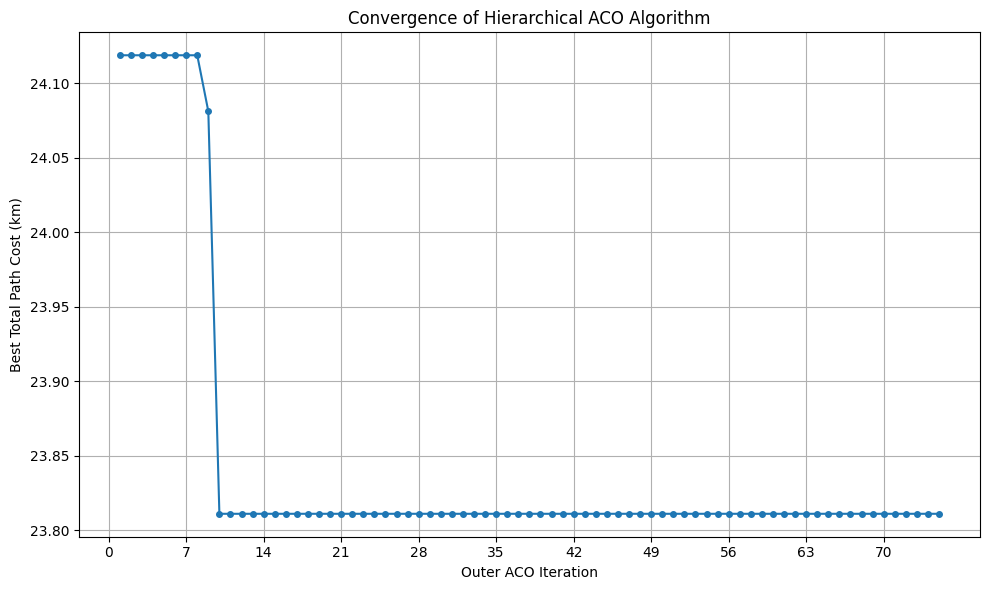

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time

# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    """
    num_nodes = len(aco_nodes)
    # Create a mapping from node ID to its 0-indexed position in aco_nodes list
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    # Add nodes to the NetworkX graph using their original IDs
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    # Add edges with 'distance' as weight
    for u_id, v_id, dist in aco_edges:
        # Ensure nodes exist in the graph before adding edge
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist) # NetworkX uses 'weight' for edge costs

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    # Use all_pairs_dijkstra_path_length for robust shortest path calculation
    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight') # Specify weight

    # Convert generator to dictionary for easier lookup. This can be memory intensive for very large graphs.
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    # Initialize distance matrix with infinity for unreachable pairs and 0 for self-loops
    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    # Populate the numpy matrix from NetworkX results
    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            # For undirected graphs, distances are symmetric
            uav_distances[v_idx, u_idx] = dist

    # Handle truly disconnected components by assigning a high penalty for "flying" directly
    # This scenario occurs if the generated powerline network itself has isolated nodes/sub-networks.
    PENALTY_FACTOR = 5.0 # Penalty factor for direct air travel vs. on-network travel (e.g., 5x more "costly")
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf: # If still unreachable via graph edges
                # Calculate direct Haversine distance as a base for penalty
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                # Assign a large penalized distance. Ensure it's not zero if actual distance is zero.
                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR # Assign a very small non-zero value
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                # Ensure symmetry for penalized distances too
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances


# --- UPDATED for LV: Generate Realistic LV Powerline Network (c16.png style) ---
# Define a smaller spatial region for an LV network (e.g., a neighborhood)
ACCRA_LAT_RANGE = 0.02 # Approx 2.2km for a neighborhood
ACCRA_LON_RANGE = 0.02 # Approx 2.2km for a neighborhood

DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Central Accra depot (retained)

ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2

# Realistic LV powerline segment lengths (10m to 200m)
MIN_LV_SEGMENT_KM = 0.01  # 10 meters
MAX_LV_SEGMENT_KM = 0.20  # 200 meters

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=8, obstacle_zone_size_factor=0.18, meshing_prob=0.01):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    The network growth is primarily linear/branching with strict obstacle avoidance, and minimal meshing.
    Designed to mimic the sparse, linear look of c16.png with LV segment lengths.

    Args:
        num_nodes (int): The total number of nodes to generate.
        num_obstacle_zones (int): Number of rectangular zones where nodes/edges are forbidden.
        obstacle_zone_size_factor (float): Relative size of obstacle zones.
        meshing_prob (float): Base probability for attempting to create additional mesh connections.
                              Very low for a more linear/tree-like structure (as in c16.png).

    Returns:
        tuple: (nodes, depot_id, edges, bbox, obstacle_zones_data)
    """
    nodes = []
    edges = []
    current_node_id = 0

    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX

    # Add the depot node
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1

    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []

    # --- Define Obstacle Zones (randomly placed, non-overlapping with depot) ---
    obstacle_zones = []
    depot_zone_buffer = 0.002 # A small buffer around depot to avoid placing obstacles too close

    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)

        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon

            # Check for overlap with depot (and a small buffer around it)
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break # Zone successfully placed
            attempts += 1


    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False

    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        # Check multiple points along the edge, not just midpoint
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False

    # Store nodes that can be expanded from
    expandable_nodes = [depot_node_id]

    # Define angles for growth, favoring cardinal/diagonal for a slightly structured feel
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]

    # Small jitter for a more natural, less perfectly straight appearance
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001

    # --- Iterative Node Generation and Connection (Linear Growth with Obstacle Avoidance) ---
    global_attempts = 0
    max_global_attempts = num_nodes * 500 # Many attempts for denser LV networks

    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1

        if not expandable_nodes:
            # If active expandable nodes run out, try a random node.
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            # Prioritize expanding from a random active node
            from_node_id = random.choice(expandable_nodes) # Use random.choice to allow reuse

            # Remove node from expandable_nodes if it has generated enough branches
            # This helps in preventing over-branching from a single point too early.
            # Example: After 3 successful connections, remove it.
            # (Optional, depending on desired density)
            # if len([e for e in edges if e[0] == from_node_id or e[1] == from_node_id]) >= 3:
            #     expandable_nodes.remove(from_node_id) # This can be slow for large lists. Better to use a counter or set.

        if from_node_id >= len(nodes): continue # Ensure from_node_id is valid index

        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']

        # Try to extend primarily in 1 direction, with a small chance for a branch
        num_branches_attempt = 1
        if random.random() < 0.2: # Smaller chance to create a second branch for sparser look
            num_branches_attempt = 2

        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))

        if random.random() < 0.02: # Even smaller chance for a purely random angle
            chosen_angles.append(random.uniform(0, 2*np.pi))

        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break

            # Segment length tailored for LV
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)

            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))

            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset

            # Apply jitter
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            # --- Strict Obstacle Zone Check ---
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue

            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)

            # Check if too close to an existing node (prevent clumping)
            is_too_close = False
            for existing_node in nodes:
                # Use a slightly smaller tolerance than min segment length
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue

            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                # If segment could not be added, ensure the 'from_node_id' remains expandable
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)


    # --- Add Meshing Connections (Very Low Probability and Strict Obstacle Avoidance) ---
    # Create a graph to check for existing connections and prevent multi-edges
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)

    # Use the meshing_prob from function arguments (set to 0.01 for c16.png style)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue

            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])

            # Allow mesh connections within a slightly larger range, still adhering to LV scale
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)

    # Re-index nodes and edges to ensure IDs are contiguous from 0
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}

    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)

    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph

    # Remove duplicate edges and ensure unique (u,v) pairs
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))

    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0

    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))

    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    # The 'virtual depot' for UAVs is the cluster centroid (OV location)
    # This node is conceptually at index 0 for local calculations within the cluster ACO
    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster

    # Mapping from original node ID (from all_nodes_global) to its local index within 'local_nodes'
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}

    # Mapping from global node ID to its global index (for looking up in uav_distances_all)
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    # Populate local_uav_distances matrix.
    # Distances between real nodes (not virtual depot) are taken from precomputed global matrix.
    # Distances to/from virtual depot are direct Haversine.
    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            # If either node is the virtual depot (index 0 in local_nodes)
            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else: # Between two actual inspection nodes within the cluster
                # Use precomputed global shortest distances from uav_distances_all
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   # This should not happen if all_nodes_global and nodes_in_cluster are consistent
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    # Initialize pheromones and heuristics for UAVs within this cluster
    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {} # Stores original IDs for routes

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)} # Routes for each UAV (original IDs)

        # Nodes that still need to be inspected in this cluster (local indices)
        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx) # Randomize order for this ant's iteration

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        # Debugging: Print cluster and UAV range details at the start of inner ACO loop
        # if iter_uav == 0:
        #     print(f"\n  --- Debugging Cluster {cluster_id} (Nodes: {len(nodes_in_cluster)}, UAV Range: {uav_range:.2f}km) ---")
        #     print(f"  OV Base at: ({depot_coords['lat']:.4f}, {depot_coords['lon']:.4f})")
        #     if not nodes_in_cluster:
        #         print("  No nodes in this cluster.")
        #     else:
        #         print("  Nodes to inspect (original IDs):", [node['id'] for node in nodes_in_cluster])


        for node_local_idx in nodes_to_inspect_local_idx:
            # Cost for this single sortie: Depot -> Node -> Depot
            try: # Defensive check for potential inf distances
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError: # This handles cases where local_uav_distances might not be square or valid
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                # This node is reachable. Assign it to one of the UAVs.
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}" # Identifier for the OV in the route
                target_original_id = local_nodes[node_local_idx]['id']

                # Append the full round trip: OV_ID -> TARGET_NODE_ID -> OV_ID
                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1
            # else:
                # print(f"      Node {local_nodes[node_local_idx]['id']} Sortie Cost {sortie_cost:.4f}km > UAV Range {uav_range:.4f}km. Not assigned.")


        # An ant's tour is only valid if all nodes in the cluster were successfully assigned
        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
                # print(f"  New best cluster cost for Cluster {cluster_id}: {best_cluster_uav_cost:.2f} km")
        else:
            ant_current_total_uav_cost = float('inf') # Mark as invalid tour

        # Pheromone Update
        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            # Only update pheromones for successful routes
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3): # Iterate over (OV->Node->OV) segments
                    if i + 1 < len(q_route_original_ids):
                        # 'u_local' is always 0 (virtual depot)
                        # 'v_local' is the target inspection node's local index
                        v_original_id = q_route_original_ids[i+1] # Get target node's original ID
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            # Deposit pheromone on the path between virtual depot (0) and target node (v_local)
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add # Symmetric update for return path

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        # If no valid solution found, return 0 cost if no nodes in cluster, else inf
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}


    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    # If no more clusters to visit, but not all were visited, this path is incomplete.
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            # If not all clusters were visited, this ant's OV path is incomplete and thus infeasible
            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx) # Complete the tour by returning to depot

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            # Evaluate UAV paths for each cluster in this OV tour
            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]: # Iterate through unique clusters in the path (excluding final depot return)
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_for_aco['centroids'][cluster_id]

                    # Call Inner ACO
                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords # Pass all_nodes_coords (global)
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf') # If any cluster is infeasible, whole tour is
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf') # Default to infeasible
            if ant_tour_total_uav_cost != float('inf'): # Only if all inner ACOs were feasible
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            # Update best solution found so far
            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        # Pheromone update for Outer ACO
        pheromones_ov *= (1 - rho_ov) # Evaporation

        if ant_total_costs: # Only deposit if there were any valid tours generated by ants
            # Find the best ant in this iteration to deposit pheromone (elitist update for iteration)
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add # Symmetric

        convergence_data.append(best_total_cost) # Append best_total_cost for the current iteration here

    # Map best path indices back to original cluster IDs
    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data

# --- Main Experiment Parameters ---
N_NODES = 100 # Number of synthetic nodes to generate (tuned for LV density)
M_CLUSTERS = 7 # Number of clusters
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 5.0 # Set to 5.0 km as requested

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50, # Increased iterations for inner ACO
    'n_ants_uav': 6, # Increased ants for inner ACO
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0, # Slightly increased deposit
    'tau0_uav': 1.0
}

# --- 1. Generate Realistic Synthetic LV Data ---
print("Generating realistic Low-Voltage powerline nodes and segments (c16.png style)...")
# Call the LV-specific generation function
all_nodes, depot_actual_node_id, generated_lv_edges, bbox_coords, obstacle_zones_data = \
    generate_lv_powerline_network(N_NODES, num_obstacle_zones=8, obstacle_zone_size_factor=0.18, meshing_prob=0.01)

# Display generated network details
print(f"\n--- Generated Network Details ---")
print(f"Number of Extracted Nodes (Inspection Points): {len(all_nodes)}")
print(f"Number of Generated LV Powerline Segments (Edges): {len(generated_lv_edges)}")
print(f"Geographical Bounding Box of Generated Network:")
print(f"  Latitude: [{bbox_coords[0]:.4f}°N, {bbox_coords[1]:.4f}°N]")
print(f"  Longitude: [{bbox_coords[2]:.4f}°E, {bbox_coords[3]:.4f}°E]")


print("\nBuilding UAV distances matrix using NetworkX (shortest paths along generated edges or penalized direct flight)...")
# Use the function that computes shortest paths along the `generated_lv_edges`
uav_distances_matrix = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_lv_edges)
print("UAV distances matrix built.")


# --- 2. Perform K-Means Clustering ---
print(f"\nPerforming K-means clustering for {M_CLUSTERS} clusters...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of nodes ({len(all_nodes)}) is less than number of clusters requested ({M_CLUSTERS}). Setting M_CLUSTERS to number of nodes.")
    M_CLUSTERS = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes extracted. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label # Update original all_nodes with cluster_id
    clusters_data[label].append(all_nodes[i])

cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

# Ensure the cluster containing the actual depot node is treated as THE depot cluster
depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
depot_cluster_id = depot_node_obj['cluster_id']

# Set the depot cluster's centroid to the exact ECG depot location for consistency
cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}" # Assign a string ID to depot centroid for plotting


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}

# --- 3. Run Hierarchical ACO ---
print("\nRunning Hierarchical ACO algorithm...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id, # Pass the ID of the chosen depot cluster
    all_clusters_for_aco,
    all_nodes, # Pass all_nodes for global_id_to_global_idx map in inner ACO
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM, # Pass the updated R_UAV_KM
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- Optimization Complete ---")
print(f"Total Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- 4. Visualization using NetworkX and Matplotlib ---
print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# Prepare data for networkx plotting
plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}" # Use a unique string ID for the depot centroid for plotting
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id) # Label with cluster ID
    centroid_plot_ids_map[c_id] = plot_id

# Create a color map for clusters
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes} # Build pos here

    # Add generated edges
    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Plot obstacle zones (as red rectangles)
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    # Draw all nodes as small gray dots
    # Ensure nodelist is explicitly G.nodes() to avoid implicit issues
    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    # Draw all generated powerline segments
    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    # Highlight depot node
    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos: # Ensure depot node is in pos
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']], # Explicitly define nodelist for depot
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold') # Reduced offset

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    # Add the generated LV powerline edges (these are the actual network structure)
    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    # Plot obstacle zones (as red rectangles)
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    # Node coloring and sizing
    node_colors_list = []
    node_sizes_list = []

    # Get the valid node IDs from plot_nodes_coords to ensure consistency
    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int): # Actual inspection nodes
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray') # Fallback color
                node_sizes_list.append(0) # Hide
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray') # Fallback color
            node_sizes_list.append(25) # Smaller size for individual nodes

            # If it's the depot itself, give it a distinct color/size
            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else: # Centroid nodes (string IDs like 'C0', 'DepotC1')
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred') # Matches actual depot color
                node_sizes_list.append(200) # Larger for Depot Centroid
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120) # Size for other Centroids

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    # Draw labels for centroids (only once per unique centroid)
    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    # Draw generated LV powerline edges (the actual network grid)
    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title("Synthetic LV Powerline Network: Clustered Nodes (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Custom legend for clustered nodes and network components
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    # Add an example for cluster colors
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    # 1. Plot obstacle zones
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.2, zorder=0)
        ax.add_patch(rect)

    # 2. Plot all original network edges as background
    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    # 3. Plot all inspection nodes as small background dots (gray)
    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int): # Only plot actual inspection nodes
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    # To track nodes visited by UAVs for clearer marking
    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    # 4. Plot UAV-visited nodes more prominently
    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')
            # Optional: Add node ID labels for clarity, adjust size for readability
            # ax.text(node_data['lon'], node_data['lat'] + 0.000008, f"{node_id}", fontsize=5, color='darkgreen', ha='center', va='bottom', zorder=7)


    # 5. Plot cluster centroids (OV bases)
    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            # Main Depot (OV base)
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            # Other Cluster Centroids (OV bases)
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    # Label for "Other Cluster Centroids"
    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')


    # 6. OV Path with arrows and numbered stops
    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    # Add numbered markers for OV path order at centroids
    for i in range(len(best_ov_path_ids) - 1): # Exclude final depot return for numbering
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        # Adjust text position slightly if needed to avoid overlap
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10) # Higher zorder to ensure visibility


    # 7. UAV paths (one tower per sortie)
    uav_path_colors = plt.cm.get_cmap('Paired', Q_UAVS) # Or 'Set2', 'Dark2', 'tab10'
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 2 < len(route_nodes_ids): # Ensure a full [OV_C, Node, OV_C] sortie
                    target_node_id = route_nodes_ids[i+1] # This is the actual node ID
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        color_for_uav = uav_path_colors(uav_q % Q_UAVS)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1)) # Outside plot
    plt.title("Optimized OV and UAV Paths on LV Powerline Network", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for legend
    plt.savefig("optimized_paths_ov_uav_synthetic_lv_enhanced.png", bbox_inches='tight')
    plt.show()


# --- Main execution flow for Synthetic LV Data ---
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- Run the visualizations ---
# 1. Plot raw network (before clustering)
plot_raw_powerline_network(all_nodes, generated_lv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data)


# 2. Plot clustered network
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data)

# 3. Plot best paths after ACO
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            # Reconstruct the string for display, showing each sortie clearly
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids): # Ensure there's a target node
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
plt.plot(range(1, OV_ACO_PARAMS['iters_ov'] + 1), convergence_history, marker='o', linestyle='-', markersize=4)
plt.title('Convergence of Hierarchical ACO Algorithm')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
plt.xticks(np.arange(0, OV_ACO_PARAMS['iters_ov'] + 1, max(1, OV_ACO_PARAMS['iters_ov'] // 10)))
plt.tight_layout()
plt.savefig("aco_convergence_plot_synthetic_lv.png")
print("Convergence plot saved to aco_convergence_plot_synthetic_lv.png")
plt.show()

Generating realistic Low-Voltage powerline nodes and segments (c16.png style)...

--- Generated Network Details ---
Number of Extracted Nodes (Inspection Points): 100
Number of Generated LV Powerline Segments (Edges): 175
Geographical Bounding Box of Generated Network:
  Latitude: [5.5876°N, 5.5939°N]
  Longitude: [-0.2122°E, -0.2068°E]

Building UAV distances matrix using NetworkX (shortest paths along generated edges or penalized direct flight)...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.02 seconds.
UAV distances matrix built.

Performing K-means clustering for 7 clusters...

Running Hierarchical ACO algorithm...


/tmp/ipython-input-23-1397882100.py:32: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)



--- Optimization Complete ---
Total Runtime: 9.60 seconds
Best Total Path Cost: 15.88 km

--- Visualizing Results with NetworkX and Matplotlib ---


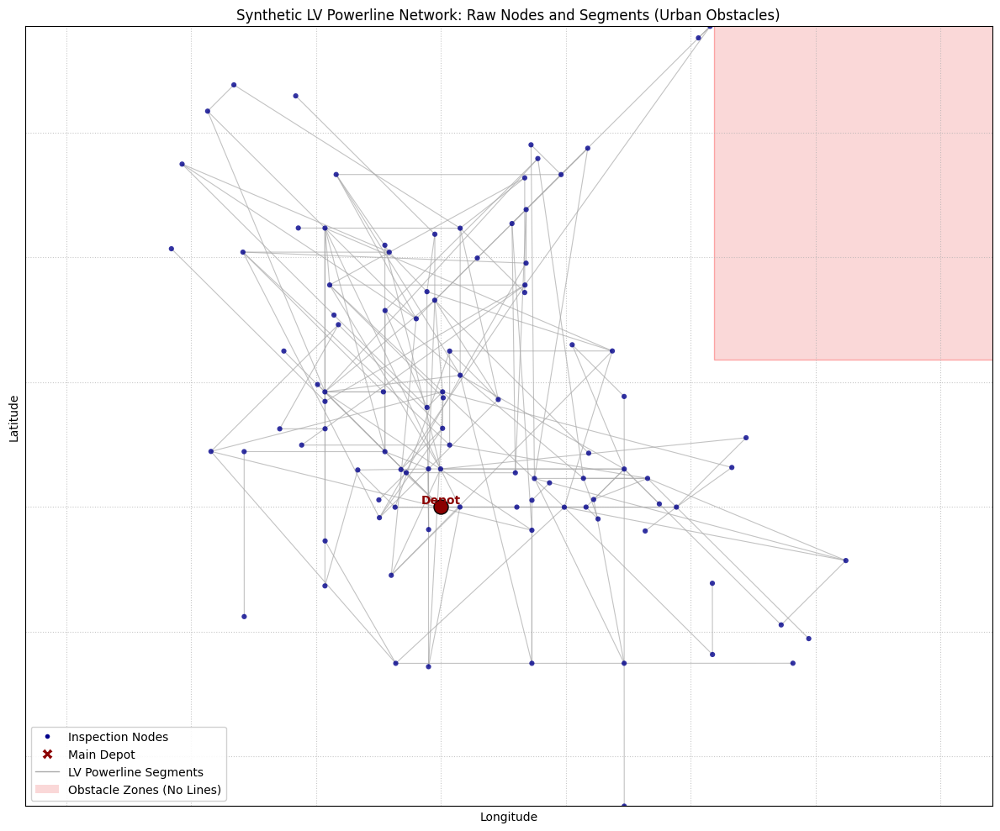

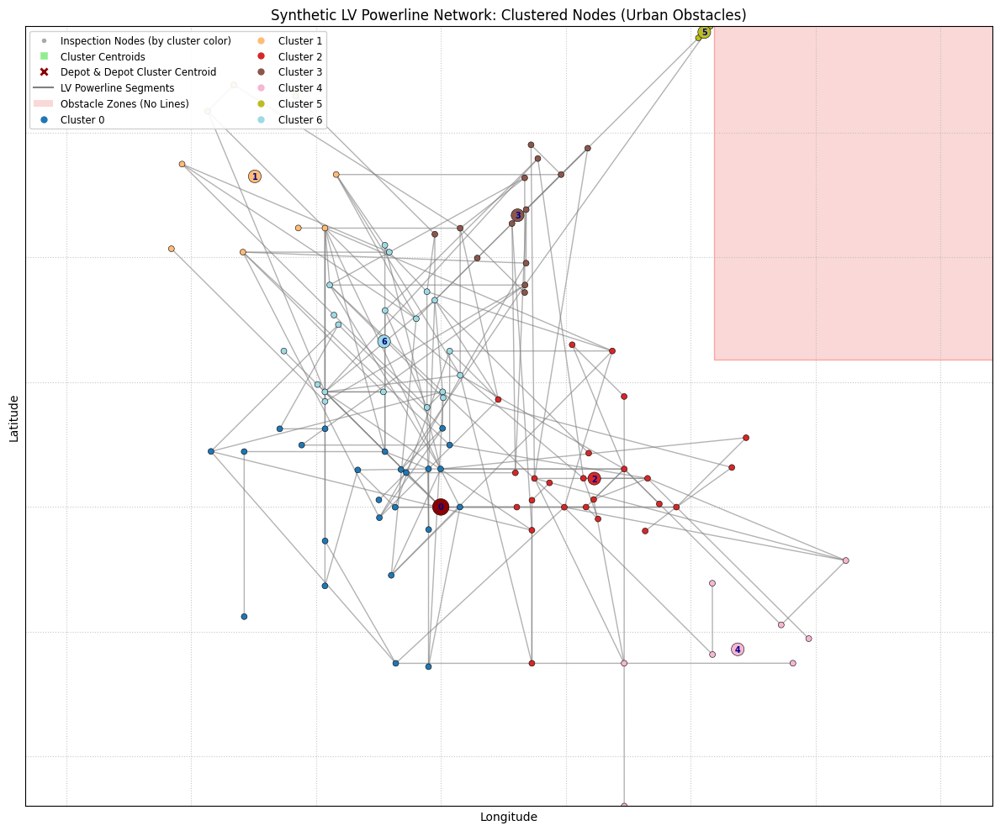

/tmp/ipython-input-23-1397882100.py:1059: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  uav_path_colors = plt.cm.get_cmap('Paired', Q_UAVS) # Or 'Set2', 'Dark2', 'tab10'


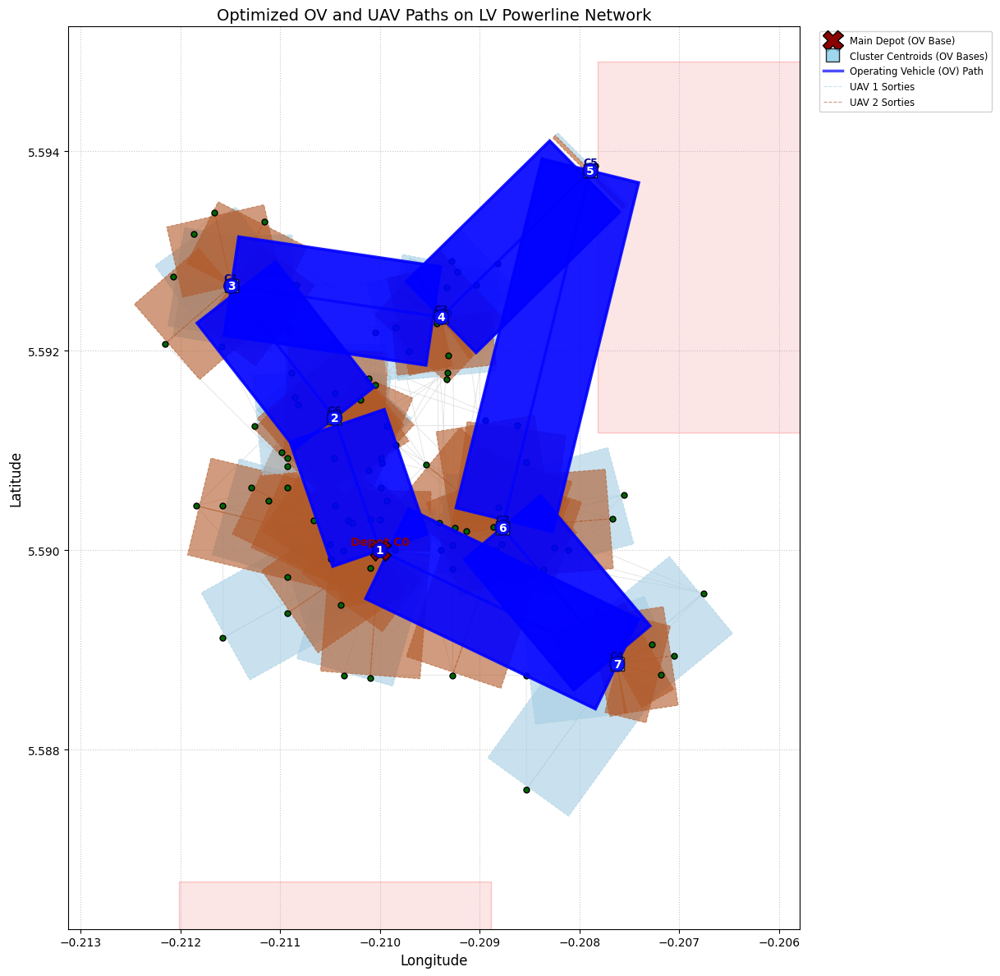


--- Optimal Path Details ---

OV Best Path Order (Cluster IDs):
DEPOT(0) -> C6 -> C1 -> C3 -> C5 -> C2 -> C4 -> DEPOT(0)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 0 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C0 -> 35 -> OV_C0; OV_C0 -> 82 -> OV_C0; OV_C0 -> 43 -> OV_C0; OV_C0 -> 70 -> OV_C0; OV_C0 -> 62 -> OV_C0; OV_C0 -> 41 -> OV_C0; OV_C0 -> 33 -> OV_C0; OV_C0 -> 34 -> OV_C0; OV_C0 -> 0 -> OV_C0; OV_C0 -> 86 -> OV_C0; OV_C0 -> 75 -> OV_C0; OV_C0 -> 21 -> OV_C0; OV_C0 -> 11 -> OV_C0
    UAV 1: OV_C0 -> 10 -> OV_C0; OV_C0 -> 85 -> OV_C0; OV_C0 -> 69 -> OV_C0; OV_C0 -> 6 -> OV_C0; OV_C0 -> 84 -> OV_C0; OV_C0 -> 94 -> OV_C0; OV_C0 -> 15 -> OV_C0; OV_C0 -> 96 -> OV_C0; OV_C0 -> 37 -> OV_C0; OV_C0 -> 38 -> OV_C0; OV_C0 -> 18 -> OV_C0; OV_C0 -> 57 -> OV_C0
  Cluster 6 (OV Base at [5.5913, -0.2105]):
    UAV 0: OV_C6 -> 4 -> OV_C6; OV_C6 -> 73 -> OV_C6; OV_C6 -> 93 -> OV_C6; OV_C6 -> 97 -> OV_C6; OV_C6 -> 5 -> OV_C6; OV_C6 -> 56 -> OV_C6; OV_C6 

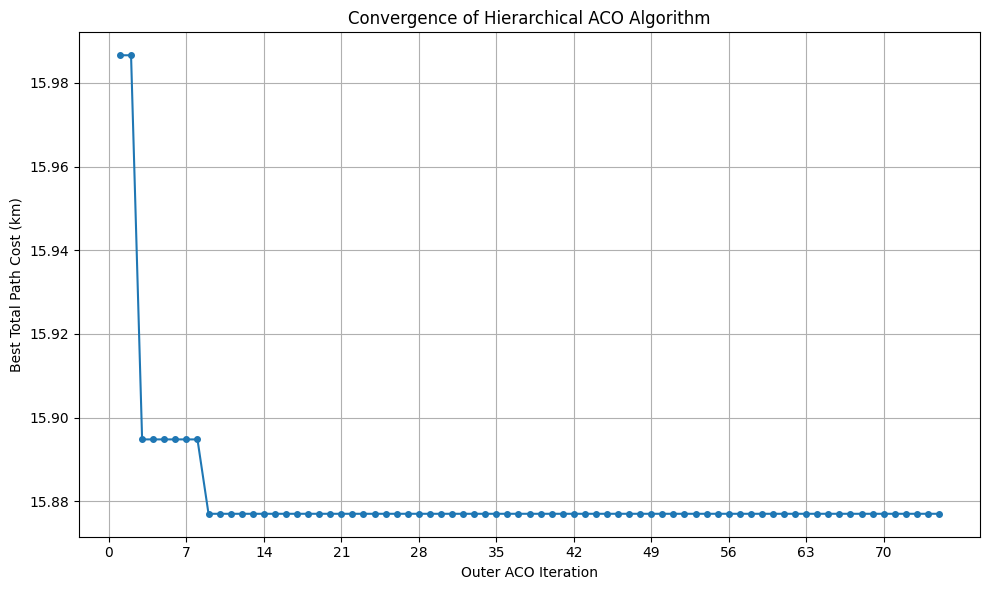

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time

# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    """
    num_nodes = len(aco_nodes)
    # Create a mapping from node ID to its 0-indexed position in aco_nodes list
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    # Add nodes to the NetworkX graph using their original IDs
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    # Add edges with 'distance' as weight
    for u_id, v_id, dist in aco_edges:
        # Ensure nodes exist in the graph before adding edge
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist) # NetworkX uses 'weight' for edge costs

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    # Use all_pairs_dijkstra_path_length for robust shortest path calculation
    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight') # Specify weight

    # Convert generator to dictionary for easier lookup. This can be memory intensive for very large graphs.
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    # Initialize distance matrix with infinity for unreachable pairs and 0 for self-loops
    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    # Populate the numpy matrix from NetworkX results
    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            # For undirected graphs, distances are symmetric
            uav_distances[v_idx, u_idx] = dist

    # Handle truly disconnected components by assigning a high penalty for "flying" directly
    # This scenario occurs if the generated powerline network itself has isolated nodes/sub-networks.
    PENALTY_FACTOR = 5.0 # Penalty factor for direct air travel vs. on-network travel (e.g., 5x more "costly")
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf: # If still unreachable via graph edges
                # Calculate direct Haversine distance as a base for penalty
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                # Assign a large penalized distance. Ensure it's not zero if actual distance is zero.
                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR # Assign a very small non-zero value
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                # Ensure symmetry for penalized distances too
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances


# --- UPDATED for LV: Generate Realistic LV Powerline Network (c16.png style) ---
# Define a smaller spatial region for an LV network (e.g., a neighborhood)
ACCRA_LAT_RANGE = 0.02 # Approx 2.2km for a neighborhood
ACCRA_LON_RANGE = 0.02 # Approx 2.2km for a neighborhood

DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Central Accra depot (retained)

ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2

# Realistic LV powerline segment lengths (10m to 200m)
MIN_LV_SEGMENT_KM = 0.01  # 10 meters
MAX_LV_SEGMENT_KM = 0.20  # 200 meters

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=8, obstacle_zone_size_factor=0.18, meshing_prob=0.01):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    The network growth is primarily linear/branching with strict obstacle avoidance, and minimal meshing.
    Designed to mimic the sparse, linear look of c16.png with LV segment lengths.

    Args:
        num_nodes (int): The total number of nodes to generate.
        num_obstacle_zones (int): Number of rectangular zones where nodes/edges are forbidden.
        obstacle_zone_size_factor (float): Relative size of obstacle zones.
        meshing_prob (float): Base probability for attempting to create additional mesh connections.
                              Very low for a more linear/tree-like structure (as in c16.png).

    Returns:
        tuple: (nodes, depot_id, edges, bbox, obstacle_zones_data)
    """
    nodes = []
    edges = []
    current_node_id = 0

    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX

    # Add the depot node
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1

    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []

    # --- Define Obstacle Zones (randomly placed, non-overlapping with depot) ---
    obstacle_zones = []
    depot_zone_buffer = 0.002 # A small buffer around depot to avoid placing obstacles too close

    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)

        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon

            # Check for overlap with depot (and a small buffer around it)
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break # Zone successfully placed
            attempts += 1


    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False

    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        # Check multiple points along the edge, not just midpoint
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False

    # Store nodes that can be expanded from
    expandable_nodes = [depot_node_id]

    # Define angles for growth, favoring cardinal/diagonal for a slightly structured feel
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]

    # Small jitter for a more natural, less perfectly straight appearance
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001

    # --- Iterative Node Generation and Connection (Linear Growth with Obstacle Avoidance) ---
    global_attempts = 0
    max_global_attempts = num_nodes * 500 # Many attempts for denser LV networks

    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1

        if not expandable_nodes:
            # If active expandable nodes run out, try a random node.
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            # Prioritize expanding from a random active node
            from_node_id = random.choice(expandable_nodes) # Use random.choice to allow reuse

            # Remove node from expandable_nodes if it has generated enough branches
            # This helps in preventing over-branching from a single point too early.
            # Example: After 3 successful connections, remove it.
            # (Optional, depending on desired density)
            # if len([e for e in edges if e[0] == from_node_id or e[1] == from_node_id]) >= 3:
            #     expandable_nodes.remove(from_node_id) # This can be slow for large lists. Better to use a counter or set.

        if from_node_id >= len(nodes): continue # Ensure from_node_id is valid index

        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']

        # Try to extend primarily in 1 direction, with a small chance for a branch
        num_branches_attempt = 1
        if random.random() < 0.2: # Smaller chance to create a second branch for sparser look
            num_branches_attempt = 2

        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))

        if random.random() < 0.02: # Even smaller chance for a purely random angle
            chosen_angles.append(random.uniform(0, 2*np.pi))

        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break

            # Segment length tailored for LV
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)

            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))

            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset

            # Apply jitter
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            # --- Strict Obstacle Zone Check ---
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue

            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)

            # Check if too close to an existing node (prevent clumping)
            is_too_close = False
            for existing_node in nodes:
                # Use a slightly smaller tolerance than min segment length
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue

            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                # If segment could not be added, ensure the 'from_node_id' remains expandable
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)


    # --- Add Meshing Connections (Very Low Probability and Strict Obstacle Avoidance) ---
    # Create a graph to check for existing connections and prevent multi-edges
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)

    # Use the meshing_prob from function arguments (set to 0.01 for c16.png style)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue

            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])

            # Allow mesh connections within a slightly larger range, still adhering to LV scale
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)

    # Re-index nodes and edges to ensure IDs are contiguous from 0
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}

    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)

    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph

    # Remove duplicate edges and ensure unique (u,v) pairs
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))

    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0

    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))

    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    # The 'virtual depot' for UAVs is the cluster centroid (OV location)
    # This node is conceptually at index 0 for local calculations within the cluster ACO
    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster

    # Mapping from original node ID (from all_nodes_global) to its local index within 'local_nodes'
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}

    # Mapping from global node ID to its global index (for looking up in uav_distances_all)
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    # Populate local_uav_distances matrix.
    # Distances between real nodes (not virtual depot) are taken from precomputed global matrix.
    # Distances to/from virtual depot are direct Haversine.
    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            # If either node is the virtual depot (index 0 in local_nodes)
            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else: # Between two actual inspection nodes within the cluster
                # Use precomputed global shortest distances from uav_distances_all
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   # This should not happen if all_nodes_global and nodes_in_cluster are consistent
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    # Initialize pheromones and heuristics for UAVs within this cluster
    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {} # Stores original IDs for routes

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)} # Routes for each UAV (original IDs)

        # Nodes that still need to be inspected in this cluster (local indices)
        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx) # Randomize order for this ant's iteration

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        # Debugging: Print cluster and UAV range details at the start of inner ACO loop
        # if iter_uav == 0:
        #     print(f"\n  --- Debugging Cluster {cluster_id} (Nodes: {len(nodes_in_cluster)}, UAV Range: {uav_range:.2f}km) ---")
        #     print(f"  OV Base at: ({depot_coords['lat']:.4f}, {depot_coords['lon']:.4f})")
        #     if not nodes_in_cluster:
        #         print("  No nodes in this cluster.")
        #     else:
        #         print("  Nodes to inspect (original IDs):", [node['id'] for node in nodes_in_cluster])


        for node_local_idx in nodes_to_inspect_local_idx:
            # Cost for this single sortie: Depot -> Node -> Depot
            try: # Defensive check for potential inf distances
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError: # This handles cases where local_uav_distances might not be square or valid
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                # This node is reachable. Assign it to one of the UAVs.
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}" # Identifier for the OV in the route
                target_original_id = local_nodes[node_local_idx]['id']

                # Append the full round trip: OV_ID -> TARGET_NODE_ID -> OV_ID
                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1
            # else:
                # print(f"      Node {local_nodes[node_local_idx]['id']} Sortie Cost {sortie_cost:.4f}km > UAV Range {uav_range:.4f}km. Not assigned.")


        # An ant's tour is only valid if all nodes in the cluster were successfully assigned
        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
                # print(f"  New best cluster cost for Cluster {cluster_id}: {best_cluster_uav_cost:.2f} km")
        else:
            ant_current_total_uav_cost = float('inf') # Mark as invalid tour

        # Pheromone Update
        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            # Only update pheromones for successful routes
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3): # Iterate over (OV->Node->OV) segments
                    if i + 1 < len(q_route_original_ids):
                        # 'u_local' is always 0 (virtual depot)
                        # 'v_local' is the target inspection node's local index
                        v_original_id = q_route_original_ids[i+1] # Get target node's original ID
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            # Deposit pheromone on the path between virtual depot (0) and target node (v_local)
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add # Symmetric update for return path

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        # If no valid solution found, return 0 cost if no nodes in cluster, else inf
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}


    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    # If no more clusters to visit, but not all were visited, this path is incomplete.
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            # If not all clusters were visited, this ant's OV path is incomplete and thus infeasible
            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx) # Complete the tour by returning to depot

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            # Evaluate UAV paths for each cluster in this OV tour
            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]: # Iterate through unique clusters in the path (excluding final depot return)
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_for_aco['centroids'][cluster_id]

                    # Call Inner ACO
                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords # Pass all_nodes_coords (global)
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf') # If any cluster is infeasible, whole tour is
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf') # Default to infeasible
            if ant_tour_total_uav_cost != float('inf'): # Only if all inner ACOs were feasible
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            # Update best solution found so far
            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        # Pheromone update for Outer ACO
        pheromones_ov *= (1 - rho_ov) # Evaporation

        if ant_total_costs: # Only deposit if there were any valid tours generated by ants
            # Find the best ant in this iteration to deposit pheromone (elitist update for iteration)
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add # Symmetric

        convergence_data.append(best_total_cost) # Append best_total_cost for the current iteration here

    # Map best path indices back to original cluster IDs
    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data

# --- Main Experiment Parameters ---
N_NODES = 100 # Number of synthetic nodes to generate (tuned for LV density)
M_CLUSTERS = 7 # Number of clusters
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 5.0 # Set to 5.0 km as requested

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50, # Increased iterations for inner ACO
    'n_ants_uav': 6, # Increased ants for inner ACO
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0, # Slightly increased deposit
    'tau0_uav': 1.0
}

# --- 1. Generate Realistic Synthetic LV Data ---
print("Generating realistic Low-Voltage powerline nodes and segments (c16.png style)...")
# Call the LV-specific generation function
all_nodes, depot_actual_node_id, generated_lv_edges, bbox_coords, obstacle_zones_data = \
    generate_lv_powerline_network(N_NODES, num_obstacle_zones=8, obstacle_zone_size_factor=0.18, meshing_prob=0.01)

# Display generated network details
print(f"\n--- Generated Network Details ---")
print(f"Number of Extracted Nodes (Inspection Points): {len(all_nodes)}")
print(f"Number of Generated LV Powerline Segments (Edges): {len(generated_lv_edges)}")
print(f"Geographical Bounding Box of Generated Network:")
print(f"  Latitude: [{bbox_coords[0]:.4f}°N, {bbox_coords[1]:.4f}°N]")
print(f"  Longitude: [{bbox_coords[2]:.4f}°E, {bbox_coords[3]:.4f}°E]")


print("\nBuilding UAV distances matrix using NetworkX (shortest paths along generated edges or penalized direct flight)...")
# Use the function that computes shortest paths along the `generated_lv_edges`
uav_distances_matrix = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_lv_edges)
print("UAV distances matrix built.")


# --- 2. Perform K-Means Clustering ---
print(f"\nPerforming K-means clustering for {M_CLUSTERS} clusters...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of nodes ({len(all_nodes)}) is less than number of clusters requested ({M_CLUSTERS}). Setting M_CLUSTERS to number of nodes.")
    M_CLUSTERS = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes extracted. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label # Update original all_nodes with cluster_id
    clusters_data[label].append(all_nodes[i])

cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

# Ensure the cluster containing the actual depot node is treated as THE depot cluster
depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
depot_cluster_id = depot_node_obj['cluster_id']

# Set the depot cluster's centroid to the exact ECG depot location for consistency
cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}" # Assign a string ID to depot centroid for plotting


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}

# --- 3. Run Hierarchical ACO ---
print("\nRunning Hierarchical ACO algorithm...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id, # Pass the ID of the chosen depot cluster
    all_clusters_for_aco,
    all_nodes, # Pass all_nodes for global_id_to_global_idx map in inner ACO
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM, # Pass the updated R_UAV_KM
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- Optimization Complete ---")
print(f"Total Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- 4. Visualization using NetworkX and Matplotlib ---
print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# Prepare data for networkx plotting
plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}" # Use a unique string ID for the depot centroid for plotting
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id) # Label with cluster ID
    centroid_plot_ids_map[c_id] = plot_id

# Create a color map for clusters
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes} # Build pos here

    # Add generated edges
    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Plot obstacle zones (as red rectangles)
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    # Draw all nodes as small gray dots
    # Ensure nodelist is explicitly G.nodes() to avoid implicit issues
    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    # Draw all generated powerline segments
    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    # Highlight depot node
    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos: # Ensure depot node is in pos
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']], # Explicitly define nodelist for depot
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold') # Reduced offset

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    # Add the generated LV powerline edges (these are the actual network structure)
    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    # Plot obstacle zones (as red rectangles)
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    # Node coloring and sizing
    node_colors_list = []
    node_sizes_list = []

    # Get the valid node IDs from plot_nodes_coords to ensure consistency
    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int): # Actual inspection nodes
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray') # Fallback color
                node_sizes_list.append(0) # Hide
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray') # Fallback color
            node_sizes_list.append(25) # Smaller size for individual nodes

            # If it's the depot itself, give it a distinct color/size
            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else: # Centroid nodes (string IDs like 'C0', 'DepotC1')
            if n_id not in valid_plot_node_ids: # Added check for robustness
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred') # Matches actual depot color
                node_sizes_list.append(200) # Larger for Depot Centroid
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120) # Size for other Centroids

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    # Draw labels for centroids (only once per unique centroid)
    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    # Draw generated LV powerline edges (the actual network grid)
    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title("Synthetic LV Powerline Network: Clustered Nodes (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Custom legend for clustered nodes and network components
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    # Add an example for cluster colors
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    # 1. Plot obstacle zones
    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.2, zorder=0)
        ax.add_patch(rect)

    # 2. Plot all original network edges as background
    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    # 3. Plot all inspection nodes as small background dots (gray)
    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int): # Only plot actual inspection nodes
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    # To track nodes visited by UAVs for clearer marking
    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    # 4. Plot UAV-visited nodes more prominently
    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')
            # Optional: Add node ID labels for clarity, adjust size for readability
            # ax.text(node_data['lon'], node_data['lat'] + 0.000008, f"{node_id}", fontsize=5, color='darkgreen', ha='center', va='bottom', zorder=7)


    # 5. Plot cluster centroids (OV bases)
    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            # Main Depot (OV base)
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            # Other Cluster Centroids (OV bases)
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    # Label for "Other Cluster Centroids"
    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')


    # 6. OV Path with arrows and numbered stops
    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    # Add numbered markers for OV path order at centroids
    for i in range(len(best_ov_path_ids) - 1): # Exclude final depot return for numbering
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        # Adjust text position slightly if needed to avoid overlap
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10) # Higher zorder to ensure visibility


    # 7. UAV paths (one tower per sortie)
    uav_path_colors = plt.cm.get_cmap('Paired', Q_UAVS) # Or 'Set2', 'Dark2', 'tab10'
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 2 < len(route_nodes_ids): # Ensure a full [OV_C, Node, OV_C] sortie
                    target_node_id = route_nodes_ids[i+1] # This is the actual node ID
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        color_for_uav = uav_path_colors(uav_q % Q_UAVS)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1)) # Outside plot
    plt.title("Optimized OV and UAV Paths on LV Powerline Network", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for legend
    plt.savefig("optimized_paths_ov_uav_synthetic_lv_enhanced.png", bbox_inches='tight')
    plt.show()


# --- Main execution flow for Synthetic LV Data ---
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

# --- Run the visualizations ---
# 1. Plot raw network (before clustering)
plot_raw_powerline_network(all_nodes, generated_lv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data)


# 2. Plot clustered network
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data)

# 3. Plot best paths after ACO
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            # Reconstruct the string for display, showing each sortie clearly
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids): # Ensure there's a target node
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
plt.plot(range(1, OV_ACO_PARAMS['iters_ov'] + 1), convergence_history, marker='o', linestyle='-', markersize=4)
plt.title('Convergence of Hierarchical ACO Algorithm')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
plt.xticks(np.arange(0, OV_ACO_PARAMS['iters_ov'] + 1, max(1, OV_ACO_PARAMS['iters_ov'] // 10)))
plt.tight_layout()
plt.savefig("aco_convergence_plot_synthetic_lv.png")
print("Convergence plot saved to aco_convergence_plot_synthetic_lv.png")
plt.show()


For saving dataset

In [ ]:
import json
import os
from google.colab import drive
import numpy as np # Import numpy as it's used for type checking

# --- Helper function to convert NumPy types to Python native types ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist() # Convert numpy arrays to Python lists
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj

# --- 1. Mount Google Drive ---
print("Mounting Google Drive...")
try:
    drive.mount('/content/drive')
    print("Google Drive mounted successfully.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}")
    print("Please ensure you are running this in a Google Colab environment and follow the authentication prompts.")
    exit()

# --- 2. Prepare the data to be saved ---
# This block assumes that the variables are already defined from the ACO simulation run.
try:
    data_to_save_raw = { # Use a temporary name for the raw data
        "nodes": all_nodes,
        "depot_actual_node_id": depot_actual_node_id,
        "generated_lv_edges": generated_lv_edges,
        "bbox_coords": bbox_coords,
        "obstacle_zones_data": obstacle_zones_data,
        "cluster_centroids": cluster_centroids,
        "best_ov_path_ids": best_ov_path_ids,
        "best_uav_paths_in_clusters": best_uav_paths_in_clusters,
        "best_overall_cost": best_overall_cost,
        "convergence_history": convergence_history,
        "simulation_parameters": {
            "N_NODES": N_NODES,
            "M_CLUSTERS": M_CLUSTERS,
            "Q_UAVS": Q_UAVS,
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    # Apply the conversion function
    data_to_save_converted = convert_numpy_types(data_to_save_raw)

except NameError as e:
    print(f"Error: One or more required variables are not defined. This usually means the main ACO simulation code has not been run in this Colab session.")
    print(f"Missing variable: {e}")
    exit()

# --- 3. Define the file path and name ---
file_name = 'ACO_LV_Network_Simulation_dataset.json' # Fixed file name as requested

# Define the folder path on Google Drive (using your specified path)
drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
full_file_path = os.path.join(drive_folder_path, file_name)

# --- 4. Create the folder if it doesn't exist ---
print(f"Ensuring directory exists: {drive_folder_path}")
try:
    os.makedirs(drive_folder_path, exist_ok=True)
    print("Directory ready.")
except OSError as e:
    print(f"Error creating directory {drive_folder_path}: {e}")
    exit()

# --- 5. Save the data to the JSON file ---
print(f"Saving simulation results to: {full_file_path}")
try:
    # Use the converted data_to_save_converted
    with open(full_file_path, 'w') as f:
        json.dump(data_to_save_converted, f, indent=4)
    print("Data successfully saved to Google Drive!")
    print(f"File location: {full_file_path}")
except Exception as e:
    print(f"Error saving data to file: {e}")

Mounting Google Drive...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted successfully.
Ensuring directory exists: /content/drive/MyDrive/PowerLine/getn/
Directory ready.
Saving simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json


In [ ]:
cd /content/drive/MyDrive/PowerLine/getn/

/content/drive/MyDrive/PowerLine/getn


In [ ]:
ls

ACO_LV_Network_Simulation_dataset.json


LOAD DATASET FROM GDRIVE


--- Mounting Google Drive and Loading Data ---
Google Drive already mounted.
Initial dataset and simulation parameters loaded successfully.
Loaded simulation parameters: N_NODES=100, M_CLUSTERS=7, Q_UAVS=2, R_UAV_KM=5.0

Performing K-means clustering for 7 clusters on loaded data...
Clustering complete on loaded data.

Building UAV distances matrix using NetworkX (shortest paths along loaded edges or penalized direct flight)...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.02 seconds.
UAV distances matrix and NetworkX graph built.

Running Hierarchical ACO algorithm with loaded parameters...


/tmp/ipython-input-18-3438735019.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)



--- ACO Simulation Complete ---
Total ACO Runtime: 9.98 seconds
Best Total Path Cost: 14.71 km

--- Running Evaluation Metrics ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 69.88% of LV powerline segments traversed.

--- Visualizing Results with NetworkX and Matplotlib ---


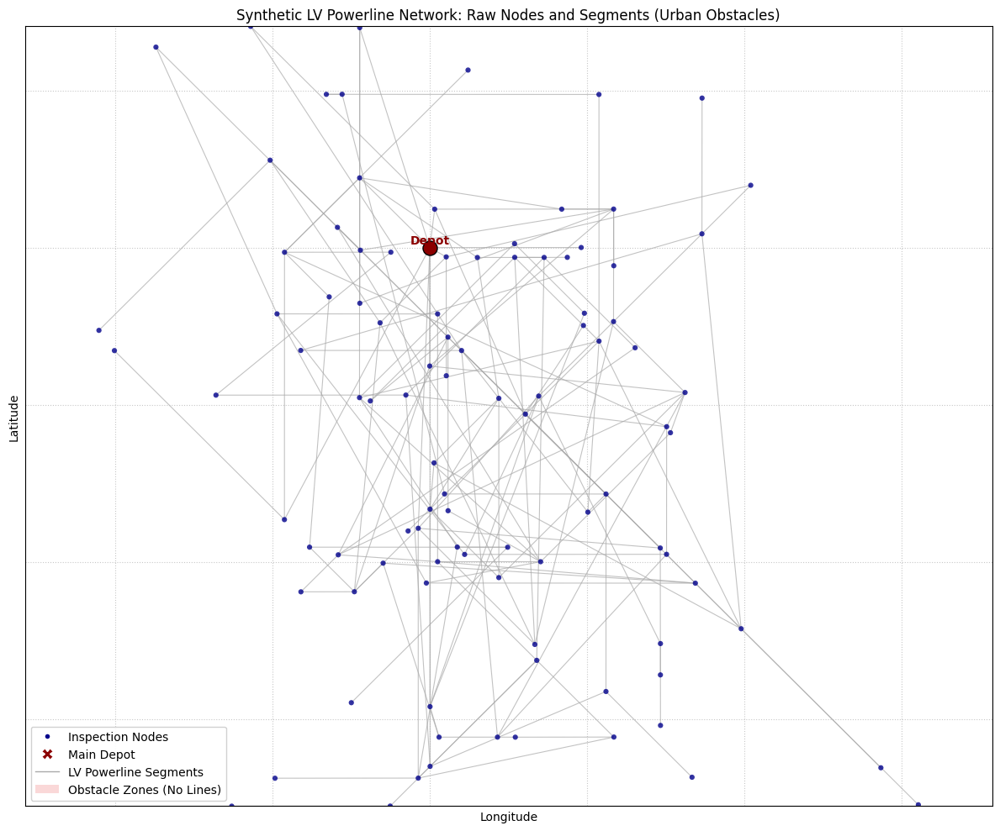

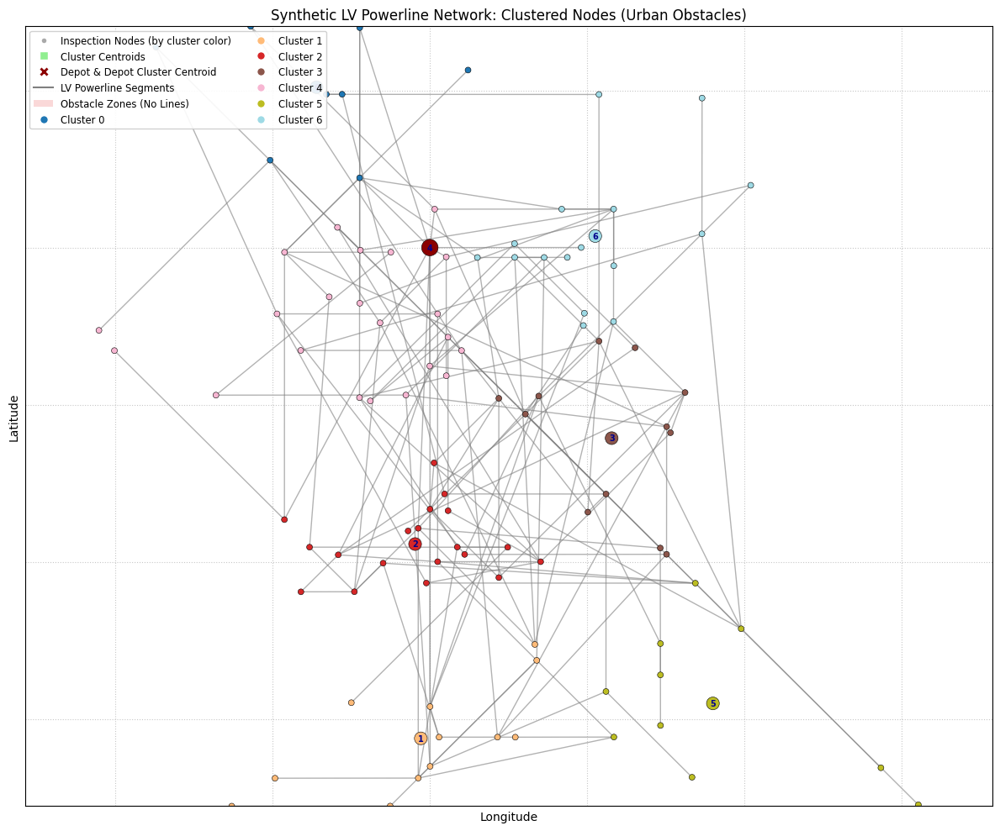

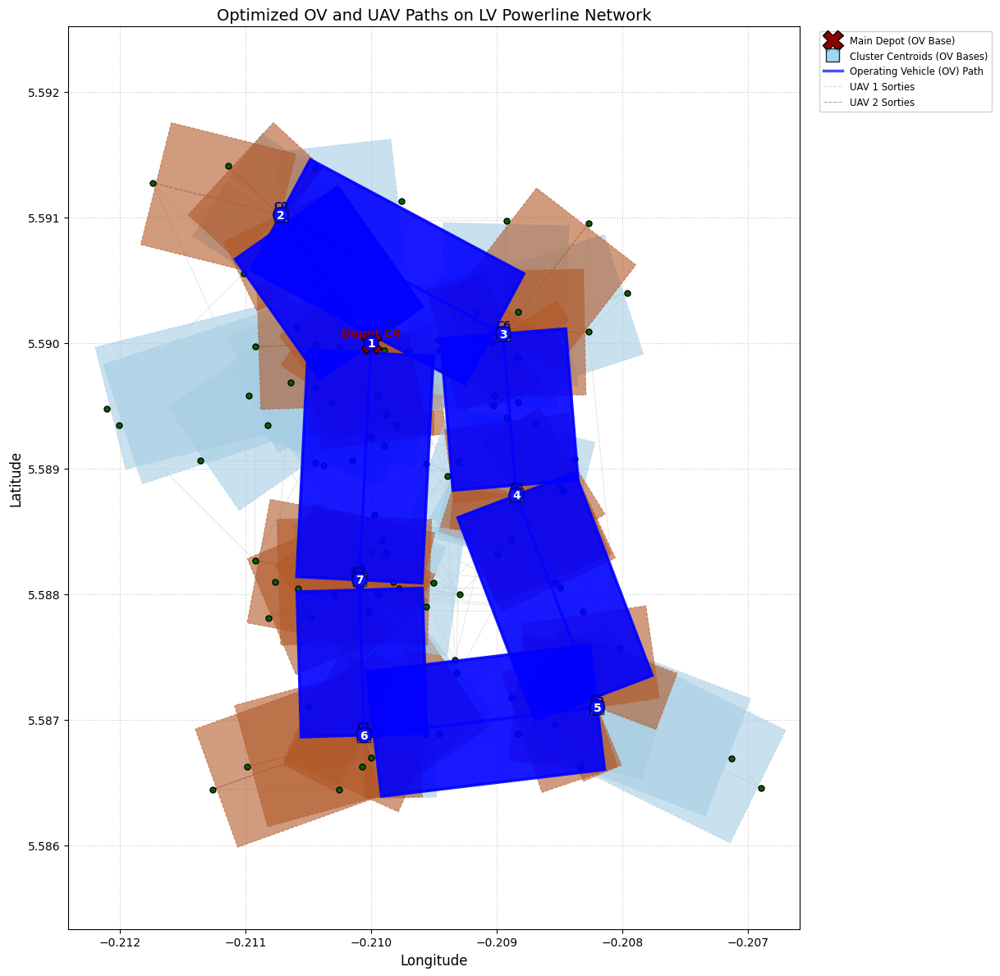


--- Optimal Path Details ---
Best Total Path Cost: 14.71 km

OV Best Path Order (Cluster IDs):
DEPOT(4) -> C0 -> C6 -> C3 -> C5 -> C1 -> C2 -> DEPOT(4)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 4 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C4 -> 28 -> OV_C4; OV_C4 -> 92 -> OV_C4; OV_C4 -> 71 -> OV_C4; OV_C4 -> 54 -> OV_C4; OV_C4 -> 48 -> OV_C4; OV_C4 -> 77 -> OV_C4; OV_C4 -> 53 -> OV_C4; OV_C4 -> 16 -> OV_C4; OV_C4 -> 95 -> OV_C4; OV_C4 -> 5 -> OV_C4; OV_C4 -> 74 -> OV_C4; OV_C4 -> 64 -> OV_C4
    UAV 1: OV_C4 -> 33 -> OV_C4; OV_C4 -> 73 -> OV_C4; OV_C4 -> 43 -> OV_C4; OV_C4 -> 55 -> OV_C4; OV_C4 -> 91 -> OV_C4; OV_C4 -> 0 -> OV_C4; OV_C4 -> 39 -> OV_C4; OV_C4 -> 4 -> OV_C4; OV_C4 -> 38 -> OV_C4; OV_C4 -> 63 -> OV_C4; OV_C4 -> 17 -> OV_C4
  Cluster 0 (OV Base at [5.5910, -0.2107]):
    UAV 0: OV_C0 -> 90 -> OV_C0; OV_C0 -> 65 -> OV_C0; OV_C0 -> 31 -> OV_C0; OV_C0 -> 36 -> OV_C0
    UAV 1: OV_C0 -> 57 -> OV_C0; OV_C0 -> 26 -> OV_C0; OV_C0 ->

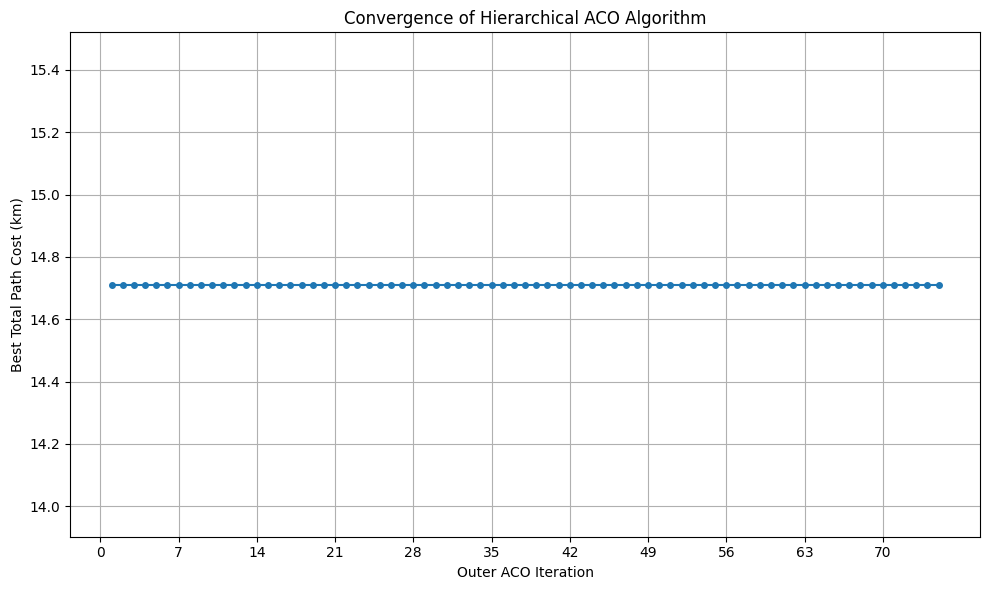

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
# This is crucial for saving data if you were to re-enable saving, but good practice for robustness.
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness but will NOT be executed in this setup) ---
# Define a smaller spatial region for an LV network (e.g., a neighborhood)
ACCRA_LAT_RANGE = 0.02 # Approx 2.2km for a neighborhood
ACCRA_LON_RANGE = 0.02 # Approx 2.2km for a neighborhood

DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Central Accra depot (retained)

ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2

# Realistic LV powerline segment lengths (10m to 200m)
MIN_LV_SEGMENT_KM = 0.01  # 10 meters
MAX_LV_SEGMENT_KM = 0.20  # 200 meters

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=8, obstacle_zone_size_factor=0.18, meshing_prob=0.01):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    The network growth is primarily linear/branching with strict obstacle avoidance, and minimal meshing.
    Designed to mimic the sparse, linear look of c16.png with LV segment lengths.
    (This function is included for completeness based on your provided code,
    but it will not be called in the current script setup as we load data.)
    """
    nodes = []
    edges = []
    current_node_id = 0

    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX

    # Add the depot node
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1

    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []

    obstacle_zones = []
    depot_zone_buffer = 0.002

    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)

        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon

            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1

    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False

    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False

    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001

    global_attempts = 0
    max_global_attempts = num_nodes * 500

    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1

        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)

        if from_node_id >= len(nodes): continue

        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']

        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2

        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))

        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))

        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break

            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)

            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))

            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset

            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue

            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)

            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue

            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)


    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)

    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue

            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])

            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)

    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}

    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)

    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph

    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))

    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0

    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))

    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    # The 'virtual depot' for UAVs is the cluster centroid (OV location)
    # This node is conceptually at index 0 for local calculations within the cluster ACO
    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster

    # Mapping from original node ID (from all_nodes_global) to its local index within 'local_nodes'
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}

    # Mapping from global node ID to its global index (for looking up in uav_distances_all)
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    # Populate local_uav_distances matrix.
    # Distances between real nodes (not virtual depot) are taken from precomputed global matrix.
    # Distances to/from virtual depot are direct Haversine.
    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            # If either node is the virtual depot (index 0 in local_nodes)
            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else: # Between two actual inspection nodes within the cluster
                # Use precomputed global shortest distances from uav_distances_all
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    # Initialize pheromones and heuristics for UAVs within this cluster
    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {} # Stores original IDs for routes

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)} # Routes for each UAV (original IDs)

        # Nodes that still need to be inspected in this cluster (local indices)
        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            # Cost for this single sortie: Depot -> Node -> Depot
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                # This node is reachable. Assign it to one of the UAVs.
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}" # Identifier for the OV in the route
                target_original_id = local_nodes[node_local_idx]['id']

                # Append the full round trip: OV_ID -> TARGET_NODE_ID -> OV_ID
                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        # An ant's tour is only valid if all nodes in the cluster were successfully assigned
        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf') # Mark as invalid tour

        # Pheromone Update
        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            # Only update pheromones for successful routes
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3): # Iterate over (OV->Node->OV) segments
                    if i + 1 < len(q_route_original_ids):
                        # 'u_local' is always 0 (virtual depot)
                        # 'v_local' is the target inspection node's local index
                        v_original_id = q_route_original_ids[i+1] # Get target node's original ID
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            # Deposit pheromone on the path between virtual depot (0) and target node (v_local)
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add # Symmetric update for return path

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        # If no valid solution found, return 0 cost if no nodes in cluster, else inf
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}


    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx) # Complete the tour by returning to depot

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id] # Using all_clusters_data directly

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title("Synthetic LV Powerline Network: Clustered Nodes (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.2, zorder=0)
        ax.add_patch(rect)

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS) # Corrected back to original
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        # Corrected: Normalize uav_q to a 0-1 range for the colormap
                        if Q_UAVS > 1:
                            normalized_uav_q = uav_q / (Q_UAVS - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title("Optimized OV and UAV Paths on LV Powerline Network", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig("optimized_paths_ov_uav_synthetic_lv_enhanced.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    # Filter out the depot from the total inspectable nodes count
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1] # This is the actual node ID
                    if isinstance(target_node_id, int): # Ensure it's a valid node ID
                        covered_node_ids.add(target_node_id)

    # Only consider nodes that are actually part of the original inspectable set
    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0 # No nodes to inspect

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0 # No edges to cover

    # Create a set of all unique original powerline edges (canonical form)
    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    # Create a map from global node ID to coordinates for finding closest nodes
    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        # Find the closest physical node in the network to this OV base (centroid)
        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None: # Defensive check
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue # Skip if no closest node found (e.g., empty graph)

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1] # This is the actual node ID

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue # Skip if target_node_id is not a valid network node (e.g., if it's the OV_C string)

                    # Get shortest path along the network (uav_graph_nx) from proxy OV node to target node
                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        # This happens if there's no path between source and target in the graph
                        pass

    if not all_original_edges_canonical:
        return 0.0 # Prevent division by zero if there are no edges at all

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Main Execution Flow ---

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# Global variables (will be populated from the loaded dataset)
all_nodes = []
depot_actual_node_id = -1
generated_lv_edges = []
bbox_coords = (0, 0, 0, 0)
obstacle_zones_data = []
cluster_centroids = {} # This will be populated after clustering
depot_cluster_id = -1 # This will be set after clustering
uav_graph_nx = None # Global variable to store the NetworkX graph

# ACO and Simulation Parameters (will be loaded from the dataset)
N_NODES = 0
M_CLUSTERS = 0
Q_UAVS = 0
R_UAV_KM = 0.0
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Default, but mostly for network generation logic if used.
OV_ACO_PARAMS = {}
UAV_ACO_PARAMS = {}

# Results of ACO simulation (will be populated after running ACO)
best_overall_cost = float('inf')
best_ov_path_ids = []
best_uav_paths_in_clusters = {}
convergence_history = []


print("\n--- Mounting Google Drive and Loading Data ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    exit()

if not os.path.exists(SAVED_FILE_PATH):
    print(f"Error: Saved file not found at {SAVED_FILE_PATH}")
    print("Cannot proceed without the dataset. Please ensure the file exists at the specified path.")
    exit()

try:
    with open(SAVED_FILE_PATH, 'r') as f:
        loaded_data = json.load(f)

    # Load raw network data and parameters
    globals()['all_nodes'] = loaded_data['nodes']
    globals()['depot_actual_node_id'] = loaded_data['depot_actual_node_id']
    globals()['generated_lv_edges'] = loaded_data['generated_lv_edges']
    globals()['bbox_coords'] = loaded_data['bbox_coords']
    globals()['obstacle_zones_data'] = loaded_data['obstacle_zones_data']

    # Load simulation parameters
    if 'simulation_parameters' in loaded_data:
        sim_params = loaded_data['simulation_parameters']
        globals()['N_NODES'] = sim_params.get('N_NODES', N_NODES)
        globals()['M_CLUSTERS'] = sim_params.get('M_CLUSTERS', M_CLUSTERS)
        globals()['Q_UAVS'] = sim_params.get('Q_UAVS', Q_UAVS)
        globals()['R_UAV_KM'] = sim_params.get('R_UAV_KM', R_UAV_KM)
        globals()['OV_ACO_PARAMS'] = sim_params.get('OV_ACO_PARAMS', OV_ACO_PARAMS)
        globals()['UAV_ACO_PARAMS'] = sim_params.get('UAV_ACO_PARAMS', UAV_ACO_PARAMS)

    print("Initial dataset and simulation parameters loaded successfully.")
    print(f"Loaded simulation parameters: N_NODES={N_NODES}, M_CLUSTERS={M_CLUSTERS}, Q_UAVS={Q_UAVS}, R_UAV_KM={R_UAV_KM}")

except Exception as e:
    print(f"Error loading data from file: {e}")
    print("Please check the file content or path. Exiting.")
    exit()


# --- Re-execute K-Means Clustering on the loaded nodes ---
print(f"\nPerforming K-means clustering for {M_CLUSTERS} clusters on loaded data...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of loaded nodes ({len(all_nodes)}) is less than number of clusters requested ({M_CLUSTERS}). Adjusting M_CLUSTERS to number of nodes.")
    globals()['M_CLUSTERS'] = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes loaded. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label # Update original all_nodes with cluster_id
    clusters_data[label].append(all_nodes[i])

globals()['cluster_centroids'] = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

# Ensure the cluster containing the actual depot node is treated as THE depot cluster
depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
globals()['depot_cluster_id'] = depot_node_obj['cluster_id']

# Set the depot cluster's centroid to the exact ECG depot location for consistency
cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}"


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}
print("Clustering complete on loaded data.")

# --- Build UAV distances matrix using the loaded network data and store the graph ---
print("\nBuilding UAV distances matrix using NetworkX (shortest paths along loaded edges or penalized direct flight)...")
globals()['uav_distances_matrix'], globals()['uav_graph_nx'] = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_lv_edges)
print("UAV distances matrix and NetworkX graph built.")


# --- Run Hierarchical ACO using the loaded parameters and newly clustered/distanced data ---
print("\nRunning Hierarchical ACO algorithm with loaded parameters...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id,
    all_clusters_for_aco,
    all_nodes,
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM,
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- ACO Simulation Complete ---")
print(f"Total ACO Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- Running Evaluation Metrics ---
print("\n--- Running Evaluation Metrics ---")

# Calculate Node Coverage
node_coverage = calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters)
print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")

# Calculate Edge Coverage (requires the NetworkX graph)
if uav_graph_nx is not None:
    edge_coverage = calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")
else:
    print("Cannot calculate Edge Coverage: NetworkX graph (uav_graph_nx) not available. This should not happen if previous steps ran correctly.")


# --- Common Visualization and Analysis Steps ---

# Re-derive/ensure these variables are consistent for plotting regardless of source
plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}"
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id)
    centroid_plot_ids_map[c_id] = plot_id

# Corrected colormap retrieval for discrete colors
cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)


print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# 1. Plot raw network (before clustering, showing loaded network)
plot_raw_powerline_network(all_nodes, generated_lv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data)


# 2. Plot clustered network (showing loaded network with newly applied clustering)
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data)

# 3. Plot best paths after ACO (showing results from the newly run ACO)
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print(f"Best Total Path Cost: {best_overall_cost:.2f} km")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
if isinstance(convergence_history, (list, np.ndarray)):
    plt.plot(range(1, len(convergence_history) + 1), convergence_history, marker='o', linestyle='-', markersize=4)
    plt.title('Convergence of Hierarchical ACO Algorithm')
    plt.xlabel('Outer ACO Iteration')
    plt.ylabel('Best Total Path Cost (km)')
    plt.grid(True)
    plt.xticks(np.arange(0, len(convergence_history) + 1, max(1, len(convergence_history) // 10)))
    plt.tight_layout()
    plt.savefig("aco_convergence_plot_synthetic_lv.png")
    print("Convergence plot saved to aco_convergence_plot_synthetic_lv.png")
    plt.show()
else:
    print("Convergence history data is not in a plottable format. Skipping convergence plot.")


Generate More Realistic Dataset



--- Mounting Google Drive ---
Google Drive already mounted.

--- Loading Data from Google Drive ---
Data loaded successfully.
Loaded simulation parameters: N_NODES=100, M_CLUSTERS=7, Q_UAVS=2, R_UAV_KM=5.0

Performing K-means clustering for 7 clusters on data...
Clustering complete.

Building UAV distances matrix and NetworkX graph...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.01 seconds.
UAV distances matrix and NetworkX graph built.

Running Hierarchical ACO algorithm...


/tmp/ipython-input-26-3341508244.py:51: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)



--- ACO Simulation Complete ---
Total ACO Runtime: 10.62 seconds
Best Total Path Cost: 19.88 km

--- Running Evaluation Metrics ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 96.19% of LV powerline segments traversed.

--- Visualizing Results with NetworkX and Matplotlib ---


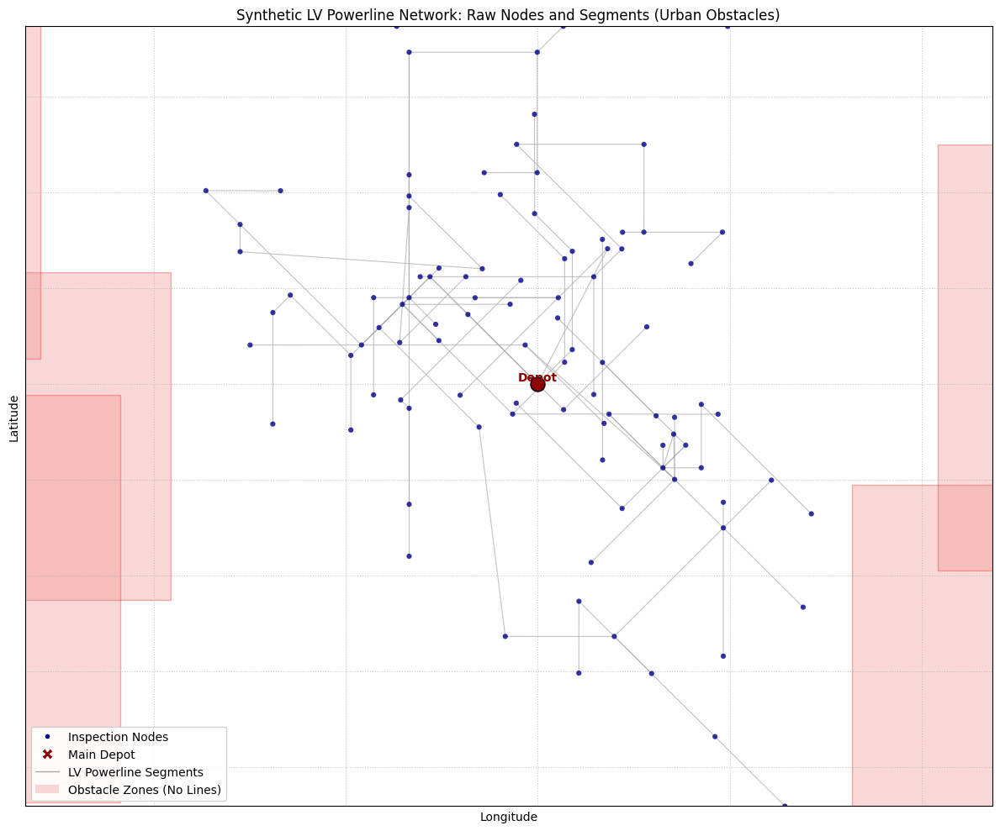

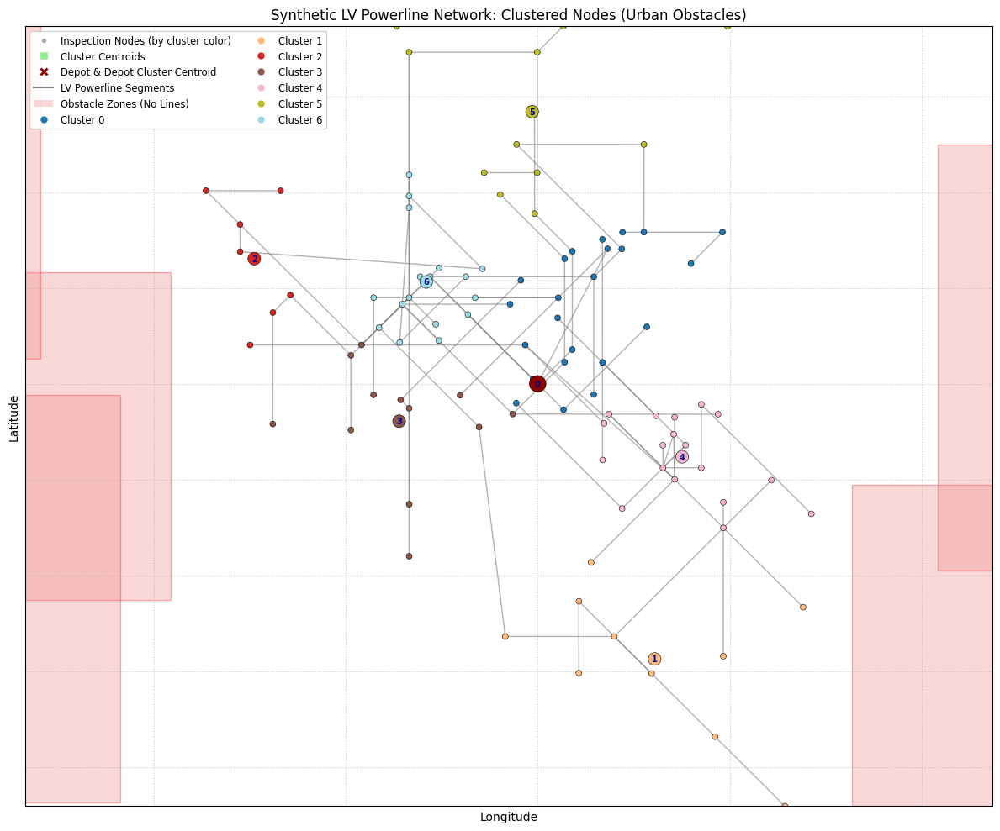

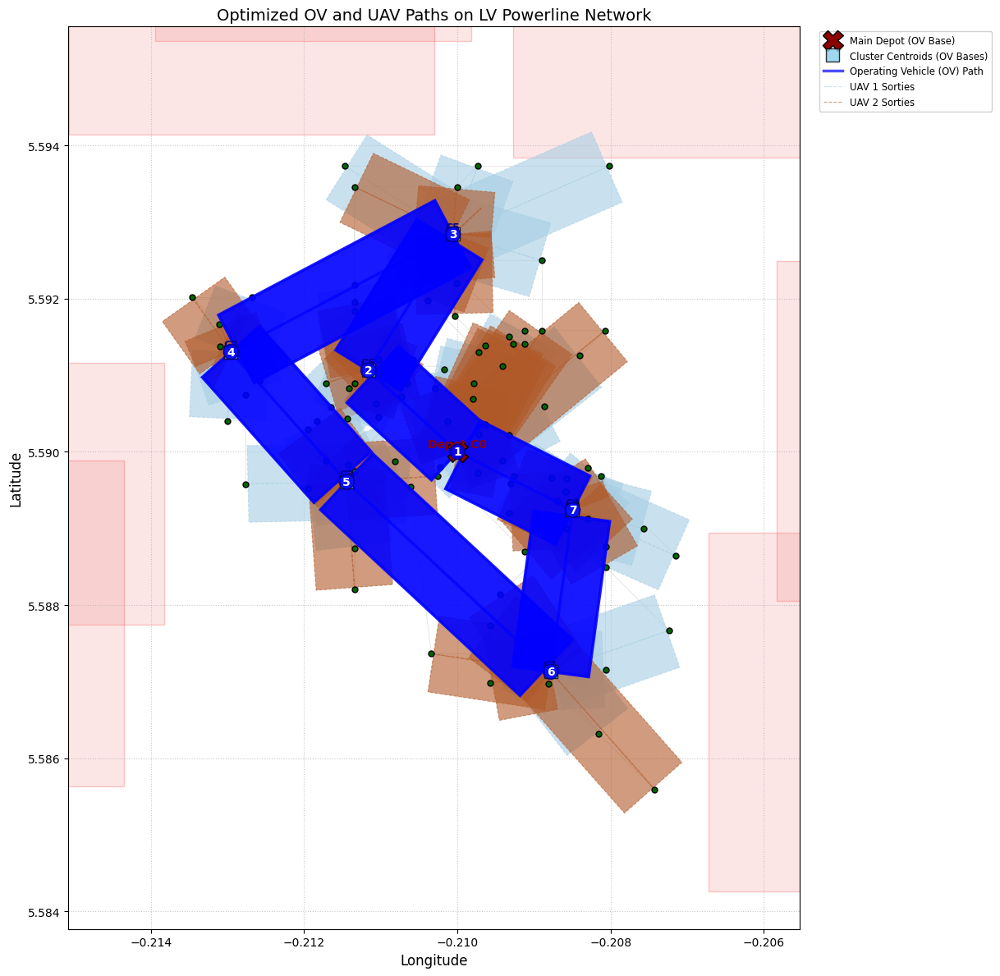


--- Optimal Path Details ---
Best Total Path Cost: 19.88 km

OV Best Path Order (Cluster IDs):
DEPOT(0) -> C6 -> C5 -> C2 -> C3 -> C1 -> C4 -> DEPOT(0)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 0 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C0 -> 76 -> OV_C0; OV_C0 -> 11 -> OV_C0; OV_C0 -> 85 -> OV_C0; OV_C0 -> 87 -> OV_C0; OV_C0 -> 10 -> OV_C0; OV_C0 -> 51 -> OV_C0; OV_C0 -> 21 -> OV_C0; OV_C0 -> 50 -> OV_C0; OV_C0 -> 43 -> OV_C0; OV_C0 -> 89 -> OV_C0; OV_C0 -> 72 -> OV_C0; OV_C0 -> 0 -> OV_C0
    UAV 1: OV_C0 -> 84 -> OV_C0; OV_C0 -> 48 -> OV_C0; OV_C0 -> 12 -> OV_C0; OV_C0 -> 86 -> OV_C0; OV_C0 -> 20 -> OV_C0; OV_C0 -> 81 -> OV_C0; OV_C0 -> 70 -> OV_C0; OV_C0 -> 33 -> OV_C0; OV_C0 -> 22 -> OV_C0; OV_C0 -> 27 -> OV_C0; OV_C0 -> 38 -> OV_C0; OV_C0 -> 35 -> OV_C0
  Cluster 6 (OV Base at [5.5911, -0.2112]):
    UAV 0: OV_C6 -> 93 -> OV_C6; OV_C6 -> 54 -> OV_C6; OV_C6 -> 60 -> OV_C6; OV_C6 -> 95 -> OV_C6; OV_C6 -> 18 -> OV_C6; OV_C6 -> 9 -> OV

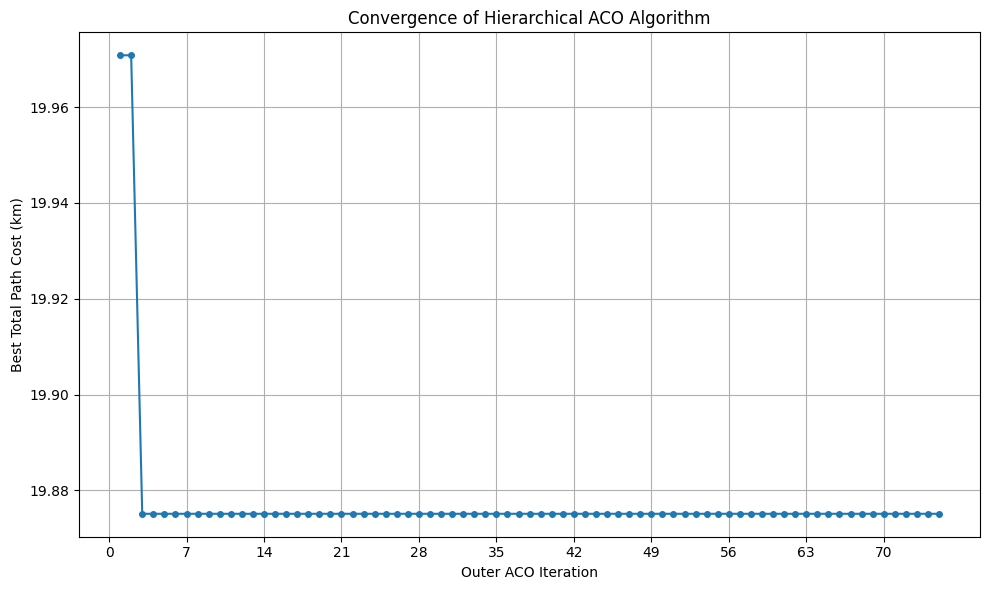

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- UPDATED for LV: Generate Realistic LV Powerline Network (c16.png style) ---
# Define a smaller spatial region for an LV network (e.g., a neighborhood)
ACCRA_LAT_RANGE = 0.02 # Approx 2.2km for a neighborhood
ACCRA_LON_RANGE = 0.02 # Approx 2.2km for a neighborhood

DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1} # Central Accra depot (retained)

ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2

# Realistic LV powerline segment lengths (10m to 200m)
MIN_LV_SEGMENT_KM = 0.01  # 10 meters
MAX_LV_SEGMENT_KM = 0.20  # 200 meters

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    The network growth is primarily linear/branching with strict obstacle avoidance, and minimal meshing.
    Designed to mimic the sparse, linear look of c16.png with LV segment lengths.

    Args:
        num_nodes (int): The total number of nodes to generate.
        num_obstacle_zones (int): Number of rectangular zones where nodes/edges are forbidden.
                                  Increased to encourage more structured urban layout.
        obstacle_zone_size_factor (float): Relative size of obstacle zones.
                                           Slightly increased for larger "blocks".
        meshing_prob (float): Base probability for attempting to create additional mesh connections.
                              **Significantly reduced** for a more linear/tree-like structure (as in c16.png)
                              and fewer triangular grids/crossings.

    Returns:
        tuple: (nodes, depot_id, edges, bbox, obstacle_zones_data)
    """
    nodes = []
    edges = []
    current_node_id = 0

    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX

    # Add the depot node
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1

    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []

    # --- Define Obstacle Zones (randomly placed, non-overlapping with depot) ---
    obstacle_zones = []
    depot_zone_buffer = 0.002 # A small buffer around depot to avoid placing obstacles too close

    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)

        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon

            # Check for overlap with depot (and a small buffer around it)
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break # Zone successfully placed
            attempts += 1


    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False

    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        # Check multiple points along the edge, not just midpoint
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False

    # Store nodes that can be expanded from
    expandable_nodes = [depot_node_id]

    # Define angles for growth, favoring cardinal/diagonal for a slightly structured feel
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]

    # Small jitter for a more natural, less perfectly straight appearance
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001

    # --- Iterative Node Generation and Connection (Linear Growth with Obstacle Avoidance) ---
    global_attempts = 0
    max_global_attempts = num_nodes * 500 # Many attempts for denser LV networks

    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1

        if not expandable_nodes:
            # If active expandable nodes run out, try a random node.
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            # Prioritize expanding from a random active node
            from_node_id = random.choice(expandable_nodes) # Use random.choice to allow reuse

        if from_node_id >= len(nodes): continue # Ensure from_node_id is valid index

        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']

        # Try to extend primarily in 1 direction, with a small chance for a branch
        num_branches_attempt = 1
        if random.random() < 0.2: # Smaller chance to create a second branch for sparser look
            num_branches_attempt = 2

        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))

        if random.random() < 0.02: # Even smaller chance for a purely random angle
            chosen_angles.append(random.uniform(0, 2*np.pi))

        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break

            # Segment length tailored for LV
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)

            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))

            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset

            # Apply jitter
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)

            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))

            # --- Strict Obstacle Zone Check ---
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue

            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)

            # Check if too close to an existing node (prevent clumping)
            is_too_close = False
            for existing_node in nodes:
                # Use a slightly smaller tolerance than min segment length
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue

            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                # If segment could not be added, ensure the 'from_node_id' remains expandable
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)


    # --- Add Meshing Connections (Very Low Probability and Strict Obstacle Avoidance) ---
    # Create a graph to check for existing connections and prevent multi-edges
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)

    # Use the meshing_prob from function arguments (now very low for c16.png style)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue

            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])

            # Allow mesh connections within a slightly larger range, still adhering to LV scale
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)

    # Re-index nodes and edges to ensure IDs are contiguous from 0
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}

    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)

    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph

    # Remove duplicate edges and ensure unique (u,v) pairs
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))

    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0

    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))

    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    # The 'virtual depot' for UAVs is the cluster centroid (OV location)
    # This node is conceptually at index 0 for local calculations within the cluster ACO
    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster

    # Mapping from original node ID (from all_nodes_global) to its local index within 'local_nodes'
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}

    # Mapping from global node ID to its global index (for looking up in uav_distances_all)
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    # Populate local_uav_distances matrix.
    # Distances between real nodes (not virtual depot) are taken from precomputed global matrix.
    # Distances to/from virtual depot are direct Haversine.
    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            # If either node is the virtual depot (index 0 in local_nodes)
            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else: # Between two actual inspection nodes within the cluster
                # Use precomputed global shortest distances from uav_distances_all
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    # Initialize pheromones and heuristics for UAVs within this cluster
    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {} # Stores original IDs for routes

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)} # Routes for each UAV (original IDs)

        # Nodes that still need to be inspected in this cluster (local indices)
        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            # Cost for this single sortie: Depot -> Node -> Depot
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                # This node is reachable. Assign it to one of the UAVs.
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}" # Identifier for the OV in the route
                target_original_id = local_nodes[node_local_idx]['id']

                # Append the full round trip: OV_ID -> TARGET_NODE_ID -> OV_ID
                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        # An ant's tour is only valid if all nodes in the cluster were successfully assigned
        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf') # Mark as invalid tour

        # Pheromone Update
        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            # Only update pheromones for successful routes
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3): # Iterate over (OV->Node->OV) segments
                    if i + 1 < len(q_route_original_ids):
                        # 'u_local' is always 0 (virtual depot)
                        # 'v_local' is the target inspection node's local index
                        v_original_id = q_route_original_ids[i+1] # Get target node's original ID
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            # Deposit pheromone on the path between virtual depot (0) and target node (v_local)
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add # Symmetric update for return path

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        # If no valid solution found, return 0 cost if no nodes in cluster, else inf
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}


    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx) # Complete the tour by returning to depot

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title("Synthetic LV Powerline Network: Clustered Nodes (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.2, zorder=0)
        ax.add_patch(rect)

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS)
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS > 1:
                            normalized_uav_q = uav_q / (Q_UAVS - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title("Optimized OV and UAV Paths on LV Powerline Network", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig("optimized_paths_ov_uav_synthetic_lv_enhanced.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Main Execution Flow ---

# Configuration: Set to False to generate a new network with improved LV characteristics.
# Set to True to load a previously saved dataset (e.g., one generated with the improved settings).
LOAD_FROM_SAVED_DATASET = True # <--- SET THIS TO TRUE AFTER YOUR FIRST RUN TO LOAD SAVED DATA

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# Global variables (will be populated based on LOAD_FROM_SAVED_DATASET choice)
all_nodes = []
depot_actual_node_id = -1
generated_lv_edges = []
bbox_coords = (0, 0, 0, 0)
obstacle_zones_data = []
cluster_centroids = {}
depot_cluster_id = -1
uav_distances_matrix = None # Will store the numpy distance matrix
uav_graph_nx = None # Will store the NetworkX graph for edge coverage

# ACO and Simulation Parameters (defaults or loaded)
N_NODES = 100
M_CLUSTERS = 7
Q_UAVS = 2
R_UAV_KM = 5.0
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
OV_ACO_PARAMS = {
    'iters_ov': 75, 'n_ants_ov': 7, 'rho_ov': 0.1, 'alpha_ov': 1.0, 'beta_ov': 3.0, 'q_deposit_ov': 250.0, 'tau0_ov': 1.0
}
UAV_ACO_PARAMS = {
    'iters_uav': 50, 'n_ants_uav': 6, 'rho_uav': 0.1, 'alpha_uav': 1.0, 'beta_uav': 3.0, 'q_deposit_uav': 200.0, 'tau0_uav': 1.0
}

# Results of ACO simulation (will be populated after running ACO)
best_overall_cost = float('inf')
best_ov_path_ids = []
best_uav_paths_in_clusters = {}
convergence_history = []


print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    # Exit here if mounting fails, as we need drive access for both load and save
    exit()


if LOAD_FROM_SAVED_DATASET:
    print("\n--- Loading Data from Google Drive ---")
    if not os.path.exists(SAVED_FILE_PATH):
        print(f"Error: Saved file not found at {SAVED_FILE_PATH}")
        print("Please check the path or set LOAD_FROM_SAVED_DATASET to False to run a new simulation.")
        exit()

    try:
        with open(SAVED_FILE_PATH, 'r') as f:
            loaded_data = json.load(f)

        globals()['all_nodes'] = loaded_data['nodes']
        globals()['depot_actual_node_id'] = loaded_data['depot_actual_node_id']
        globals()['generated_lv_edges'] = loaded_data['generated_lv_edges']
        globals()['bbox_coords'] = loaded_data['bbox_coords']
        globals()['obstacle_zones_data'] = loaded_data['obstacle_zones_data']

        # Load simulation parameters if they were saved (important for context)
        if 'simulation_parameters' in loaded_data:
            sim_params = loaded_data['simulation_parameters']
            globals()['N_NODES'] = sim_params.get('N_NODES', N_NODES)
            globals()['M_CLUSTERS'] = sim_params.get('M_CLUSTERS', M_CLUSTERS)
            globals()['Q_UAVS'] = sim_params.get('Q_UAVS', Q_UAVS)
            globals()['R_UAV_KM'] = sim_params.get('R_UAV_KM', R_UAV_KM)
            globals()['OV_ACO_PARAMS'] = sim_params.get('OV_ACO_PARAMS', OV_ACO_PARAMS)
            globals()['UAV_ACO_PARAMS'] = sim_params.get('UAV_ACO_PARAMS', UAV_ACO_PARAMS)

        print("Data loaded successfully.")
        print(f"Loaded simulation parameters: N_NODES={N_NODES}, M_CLUSTERS={M_CLUSTERS}, Q_UAVS={Q_UAVS}, R_UAV_KM={R_UAV_KM}")

    except Exception as e:
        print(f"Error loading data from file: {e}")
        print("Please check the file content or path, or set LOAD_FROM_SAVED_DATASET to False.")
        exit()

else: # Run a new simulation and save it
    print("--- Running New Hierarchical ACO Simulation ---")

    print("Generating realistic Low-Voltage powerline nodes and segments (urban style)...")
    globals()['all_nodes'], globals()['depot_actual_node_id'], globals()['generated_lv_edges'], globals()['bbox_coords'], globals()['obstacle_zones_data'] = \
        generate_lv_powerline_network(N_NODES, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001)

    print(f"\n--- Generated Network Details ---")
    print(f"Number of Extracted Nodes (Inspection Points): {len(all_nodes)}")
    print(f"Number of Generated LV Powerline Segments (Edges): {len(generated_lv_edges)}")
    print(f"Geographical Bounding Box of Generated Network:")
    print(f"  Latitude: [{bbox_coords[0]:.4f}°N, {bbox_coords[1]:.4f}°N]")
    print(f"  Longitude: [{bbox_coords[2]:.4f}°E, {bbox_coords[3]:.4f}°E]")

    # Save the newly generated dataset immediately after generation
    print("\n--- Saving New Simulation Results to Google Drive ---")
    try:
        data_to_save_raw = {
            "nodes": all_nodes,
            "depot_actual_node_id": depot_actual_node_id,
            "generated_lv_edges": generated_lv_edges,
            "bbox_coords": bbox_coords,
            "obstacle_zones_data": obstacle_zones_data,
            # Placeholder for cluster_centroids and ACO results, these will be populated after ACO runs
            "cluster_centroids": {},
            "best_ov_path_ids": [],
            "best_uav_paths_in_clusters": {},
            "best_overall_cost": float('inf'),
            "convergence_history": [],
            "simulation_parameters": {
                "N_NODES": N_NODES,
                "M_CLUSTERS": M_CLUSTERS,
                "Q_UAVS": Q_UAVS,
                "R_UAV_KM": R_UAV_KM,
                "OV_ACO_PARAMS": OV_ACO_PARAMS,
                "UAV_ACO_PARAMS": UAV_ACO_PARAMS
            }
        }
        data_to_save_converted = convert_numpy_types(data_to_save_raw)

        drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
        full_file_path = os.path.join(drive_folder_path, "temp_LV_generated_network.json") # Save as temp first
        os.makedirs(drive_folder_path, exist_ok=True)

        print(f"Saving generated network to: {full_file_path}")
        with open(full_file_path, 'w') as f:
            json.dump(data_to_save_converted, f, indent=4)
        print("Generated network successfully saved temporarily.")
    except Exception as e:
        print(f"Error saving generated data temporarily: {e}")


# --- Clustering, ACO, Evaluation, and Visualization (Common to both paths) ---

# --- Re-execute K-Means Clustering on the loaded/generated nodes ---
print(f"\nPerforming K-means clustering for {M_CLUSTERS} clusters on data...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of nodes ({len(all_nodes)}) is less than number of clusters requested ({M_CLUSTERS}). Adjusting M_CLUSTERS to number of nodes.")
    globals()['M_CLUSTERS'] = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes available. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label
    clusters_data[label].append(all_nodes[i])

globals()['cluster_centroids'] = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
globals()['depot_cluster_id'] = depot_node_obj['cluster_id']

cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}"


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}
print("Clustering complete.")

# --- Build UAV distances matrix using the loaded/generated network data and store the graph ---
print("\nBuilding UAV distances matrix and NetworkX graph...")
globals()['uav_distances_matrix'], globals()['uav_graph_nx'] = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_lv_edges)
print("UAV distances matrix and NetworkX graph built.")


# --- Run Hierarchical ACO ---
print("\nRunning Hierarchical ACO algorithm...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id,
    all_clusters_for_aco,
    all_nodes,
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM,
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- ACO Simulation Complete ---")
print(f"Total ACO Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- Running Evaluation Metrics ---
print("\n--- Running Evaluation Metrics ---")

node_coverage = calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters)
print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")

if uav_graph_nx is not None:
    edge_coverage = calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")
else:
    print("Cannot calculate Edge Coverage: NetworkX graph (uav_graph_nx) not available.")


# --- Save final results (only if running a new simulation) ---
if not LOAD_FROM_SAVED_DATASET:
    print("\n--- Updating and Saving Final Simulation Results to Google Drive ---")
    try:
        final_data_to_save_raw = {
            "nodes": all_nodes,
            "depot_actual_node_id": depot_actual_node_id,
            "generated_lv_edges": generated_lv_edges,
            "bbox_coords": bbox_coords,
            "obstacle_zones_data": obstacle_zones_data,
            "cluster_centroids": cluster_centroids,
            "best_ov_path_ids": best_ov_path_ids,
            "best_uav_paths_in_clusters": best_uav_paths_in_clusters,
            "best_overall_cost": best_overall_cost,
            "convergence_history": convergence_history,
            "simulation_parameters": {
                "N_NODES": N_NODES,
                "M_CLUSTERS": M_CLUSTERS,
                "Q_UAVS": Q_UAVS,
                "R_UAV_KM": R_UAV_KM,
                "OV_ACO_PARAMS": OV_ACO_PARAMS,
                "UAV_ACO_PARAMS": UAV_ACO_PARAMS
            }
        }
        final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

        drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
        full_file_path = os.path.join(drive_folder_path, "ACO_LV_Network_Simulation_dataset.json") # Save as final file

        # Overwrite the temp file with the complete results
        print(f"Saving final simulation results to: {full_file_path}")
        with open(full_file_path, 'w') as f:
            json.dump(final_data_to_save_converted, f, indent=4)
        print("Final data successfully saved to Google Drive!")
        print(f"File location: {full_file_path}")
    except Exception as e:
        print(f"Error saving final data to file: {e}")


# --- Common Visualization and Analysis Steps ---

plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}"
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id)
    centroid_plot_ids_map[c_id] = plot_id

cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)


print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# 1. Plot raw network (before clustering, showing loaded/generated network)
plot_raw_powerline_network(all_nodes, generated_lv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data)


# 2. Plot clustered network (showing loaded/generated network with newly applied clustering)
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data)

# 3. Plot best paths after ACO (showing results from the newly run ACO)
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print(f"Best Total Path Cost: {best_overall_cost:.2f} km")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
if isinstance(convergence_history, (list, np.ndarray)):
    plt.plot(range(1, len(convergence_history) + 1), convergence_history, marker='o', linestyle='-', markersize=4)
    plt.title('Convergence of Hierarchical ACO Algorithm')
    plt.xlabel('Outer ACO Iteration')
    plt.ylabel('Best Total Path Cost (km)')
    plt.grid(True)
    plt.xticks(np.arange(0, len(convergence_history) + 1, max(1, len(convergence_history) // 10)))
    plt.tight_layout()
    plt.savefig("aco_convergence_plot_synthetic_lv.png")
    print("Convergence plot saved to aco_convergence_plot_synthetic_lv.png")
    plt.show()
else:
    print("Convergence history data is not in a plottable format. Skipping convergence plot.")


check silhouette score


--- Mounting Google Drive ---
Google Drive already mounted.

--- Loading Network Data from Google Drive ---
Network data loaded successfully. ACO parameters are defined in the code.

--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---
Testing K from 1 to 15 for Elbow Method, and 2 to 15 for Silhouette Score.

Running Elbow Method...


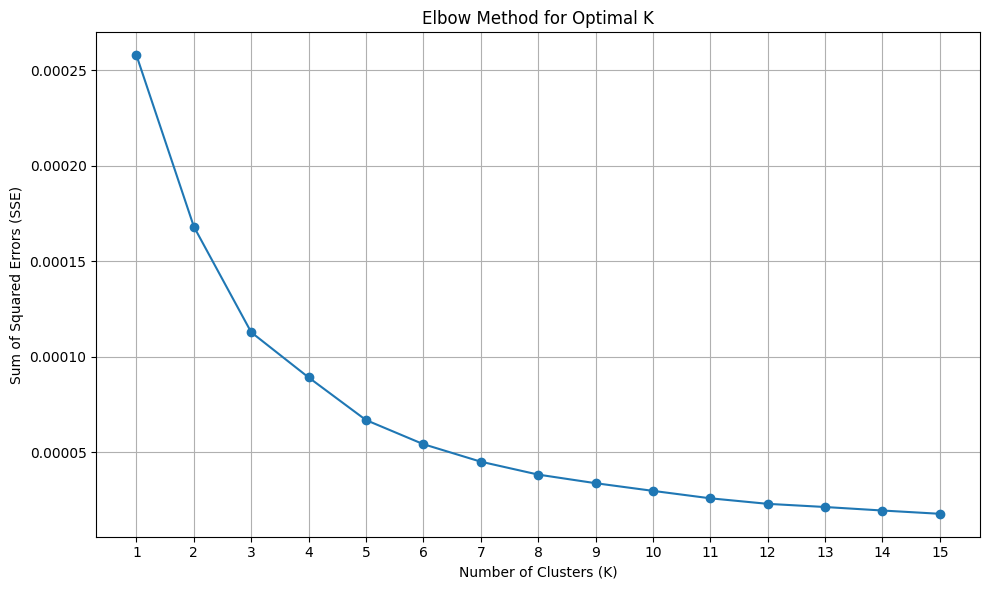

Elbow Method plot saved to kmeans_elbow_method.png
Suggested K from Elbow Method (heuristic): 2

Running Silhouette Score analysis...


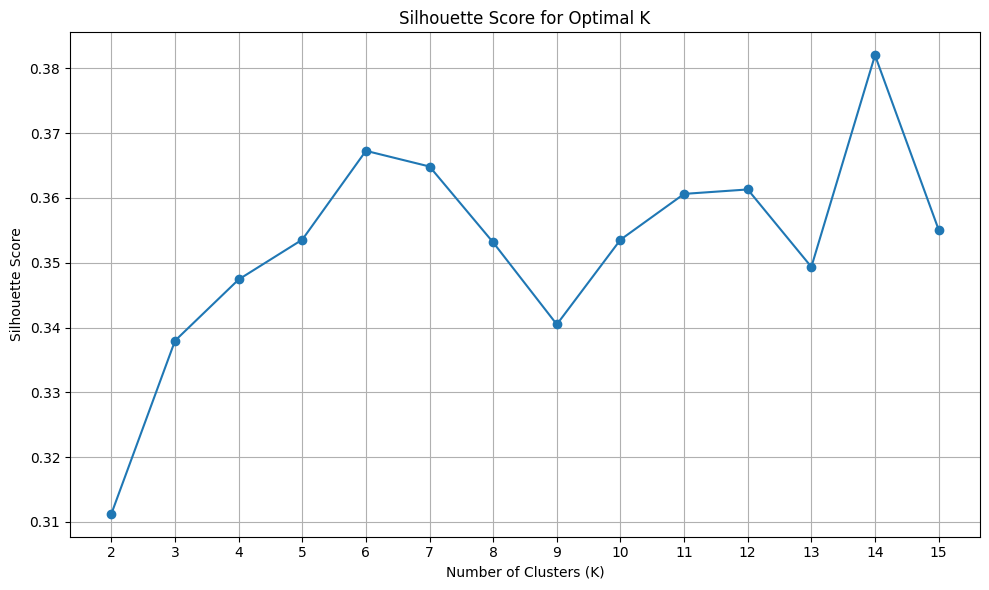

Silhouette Score plot saved to kmeans_silhouette_score.png
Suggested K from Silhouette Score: 14

--- K-Means Cluster Analysis Complete ---

Review the plots above to determine the optimal number of clusters (K).
The ACO simulation will proceed using M_CLUSTERS = 14 (value set in code).
You can adjust M_CLUSTERS in the code if the analysis suggests a different value.

Performing K-means clustering with M_CLUSTERS = 14...
Clustering complete.

Building UAV distances matrix and NetworkX graph...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.08 seconds.
UAV distances matrix and NetworkX graph built.

Running Hierarchical ACO algorithm...


/tmp/ipython-input-6-1509563697.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)



--- ACO Simulation Complete ---
Total ACO Runtime: 18.92 seconds
Best Total Path Cost: 11.66 km

--- Running Evaluation Metrics ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 94.29% of LV powerline segments traversed.

--- Saving Final Simulation Results to Google Drive ---
Saving final simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Final data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json

--- Visualizing Results with NetworkX and Matplotlib ---


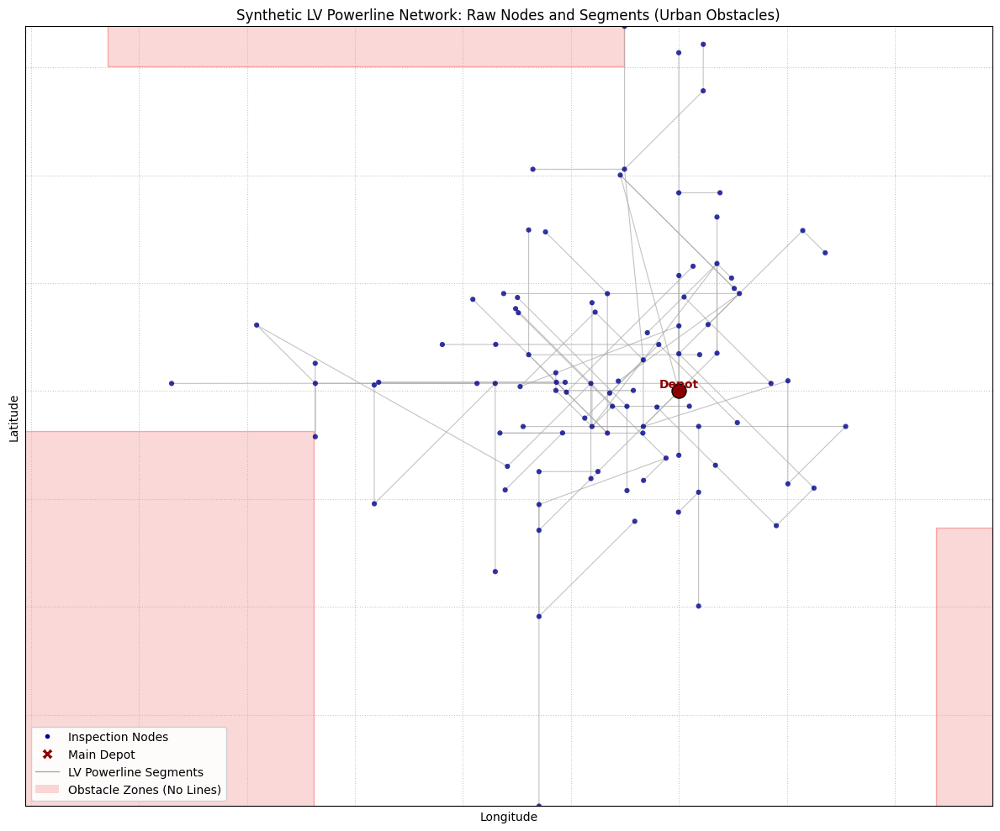

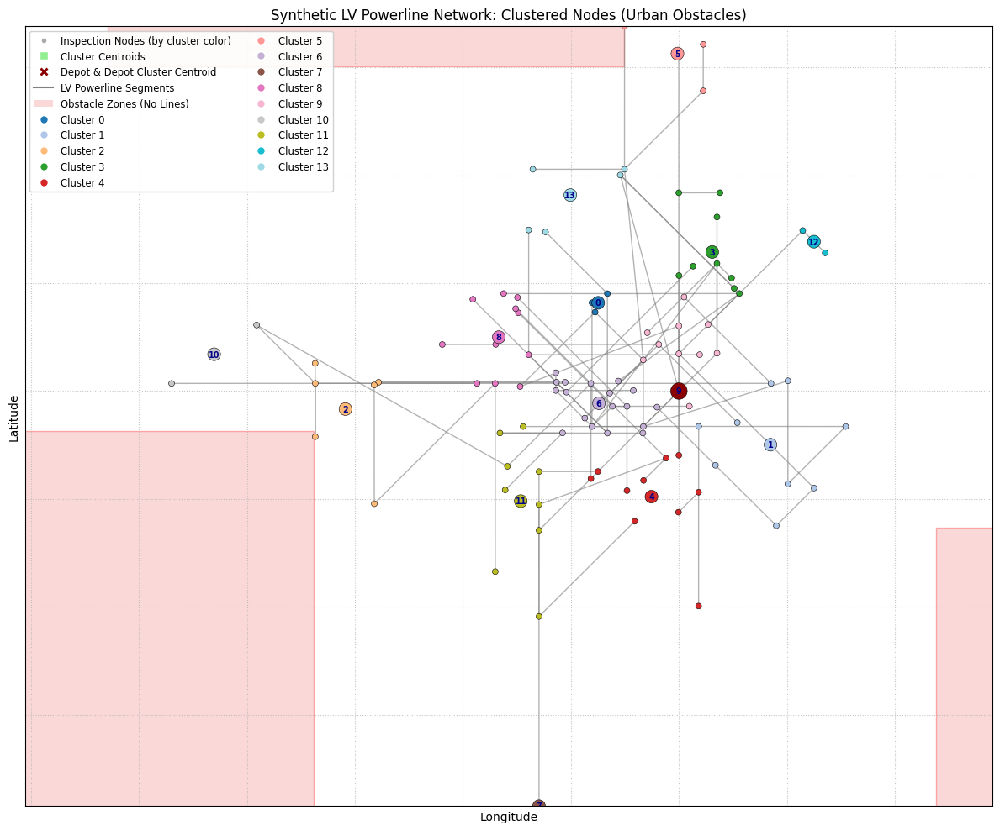

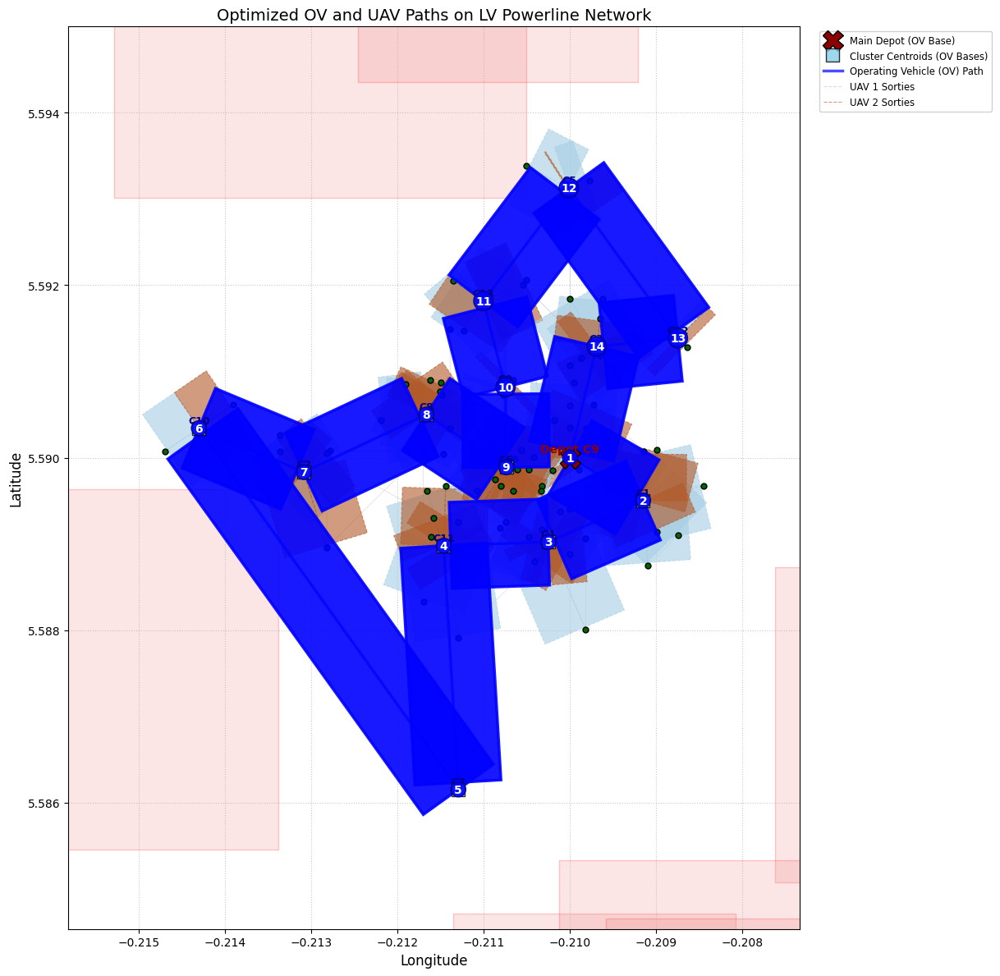


--- Optimal Path Details ---
Best Total Path Cost: 11.66 km

OV Best Path Order (Cluster IDs):
DEPOT(9) -> C1 -> C4 -> C11 -> C7 -> C10 -> C2 -> C8 -> C6 -> C0 -> C13 -> C5 -> C12 -> C3 -> DEPOT(9)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 9 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C9 -> 67 -> OV_C9; OV_C9 -> 27 -> OV_C9; OV_C9 -> 7 -> OV_C9; OV_C9 -> 6 -> OV_C9; OV_C9 -> 84 -> OV_C9; OV_C9 -> 25 -> OV_C9
    UAV 1: OV_C9 -> 40 -> OV_C9; OV_C9 -> 1 -> OV_C9; OV_C9 -> 91 -> OV_C9; OV_C9 -> 0 -> OV_C9; OV_C9 -> 44 -> OV_C9
  Cluster 1 (OV Base at [5.5895, -0.2092]):
    UAV 0: OV_C1 -> 28 -> OV_C1; OV_C1 -> 3 -> OV_C1; OV_C1 -> 34 -> OV_C1; OV_C1 -> 18 -> OV_C1; OV_C1 -> 12 -> OV_C1
    UAV 1: OV_C1 -> 56 -> OV_C1; OV_C1 -> 24 -> OV_C1; OV_C1 -> 14 -> OV_C1; OV_C1 -> 49 -> OV_C1
  Cluster 4 (OV Base at [5.5890, -0.2103]):
    UAV 0: OV_C4 -> 94 -> OV_C4; OV_C4 -> 78 -> OV_C4; OV_C4 -> 74 -> OV_C4; OV_C4 -> 8 -> OV_C4; OV_C4 -> 19 -> OV_C4


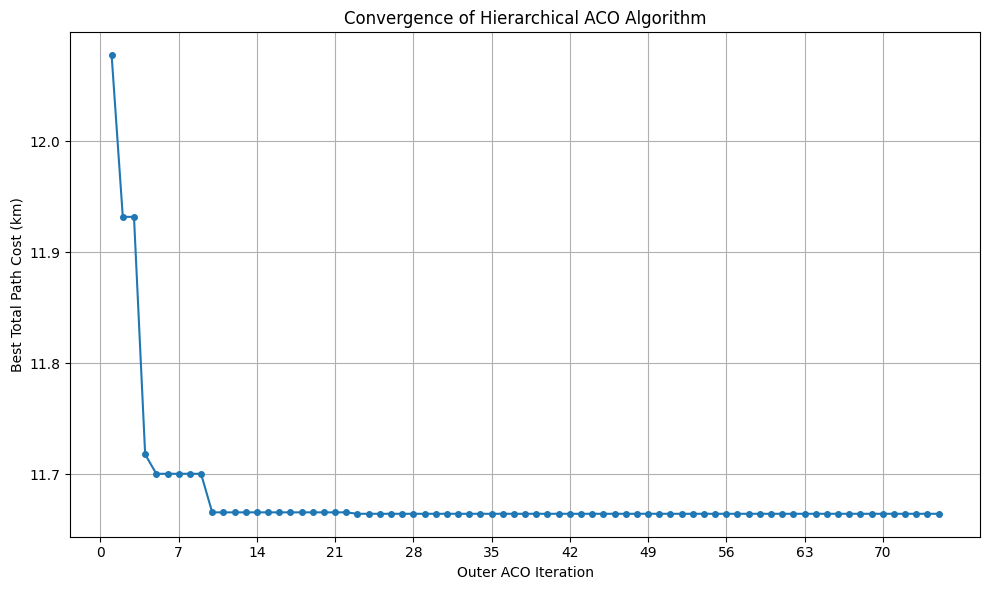

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness, but not used when LOAD_FROM_SAVED_DATASET is True) ---
ACCRA_LAT_RANGE = 0.02
ACCRA_LON_RANGE = 0.02
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2
MIN_LV_SEGMENT_KM = 0.01
MAX_LV_SEGMENT_KM = 0.20

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    This function is included for completeness but will not be called in this setup
    as LOAD_FROM_SAVED_DATASET is True.
    """
    nodes = []
    edges = []
    current_node_id = 0
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1
    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []
    obstacle_zones = []
    depot_zone_buffer = 0.002
    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1
    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False
    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False
    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001
    global_attempts = 0
    max_global_attempts = num_nodes * 500
    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1
        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)
        if from_node_id >= len(nodes): continue
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']
        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2
        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))
        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))
        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))
            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)
            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue
            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)
            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue
            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue
            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}
    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)
    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))
    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0
    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))
    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else:
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {}

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)}

        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf')

        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3):
                    if i + 1 < len(q_route_original_ids):
                        v_original_id = q_route_original_ids[i+1]
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}

    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx)

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title("Synthetic LV Powerline Network: Clustered Nodes (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.2, zorder=0)
        ax.add_patch(rect)

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS)
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS > 1:
                            normalized_uav_q = uav_q / (Q_UAVS - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title("Optimized OV and UAV Paths on LV Powerline Network", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig("optimized_paths_ov_uav_synthetic_lv_enhanced.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Optimal Cluster Analysis Functions (Elbow and Silhouette) ---

def plot_elbow_method(data_coords, max_clusters=15):
    """
    Plots the Elbow Method for K-Means to help determine optimal K.
    """
    sse = []
    if len(data_coords) < 1:
        print("Not enough data points for Elbow method.")
        return

    max_k_effective = min(max_clusters, len(data_coords))
    k_range = range(1, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(data_coords)
        sse.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.xticks(list(k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_elbow_method.png")
    plt.show()
    print("Elbow Method plot saved to kmeans_elbow_method.png")

    if len(sse) > 2:
        diffs = np.diff(sse)
        diff_of_diffs = np.diff(diffs)
        optimal_k_elbow = np.argmax(diff_of_diffs) + 2
        print(f"Suggested K from Elbow Method (heuristic): {optimal_k_elbow}")
    return sse

def plot_silhouette_score(data_coords, max_clusters=15):
    """
    Plots the Silhouette Score for K-Means to help determine optimal K.
    """
    silhouette_scores = []

    if len(data_coords) < 2:
        print("Not enough data points for Silhouette Score (requires at least 2).")
        return

    max_k_effective = min(max_clusters, len(data_coords) - 1)
    if max_k_effective < 2:
        print("Not enough data points to compute Silhouette Score for multiple clusters.")
        return

    k_range = range(2, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_coords)
        if len(set(labels)) < 2:
            silhouette_scores.append(-1)
            print(f"Skipping Silhouette for K={k} as only 1 cluster formed.")
            continue
        try:
            score = silhouette_score(data_coords, labels)
            silhouette_scores.append(score)
        except ValueError as e:
            print(f"Could not calculate Silhouette Score for K={k}: {e}")
            silhouette_scores.append(-1)

    if not silhouette_scores or all(s == -1 for s in silhouette_scores):
        print("No valid Silhouette Scores could be computed.")
        return

    valid_k_range = [k_range[i] for i, score in enumerate(silhouette_scores) if score != -1]
    valid_scores = [score for score in silhouette_scores if score != -1]

    if not valid_scores:
        print("No valid Silhouette Scores to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.plot(valid_k_range, valid_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.xticks(list(valid_k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_silhouette_score.png")
    plt.show()
    print("Silhouette Score plot saved to kmeans_silhouette_score.png")

    optimal_k_silhouette = valid_k_range[np.argmax(valid_scores)]
    print(f"Suggested K from Silhouette Score: {optimal_k_silhouette}")
    return silhouette_scores


# --- Main Execution Flow ---

# Configuration: Set to True to load from JSON, ACO parameters will be defined here.
# Set to False to generate a NEW network (ACO params here will be used for generation too).
LOAD_FROM_SAVED_DATASET = True

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# --- ACO and Simulation Parameters (DEFINED HERE, overriding any in JSON) ---
N_NODES = 100 # Number of nodes to consider for clustering/ACO (if generated or loaded)
M_CLUSTERS = 14 # <--- SET THIS VALUE MANUALLY AFTER REVIEWING THE ELBOW/SILHOUETTE PLOTS
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 5.0 # UAV flight range in km

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50, # Increased iterations for inner ACO
    'n_ants_uav': 6, # Increased ants for inner ACO
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0, # Slightly increased deposit
    'tau0_uav': 1.0
}
# --- END ACO and Simulation Parameters ---

# Global variables (will be populated based on LOAD_FROM_SAVED_DATASET choice)
all_nodes = []
depot_actual_node_id = -1
generated_lv_edges = []
bbox_coords = (0, 0, 0, 0)
obstacle_zones_data = []
cluster_centroids = {}
depot_cluster_id = -1
uav_distances_matrix = None
uav_graph_nx = None

# Results of ACO simulation (will be populated after running ACO)
best_overall_cost = float('inf')
best_ov_path_ids = []
best_uav_paths_in_clusters = {}
convergence_history = []


print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    exit()


if LOAD_FROM_SAVED_DATASET:
    print("\n--- Loading Network Data from Google Drive ---")
    if not os.path.exists(SAVED_FILE_PATH):
        print(f"Error: Saved file not found at {SAVED_FILE_PATH}")
        print("Please check the path or set LOAD_FROM_SAVED_DATASET to False to generate a new dataset.")
        exit()

    try:
        with open(SAVED_FILE_PATH, 'r') as f:
            loaded_data = json.load(f)

        globals()['all_nodes'] = loaded_data['nodes']
        globals()['depot_actual_node_id'] = loaded_data['depot_actual_node_id']
        globals()['generated_lv_edges'] = loaded_data['generated_lv_edges']
        globals()['bbox_coords'] = loaded_data['bbox_coords']
        globals()['obstacle_zones_data'] = loaded_data['obstacle_zones_data']

        # IMPORTANT: Simulation parameters are *not* loaded here, they are taken from code definitions above.

        print("Network data loaded successfully. ACO parameters are defined in the code.")

    except Exception as e:
        print(f"Error loading network data from file: {e}")
        print("Please check the file content or path, or set LOAD_FROM_SAVED_DATASET to False.")
        exit()

else: # Generate a new simulation dataset (network only)
    print("--- Generating NEW Network Data ---")
    print("Generating realistic Low-Voltage powerline nodes and segments (urban style)...")
    globals()['all_nodes'], globals()['depot_actual_node_id'], globals()['generated_lv_edges'], globals()['bbox_coords'], globals()['obstacle_zones_data'] = \
        generate_lv_powerline_network(N_NODES, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001)

    print(f"\n--- Generated Network Details ---")
    print(f"Number of Extracted Nodes (Inspection Points): {len(all_nodes)}")
    print(f"Number of Generated LV Powerline Segments (Edges): {len(generated_lv_edges)}")
    print(f"Geographical Bounding Box of Generated Network:")
    print(f"  Latitude: [{bbox_coords[0]:.4f}°N, {bbox_coords[1]:.4f}°N]")
    print(f"  Longitude: [{bbox_coords[2]:.4f}°E, {bbox_coords[3]:.4f}°E]")

# --- Perform Optimal K-Means Clustering Analysis ---
print("\n--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---")
coords_for_kmeans = np.array([[node['lat'], node['lon']] for node in all_nodes])

if len(coords_for_kmeans) == 0:
    print("No data points available for cluster analysis. Exiting.")
    exit()

max_clusters_to_test = min(len(coords_for_kmeans) - 1, 15)
if max_clusters_to_test < 2:
    print(f"Warning: Only {len(coords_for_kmeans)} nodes. Cannot perform comprehensive cluster analysis. Setting M_CLUSTERS to number of nodes.")
    globals()['M_CLUSTERS'] = len(coords_for_kmeans) if len(coords_for_kmeans) > 0 else 1
else:
    print(f"Testing K from 1 to {max_clusters_to_test} for Elbow Method, and 2 to {max_clusters_to_test} for Silhouette Score.")

    print("\nRunning Elbow Method...")
    plot_elbow_method(coords_for_kmeans, max_clusters=max_clusters_to_test)

    print("\nRunning Silhouette Score analysis...")
    plot_silhouette_score(coords_for_kmeans, max_clusters=max_clusters_to_test)

    print("\n--- K-Means Cluster Analysis Complete ---")
    print("\nReview the plots above to determine the optimal number of clusters (K).")
    print(f"The ACO simulation will proceed using M_CLUSTERS = {M_CLUSTERS} (value set in code).")
    print("You can adjust M_CLUSTERS in the code if the analysis suggests a different value.")


# --- Clustering (using the M_CLUSTERS value defined in the code) ---
print(f"\nPerforming K-means clustering with M_CLUSTERS = {M_CLUSTERS}...")
coords = np.array([[node['lat'], node['lon']] for node in all_nodes])


if len(all_nodes) < M_CLUSTERS:
    print(f"Warning: Number of nodes ({len(all_nodes)}) is less than M_CLUSTERS ({M_CLUSTERS}). Adjusting M_CLUSTERS to number of nodes.")
    globals()['M_CLUSTERS'] = len(all_nodes)
    if M_CLUSTERS == 0:
        print("Error: No nodes available for clustering. Exiting.")
        exit()

kmeans = KMeans(n_clusters=M_CLUSTERS, random_state=42, n_init=10)
kmeans.fit(coords)

clusters_data = {i: [] for i in range(M_CLUSTERS)}
for i, label in enumerate(kmeans.labels_):
    all_nodes[i]['cluster_id'] = label
    clusters_data[label].append(all_nodes[i])

globals()['cluster_centroids'] = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans.cluster_centers_)}

depot_node_obj = next(node for node in all_nodes if node['id'] == depot_actual_node_id)
globals()['depot_cluster_id'] = depot_node_obj['cluster_id']

cluster_centroids[depot_cluster_id]['lat'] = DEPOT_COORD['lat']
cluster_centroids[depot_cluster_id]['lon'] = DEPOT_COORD['lon']
cluster_centroids[depot_cluster_id]['id'] = f"D{depot_cluster_id}"


all_clusters_for_aco = {
    'centroids': cluster_centroids,
    'node_sets': clusters_data
}
print("Clustering complete.")

# --- Build UAV distances matrix and NetworkX graph ---
print("\nBuilding UAV distances matrix and NetworkX graph...")
globals()['uav_distances_matrix'], globals()['uav_graph_nx'] = build_uav_distances_matrix_from_edges_nx(all_nodes, generated_lv_edges)
print("UAV distances matrix and NetworkX graph built.")


# --- Run Hierarchical ACO ---
print("\nRunning Hierarchical ACO algorithm...")
start_time = time.time()
best_overall_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_history = solve_outer_aco(
    depot_cluster_id,
    all_clusters_for_aco,
    all_nodes,
    uav_distances_matrix,
    Q_UAVS,
    R_UAV_KM,
    OV_ACO_PARAMS,
    UAV_ACO_PARAMS
)
end_time = time.time()
runtime = end_time - start_time

print("\n--- ACO Simulation Complete ---")
print(f"Total ACO Runtime: {runtime:.2f} seconds")
print(f"Best Total Path Cost: {best_overall_cost:.2f} km")


# --- Running Evaluation Metrics ---
print("\n--- Running Evaluation Metrics ---")

node_coverage = calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters)
print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")

if uav_graph_nx is not None:
    edge_coverage = calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")
else:
    print("Cannot calculate Edge Coverage: NetworkX graph (uav_graph_nx) not available.")


# --- Save final results (this time including ACO params used) ---
print("\n--- Saving Final Simulation Results to Google Drive ---")
try:
    final_data_to_save_raw = {
        "nodes": all_nodes,
        "depot_actual_node_id": depot_actual_node_id,
        "generated_lv_edges": generated_lv_edges,
        "bbox_coords": bbox_coords,
        "obstacle_zones_data": obstacle_zones_data,
        "cluster_centroids": cluster_centroids,
        "best_ov_path_ids": best_ov_path_ids,
        "best_uav_paths_in_clusters": best_uav_paths_in_clusters,
        "best_overall_cost": best_overall_cost,
        "convergence_history": convergence_history,
        # Include the simulation parameters that were *actually used* in this run
        "simulation_parameters": {
            "N_NODES": N_NODES,
            "M_CLUSTERS": M_CLUSTERS, # This will be the value defined in code
            "Q_UAVS": Q_UAVS,
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

    drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
    full_file_path = os.path.join(drive_folder_path, "ACO_LV_Network_Simulation_dataset.json")

    print(f"Saving final simulation results to: {full_file_path}")
    with open(full_file_path, 'w') as f:
        json.dump(final_data_to_save_converted, f, indent=4)
    print("Final data successfully saved to Google Drive!")
    print(f"File location: {full_file_path}")
except Exception as e:
    print(f"Error saving final data to file: {e}")


# --- Common Visualization and Analysis Steps ---

plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

centroid_plot_ids_map = {}
for c_id, centroid in cluster_centroids.items():
    plot_id = f"C{c_id}"
    if c_id == depot_cluster_id:
        plot_id = f"DepotC{c_id}"
    plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
    node_labels_map[plot_id] = str(c_id)
    centroid_plot_ids_map[c_id] = plot_id

cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)


print("\n--- Visualizing Results with NetworkX and Matplotlib ---")

# 1. Plot raw network (before clustering, showing loaded/generated network)
plot_raw_powerline_network(all_nodes, generated_lv_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data)


# 2. Plot clustered network (showing loaded/generated network with newly applied clustering)
plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                    plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data)

# 3. Plot best paths after ACO (showing results from the newly run ACO)
plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges)

# --- 5. Display Optimal Path Results (Textual) ---
print("\n--- Optimal Path Details ---")

print(f"Best Total Path Cost: {best_overall_cost:.2f} km")

print("\nOV Best Path Order (Cluster IDs):")
ov_path_str_display = []
for c_id in best_ov_path_ids:
    if c_id == depot_cluster_id:
        ov_path_str_display.append(f"DEPOT({c_id})")
    else:
        ov_path_str_display.append(f"C{c_id}")

print(" -> ".join(ov_path_str_display))

print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
    centroid_display = cluster_centroids[cluster_id]
    print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
    for uav_q, route_nodes_ids in uav_routes.items():
        if route_nodes_ids:
            display_sorties = []
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")

            print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
        else:
            print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")


# --- 6. Convergence Analysis Visualization ---
print("\n--- Plotting Convergence Analysis ---")
plt.figure(figsize=(10, 6))
if isinstance(convergence_history, (list, np.ndarray)):
    plt.plot(range(1, len(convergence_history) + 1), convergence_history, marker='o', linestyle='-', markersize=4)
    plt.title('Convergence of Hierarchical ACO Algorithm')
    plt.xlabel('Outer ACO Iteration')
    plt.ylabel('Best Total Path Cost (km)')
    plt.grid(True)
    plt.xticks(np.arange(0, len(convergence_history) + 1, max(1, len(convergence_history) // 10)))
    plt.tight_layout()
    plt.savefig("aco_convergence_plot_synthetic_lv.png")
    print("Convergence plot saved to aco_convergence_plot_synthetic_lv.png")
    plt.show()
else:
    print("Convergence history data is not in a plottable format. Skipping convergence plot.")

VARYING CLUSTERS (2,4,6,8,10,12,14)


--- Mounting Google Drive ---
Google Drive already mounted.

--- Loading Network Data from Google Drive ---
Network data loaded successfully. ACO parameters are defined in the code.
Loaded network contains 100 nodes.

Building UAV distances matrix and NetworkX graph for the loaded network...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.03 seconds.
UAV distances matrix and NetworkX graph built.

--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---
Testing K from 1 to 15 for Elbow Method, and 2 to 15 for Silhouette Score.

Running Elbow Method...


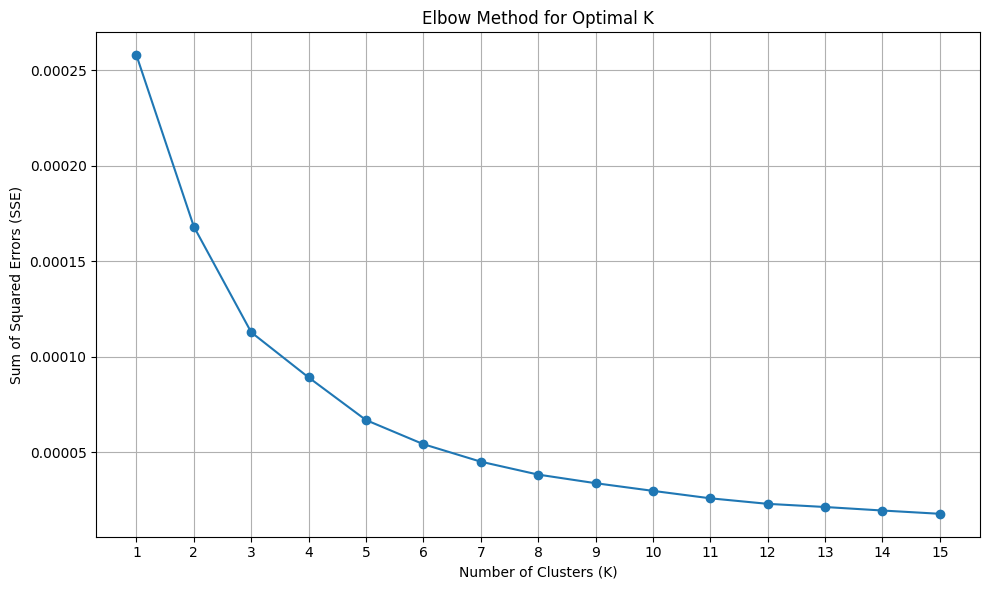

Elbow Method plot saved to kmeans_elbow_method.png
Suggested K from Elbow Method (heuristic): 2

Running Silhouette Score analysis...


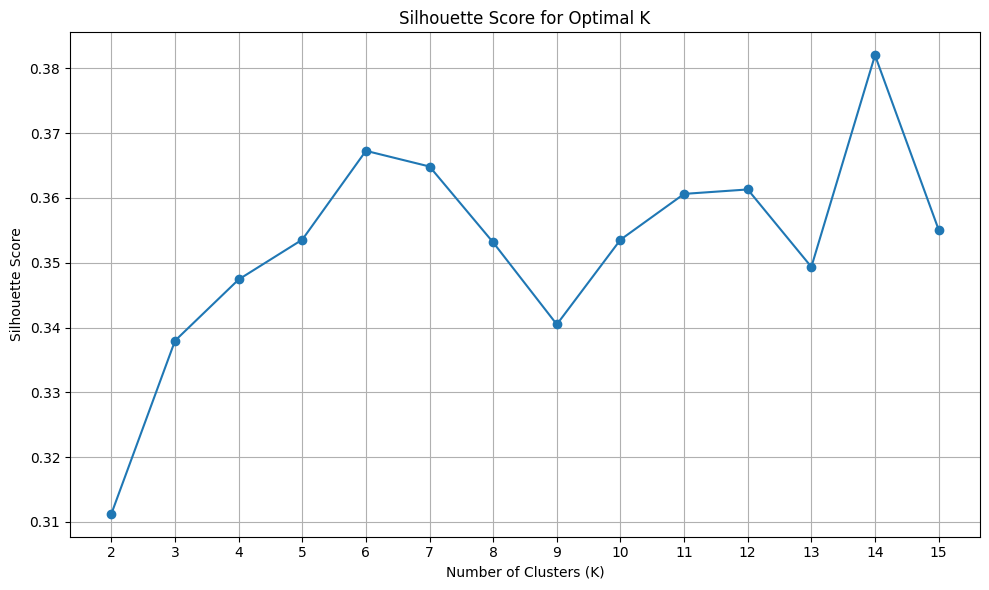

Silhouette Score plot saved to kmeans_silhouette_score.png
Suggested K from Silhouette Score: 14

--- K-Means Cluster Analysis Complete (for reference) ---

These plots help understand clusterability. The ACO will now run for specific K values defined in 'K_VALUES_FOR_ANALYSIS'.

--- Starting ACO Convergence Analysis for various M_CLUSTERS ---

Processing M_CLUSTERS = 2...
  Clustering for K=2 complete.


/tmp/ipython-input-7-2447315239.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=2 finished. Runtime: 18.27s, Best Cost: 25.82km

Processing M_CLUSTERS = 4...
  Clustering for K=4 complete.


/tmp/ipython-input-7-2447315239.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=4 finished. Runtime: 11.85s, Best Cost: 20.03km

Processing M_CLUSTERS = 6...
  Clustering for K=6 complete.


/tmp/ipython-input-7-2447315239.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=6 finished. Runtime: 10.34s, Best Cost: 16.80km

Processing M_CLUSTERS = 8...
  Clustering for K=8 complete.


/tmp/ipython-input-7-2447315239.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=8 finished. Runtime: 9.10s, Best Cost: 14.57km

Processing M_CLUSTERS = 10...
  Clustering for K=10 complete.


/tmp/ipython-input-7-2447315239.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=10 finished. Runtime: 10.02s, Best Cost: 13.78km

Processing M_CLUSTERS = 12...
  Clustering for K=12 complete.


/tmp/ipython-input-7-2447315239.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=12 finished. Runtime: 10.44s, Best Cost: 12.14km

Processing M_CLUSTERS = 14...
  Clustering for K=14 complete.


/tmp/ipython-input-7-2447315239.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=14 finished. Runtime: 10.29s, Best Cost: 11.90km

--- All ACO runs for Convergence Analysis Complete ---

--- Generating detailed visualizations and textual output for M_CLUSTERS = 10 ---


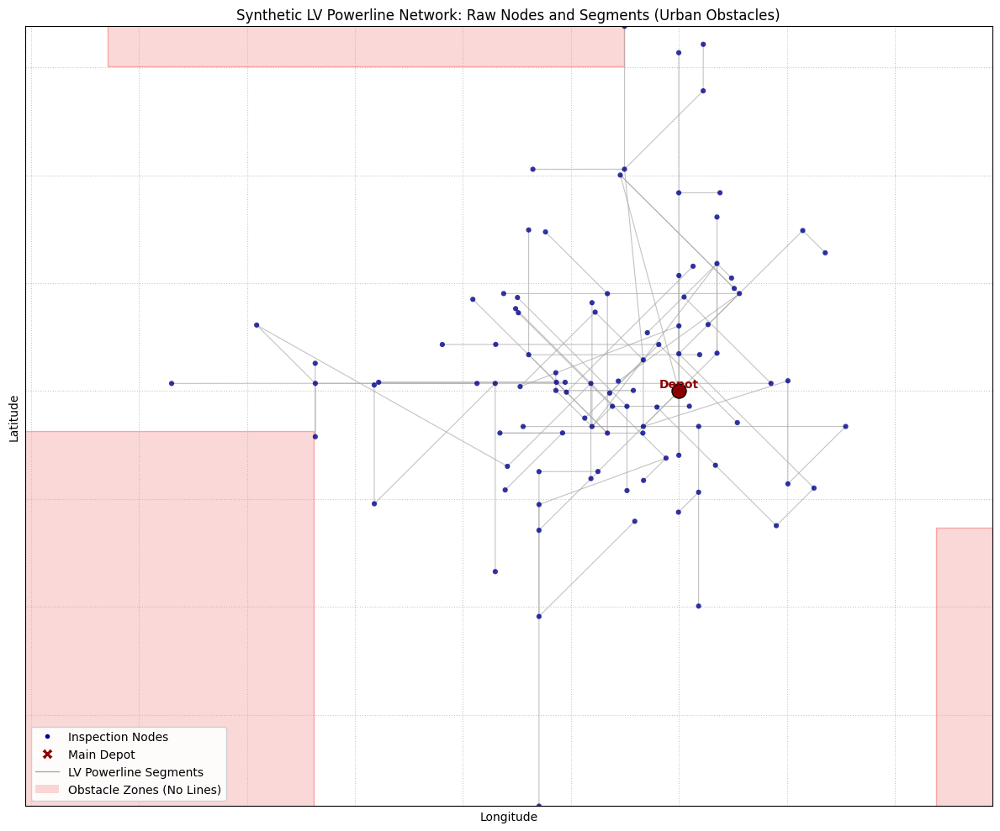

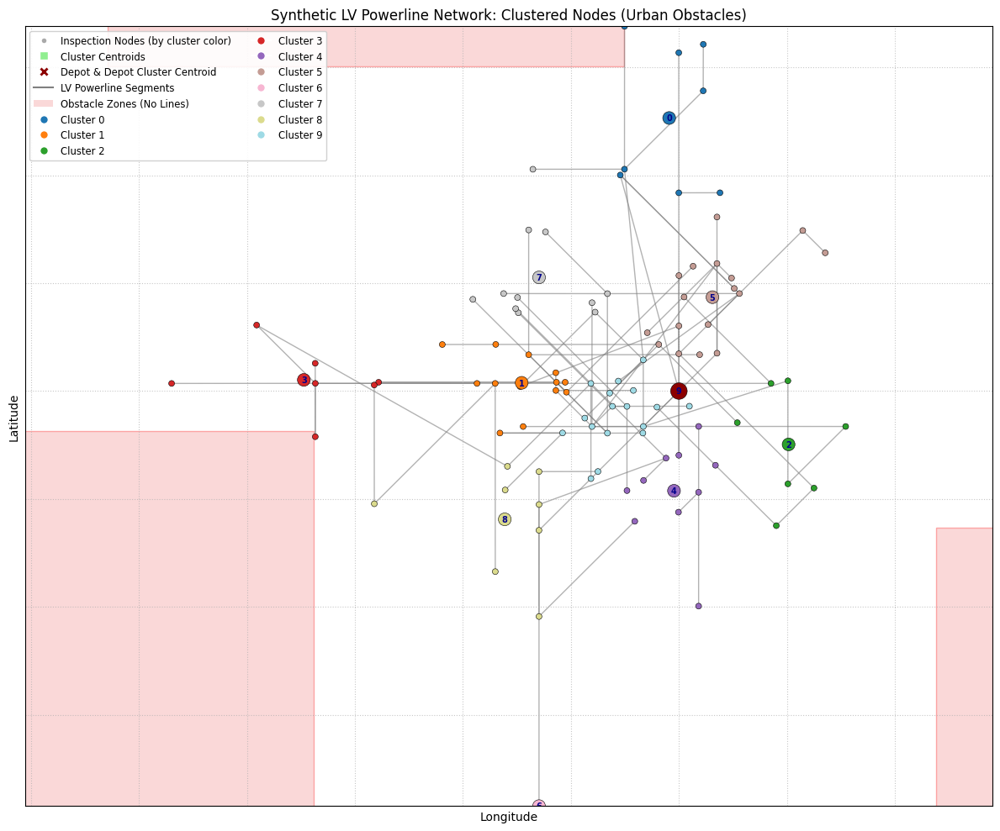

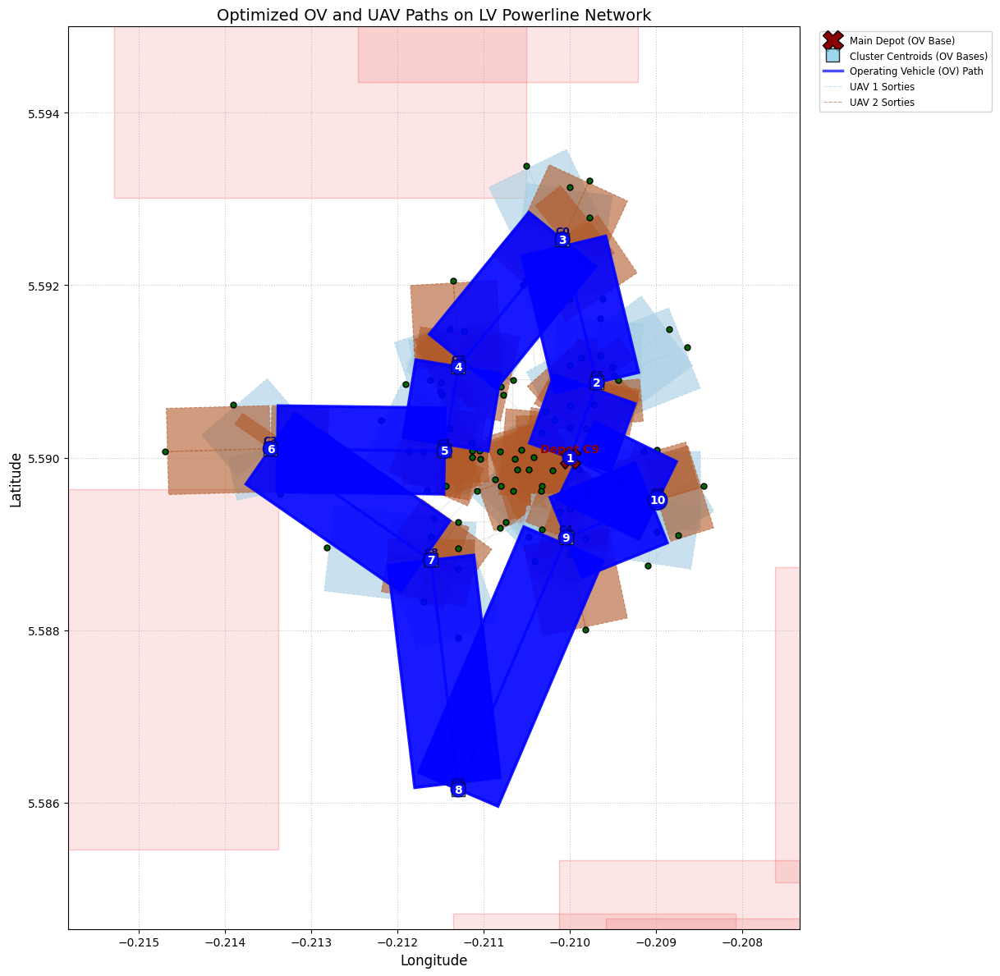


--- Running Evaluation Metrics for M_CLUSTERS = 10 ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 95.24% of LV powerline segments traversed.

--- Optimal Path Details for M_CLUSTERS = 10 ---
Best Total Path Cost: 13.78 km

OV Best Path Order (Cluster IDs):
DEPOT(9) -> C5 -> C0 -> C7 -> C1 -> C3 -> C8 -> C6 -> C4 -> C2 -> DEPOT(9)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 9 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C9 -> 44 -> OV_C9; OV_C9 -> 32 -> OV_C9; OV_C9 -> 8 -> OV_C9; OV_C9 -> 7 -> OV_C9; OV_C9 -> 21 -> OV_C9; OV_C9 -> 94 -> OV_C9; OV_C9 -> 47 -> OV_C9; OV_C9 -> 0 -> OV_C9; OV_C9 -> 65 -> OV_C9
    UAV 1: OV_C9 -> 13 -> OV_C9; OV_C9 -> 42 -> OV_C9; OV_C9 -> 29 -> OV_C9; OV_C9 -> 2 -> OV_C9; OV_C9 -> 66 -> OV_C9; OV_C9 -> 55 -> OV_C9; OV_C9 -> 26 -> OV_C9; OV_C9 -> 36 -> OV_C9; OV_C9 -> 30 -> OV_C9
  Cluster 5 (OV Base at [5.5909, -0.2097]):
    UAV 0: OV_C5 -> 53 -> OV_C5; OV_C5 -> 52 -> OV_C5; OV_C5 -> 50 -

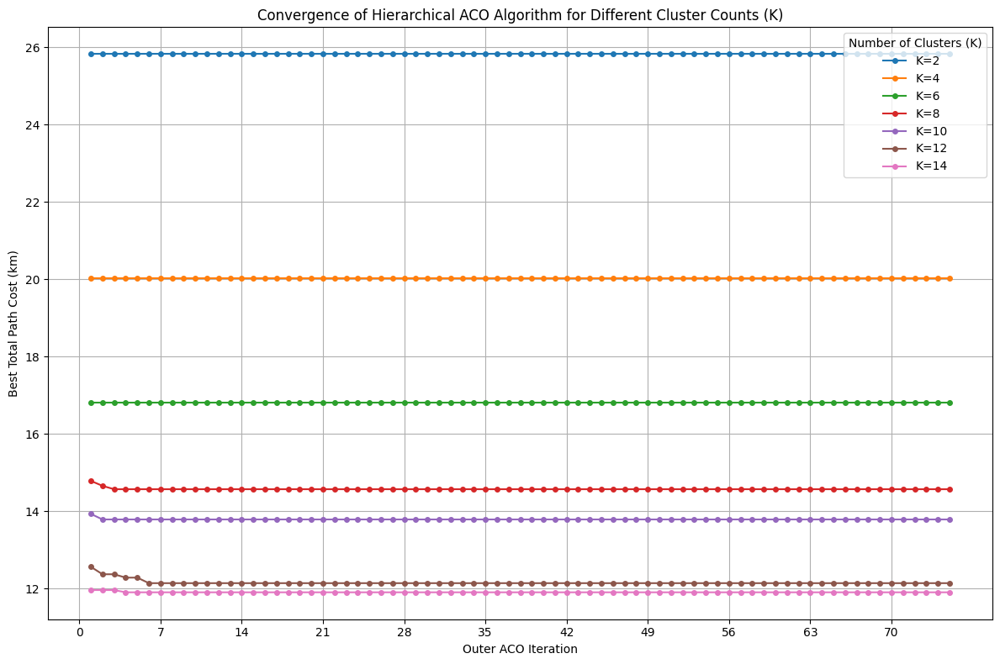


--- Updating and Saving Final Simulation Results to Google Drive ---
Saving final simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Final data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json


In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness, but not used when LOAD_FROM_SAVED_DATASET is True) ---
# These parameters are for the network generation function, which won't be called if loading from file.
ACCRA_LAT_RANGE = 0.02
ACCRA_LON_RANGE = 0.02
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2
MIN_LV_SEGMENT_KM = 0.01
MAX_LV_SEGMENT_KM = 0.20

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    This function is included for completeness but will not be called in this setup
    as LOAD_FROM_SAVED_DATASET is True.
    """
    nodes = []
    edges = []
    current_node_id = 0
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1
    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []
    obstacle_zones = []
    depot_zone_buffer = 0.002
    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1
    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False
    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False
    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001
    global_attempts = 0
    max_global_attempts = num_nodes * 500
    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1
        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)
        if from_node_id >= len(nodes): continue
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']
        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2
        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))
        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))
        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))
            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)
            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue
            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)
            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue
            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue
            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}
    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)
    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))
    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0
    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))
    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else:
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {}

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)}

        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf')

        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3):
                    if i + 1 < len(q_route_original_ids):
                        v_original_id = q_route_original_ids[i+1]
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}

    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx)

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title("Synthetic LV Powerline Network: Clustered Nodes (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    # This loop uses M_CLUSTERS, which will be VISUALIZATION_K when this function is called
    for i in range(M_CLUSTERS):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_clustered.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.2, zorder=0)
        ax.add_patch(rect)

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS)
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS > 1:
                            normalized_uav_q = uav_q / (Q_UAVS - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title("Optimized OV and UAV Paths on LV Powerline Network", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig("optimized_paths_ov_uav_synthetic_lv_enhanced.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Optimal Cluster Analysis Functions (Elbow and Silhouette) ---

def plot_elbow_method(data_coords, max_clusters=15):
    """
    Plots the Elbow Method for K-Means to help determine optimal K.
    """
    sse = []
    if len(data_coords) < 1:
        print("Not enough data points for Elbow method.")
        return

    max_k_effective = min(max_clusters, len(data_coords))
    k_range = range(1, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(data_coords)
        sse.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.xticks(list(k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_elbow_method.png")
    plt.show()
    print("Elbow Method plot saved to kmeans_elbow_method.png")

    if len(sse) > 2:
        diffs = np.diff(sse)
        diff_of_diffs = np.diff(diffs)
        optimal_k_elbow = np.argmax(diff_of_diffs) + 2
        print(f"Suggested K from Elbow Method (heuristic): {optimal_k_elbow}")
    return sse

def plot_silhouette_score(data_coords, max_clusters=15):
    """
    Plots the Silhouette Score for K-Means to help determine optimal K.
    """
    silhouette_scores = []

    if len(data_coords) < 2:
        print("Not enough data points for Silhouette Score (requires at least 2).")
        return

    max_k_effective = min(max_clusters, len(data_coords) - 1)
    if max_k_effective < 2:
        print("Not enough data points to compute Silhouette Score for multiple clusters.")
        return

    k_range = range(2, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_coords)
        if len(set(labels)) < 2:
            silhouette_scores.append(-1)
            print(f"Skipping Silhouette for K={k} as only 1 cluster formed.")
            continue
        try:
            score = silhouette_score(data_coords, labels)
            silhouette_scores.append(score)
        except ValueError as e:
            print(f"Could not calculate Silhouette Score for K={k}: {e}")
            silhouette_scores.append(-1)

    if not silhouette_scores or all(s == -1 for s in silhouette_scores):
        print("No valid Silhouette Scores could be computed.")
        return

    valid_k_range = [k_range[i] for i, score in enumerate(silhouette_scores) if score != -1]
    valid_scores = [score for score in silhouette_scores if score != -1]

    if not valid_scores:
        print("No valid Silhouette Scores to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.plot(valid_k_range, valid_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.xticks(list(valid_k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_silhouette_score.png")
    plt.show()
    print("Silhouette Score plot saved to kmeans_silhouette_score.png")

    optimal_k_silhouette = valid_k_range[np.argmax(valid_scores)]
    print(f"Suggested K from Silhouette Score: {optimal_k_silhouette}")
    return silhouette_scores


# --- Main Execution Flow ---

# Configuration: Always load from JSON for network data. ACO parameters are defined here.
LOAD_FROM_SAVED_DATASET = True

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# --- ACO and Simulation Parameters (DEFINED HERE, overriding any in JSON) ---
N_NODES_CONFIG = 100 # Original number of nodes when dataset was generated (informational)
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 5.0 # UAV flight range in km

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50, # Increased iterations for inner ACO
    'n_ants_uav': 6, # Increased ants for inner ACO
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0, # Slightly increased deposit
    'tau0_uav': 1.0
}
# --- END ACO and Simulation Parameters ---

# --- K values for Convergence Analysis ---
K_VALUES_FOR_ANALYSIS = [2, 4, 6, 8, 10, 12, 14]
VISUALIZATION_K = 10 # Only generate full visualizations for this K

# Global variables for loaded network data
all_nodes_global_copy = [] # Will hold the original loaded nodes
depot_actual_node_id_global = -1
generated_lv_edges_global = []
bbox_coords_global = (0, 0, 0, 0)
obstacle_zones_data_global = []
uav_distances_matrix_global = None
uav_graph_nx_global = None


# Store results for each K during the analysis loop
convergence_histories_all_k = {}
optimal_results_for_visual_k = {} # Stores results specifically for VISUALIZATION_K


print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    exit()


print("\n--- Loading Network Data from Google Drive ---")
if not os.path.exists(SAVED_FILE_PATH):
    print(f"Error: Saved file not found at {SAVED_FILE_PATH}")
    print("Please check the path or generate a new dataset first.")
    exit()

try:
    with open(SAVED_FILE_PATH, 'r') as f:
        loaded_data = json.load(f)

    # Load network data into global variables
    globals()['all_nodes_global_copy'] = loaded_data['nodes']
    globals()['depot_actual_node_id_global'] = loaded_data['depot_actual_node_id']
    globals()['generated_lv_edges_global'] = loaded_data['generated_lv_edges']
    globals()['bbox_coords_global'] = loaded_data['bbox_coords']
    globals()['obstacle_zones_data_global'] = loaded_data['obstacle_zones_data']

    # Update N_NODES_CONFIG from loaded data if available, or keep code-defined
    if 'simulation_parameters' in loaded_data and 'N_NODES' in loaded_data['simulation_parameters']:
        globals()['N_NODES_CONFIG'] = loaded_data['simulation_parameters']['N_NODES']


    print("Network data loaded successfully. ACO parameters are defined in the code.")
    print(f"Loaded network contains {len(all_nodes_global_copy)} nodes.")

except Exception as e:
    print(f"Error loading network data from file: {e}")
    print("Please check the file content or path.")
    exit()

# Build UAV distances matrix and NetworkX graph once for the loaded network
print("\nBuilding UAV distances matrix and NetworkX graph for the loaded network...")
uav_distances_matrix_global, uav_graph_nx_global = build_uav_distances_matrix_from_edges_nx(all_nodes_global_copy, generated_lv_edges_global)
print("UAV distances matrix and NetworkX graph built.")

# --- Perform Optimal K-Means Clustering Analysis on the loaded data (informational) ---
print("\n--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---")
coords_for_kmeans_analysis = np.array([[node['lat'], node['lon']] for node in all_nodes_global_copy])

if len(coords_for_kmeans_analysis) == 0:
    print("No data points available for cluster analysis. Skipping.")
else:
    max_clusters_to_test = min(len(coords_for_kmeans_analysis) - 1, 15)
    if max_clusters_to_test < 2:
        print(f"Warning: Only {len(coords_for_kmeans_analysis)} nodes. Cannot perform comprehensive cluster analysis.")
    else:
        print(f"Testing K from 1 to {max_clusters_to_test} for Elbow Method, and 2 to {max_clusters_to_test} for Silhouette Score.")
        print("\nRunning Elbow Method...")
        plot_elbow_method(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\nRunning Silhouette Score analysis...")
        plot_silhouette_score(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\n--- K-Means Cluster Analysis Complete (for reference) ---")
        print("\nThese plots help understand clusterability. The ACO will now run for specific K values defined in 'K_VALUES_FOR_ANALYSIS'.")


# --- Main Loop for ACO Convergence Analysis ---
print("\n--- Starting ACO Convergence Analysis for various M_CLUSTERS ---")

for current_m_clusters in K_VALUES_FOR_ANALYSIS:
    print(f"\nProcessing M_CLUSTERS = {current_m_clusters}...")

    # Deep copy all_nodes_global_copy to allow modification with cluster_id for this iteration
    current_all_nodes = [node.copy() for node in all_nodes_global_copy]

    # Perform K-Means clustering for the current_m_clusters
    coords_current_k = np.array([[node['lat'], node['lon']] for node in current_all_nodes])

    if len(current_all_nodes) < current_m_clusters:
        print(f"Warning: Number of nodes ({len(current_all_nodes)}) is less than current_m_clusters ({current_m_clusters}). Skipping this K value.")
        convergence_histories_all_k[current_m_clusters] = [] # Store empty for skipped K
        continue

    kmeans_current_k = KMeans(n_clusters=current_m_clusters, random_state=42, n_init=10)
    labels_current_k = kmeans_current_k.fit_predict(coords_current_k)

    temp_clusters_data = {i: [] for i in range(current_m_clusters)}
    for i, label in enumerate(labels_current_k):
        current_all_nodes[i]['cluster_id'] = label # Assign cluster_id to the copied nodes
        temp_clusters_data[label].append(current_all_nodes[i])

    temp_cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans_current_k.cluster_centers_)}

    # Re-assign depot cluster ID and centroid for the current clustering
    temp_depot_node_obj = next(node for node in current_all_nodes if node['id'] == depot_actual_node_id_global)
    temp_depot_cluster_id = temp_depot_node_obj['cluster_id']
    temp_cluster_centroids[temp_depot_cluster_id]['lat'] = DEPOT_COORD['lat']
    temp_cluster_centroids[temp_depot_cluster_id]['lon'] = DEPOT_COORD['lon']
    temp_cluster_centroids[temp_depot_cluster_id]['id'] = f"D{temp_depot_cluster_id}" # Assign a string ID

    temp_all_clusters_for_aco = {
        'centroids': temp_cluster_centroids,
        'node_sets': temp_clusters_data
    }
    print(f"  Clustering for K={current_m_clusters} complete.")


    # Run ACO for current_m_clusters
    start_time_aco = time.time()
    iter_best_cost, iter_best_ov_path_ids, iter_best_uav_paths_in_clusters, iter_convergence_history = solve_outer_aco(
        temp_depot_cluster_id,
        temp_all_clusters_for_aco,
        current_all_nodes, # Pass the clustered nodes for this iteration
        uav_distances_matrix_global,
        Q_UAVS,
        R_UAV_KM,
        OV_ACO_PARAMS,
        UAV_ACO_PARAMS
    )
    end_time_aco = time.time()
    iter_runtime = end_time_aco - start_time_aco

    print(f"  ACO for K={current_m_clusters} finished. Runtime: {iter_runtime:.2f}s, Best Cost: {iter_best_cost:.2f}km")

    # Store convergence history for this K
    convergence_histories_all_k[current_m_clusters] = iter_convergence_history

    # Store full results if this is the K for visualization
    if current_m_clusters == VISUALIZATION_K:
        optimal_results_for_visual_k = {
            'best_overall_cost': iter_best_cost,
            'best_ov_path_ids': iter_best_ov_path_ids,
            'best_uav_paths_in_clusters': iter_best_uav_paths_in_clusters,
            'depot_cluster_id': temp_depot_cluster_id,
            'cluster_centroids': temp_cluster_centroids,
            'all_nodes_for_plotting': current_all_nodes # Use the nodes with cluster_id assigned for this K
        }
        # Update global variables used by plotting functions to reflect VISUALIZATION_K's results
        globals()['M_CLUSTERS'] = VISUALIZATION_K
        globals()['depot_cluster_id'] = temp_depot_cluster_id
        globals()['cluster_centroids'] = temp_cluster_centroids
        globals()['all_nodes'] = current_all_nodes # Make this the 'active' all_nodes for plotting
        globals()['best_ov_path_ids'] = iter_best_ov_path_ids
        globals()['best_uav_paths_in_clusters'] = iter_best_uav_paths_in_clusters
        globals()['best_overall_cost'] = iter_best_cost
        globals()['convergence_history'] = iter_convergence_history # For the final individual convergence plot (if needed)


print("\n--- All ACO runs for Convergence Analysis Complete ---")


# --- Final Visualizations and Textual Output (Only for VISUALIZATION_K) ---
if optimal_results_for_visual_k:
    print(f"\n--- Generating detailed visualizations and textual output for M_CLUSTERS = {VISUALIZATION_K} ---")

    # Re-derive plot_nodes_coords and node_labels_map using the specific K's results
    plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes} # 'all_nodes' is set to VISUALIZATION_K's nodes
    node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

    centroid_plot_ids_map = {}
    for c_id, centroid in cluster_centroids.items():
        plot_id = f"C{c_id}"
        if c_id == depot_cluster_id:
            plot_id = f"DepotC{c_id}"
        plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
        node_labels_map[plot_id] = str(c_id)
        centroid_plot_ids_map[c_id] = plot_id

    # Cluster colors map for the chosen M_CLUSTERS
    cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS) # M_CLUSTERS is now VISUALIZATION_K

    # 1. Plot raw network (always the same, but called here)
    plot_raw_powerline_network(all_nodes_global_copy, generated_lv_edges_global, bbox_coords_global, DEPOT_COORD, depot_actual_node_id_global, obstacle_zones_data_global)

    # 2. Plot clustered network for VISUALIZATION_K
    plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges_global, bbox_coords_global, depot_actual_node_id_global, obstacle_zones_data_global)

    # 3. Plot best paths for VISUALIZATION_K
    plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords_global, depot_actual_node_id_global, obstacle_zones_data_global, generated_lv_edges_global)

    # --- Evaluation Metrics for VISUALIZATION_K ---
    print("\n--- Running Evaluation Metrics for M_CLUSTERS = {} ---".format(VISUALIZATION_K))
    node_coverage = calculate_node_coverage(all_nodes, depot_actual_node_id_global, best_uav_paths_in_clusters)
    print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")
    edge_coverage = calculate_edge_coverage(all_nodes, generated_lv_edges_global, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx_global)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")


    # --- Optimal Path Details (Textual) for VISUALIZATION_K ---
    print("\n--- Optimal Path Details for M_CLUSTERS = {} ---".format(VISUALIZATION_K))
    print(f"Best Total Path Cost: {best_overall_cost:.2f} km")

    print("\nOV Best Path Order (Cluster IDs):")
    ov_path_str_display = []
    for c_id in best_ov_path_ids:
        if c_id == depot_cluster_id:
            ov_path_str_display.append(f"DEPOT({c_id})")
        else:
            ov_path_str_display.append(f"C{c_id}")
    print(" -> ".join(ov_path_str_display))

    print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        centroid_display = cluster_centroids[cluster_id]
        print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
        for uav_q, route_nodes_ids in uav_routes.items():
            if route_nodes_ids:
                display_sorties = []
                for i in range(0, len(route_nodes_ids), 3):
                    if i + 1 < len(route_nodes_ids):
                        display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")
                print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
            else:
                print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")
else:
    print(f"\nNo detailed visualizations or textual output for M_CLUSTERS={VISUALIZATION_K} because no results were stored (e.g., if that K was skipped).")


# --- Combined Convergence Analysis Visualization (for all K values) ---
print("\n--- Plotting Combined Convergence Analysis for all K values ---")
plt.figure(figsize=(12, 8))
for k_val, history in convergence_histories_all_k.items():
    if history: # Only plot if history is not empty
        plt.plot(range(1, len(history) + 1), history, marker='o', linestyle='-', markersize=4, label=f'K={k_val}')

plt.title('Convergence of Hierarchical ACO Algorithm for Different Cluster Counts (K)')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
max_iters = max([len(h) for h in convergence_histories_all_k.values() if h]) if convergence_histories_all_k else OV_ACO_PARAMS['iters_ov']
plt.xticks(np.arange(0, max_iters + 1, max(1, max_iters // 10)))
plt.legend(title='Number of Clusters (K)')
plt.tight_layout()
plt.savefig("aco_convergence_plot_all_k.png")
print("Combined convergence plot saved to aco_convergence_plot_all_k.png")
plt.show()

# --- Save final results (this time including ACO params used, and specific K's clustering) ---
print("\n--- Updating and Saving Final Simulation Results to Google Drive ---")
try:
    final_data_to_save_raw = {
        "nodes": all_nodes, # This will contain cluster_id for VISUALIZATION_K
        "depot_actual_node_id": depot_actual_node_id_global,
        "generated_lv_edges": generated_lv_edges_global,
        "bbox_coords": bbox_coords_global,
        "obstacle_zones_data": obstacle_zones_data_global,
        "cluster_centroids": cluster_centroids, # For VISUALIZATION_K
        "best_ov_path_ids": best_ov_path_ids, # For VISUALIZATION_K
        "best_uav_paths_in_clusters": best_uav_paths_in_clusters, # For VISUALIZATION_K
        "best_overall_cost": best_overall_cost, # For VISUALIZATION_K
        "convergence_history": convergence_history, # For VISUALIZATION_K (its individual history)
        "convergence_histories_all_k": convergence_histories_all_k, # All histories for comparison
        "simulation_parameters": {
            "N_NODES_CONFIG": N_NODES_CONFIG,
            "M_CLUSTERS_VISUALIZED": VISUALIZATION_K, # Indicate which K was visualized in detail
            "K_VALUES_FOR_ANALYSIS": K_VALUES_FOR_ANALYSIS, # All K values analyzed
            "Q_UAVS": Q_UAVS,
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

    drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
    full_file_path = os.path.join(drive_folder_path, "ACO_LV_Network_Simulation_dataset.json")

    print(f"Saving final simulation results to: {full_file_path}")
    with open(full_file_path, 'w') as f:
        json.dump(final_data_to_save_converted, f, indent=4)
    print("Final data successfully saved to Google Drive!")
    print(f"File location: {full_file_path}")
except Exception as e:
    print(f"Error saving final data to file: {e}")



COMPARISON OF RUNTIMES ACCROSS DIFFERENT K VALUES


--- Mounting Google Drive ---
Google Drive already mounted.

--- Loading Network Data from Google Drive ---
Network data loaded successfully. ACO parameters are defined in the code.
Loaded network contains 100 nodes.

Building UAV distances matrix and NetworkX graph for the loaded network...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.02 seconds.
UAV distances matrix and NetworkX graph built.

--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---
Testing K from 1 to 15 for Elbow Method, and 2 to 15 for Silhouette Score.

Running Elbow Method...


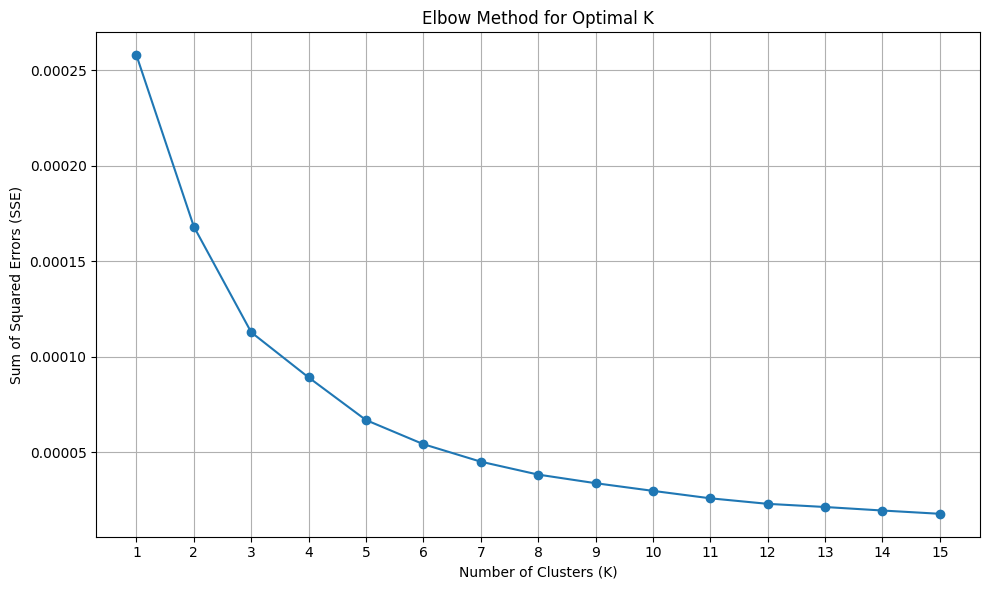

Elbow Method plot saved to kmeans_elbow_method.png
Suggested K from Elbow Method (heuristic): 2

Running Silhouette Score analysis...


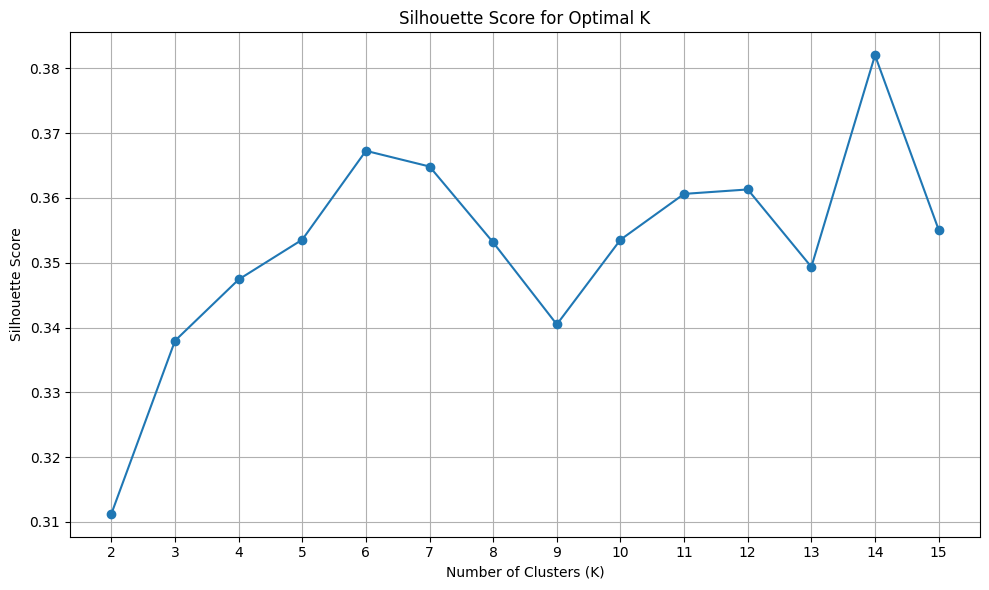

Silhouette Score plot saved to kmeans_silhouette_score.png
Suggested K from Silhouette Score: 14

--- K-Means Cluster Analysis Complete (for reference) ---

These plots help understand clusterability. The ACO will now run for specific K values defined in 'K_VALUES_FOR_ANALYSIS'.

--- Starting ACO Convergence and Runtime Analysis for various M_CLUSTERS ---

Processing M_CLUSTERS = 2...
  Clustering for K=2 complete.


/tmp/ipython-input-2-3829833212.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=2 finished. Runtime: 21.65s, Best Cost: 25.82km

Processing M_CLUSTERS = 4...
  Clustering for K=4 complete.


/tmp/ipython-input-2-3829833212.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=4 finished. Runtime: 21.44s, Best Cost: 20.03km

Processing M_CLUSTERS = 6...
  Clustering for K=6 complete.


/tmp/ipython-input-2-3829833212.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=6 finished. Runtime: 17.43s, Best Cost: 16.80km

Processing M_CLUSTERS = 8...
  Clustering for K=8 complete.


/tmp/ipython-input-2-3829833212.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=8 finished. Runtime: 10.63s, Best Cost: 14.62km

Processing M_CLUSTERS = 10...
  Clustering for K=10 complete.


/tmp/ipython-input-2-3829833212.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=10 finished. Runtime: 8.72s, Best Cost: 14.03km

Processing M_CLUSTERS = 12...
  Clustering for K=12 complete.


/tmp/ipython-input-2-3829833212.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=12 finished. Runtime: 10.64s, Best Cost: 12.15km

Processing M_CLUSTERS = 14...
  Clustering for K=14 complete.


/tmp/ipython-input-2-3829833212.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for K=14 finished. Runtime: 10.70s, Best Cost: 11.67km

--- All ACO runs for Convergence and Runtime Analysis Complete ---

--- Generating detailed visualizations and textual output for M_CLUSTERS = 10 ---


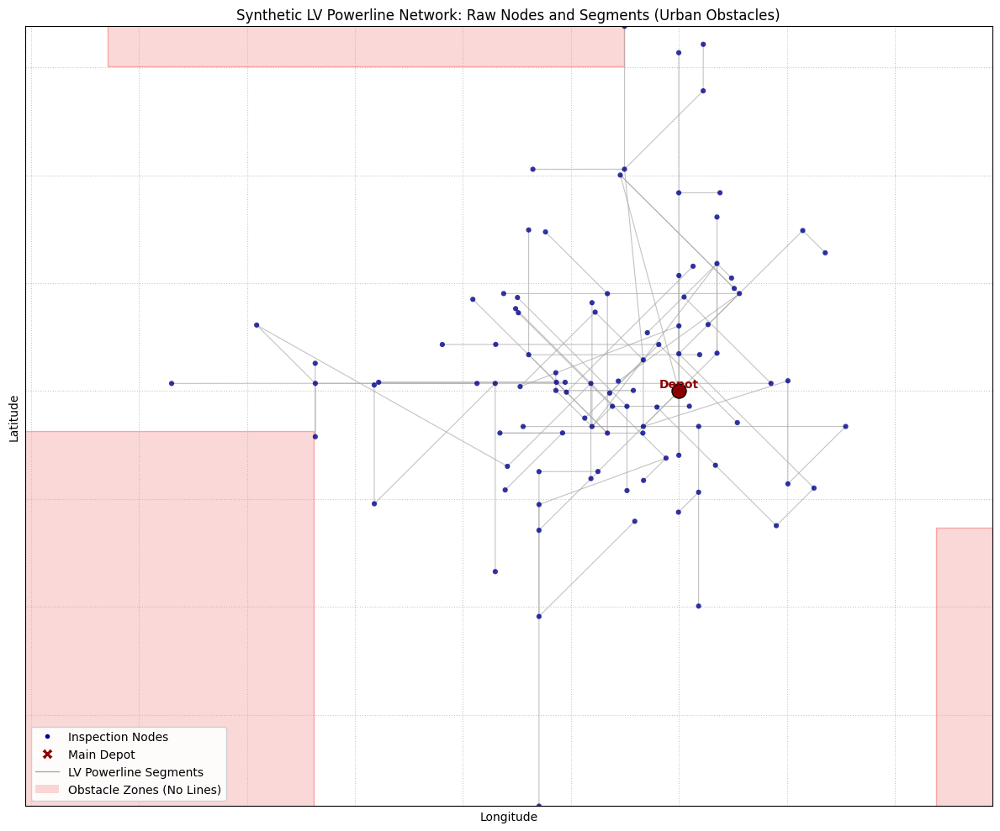

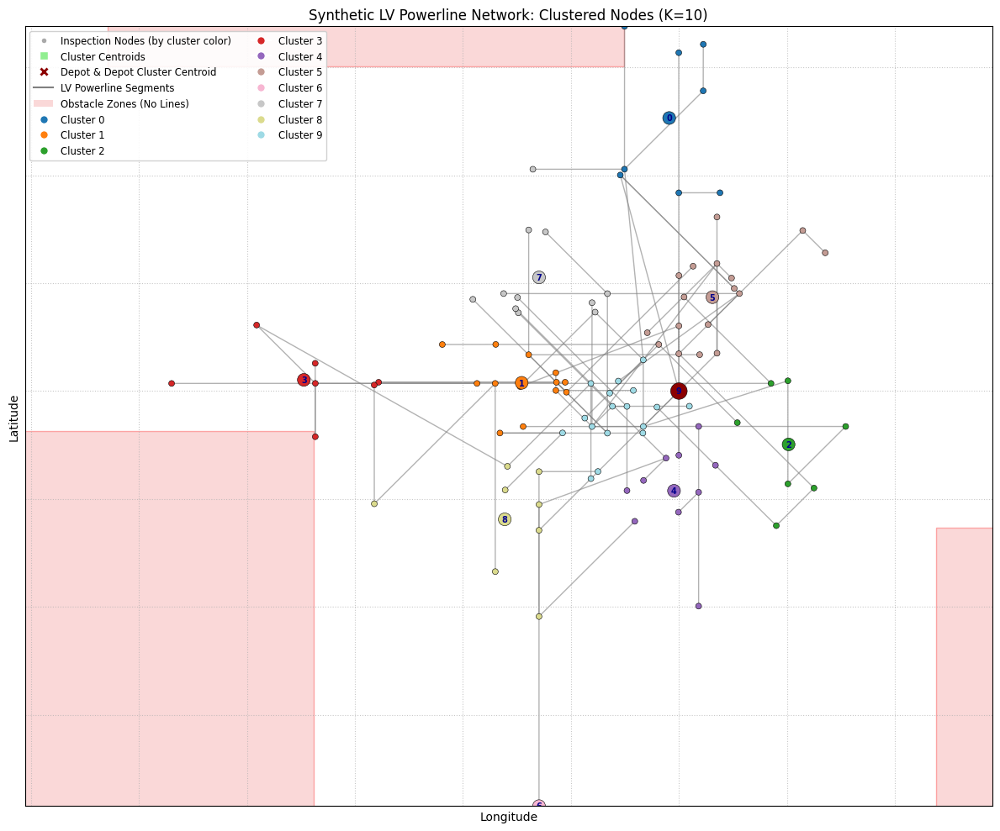

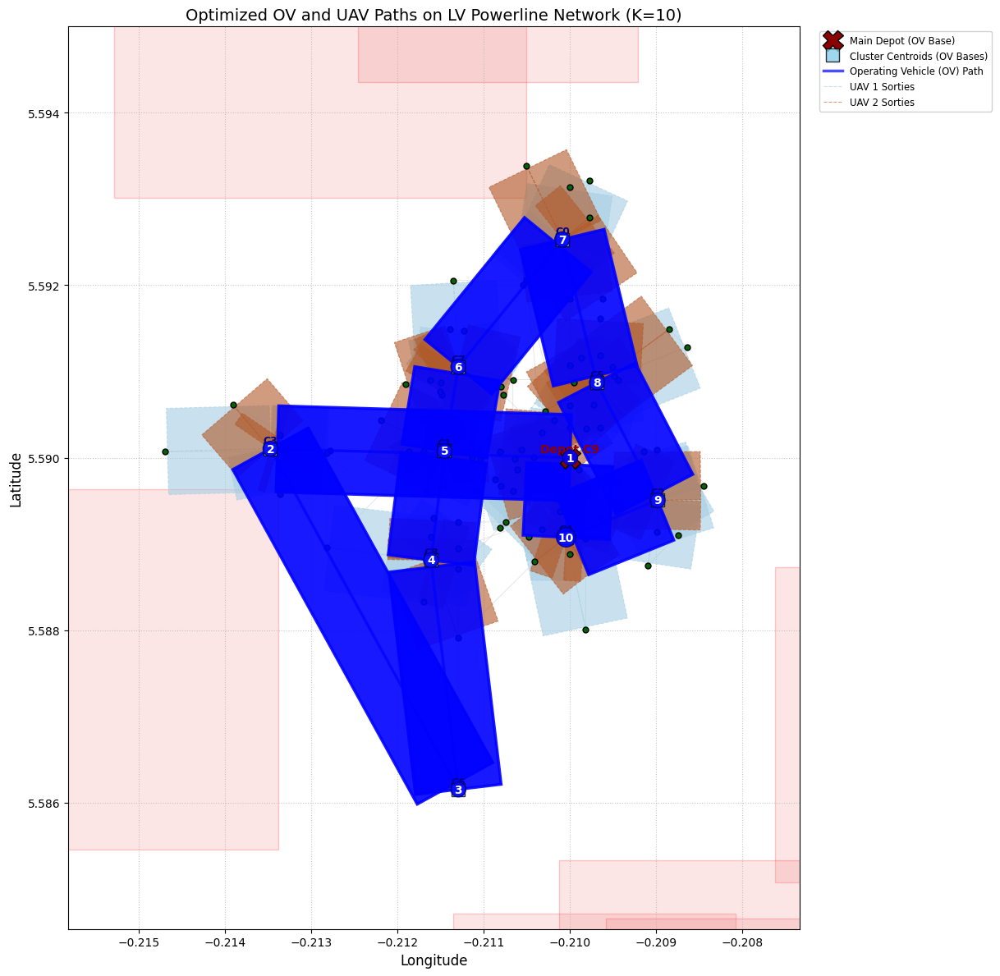


--- Running Evaluation Metrics for M_CLUSTERS = 10 ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 95.24% of LV powerline segments traversed.

--- Optimal Path Details for M_CLUSTERS = 10 ---
Best Total Path Cost: 14.03 km

OV Best Path Order (Cluster IDs):
DEPOT(9) -> C3 -> C6 -> C8 -> C1 -> C7 -> C0 -> C5 -> C2 -> C4 -> DEPOT(9)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 9 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C9 -> 36 -> OV_C9; OV_C9 -> 26 -> OV_C9; OV_C9 -> 8 -> OV_C9; OV_C9 -> 94 -> OV_C9; OV_C9 -> 66 -> OV_C9; OV_C9 -> 21 -> OV_C9; OV_C9 -> 42 -> OV_C9; OV_C9 -> 13 -> OV_C9; OV_C9 -> 55 -> OV_C9
    UAV 1: OV_C9 -> 0 -> OV_C9; OV_C9 -> 47 -> OV_C9; OV_C9 -> 65 -> OV_C9; OV_C9 -> 2 -> OV_C9; OV_C9 -> 32 -> OV_C9; OV_C9 -> 29 -> OV_C9; OV_C9 -> 44 -> OV_C9; OV_C9 -> 7 -> OV_C9; OV_C9 -> 30 -> OV_C9
  Cluster 3 (OV Base at [5.5901, -0.2135]):
    UAV 0: OV_C3 -> 80 -> OV_C3; OV_C3 -> 96 -> OV_C3; OV_C3 -> 71 -

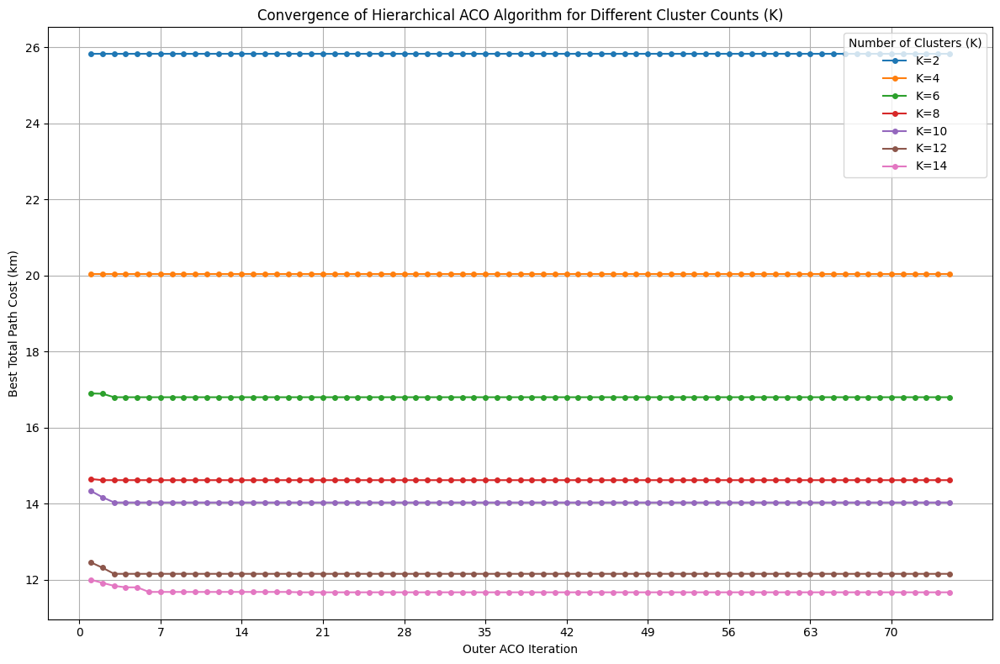


--- Plotting Runtime Comparison for all K values ---


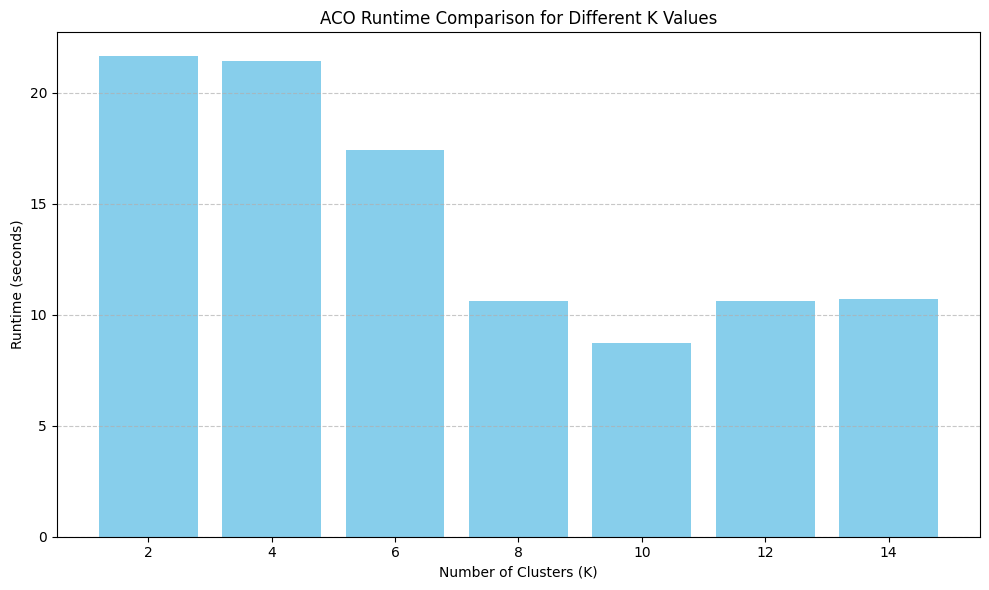

Runtime comparison plot saved to aco_runtime_comparison.png

--- Updating and Saving Final Simulation Results to Google Drive ---
Saving final simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Final data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json


In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness, but not used when LOAD_FROM_SAVED_DATASET is True) ---
# These parameters are for the network generation function, which won't be called if loading from file.
ACCRA_LAT_RANGE = 0.02
ACCRA_LON_RANGE = 0.02
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2
MIN_LV_SEGMENT_KM = 0.01
MAX_LV_SEGMENT_KM = 0.20

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    This function is included for completeness but will not be called in this setup
    as LOAD_FROM_SAVED_DATASET is True.
    """
    nodes = []
    edges = []
    current_node_id = 0
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1
    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []
    obstacle_zones = []
    depot_zone_buffer = 0.002
    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1
    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False
    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False
    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001
    global_attempts = 0
    max_global_attempts = num_nodes * 500
    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1
        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)
        if from_node_id >= len(nodes): continue
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']
        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2
        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))
        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))
        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))
            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)
            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue
            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)
            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue
            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue
            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}
    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)
    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))
    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0
    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))
    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else:
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {}

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)}

        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf')

        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3):
                    if i + 1 < len(q_route_original_ids):
                        v_original_id = q_route_original_ids[i+1]
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}

    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx)

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data, M_CLUSTERS_VISUALIZED):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title(f"Synthetic LV Powerline Network: Clustered Nodes (K={M_CLUSTERS_VISUALIZED})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    for i in range(M_CLUSTERS_VISUALIZED):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig(f"synthetic_lv_network_clustered_K{M_CLUSTERS_VISUALIZED}.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges, M_CLUSTERS_VISUALIZED):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.2, zorder=0)
        ax.add_patch(rect)

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS)
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS > 1:
                            normalized_uav_q = uav_q / (Q_UAVS - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title(f"Optimized OV and UAV Paths on LV Powerline Network (K={M_CLUSTERS_VISUALIZED})", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig(f"optimized_paths_ov_uav_synthetic_lv_enhanced_K{M_CLUSTERS_VISUALIZED}.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Optimal Cluster Analysis Functions (Elbow and Silhouette) ---

def plot_elbow_method(data_coords, max_clusters=15):
    """
    Plots the Elbow Method for K-Means to help determine optimal K.
    """
    sse = []
    if len(data_coords) < 1:
        print("Not enough data points for Elbow method.")
        return

    max_k_effective = min(max_clusters, len(data_coords))
    k_range = range(1, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(data_coords)
        sse.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.xticks(list(k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_elbow_method.png")
    plt.show()
    print("Elbow Method plot saved to kmeans_elbow_method.png")

    if len(sse) > 2:
        diffs = np.diff(sse)
        diff_of_diffs = np.diff(diffs)
        optimal_k_elbow = np.argmax(diff_of_diffs) + 2
        print(f"Suggested K from Elbow Method (heuristic): {optimal_k_elbow}")
    return sse

def plot_silhouette_score(data_coords, max_clusters=15):
    """
    Plots the Silhouette Score for K-Means to help determine optimal K.
    """
    silhouette_scores = []

    if len(data_coords) < 2:
        print("Not enough data points for Silhouette Score (requires at least 2).")
        return

    max_k_effective = min(max_clusters, len(data_coords) - 1)
    if max_k_effective < 2:
        print("Not enough data points to compute Silhouette Score for multiple clusters.")
        return

    k_range = range(2, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_coords)
        if len(set(labels)) < 2:
            silhouette_scores.append(-1)
            print(f"Skipping Silhouette for K={k} as only 1 cluster formed.")
            continue
        try:
            score = silhouette_score(data_coords, labels)
            silhouette_scores.append(score)
        except ValueError as e:
            print(f"Could not calculate Silhouette Score for K={k}: {e}")
            silhouette_scores.append(-1)

    if not silhouette_scores or all(s == -1 for s in silhouette_scores):
        print("No valid Silhouette Scores could be computed.")
        return

    valid_k_range = [k_range[i] for i, score in enumerate(silhouette_scores) if score != -1]
    valid_scores = [score for score in silhouette_scores if score != -1]

    if not valid_scores:
        print("No valid Silhouette Scores to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.plot(valid_k_range, valid_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.xticks(list(valid_k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_silhouette_score.png")
    plt.show()
    print("Silhouette Score plot saved to kmeans_silhouette_score.png")

    optimal_k_silhouette = valid_k_range[np.argmax(valid_scores)]
    print(f"Suggested K from Silhouette Score: {optimal_k_silhouette}")
    return silhouette_scores

def plot_runtime_comparison(runtimes_data):
    """
    Plots a bar chart comparing the runtime for different K values.
    """
    k_values = sorted(runtimes_data.keys())
    runtimes = [runtimes_data[k] for k in k_values]

    plt.figure(figsize=(10, 6))
    plt.bar([str(k) for k in k_values], runtimes, color='skyblue')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Runtime (seconds)')
    plt.title('ACO Runtime Comparison for Different K Values')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("aco_runtime_comparison.png")
    plt.show()
    print("Runtime comparison plot saved to aco_runtime_comparison.png")


# --- Main Execution Flow ---

# Configuration: Always load from JSON for network data. ACO parameters are defined here.
LOAD_FROM_SAVED_DATASET = True

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# --- ACO and Simulation Parameters (DEFINED HERE, overriding any in JSON) ---
N_NODES_CONFIG = 100 # Original number of nodes when dataset was generated (informational)
Q_UAVS = 2 # Number of UAVs per cluster
R_UAV_KM = 5.0 # UAV flight range in km

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50,
    'n_ants_uav': 6,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0,
    'tau0_uav': 1.0
}
# --- END ACO and Simulation Parameters ---

# --- K values for Convergence Analysis and Visualization ---
K_VALUES_FOR_ANALYSIS = [2, 4, 6, 8, 10, 12, 14]
VISUALIZATION_K = 10 # Only generate full visualizations for this K

# Global variables for loaded network data
all_nodes_global_copy = []
depot_actual_node_id_global = -1
generated_lv_edges_global = []
bbox_coords_global = (0, 0, 0, 0)
obstacle_zones_data_global = []
uav_distances_matrix_global = None
uav_graph_nx_global = None


# Store results for each K during the analysis loop
convergence_histories_all_k = {}
runtimes_all_k = {} # New: Stores runtime for each K
optimal_results_for_visual_k = {}


print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    exit()


print("\n--- Loading Network Data from Google Drive ---")
if not os.path.exists(SAVED_FILE_PATH):
    print(f"Error: Saved file not found at {SAVED_FILE_PATH}")
    print("Please check the path or generate a new dataset first.")
    exit()

try:
    with open(SAVED_FILE_PATH, 'r') as f:
        loaded_data = json.load(f)

    globals()['all_nodes_global_copy'] = loaded_data['nodes']
    globals()['depot_actual_node_id_global'] = loaded_data['depot_actual_node_id']
    globals()['generated_lv_edges_global'] = loaded_data['generated_lv_edges']
    globals()['bbox_coords_global'] = loaded_data['bbox_coords']
    globals()['obstacle_zones_data_global'] = loaded_data['obstacle_zones_data']

    if 'simulation_parameters' in loaded_data and 'N_NODES' in loaded_data['simulation_parameters']:
        globals()['N_NODES_CONFIG'] = loaded_data['simulation_parameters']['N_NODES']


    print("Network data loaded successfully. ACO parameters are defined in the code.")
    print(f"Loaded network contains {len(all_nodes_global_copy)} nodes.")

except Exception as e:
    print(f"Error loading network data from file: {e}")
    print("Please check the file content or path.")
    exit()

# Build UAV distances matrix and NetworkX graph once for the loaded network
print("\nBuilding UAV distances matrix and NetworkX graph for the loaded network...")
uav_distances_matrix_global, uav_graph_nx_global = build_uav_distances_matrix_from_edges_nx(all_nodes_global_copy, generated_lv_edges_global)
print("UAV distances matrix and NetworkX graph built.")

# --- Perform Optimal K-Means Clustering Analysis on the loaded data (informational) ---
print("\n--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---")
coords_for_kmeans_analysis = np.array([[node['lat'], node['lon']] for node in all_nodes_global_copy])

if len(coords_for_kmeans_analysis) == 0:
    print("No data points available for cluster analysis. Skipping.")
else:
    max_clusters_to_test = min(len(coords_for_kmeans_analysis) - 1, 15)
    if max_clusters_to_test < 2:
        print(f"Warning: Only {len(coords_for_kmeans_analysis)} nodes. Cannot perform comprehensive cluster analysis.")
    else:
        print(f"Testing K from 1 to {max_clusters_to_test} for Elbow Method, and 2 to {max_clusters_to_test} for Silhouette Score.")
        print("\nRunning Elbow Method...")
        plot_elbow_method(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\nRunning Silhouette Score analysis...")
        plot_silhouette_score(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\n--- K-Means Cluster Analysis Complete (for reference) ---")
        print("\nThese plots help understand clusterability. The ACO will now run for specific K values defined in 'K_VALUES_FOR_ANALYSIS'.")


# --- Main Loop for ACO Convergence and Runtime Analysis ---
print("\n--- Starting ACO Convergence and Runtime Analysis for various M_CLUSTERS ---")

for current_m_clusters in K_VALUES_FOR_ANALYSIS:
    print(f"\nProcessing M_CLUSTERS = {current_m_clusters}...")

    current_all_nodes = [node.copy() for node in all_nodes_global_copy]

    coords_current_k = np.array([[node['lat'], node['lon']] for node in current_all_nodes])

    if len(current_all_nodes) < current_m_clusters:
        print(f"Warning: Number of nodes ({len(current_all_nodes)}) is less than current_m_clusters ({current_m_clusters}). Skipping this K value.")
        convergence_histories_all_k[current_m_clusters] = []
        runtimes_all_k[current_m_clusters] = np.nan # Store NaN for skipped K
        continue

    kmeans_current_k = KMeans(n_clusters=current_m_clusters, random_state=42, n_init=10)
    labels_current_k = kmeans_current_k.fit_predict(coords_current_k)

    temp_clusters_data = {i: [] for i in range(current_m_clusters)}
    for i, label in enumerate(labels_current_k):
        current_all_nodes[i]['cluster_id'] = label
        temp_clusters_data[label].append(current_all_nodes[i])

    temp_cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans_current_k.cluster_centers_)}

    temp_depot_node_obj = next(node for node in current_all_nodes if node['id'] == depot_actual_node_id_global)
    temp_depot_cluster_id = temp_depot_node_obj['cluster_id']
    temp_cluster_centroids[temp_depot_cluster_id]['lat'] = DEPOT_COORD['lat']
    temp_cluster_centroids[temp_depot_cluster_id]['lon'] = DEPOT_COORD['lon']
    temp_cluster_centroids[temp_depot_cluster_id]['id'] = f"D{temp_depot_cluster_id}"

    temp_all_clusters_for_aco = {
        'centroids': temp_cluster_centroids,
        'node_sets': temp_clusters_data
    }
    print(f"  Clustering for K={current_m_clusters} complete.")


    start_time_aco = time.time()
    iter_best_cost, iter_best_ov_path_ids, iter_best_uav_paths_in_clusters, iter_convergence_history = solve_outer_aco(
        temp_depot_cluster_id,
        temp_all_clusters_for_aco,
        current_all_nodes,
        uav_distances_matrix_global,
        Q_UAVS,
        R_UAV_KM,
        OV_ACO_PARAMS,
        UAV_ACO_PARAMS
    )
    end_time_aco = time.time()
    iter_runtime = end_time_aco - start_time_aco

    print(f"  ACO for K={current_m_clusters} finished. Runtime: {iter_runtime:.2f}s, Best Cost: {iter_best_cost:.2f}km")

    convergence_histories_all_k[current_m_clusters] = iter_convergence_history
    runtimes_all_k[current_m_clusters] = iter_runtime # Store runtime

    if current_m_clusters == VISUALIZATION_K:
        optimal_results_for_visual_k = {
            'best_overall_cost': iter_best_cost,
            'best_ov_path_ids': iter_best_ov_path_ids,
            'best_uav_paths_in_clusters': iter_best_uav_paths_in_clusters,
            'depot_cluster_id': temp_depot_cluster_id,
            'cluster_centroids': temp_cluster_centroids,
            'all_nodes_for_plotting': current_all_nodes
        }
        globals()['M_CLUSTERS'] = VISUALIZATION_K # Set for plotting functions
        globals()['depot_cluster_id'] = temp_depot_cluster_id
        globals()['cluster_centroids'] = temp_cluster_centroids
        globals()['all_nodes'] = current_all_nodes
        globals()['best_ov_path_ids'] = iter_best_ov_path_ids
        globals()['best_uav_paths_in_clusters'] = iter_best_uav_paths_in_clusters
        globals()['best_overall_cost'] = iter_best_cost
        globals()['convergence_history'] = iter_convergence_history


print("\n--- All ACO runs for Convergence and Runtime Analysis Complete ---")


# --- Final Visualizations and Textual Output (Only for VISUALIZATION_K) ---
if optimal_results_for_visual_k:
    print(f"\n--- Generating detailed visualizations and textual output for M_CLUSTERS = {VISUALIZATION_K} ---")

    plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in all_nodes}
    node_labels_map = {node['id']: str(node['id']) for node in all_nodes}

    centroid_plot_ids_map = {}
    for c_id, centroid in cluster_centroids.items():
        plot_id = f"C{c_id}"
        if c_id == depot_cluster_id:
            plot_id = f"DepotC{c_id}"
        plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
        node_labels_map[plot_id] = str(c_id)
        centroid_plot_ids_map[c_id] = plot_id

    cluster_colors_map = plt.get_cmap('tab20', M_CLUSTERS)

    plot_raw_powerline_network(all_nodes_global_copy, generated_lv_edges_global, bbox_coords_global, DEPOT_COORD, depot_actual_node_id_global, obstacle_zones_data_global)

    plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges_global, bbox_coords_global, depot_actual_node_id_global, obstacle_zones_data_global, M_CLUSTERS_VISUALIZED=VISUALIZATION_K)

    plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords_global, depot_actual_node_id_global, obstacle_zones_data_global, generated_lv_edges_global, M_CLUSTERS_VISUALIZED=VISUALIZATION_K)

    print("\n--- Running Evaluation Metrics for M_CLUSTERS = {} ---".format(VISUALIZATION_K))
    node_coverage = calculate_node_coverage(all_nodes, depot_actual_node_id_global, best_uav_paths_in_clusters)
    print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")
    edge_coverage = calculate_edge_coverage(all_nodes, generated_lv_edges_global, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx_global)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")


    print("\n--- Optimal Path Details for M_CLUSTERS = {} ---".format(VISUALIZATION_K))
    print(f"Best Total Path Cost: {best_overall_cost:.2f} km")

    print("\nOV Best Path Order (Cluster IDs):")
    ov_path_str_display = []
    for c_id in best_ov_path_ids:
        if c_id == depot_cluster_id:
            ov_path_str_display.append(f"DEPOT({c_id})")
        else:
            ov_path_str_display.append(f"C{c_id}")
    print(" -> ".join(ov_path_str_display))

    print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        centroid_display = cluster_centroids[cluster_id]
        print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
        for uav_q, route_nodes_ids in uav_routes.items():
            if route_nodes_ids:
                display_sorties = []
                for i in range(0, len(route_nodes_ids), 3):
                    if i + 1 < len(route_nodes_ids):
                        display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")
                print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
            else:
                print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")
else:
    print(f"\nNo detailed visualizations or textual output for M_CLUSTERS={VISUALIZATION_K} because no results were stored (e.g., if that K was skipped).")


# --- Combined Convergence Analysis Visualization (for all K values) ---
print("\n--- Plotting Combined Convergence Analysis for all K values ---")
plt.figure(figsize=(12, 8))
for k_val, history in convergence_histories_all_k.items():
    if history:
        plt.plot(range(1, len(history) + 1), history, marker='o', linestyle='-', markersize=4, label=f'K={k_val}')

plt.title('Convergence of Hierarchical ACO Algorithm for Different Cluster Counts (K)')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
max_iters = max([len(h) for h in convergence_histories_all_k.values() if h]) if convergence_histories_all_k else OV_ACO_PARAMS['iters_ov']
plt.xticks(np.arange(0, max_iters + 1, max(1, max_iters // 10)))
plt.legend(title='Number of Clusters (K)')
plt.tight_layout()
plt.savefig("aco_convergence_plot_all_k.png")
print("Combined convergence plot saved to aco_convergence_plot_all_k.png")
plt.show()

# --- Runtime Comparison Visualization ---
print("\n--- Plotting Runtime Comparison for all K values ---")
plot_runtime_comparison(runtimes_all_k)


# --- Save final results (this time including ACO params used, and specific K's clustering) ---
print("\n--- Updating and Saving Final Simulation Results to Google Drive ---")
try:
    # Ensure 'all_nodes' has the cluster_ids from the VISUALIZATION_K run before saving
    # The 'all_nodes' global variable is already updated in the loop for VISUALIZATION_K

    final_data_to_save_raw = {
        "nodes": all_nodes, # This will contain cluster_id for VISUALIZATION_K
        "depot_actual_node_id": depot_actual_node_id_global,
        "generated_lv_edges": generated_lv_edges_global,
        "bbox_coords": bbox_coords_global,
        "obstacle_zones_data": obstacle_zones_data_global,
        "cluster_centroids": cluster_centroids, # For VISUALIZATION_K
        "best_ov_path_ids": best_ov_path_ids, # For VISUALIZATION_K
        "best_uav_paths_in_clusters": best_uav_paths_in_clusters, # For VISUALIZATION_K
        "best_overall_cost": best_overall_cost, # For VISUALIZATION_K
        "convergence_history": convergence_history, # For VISUALIZATION_K (its individual history)
        "convergence_histories_all_k": convergence_histories_all_k, # All histories for comparison
        "runtimes_all_k": runtimes_all_k, # All runtimes for comparison
        "simulation_parameters": {
            "N_NODES_CONFIG": N_NODES_CONFIG,
            "M_CLUSTERS_VISUALIZED": VISUALIZATION_K,
            "K_VALUES_FOR_ANALYSIS": K_VALUES_FOR_ANALYSIS,
            "Q_UAVS": Q_UAVS,
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

    drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
    full_file_path = os.path.join(drive_folder_path, "ACO_LV_Network_Simulation_dataset.json")

    print(f"Saving final simulation results to: {full_file_path}")
    with open(full_file_path, 'w') as f:
        json.dump(final_data_to_save_converted, f, indent=4)
    print("Final data successfully saved to Google Drive!")
    print(f"File location: {full_file_path}")
except Exception as e:
    print(f"Error saving final data to file: {e}")


Varying UAVs (2,4,6,8,10,12,14)


--- Mounting Google Drive ---
Google Drive already mounted.

--- Loading Network Data from Google Drive ---
Network data loaded successfully. ACO parameters are defined in the code.
Loaded network contains 100 nodes.

Building UAV distances matrix and NetworkX graph for the loaded network...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.03 seconds.
UAV distances matrix and NetworkX graph built.

--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---
Testing K from 1 to 15 for Elbow Method, and 2 to 15 for Silhouette Score.

Running Elbow Method...


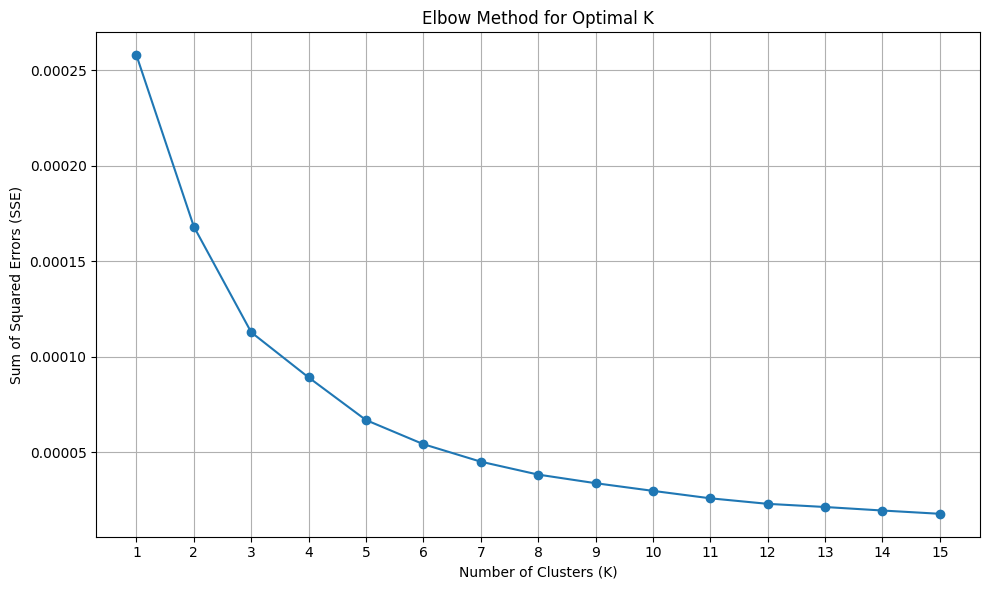

Elbow Method plot saved to kmeans_elbow_method.png
Suggested K from Elbow Method (heuristic): 2

Running Silhouette Score analysis...


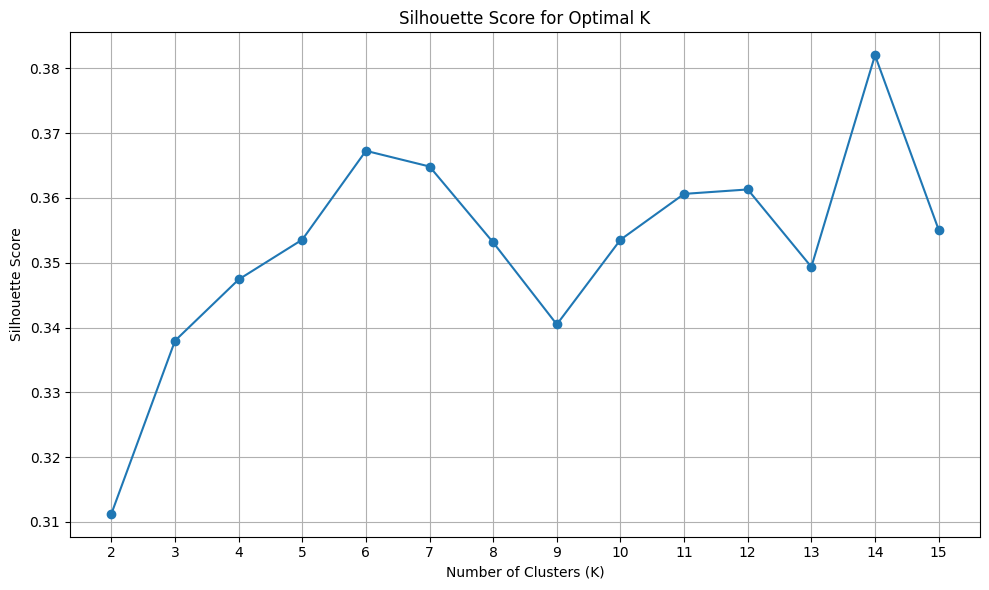

Silhouette Score plot saved to kmeans_silhouette_score.png
Suggested K from Silhouette Score: 14

--- K-Means Cluster Analysis Complete (for reference) ---

This analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = 12.

--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = 12 ---
Clustering for FIXED_M_CLUSTERS = 12 complete.

--- Starting ACO Convergence and Runtime Analysis for various Q_UAVS ---

Processing Q_UAVS = 2 (with K=12)...


/tmp/ipython-input-3-438117013.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for Q=2 finished. Runtime: 24.42s, Best Cost: 12.41km

Processing Q_UAVS = 4 (with K=12)...
  ACO for Q=4 finished. Runtime: 15.71s, Best Cost: 12.32km

Processing Q_UAVS = 6 (with K=12)...
  ACO for Q=6 finished. Runtime: 11.20s, Best Cost: 12.36km

Processing Q_UAVS = 8 (with K=12)...
  ACO for Q=8 finished. Runtime: 10.58s, Best Cost: 12.16km

Processing Q_UAVS = 10 (with K=12)...
  ACO for Q=10 finished. Runtime: 10.51s, Best Cost: 12.14km

Processing Q_UAVS = 12 (with K=12)...


  ACO for Q=12 finished. Runtime: 13.95s, Best Cost: 12.18km

--- All ACO runs for Convergence and Runtime Analysis Complete ---

--- Generating detailed visualizations and textual output for K=12, Q_UAVS = 2 ---


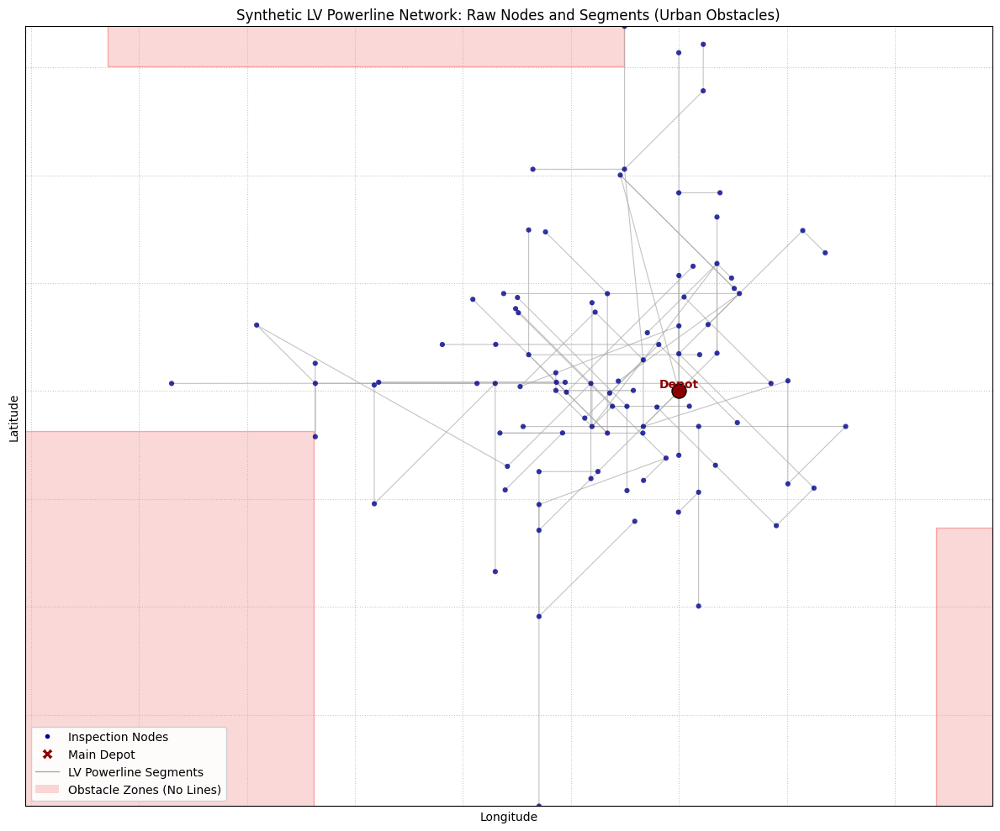

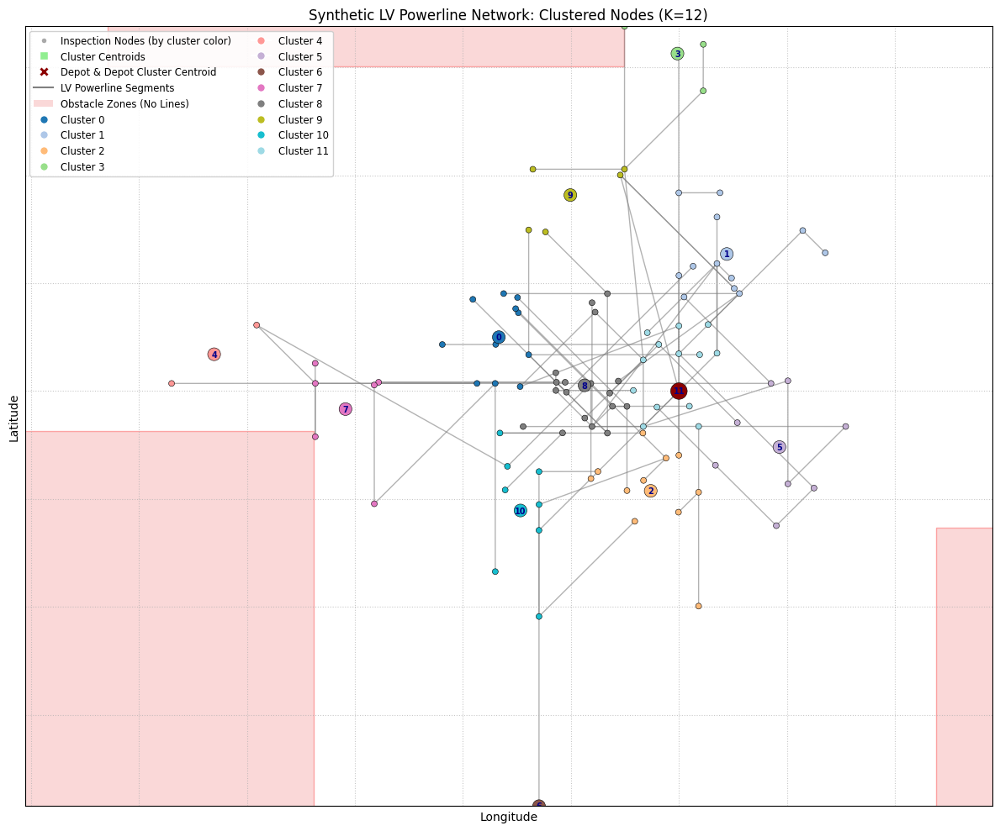

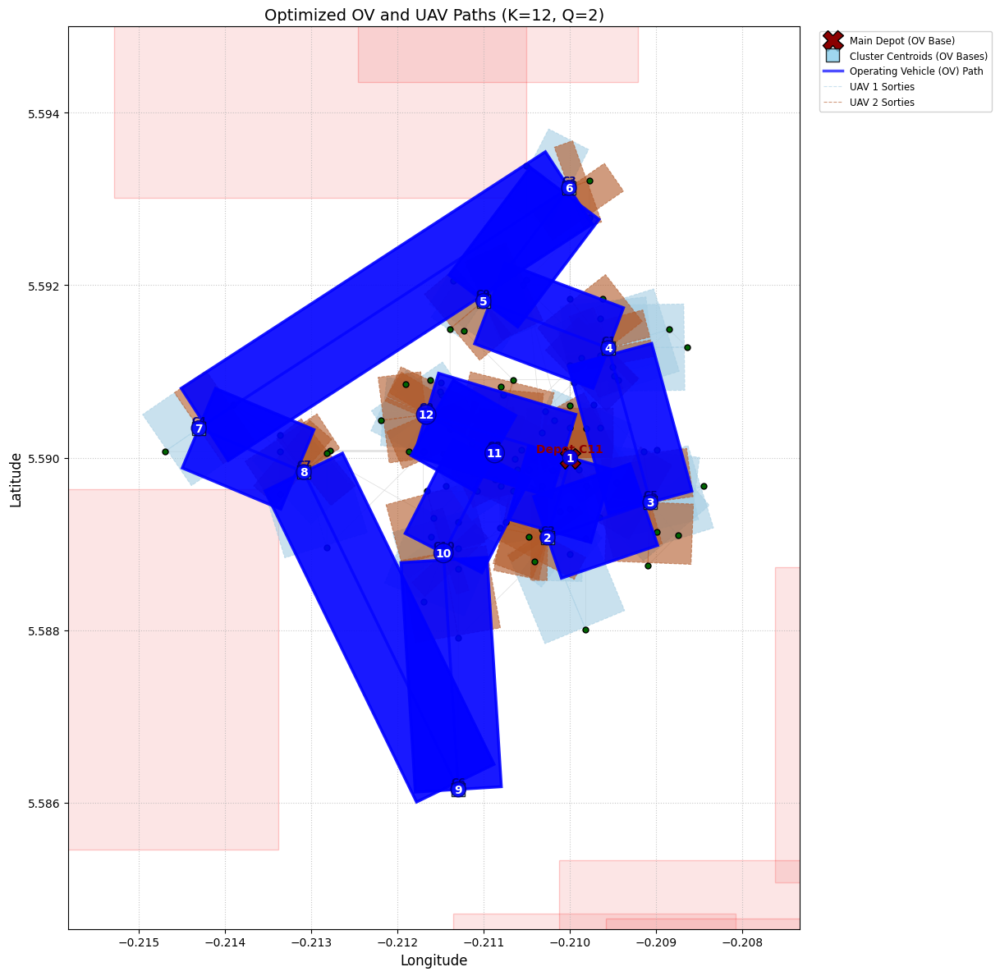


--- Running Evaluation Metrics for K=12, Q_UAVS = 2 ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 95.24% of LV powerline segments traversed.

--- Optimal Path Details for K=12, Q_UAVS = 2 ---
Best Total Path Cost: 12.41 km

OV Best Path Order (Cluster IDs):
DEPOT(11) -> C2 -> C5 -> C1 -> C9 -> C3 -> C4 -> C7 -> C6 -> C10 -> C8 -> C0 -> DEPOT(11)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 11 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C11 -> 25 -> OV_C11; OV_C11 -> 65 -> OV_C11; OV_C11 -> 40 -> OV_C11; OV_C11 -> 2 -> OV_C11; OV_C11 -> 91 -> OV_C11; OV_C11 -> 44 -> OV_C11; OV_C11 -> 7 -> OV_C11
    UAV 1: OV_C11 -> 1 -> OV_C11; OV_C11 -> 14 -> OV_C11; OV_C11 -> 27 -> OV_C11; OV_C11 -> 6 -> OV_C11; OV_C11 -> 67 -> OV_C11; OV_C11 -> 47 -> OV_C11; OV_C11 -> 0 -> OV_C11
  Cluster 2 (OV Base at [5.5891, -0.2103]):
    UAV 0: OV_C2 -> 78 -> OV_C2; OV_C2 -> 17 -> OV_C2; OV_C2 -> 55 -> OV_C2; OV_C2 -> 19 -> OV_C2; OV_C2 -> 77 

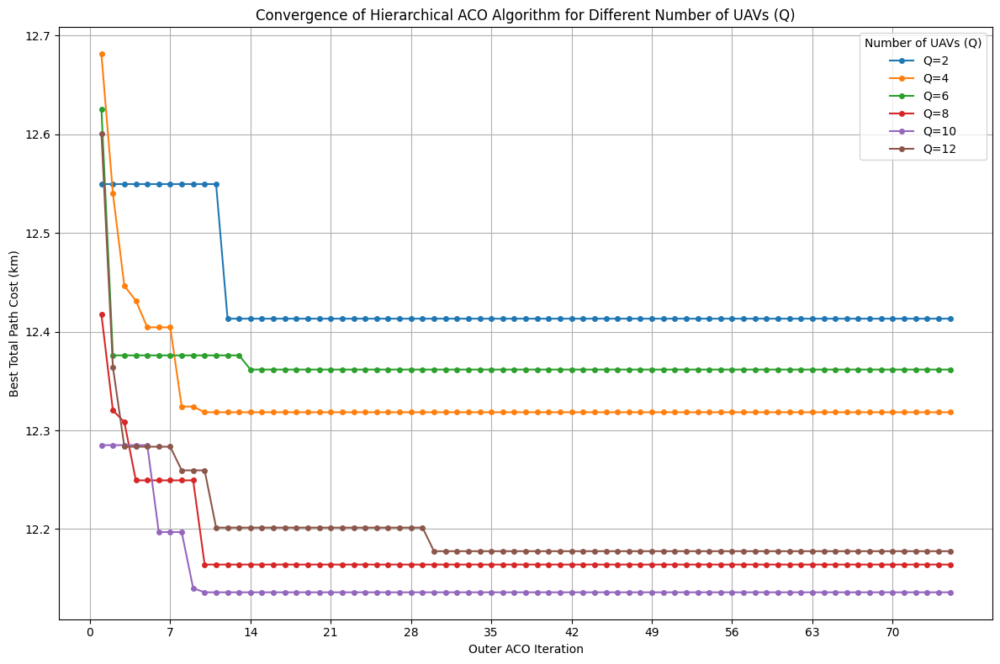

Combined convergence plot saved to aco_convergence_plot_all_q.png

--- Plotting Runtime Comparison for all Q values ---


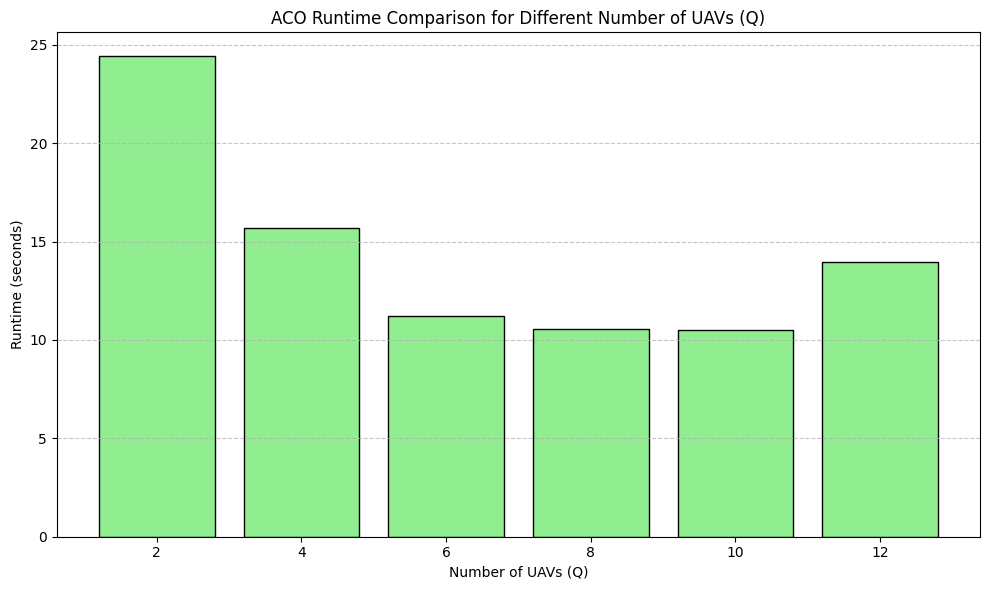

Runtime comparison plot for Q values saved to aco_runtime_comparison_q_values.png

--- Updating and Saving Final Simulation Results to Google Drive ---
Saving final simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Final data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json


Add edge coverage graph


--- Mounting Google Drive ---
Google Drive already mounted.

--- Loading Network Data from Google Drive ---
Network data loaded successfully. ACO parameters are defined in the code.
Loaded network contains 100 nodes.

Building UAV distances matrix and NetworkX graph for the loaded network...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.03 seconds.
UAV distances matrix and NetworkX graph built.

--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---
Testing K from 1 to 15 for Elbow Method, and 2 to 15 for Silhouette Score.

Running Elbow Method...


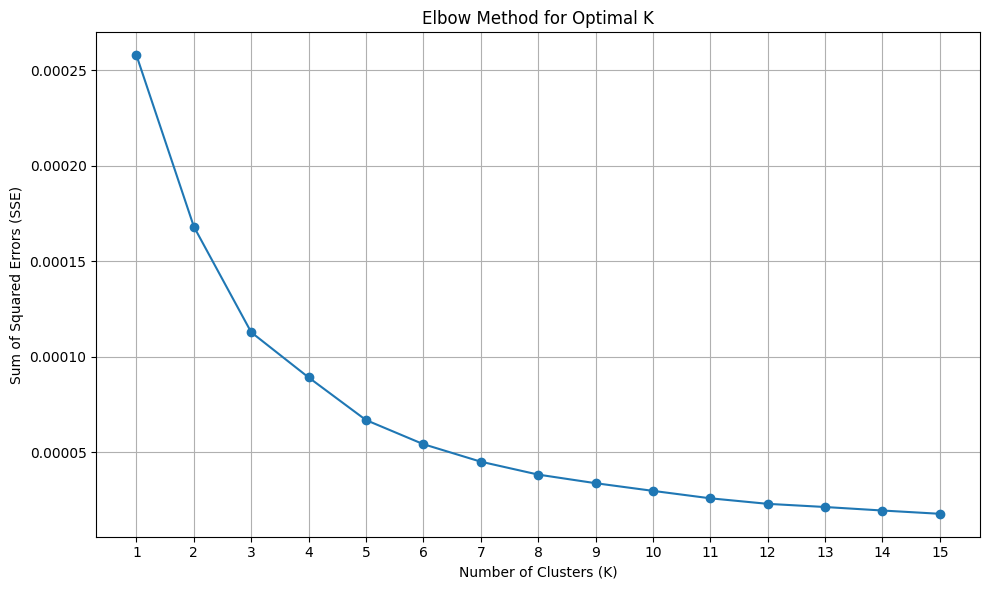

Elbow Method plot saved to kmeans_elbow_method.png
Suggested K from Elbow Method (heuristic): 2

Running Silhouette Score analysis...


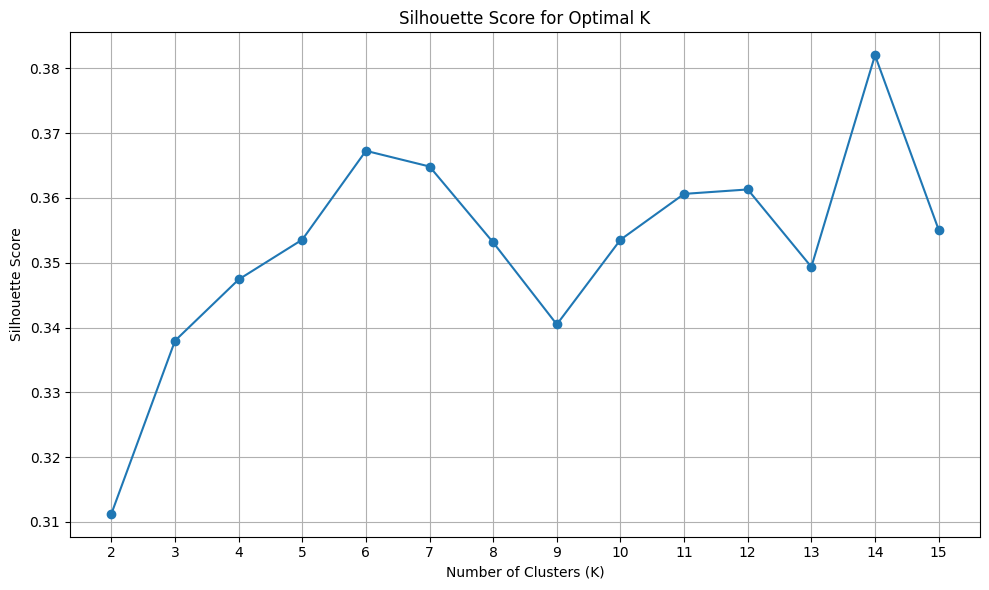

Silhouette Score plot saved to kmeans_silhouette_score.png
Suggested K from Silhouette Score: 14

--- K-Means Cluster Analysis Complete (for reference) ---

This analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = 12.

--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = 12 ---
Clustering for FIXED_M_CLUSTERS = 12 complete.

--- Starting ACO Convergence, Runtime, and Coverage Analysis for various Q_UAVS ---

Processing Q_UAVS = 2 (with K=12)...


/tmp/ipython-input-4-1350722772.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  ACO for Q=2 finished. Runtime: 24.34s, Best Cost: 12.27km
  Node Coverage: 100.00% | Edge Coverage: 95.24%

Processing Q_UAVS = 4 (with K=12)...
  ACO for Q=4 finished. Runtime: 17.47s, Best Cost: 12.23km
  Node Coverage: 100.00% | Edge Coverage: 95.24%

Processing Q_UAVS = 6 (with K=12)...
  ACO for Q=6 finished. Runtime: 11.20s, Best Cost: 12.29km
  Node Coverage: 100.00% | Edge Coverage: 95.24%

Processing Q_UAVS = 8 (with K=12)...
  ACO for Q=8 finished. Runtime: 11.32s, Best Cost: 12.17km
  Node Coverage: 100.00% | Edge Coverage: 95.24%

Processing Q_UAVS = 10 (with K=12)...
  ACO for Q=10 finished. Runtime: 11.01s, Best Cost: 12.14km
  Node Coverage: 100.00% | Edge Coverage: 95.24%

Processing Q_UAVS = 12 (with K=12)...


  ACO for Q=12 finished. Runtime: 10.40s, Best Cost: 12.13km
  Node Coverage: 100.00% | Edge Coverage: 95.24%

--- All ACO runs for Convergence, Runtime, and Coverage Analysis Complete ---

--- Generating detailed visualizations and textual output for K=12, Q_UAVS = 2 ---


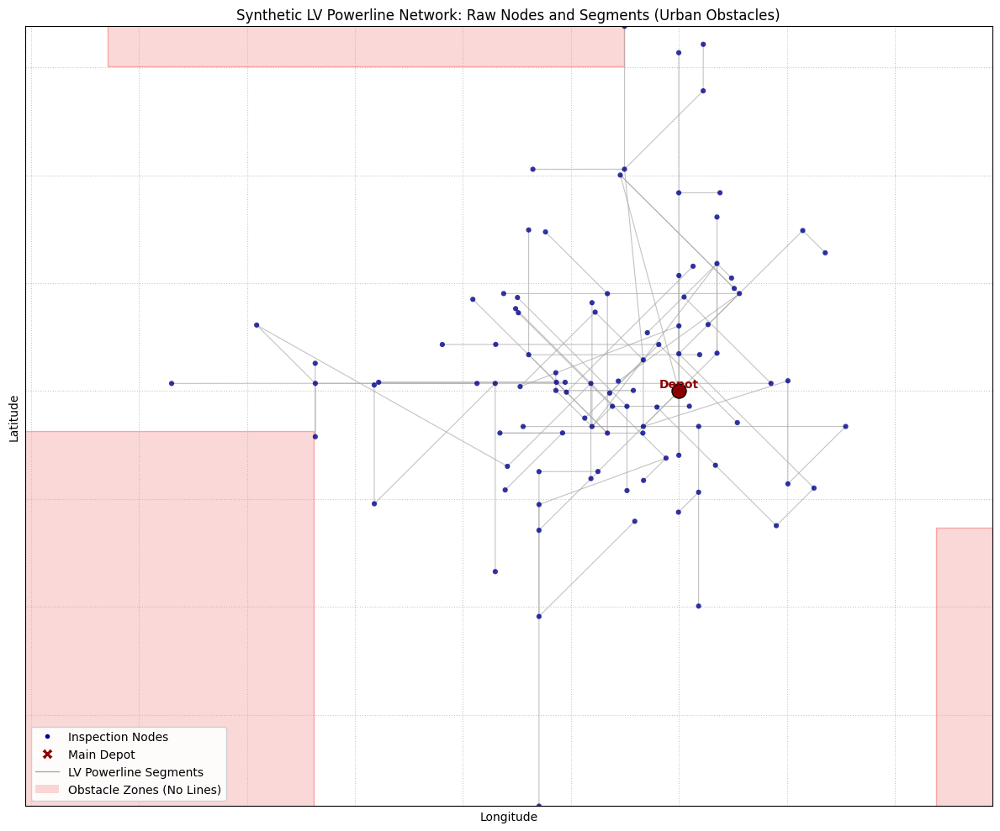

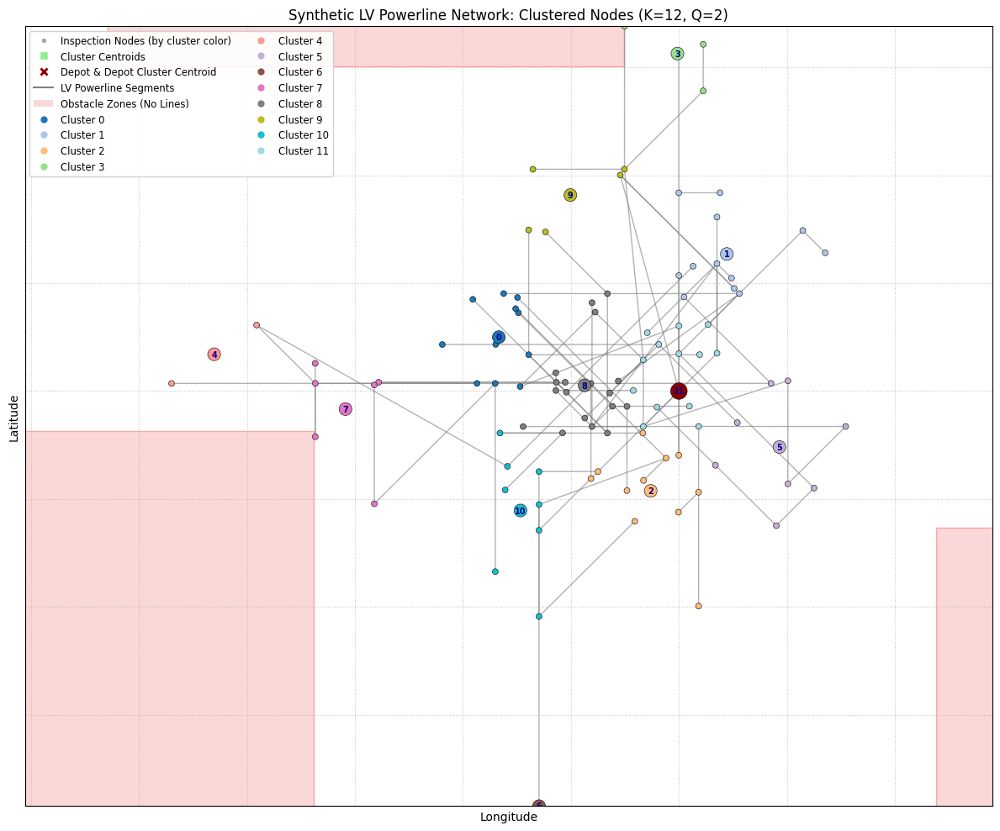

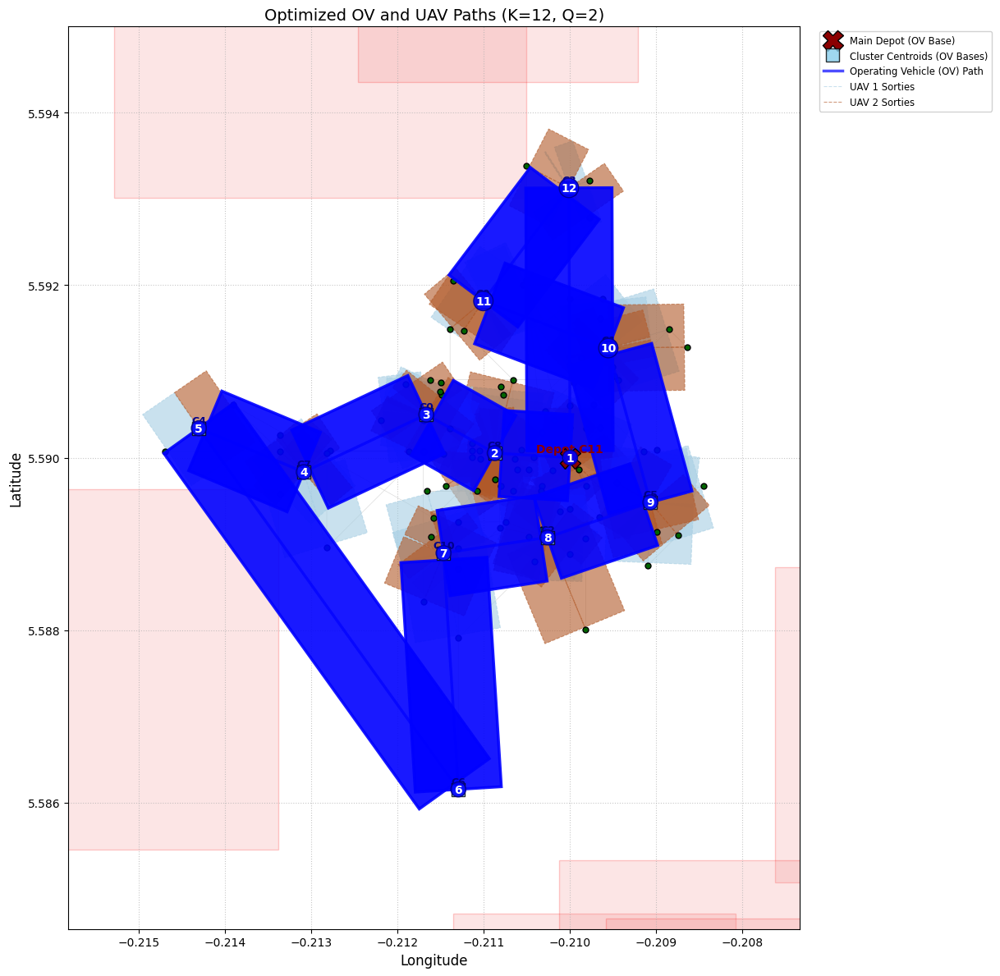


--- Running Evaluation Metrics for K=12, Q_UAVS = 2 ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 95.24% of LV powerline segments traversed.

--- Optimal Path Details for K=12, Q_UAVS = 2 ---
Best Total Path Cost: 12.27 km

OV Best Path Order (Cluster IDs):
DEPOT(11) -> C8 -> C0 -> C7 -> C4 -> C6 -> C10 -> C2 -> C5 -> C1 -> C9 -> C3 -> DEPOT(11)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 11 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C11 -> 47 -> OV_C11; OV_C11 -> 1 -> OV_C11; OV_C11 -> 67 -> OV_C11; OV_C11 -> 27 -> OV_C11; OV_C11 -> 40 -> OV_C11; OV_C11 -> 0 -> OV_C11; OV_C11 -> 91 -> OV_C11
    UAV 1: OV_C11 -> 25 -> OV_C11; OV_C11 -> 65 -> OV_C11; OV_C11 -> 7 -> OV_C11; OV_C11 -> 2 -> OV_C11; OV_C11 -> 14 -> OV_C11; OV_C11 -> 6 -> OV_C11; OV_C11 -> 44 -> OV_C11
  Cluster 8 (OV Base at [5.5901, -0.2109]):
    UAV 0: OV_C8 -> 13 -> OV_C8; OV_C8 -> 29 -> OV_C8; OV_C8 -> 37 -> OV_C8; OV_C8 -> 31 -> OV_C8; OV_C8 -> 21 

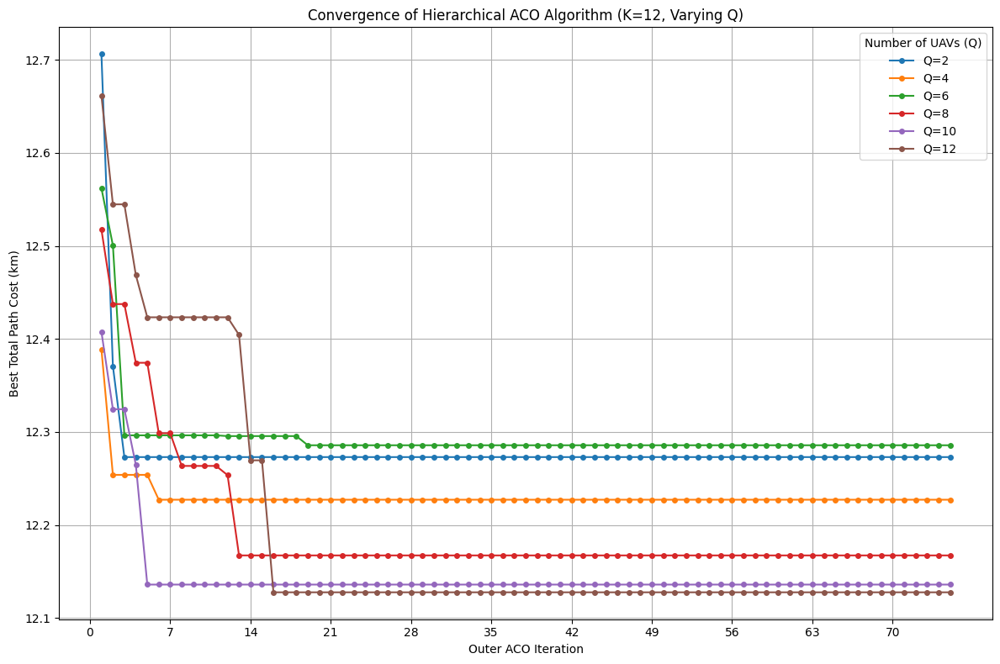

Combined convergence plot saved to aco_convergence_plot_all_q.png

--- Plotting Runtime Comparison for all Q values ---


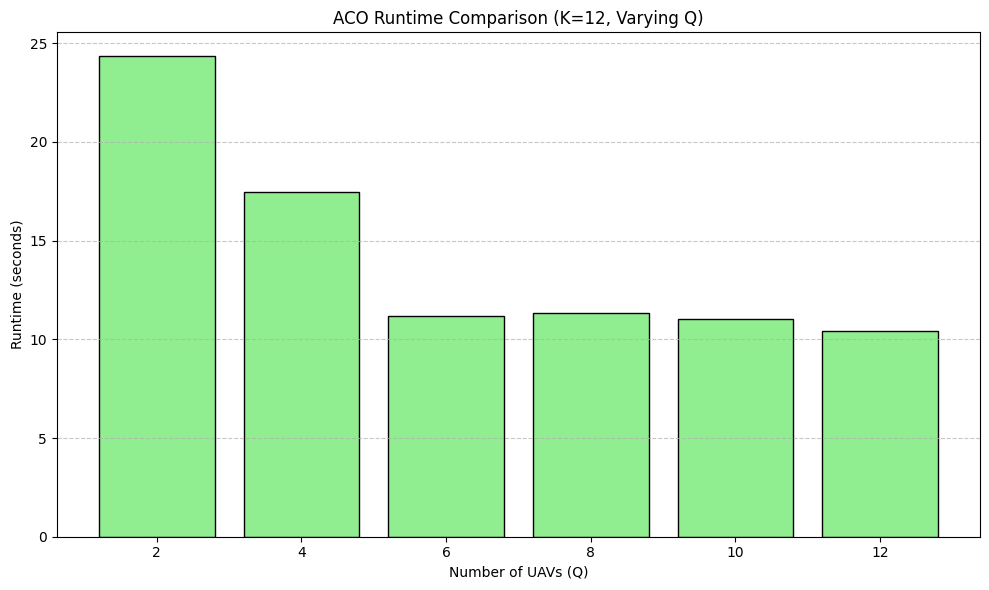

Runtime comparison plot for Q values saved to aco_runtime_comparison_q_values.png

--- Plotting Node Coverage Comparison for all Q values ---


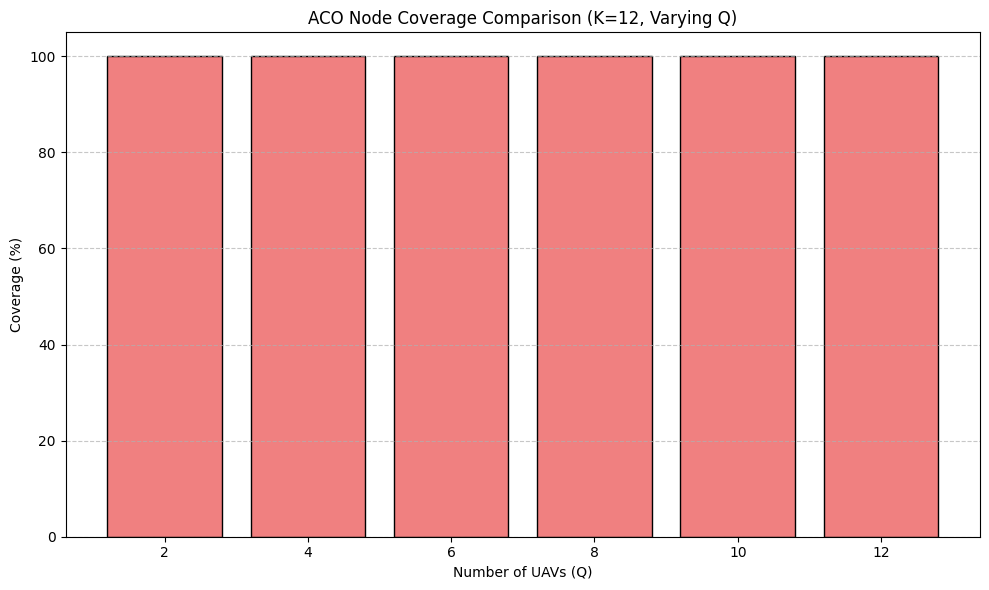

Node Coverage comparison plot for Q values saved to aco_node_coverage_comparison_q_values.png

--- Plotting Edge Coverage Comparison for all Q values ---


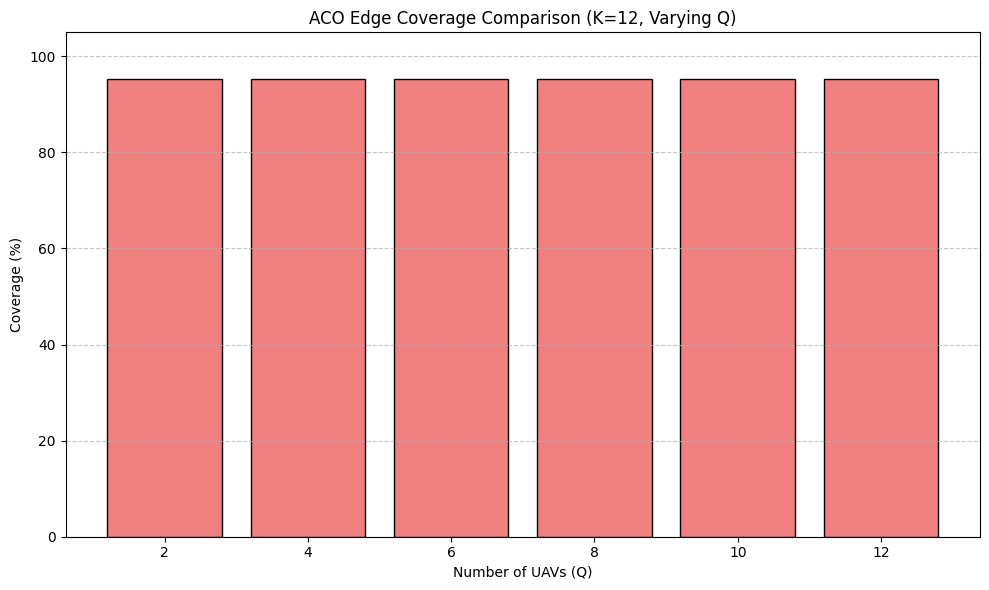

Edge Coverage comparison plot for Q values saved to aco_edge_coverage_comparison_q_values.png

--- Updating and Saving Final Simulation Results to Google Drive ---
Saving final simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Final data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json


In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness, but not used when LOAD_FROM_SAVED_DATASET is True) ---
# These parameters are for the network generation function, which won't be called if loading from file.
ACCRA_LAT_RANGE = 0.02
ACCRA_LON_RANGE = 0.02
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2
MIN_LV_SEGMENT_KM = 0.01
MAX_LV_SEGMENT_KM = 0.20

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    This function is included for completeness but will not be called in this setup
    as LOAD_FROM_SAVED_DATASET is True.
    """
    nodes = []
    edges = []
    current_node_id = 0
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1
    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []
    obstacle_zones = []
    depot_zone_buffer = 0.002
    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1
    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False
    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False
    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001
    global_attempts = 0
    max_global_attempts = num_nodes * 500
    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1
        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)
        if from_node_id >= len(nodes): continue
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']
        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2
        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))
        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))
        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))
            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)
            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue
            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)
            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue
            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue
            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}
    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)
    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))
    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0
    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))
    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else:
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {}

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)}

        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf')

        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3):
                    if i + 1 < len(q_route_original_ids):
                        v_original_id = q_route_original_ids[i+1]
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}

    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx)

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id, obstacle_zones_data):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, obstacle_zones_data, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.3, zorder=0)
        plt.gca().add_patch(rect)

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title(f"Synthetic LV Powerline Network: Clustered Nodes (K={num_clusters_for_title}, Q={num_uavs_for_title})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments'),
        plt.Rectangle((0, 0), 1, 1, fc="lightcoral", alpha=0.3, label="Obstacle Zones (No Lines)")
    ]
    for i in range(num_clusters_for_title): # Use num_clusters_for_title to match the clustering
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig(f"synthetic_lv_network_clustered_K{num_clusters_for_title}_Q{num_uavs_for_title}.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS, bbox_coords, depot_actual_node_id, obstacle_zones_data, generated_lv_edges, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    for zone in obstacle_zones_data:
        rect = plt.Rectangle((zone['lon_min'], zone['lat_min']),
                             zone['lon_max'] - zone['lon_min'],
                             zone['lat_max'] - zone['lat_min'],
                             facecolor='lightcoral', edgecolor='red', alpha=0.2, zorder=0)
        ax.add_patch(rect)

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS) # Q_UAVS is the current num UAVs being plotted
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS > 1: # Use Q_UAVS from function argument for colormap scaling
                            normalized_uav_q = uav_q / (Q_UAVS - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title(f"Optimized OV and UAV Paths (K={num_clusters_for_title}, Q={num_uavs_for_title})", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig(f"optimized_paths_ov_uav_synthetic_lv_enhanced_K{num_clusters_for_title}_Q{num_uavs_for_title}.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Optimal Cluster Analysis Functions (Elbow and Silhouette) ---

def plot_elbow_method(data_coords, max_clusters=15):
    """
    Plots the Elbow Method for K-Means to help determine optimal K.
    """
    sse = []
    if len(data_coords) < 1:
        print("Not enough data points for Elbow method.")
        return

    max_k_effective = min(max_clusters, len(data_coords))
    k_range = range(1, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(data_coords)
        sse.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.xticks(list(k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_elbow_method.png")
    plt.show()
    print("Elbow Method plot saved to kmeans_elbow_method.png")

    if len(sse) > 2:
        diffs = np.diff(sse)
        diff_of_diffs = np.diff(diffs)
        optimal_k_elbow = np.argmax(diff_of_diffs) + 2
        print(f"Suggested K from Elbow Method (heuristic): {optimal_k_elbow}")
    return sse

def plot_silhouette_score(data_coords, max_clusters=15):
    """
    Plots the Silhouette Score for K-Means to help determine optimal K.
    """
    silhouette_scores = []

    if len(data_coords) < 2:
        print("Not enough data points for Silhouette Score (requires at least 2).")
        return

    max_k_effective = min(max_clusters, len(data_coords) - 1)
    if max_k_effective < 2:
        print("Not enough data points to compute Silhouette Score for multiple clusters.")
        return

    k_range = range(2, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_coords)
        if len(set(labels)) < 2:
            silhouette_scores.append(-1)
            print(f"Skipping Silhouette for K={k} as only 1 cluster formed.")
            continue
        try:
            score = silhouette_score(data_coords, labels)
            silhouette_scores.append(score)
        except ValueError as e:
            print(f"Could not calculate Silhouette Score for K={k}: {e}")
            silhouette_scores.append(-1)

    if not silhouette_scores or all(s == -1 for s in silhouette_scores):
        print("No valid Silhouette Scores could be computed.")
        return

    valid_k_range = [k_range[i] for i, score in enumerate(silhouette_scores) if score != -1]
    valid_scores = [score for score in silhouette_scores if score != -1]

    if not valid_scores:
        print("No valid Silhouette Scores to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.plot(valid_k_range, valid_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.xticks(list(valid_k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_silhouette_score.png")
    plt.show()
    print("Silhouette Score plot saved to kmeans_silhouette_score.png")

    optimal_k_silhouette = valid_k_range[np.argmax(valid_scores)]
    print(f"Suggested K from Silhouette Score: {optimal_k_silhouette}")
    return silhouette_scores

def plot_convergence_analysis_varying_q(convergence_data_by_q, ov_aco_iterations, fixed_m_clusters):
    """
    Plots the convergence curves for different Q_UAVS values.
    """
    plt.figure(figsize=(12, 8))
    for q_val, history in convergence_data_by_q.items():
        if history:
            plt.plot(range(1, len(history) + 1), history, marker='o', linestyle='-', markersize=4, label=f'Q={q_val}')

    plt.title(f'Convergence of Hierarchical ACO Algorithm (K={fixed_m_clusters}, Varying Q)')
    plt.xlabel('Outer ACO Iteration')
    plt.ylabel('Best Total Path Cost (km)')
    plt.grid(True)
    plt.xticks(np.arange(0, ov_aco_iterations + 1, max(1, ov_aco_iterations // 10)))
    plt.legend(title='Number of UAVs (Q)')
    plt.tight_layout()
    plt.savefig("aco_convergence_plot_all_q.png")
    plt.show()
    print("Combined convergence plot saved to aco_convergence_plot_all_q.png")

def plot_runtime_comparison_varying_q(runtimes_data, fixed_m_clusters):
    """
    Plots a bar chart comparing the runtime for different Q_UAVS values.
    """
    q_values = sorted(runtimes_data.keys())
    runtimes = [runtimes_data[q] for q in q_values]

    plt.figure(figsize=(10, 6))
    plt.bar([str(q) for q in q_values], runtimes, color='lightgreen', edgecolor='black')
    plt.xlabel('Number of UAVs (Q)')
    plt.ylabel('Runtime (seconds)')
    plt.title(f'ACO Runtime Comparison (K={fixed_m_clusters}, Varying Q)')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("aco_runtime_comparison_q_values.png")
    plt.show()
    print("Runtime comparison plot for Q values saved to aco_runtime_comparison_q_values.png")

def plot_coverage_comparison(coverage_data, title_suffix, filename, fixed_m_clusters):
    """
    Plots a bar chart comparing node or edge coverage for different Q_UAVS values.
    """
    q_values = sorted(coverage_data.keys())
    coverages = [coverage_data[q] for q in q_values]

    plt.figure(figsize=(10, 6))
    plt.bar([str(q) for q in q_values], coverages, color='lightcoral', edgecolor='black')
    plt.xlabel('Number of UAVs (Q)')
    plt.ylabel('Coverage (%)')
    plt.title(f'ACO {title_suffix} Comparison (K={fixed_m_clusters}, Varying Q)')
    plt.ylim(0, 105) # Ensure y-axis shows 0-100% clearly
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    print(f"{title_suffix} comparison plot for Q values saved to {filename}")


# --- Main Execution Flow ---

# Configuration: Always load from JSON for network data. ACO parameters are defined here.
LOAD_FROM_SAVED_DATASET = True

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# --- ACO and Simulation Parameters (DEFINED HERE) ---
N_NODES_CONFIG = 100 # Original number of nodes when dataset was generated (informational)
FIXED_M_CLUSTERS = 12 # <--- FIXED NUMBER OF CLUSTERS
R_UAV_KM = 5.0 # UAV flight range in km

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50,
    'n_ants_uav': 6,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0,
    'tau0_uav': 1.0
}
# --- END ACO and Simulation Parameters ---

# --- UAV counts for Analysis ---
Q_UAVS_FOR_ANALYSIS = [2, 4, 6, 8, 10, 12]
VISUALIZATION_Q_UAVS = 2 # Generate full visualizations for this Q value

# Global variables for loaded network data
all_nodes_original = [] # Will hold the original loaded nodes
depot_actual_node_id_original = -1
generated_lv_edges_original = []
bbox_coords_original = (0, 0, 0, 0)
obstacle_zones_data_original = []
uav_distances_matrix_original = None
uav_graph_nx_original = None

# Variables that hold the results for the VISUALIZATION_Q_UAVS setting
visual_all_nodes = []
visual_cluster_centroids = {}
visual_depot_cluster_id = -1
visual_best_overall_cost = float('inf')
visual_best_ov_path_ids = []
visual_best_uav_paths_in_clusters = {}
visual_convergence_history = []


# Store results for each Q during the analysis loop
convergence_histories_all_q = {}
runtimes_all_q = {}
node_coverages_all_q = {} # New: Stores node coverage for each Q
edge_coverages_all_q = {} # New: Stores edge coverage for each Q


print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    exit()


print("\n--- Loading Network Data from Google Drive ---")
if not os.path.exists(SAVED_FILE_PATH):
    print(f"Error: Saved file not found at {SAVED_FILE_PATH}")
    print("Please check the path or generate a new dataset first (by setting LOAD_FROM_SAVED_DATASET=False in a previous run).")
    exit()

try:
    with open(SAVED_FILE_PATH, 'r') as f:
        loaded_data = json.load(f)

    globals()['all_nodes_original'] = loaded_data['nodes']
    globals()['depot_actual_node_id_original'] = loaded_data['depot_actual_node_id']
    globals()['generated_lv_edges_original'] = loaded_data['generated_lv_edges']
    globals()['bbox_coords_original'] = loaded_data['bbox_coords']
    globals()['obstacle_zones_data_original'] = loaded_data['obstacle_zones_data']

    if 'simulation_parameters' in loaded_data and 'N_NODES' in loaded_data['simulation_parameters']:
        globals()['N_NODES_CONFIG'] = loaded_data['simulation_parameters']['N_NODES']


    print("Network data loaded successfully. ACO parameters are defined in the code.")
    print(f"Loaded network contains {len(all_nodes_original)} nodes.")

except Exception as e:
    print(f"Error loading network data from file: {e}")
    print("Please check the file content or path.")
    exit()

# Build UAV distances matrix and NetworkX graph once for the loaded network
print("\nBuilding UAV distances matrix and NetworkX graph for the loaded network...")
uav_distances_matrix_original, uav_graph_nx_original = build_uav_distances_matrix_from_edges_nx(all_nodes_original, generated_lv_edges_original)
print("UAV distances matrix and NetworkX graph built.")

# --- Perform Optimal K-Means Clustering Analysis on the loaded data (informational) ---
print("\n--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---")
coords_for_kmeans_analysis = np.array([[node['lat'], node['lon']] for node in all_nodes_original])

if len(coords_for_kmeans_analysis) == 0:
    print("No data points available for cluster analysis. Skipping.")
else:
    max_clusters_to_test = min(len(coords_for_kmeans_analysis) - 1, 15)
    if max_clusters_to_test < 2:
        print(f"Warning: Only {len(coords_for_kmeans_analysis)} nodes. Cannot perform comprehensive cluster analysis.")
    else:
        print(f"Testing K from 1 to {max_clusters_to_test} for Elbow Method, and 2 to {max_clusters_to_test} for Silhouette Score.")
        print("\nRunning Elbow Method...")
        plot_elbow_method(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\nRunning Silhouette Score analysis...")
        plot_silhouette_score(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\n--- K-Means Cluster Analysis Complete (for reference) ---")
        print(f"\nThis analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS}.")


# --- Perform K-Means Clustering ONCE for FIXED_M_CLUSTERS ---
print(f"\n--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} ---")
current_all_nodes_clustered = [node.copy() for node in all_nodes_original] # Deep copy for modification
coords_fixed_k = np.array([[node['lat'], node['lon']] for node in current_all_nodes_clustered])

if len(current_all_nodes_clustered) < FIXED_M_CLUSTERS:
    print(f"Error: Number of nodes ({len(current_all_nodes_clustered)}) is less than FIXED_M_CLUSTERS ({FIXED_M_CLUSTERS}). Cannot proceed with clustering. Exiting.")
    exit()

kmeans_fixed_k = KMeans(n_clusters=FIXED_M_CLUSTERS, random_state=42, n_init=10)
labels_fixed_k = kmeans_fixed_k.fit_predict(coords_fixed_k)

fixed_clusters_data = {i: [] for i in range(FIXED_M_CLUSTERS)}
for i, label in enumerate(labels_fixed_k):
    current_all_nodes_clustered[i]['cluster_id'] = label
    fixed_clusters_data[label].append(current_all_nodes_clustered[i])

fixed_cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans_fixed_k.cluster_centers_)}

fixed_depot_node_obj = next(node for node in current_all_nodes_clustered if node['id'] == depot_actual_node_id_original)
fixed_depot_cluster_id = fixed_depot_node_obj['cluster_id']
fixed_cluster_centroids[fixed_depot_cluster_id]['lat'] = DEPOT_COORD['lat']
fixed_cluster_centroids[fixed_depot_cluster_id]['lon'] = DEPOT_COORD['lon']
fixed_cluster_centroids[fixed_depot_cluster_id]['id'] = f"D{fixed_depot_cluster_id}" # Assign a string ID

fixed_all_clusters_for_aco = {
    'centroids': fixed_cluster_centroids,
    'node_sets': fixed_clusters_data
}
print(f"Clustering for FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} complete.")


# --- Main Loop for ACO Convergence and Runtime Analysis (Varying Q) ---
print("\n--- Starting ACO Convergence, Runtime, and Coverage Analysis for various Q_UAVS ---")

for current_q_uavs in Q_UAVS_FOR_ANALYSIS:
    print(f"\nProcessing Q_UAVS = {current_q_uavs} (with K={FIXED_M_CLUSTERS})...")

    start_time_aco = time.time()
    iter_best_cost, iter_best_ov_path_ids, iter_best_uav_paths_in_clusters, iter_convergence_history = solve_outer_aco(
        fixed_depot_cluster_id,
        fixed_all_clusters_for_aco,
        current_all_nodes_clustered,
        uav_distances_matrix_original,
        current_q_uavs,
        R_UAV_KM,
        OV_ACO_PARAMS,
        UAV_ACO_PARAMS
    )
    end_time_aco = time.time()
    iter_runtime = end_time_aco - start_time_aco

    print(f"  ACO for Q={current_q_uavs} finished. Runtime: {iter_runtime:.2f}s, Best Cost: {iter_best_cost:.2f}km")

    # Calculate and store coverage for the current Q value
    current_node_coverage = calculate_node_coverage(current_all_nodes_clustered, depot_actual_node_id_original, iter_best_uav_paths_in_clusters)
    current_edge_coverage = calculate_edge_coverage(current_all_nodes_clustered, generated_lv_edges_original, iter_best_uav_paths_in_clusters, fixed_cluster_centroids, uav_graph_nx_original)

    print(f"  Node Coverage: {current_node_coverage:.2f}% | Edge Coverage: {current_edge_coverage:.2f}%")


    convergence_histories_all_q[current_q_uavs] = iter_convergence_history
    runtimes_all_q[current_q_uavs] = iter_runtime
    node_coverages_all_q[current_q_uavs] = current_node_coverage # Store current node coverage
    edge_coverages_all_q[current_q_uavs] = current_edge_coverage # Store current edge coverage

    # Store full results if this is the Q for visualization
    if current_q_uavs == VISUALIZATION_Q_UAVS:
        globals()['visual_all_nodes'] = current_all_nodes_clustered
        globals()['visual_cluster_centroids'] = fixed_cluster_centroids
        globals()['visual_depot_cluster_id'] = fixed_depot_cluster_id
        globals()['visual_best_overall_cost'] = iter_best_cost
        globals()['visual_best_ov_path_ids'] = iter_best_ov_path_ids
        globals()['visual_best_uav_paths_in_clusters'] = iter_best_uav_paths_in_clusters
        globals()['visual_convergence_history'] = iter_convergence_history


print("\n--- All ACO runs for Convergence, Runtime, and Coverage Analysis Complete ---")


# --- Final Visualizations and Textual Output (Only for VISUALIZATION_Q_UAVS) ---
if visual_best_overall_cost != float('inf'):
    print(f"\n--- Generating detailed visualizations and textual output for K={FIXED_M_CLUSTERS}, Q_UAVS = {VISUALIZATION_Q_UAVS} ---")

    plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in visual_all_nodes}
    node_labels_map = {node['id']: str(node['id']) for node in visual_all_nodes}

    centroid_plot_ids_map = {}
    for c_id, centroid in visual_cluster_centroids.items():
        plot_id = f"C{c_id}"
        if c_id == visual_depot_cluster_id:
            plot_id = f"DepotC{c_id}"
        plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
        node_labels_map[plot_id] = str(c_id)
        centroid_plot_ids_map[c_id] = plot_id

    cluster_colors_map = plt.get_cmap('tab20', FIXED_M_CLUSTERS)

    plot_raw_powerline_network(all_nodes_original, generated_lv_edges_original, bbox_coords_original, DEPOT_COORD, depot_actual_node_id_original, obstacle_zones_data_original)

    plot_clustered_powerline_network_nx(visual_all_nodes, visual_cluster_centroids, visual_depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges_original, bbox_coords_original, depot_actual_node_id_original, obstacle_zones_data_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=VISUALIZATION_Q_UAVS)

    plot_best_paths_nx(visual_all_nodes, visual_best_ov_path_ids, visual_best_uav_paths_in_clusters, visual_cluster_centroids, visual_depot_cluster_id, plot_nodes_coords, VISUALIZATION_Q_UAVS, bbox_coords_original, depot_actual_node_id_original, obstacle_zones_data_original, generated_lv_edges_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=VISUALIZATION_Q_UAVS)

    print(f"\n--- Running Evaluation Metrics for K={FIXED_M_CLUSTERS}, Q_UAVS = {VISUALIZATION_Q_UAVS} ---")
    node_coverage = calculate_node_coverage(visual_all_nodes, depot_actual_node_id_original, visual_best_uav_paths_in_clusters)
    print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")
    edge_coverage = calculate_edge_coverage(visual_all_nodes, generated_lv_edges_original, visual_best_uav_paths_in_clusters, visual_cluster_centroids, uav_graph_nx_original)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")


    print(f"\n--- Optimal Path Details for K={FIXED_M_CLUSTERS}, Q_UAVS = {VISUALIZATION_Q_UAVS} ---")
    print(f"Best Total Path Cost: {visual_best_overall_cost:.2f} km")

    print("\nOV Best Path Order (Cluster IDs):")
    ov_path_str_display = []
    for c_id in visual_best_ov_path_ids:
        if c_id == visual_depot_cluster_id:
            ov_path_str_display.append(f"DEPOT({c_id})")
        else:
            ov_path_str_display.append(f"C{c_id}")
    print(" -> ".join(ov_path_str_display))

    print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
    for cluster_id, uav_routes in visual_best_uav_paths_in_clusters.items():
        centroid_display = visual_cluster_centroids[cluster_id]
        print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
        for uav_q, route_nodes_ids in uav_routes.items():
            if route_nodes_ids:
                display_sorties = []
                for i in range(0, len(route_nodes_ids), 3):
                    if i + 1 < len(route_nodes_ids):
                        display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")
                print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
            else:
                print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")
else:
    print(f"\nNo detailed visualizations or textual output for Q_UAVS={VISUALIZATION_Q_UAVS} because no valid results were stored for it.")


# --- Combined Convergence Analysis Visualization (for all Q values) ---
print("\n--- Plotting Combined Convergence Analysis for all Q values ---")
plot_convergence_analysis_varying_q(convergence_histories_all_q, OV_ACO_PARAMS['iters_ov'], FIXED_M_CLUSTERS)


# --- Runtime Comparison Visualization ---
print("\n--- Plotting Runtime Comparison for all Q values ---")
plot_runtime_comparison_varying_q(runtimes_all_q, FIXED_M_CLUSTERS)

# --- Node Coverage Comparison Visualization ---
print("\n--- Plotting Node Coverage Comparison for all Q values ---")
plot_coverage_comparison(node_coverages_all_q, "Node Coverage", "aco_node_coverage_comparison_q_values.png", FIXED_M_CLUSTERS)

# --- Edge Coverage Comparison Visualization ---
print("\n--- Plotting Edge Coverage Comparison for all Q values ---")
plot_coverage_comparison(edge_coverages_all_q, "Edge Coverage", "aco_edge_coverage_comparison_q_values.png", FIXED_M_CLUSTERS)


# --- Save final results ---
print("\n--- Updating and Saving Final Simulation Results to Google Drive ---")
try:
    final_data_to_save_raw = {
        "nodes": visual_all_nodes,
        "depot_actual_node_id": depot_actual_node_id_original,
        "generated_lv_edges": generated_lv_edges_original,
        "bbox_coords": bbox_coords_original,
        "obstacle_zones_data": obstacle_zones_data_original,
        "cluster_centroids": visual_cluster_centroids,
        "best_ov_path_ids": visual_best_ov_path_ids,
        "best_uav_paths_in_clusters": visual_best_uav_paths_in_clusters,
        "best_overall_cost": visual_best_overall_cost,
        "convergence_history": visual_convergence_history,
        "convergence_histories_all_q": convergence_histories_all_q,
        "runtimes_all_q": runtimes_all_q,
        "node_coverages_all_q": node_coverages_all_q, # Added to JSON
        "edge_coverages_all_q": edge_coverages_all_q, # Added to JSON
        "simulation_parameters": {
            "N_NODES_CONFIG": N_NODES_CONFIG,
            "FIXED_M_CLUSTERS": FIXED_M_CLUSTERS,
            "Q_UAVS_VISUALIZED": VISUALIZATION_Q_UAVS,
            "Q_UAVS_FOR_ANALYSIS": Q_UAVS_FOR_ANALYSIS,
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

    drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
    full_file_path = os.path.join(drive_folder_path, "ACO_LV_Network_Simulation_dataset.json")

    print(f"Saving final simulation results to: {full_file_path}")
    with open(full_file_path, 'w') as f:
        json.dump(final_data_to_save_converted, f, indent=4)
    print("Final data successfully saved to Google Drive!")
    print(f"File location: {full_file_path}")
except Exception as e:
    print(f"Error saving final data to file: {e}")


MEAN AND STANDARD DEVIATION OF 30 RUNS


--- Mounting Google Drive ---
Google Drive already mounted.

--- Loading Network Data from Google Drive ---
Network data loaded successfully. ACO parameters are defined in the code.
Loaded network contains 100 nodes.

Building UAV distances matrix and NetworkX graph for the loaded network...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.05 seconds.
UAV distances matrix and NetworkX graph built.

--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---
Testing K from 1 to 15 for Elbow Method, and 2 to 15 for Silhouette Score.

Running Elbow Method...


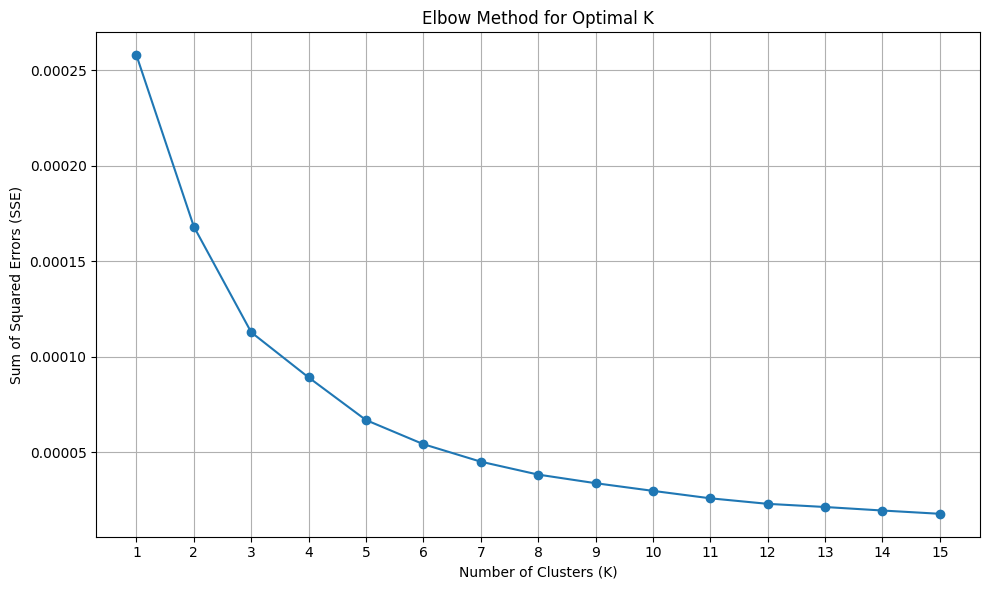

Elbow Method plot saved to kmeans_elbow_method.png
Suggested K from Elbow Method (heuristic): 2

Running Silhouette Score analysis...


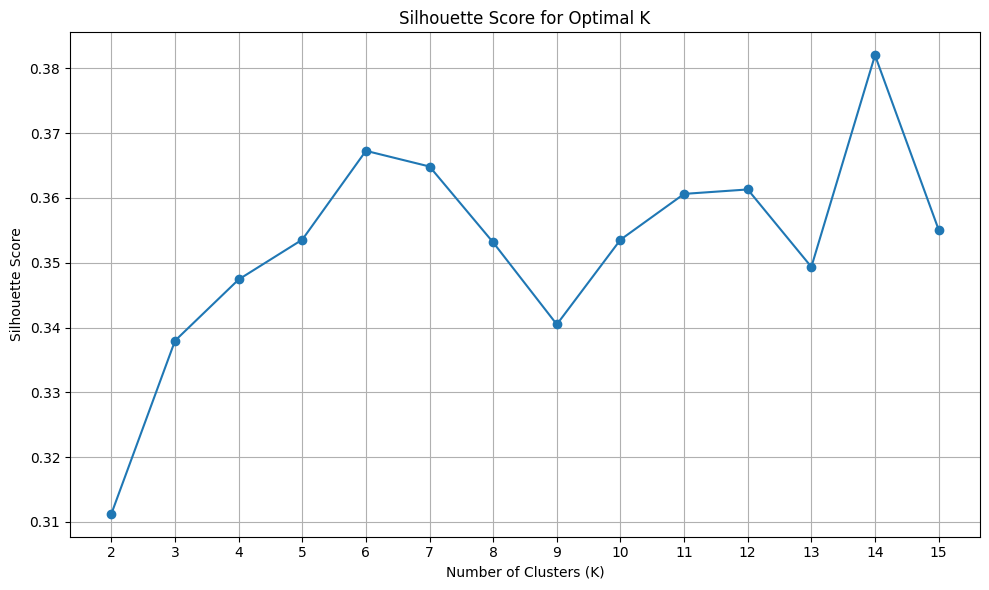

Silhouette Score plot saved to kmeans_silhouette_score.png
Suggested K from Silhouette Score: 14

--- K-Means Cluster Analysis Complete (for reference) ---

This analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = 12.

--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = 12 ---
Clustering for FIXED_M_CLUSTERS = 12 complete.

--- Starting 30 independent ACO runs for K=12, Q=6 ---

Running ACO iteration 1/30...


/tmp/ipython-input-5-3143574237.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  Run 1 finished. Runtime: 18.90s, Best Cost: 12.13km

Running ACO iteration 2/30...
  Run 2 finished. Runtime: 16.89s, Best Cost: 12.23km

Running ACO iteration 3/30...
  Run 3 finished. Runtime: 11.03s, Best Cost: 12.13km

Running ACO iteration 4/30...
  Run 4 finished. Runtime: 15.43s, Best Cost: 12.20km

Running ACO iteration 5/30...
  Run 5 finished. Runtime: 11.25s, Best Cost: 12.20km

Running ACO iteration 6/30...
  Run 6 finished. Runtime: 10.24s, Best Cost: 12.31km

Running ACO iteration 7/30...
  Run 7 finished. Runtime: 10.49s, Best Cost: 12.38km

Running ACO iteration 8/30...
  Run 8 finished. Runtime: 11.25s, Best Cost: 12.16km

Running ACO iteration 9/30...
  Run 9 finished. Runtime: 11.24s, Best Cost: 12.45km

Running ACO iteration 10/30...
  Run 10 finished. Runtime: 10.54s, Best Cost: 12.10km

Running ACO iteration 11/30...
  Run 11 finished. Runtime: 10.02s, Best Cost: 12.13km

Running ACO iteration 12/30...
  Run 12 finished. Runtime: 11.14s, Best Cost: 12.11km

Runn

  Run 30 finished. Runtime: 11.16s, Best Cost: 12.13km

--- All Independent ACO Runs Complete ---

--- Objective Value Statistical Analysis ---
Average Total Path Cost over 30 runs: 12.19 km
Standard Deviation of Total Path Cost over 30 runs: 0.08 km

--- Generating detailed visualizations and textual output for K=12, Q_UAVS = 6 ---


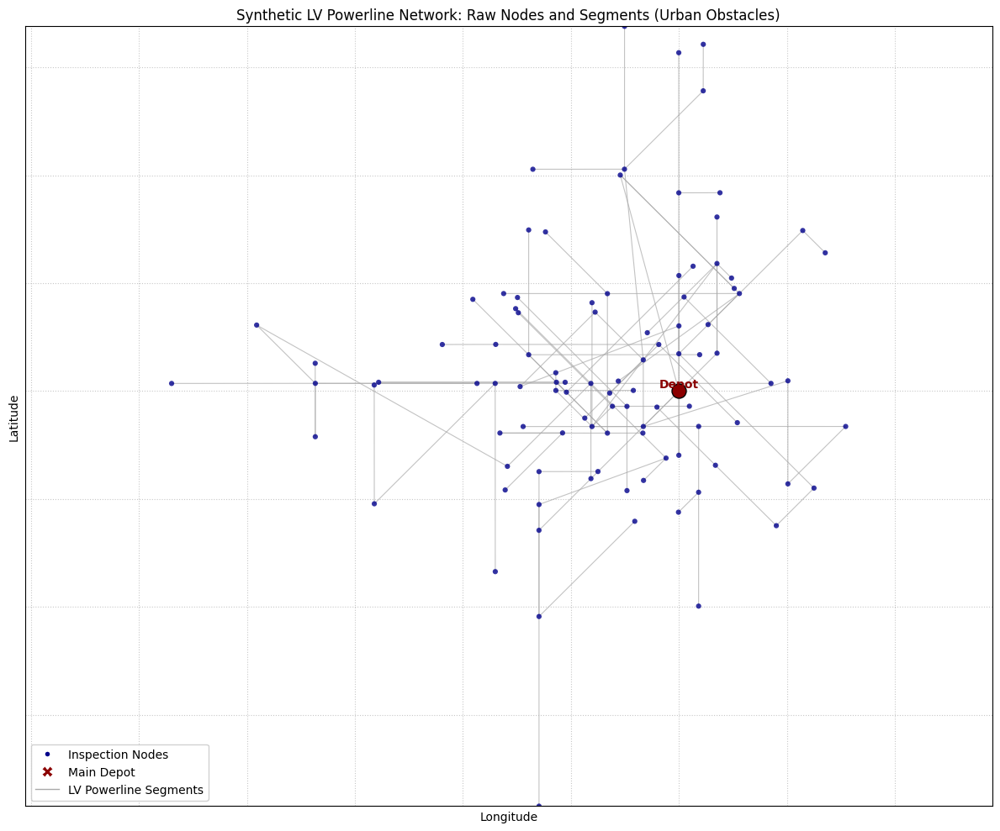

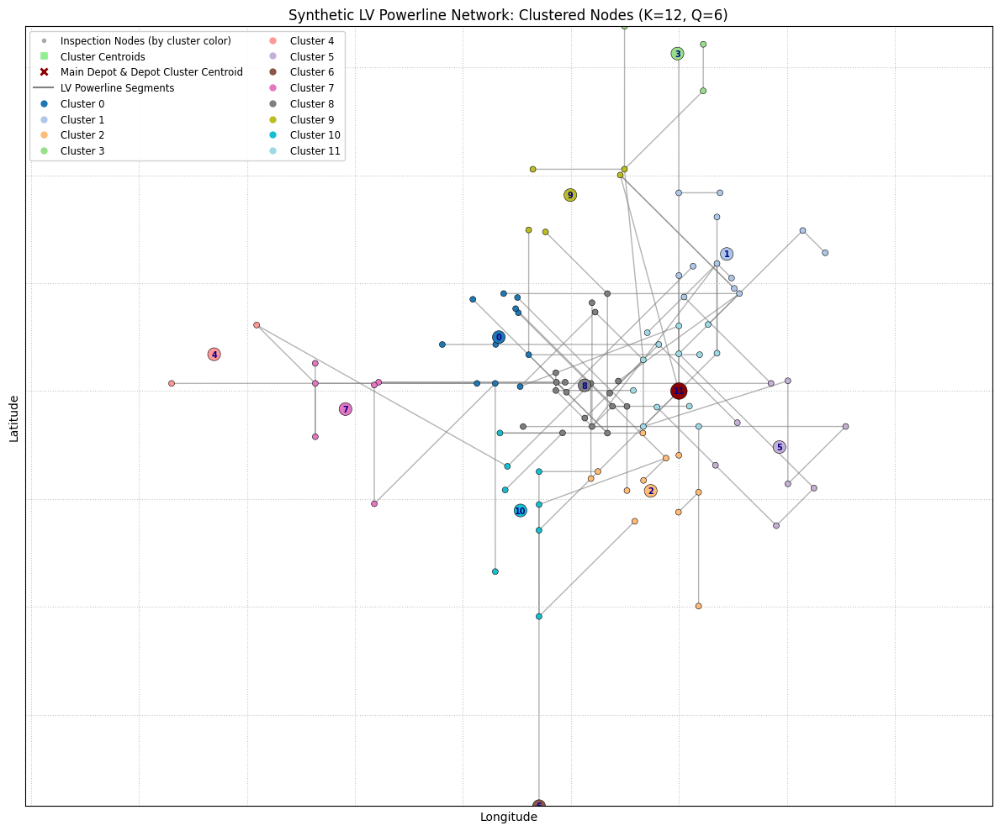

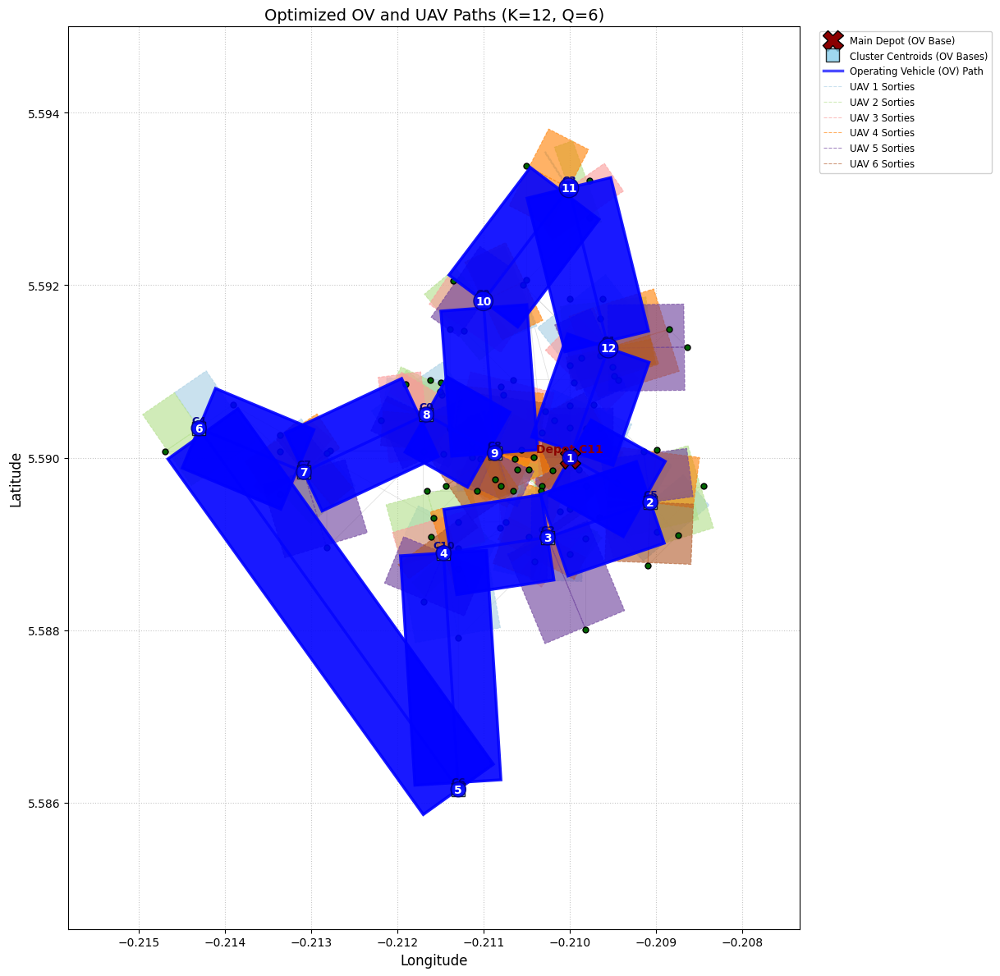


--- Running Evaluation Metrics for K=12, Q_UAVS = 6 (based on last run) ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 95.24% of LV powerline segments traversed.

--- Optimal Path Details for K=12, Q_UAVS = 6 (from last run) ---
Best Total Path Cost: 12.13 km

OV Best Path Order (Cluster IDs):
DEPOT(11) -> C5 -> C2 -> C10 -> C6 -> C4 -> C7 -> C0 -> C8 -> C9 -> C3 -> C1 -> DEPOT(11)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 11 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C11 -> 0 -> OV_C11; OV_C11 -> 40 -> OV_C11; OV_C11 -> 47 -> OV_C11
    UAV 1: OV_C11 -> 25 -> OV_C11; OV_C11 -> 7 -> OV_C11; OV_C11 -> 1 -> OV_C11
    UAV 2: OV_C11 -> 27 -> OV_C11; OV_C11 -> 14 -> OV_C11
    UAV 3: OV_C11 -> 44 -> OV_C11; OV_C11 -> 91 -> OV_C11
    UAV 4: OV_C11 -> 65 -> OV_C11; OV_C11 -> 6 -> OV_C11
    UAV 5: OV_C11 -> 67 -> OV_C11; OV_C11 -> 2 -> OV_C11
  Cluster 5 (OV Base at [5.5895, -0.2091]):
    UAV 0: OV_C5 -> 28 -> OV_C5; OV

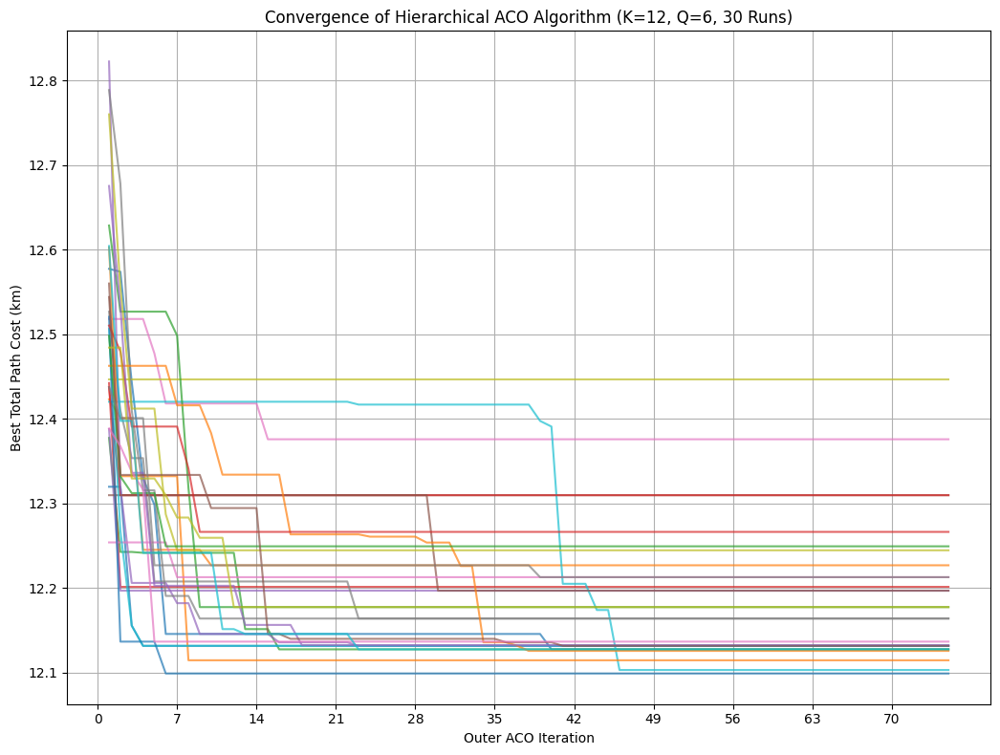


--- Plotting Objective Value Distribution ---


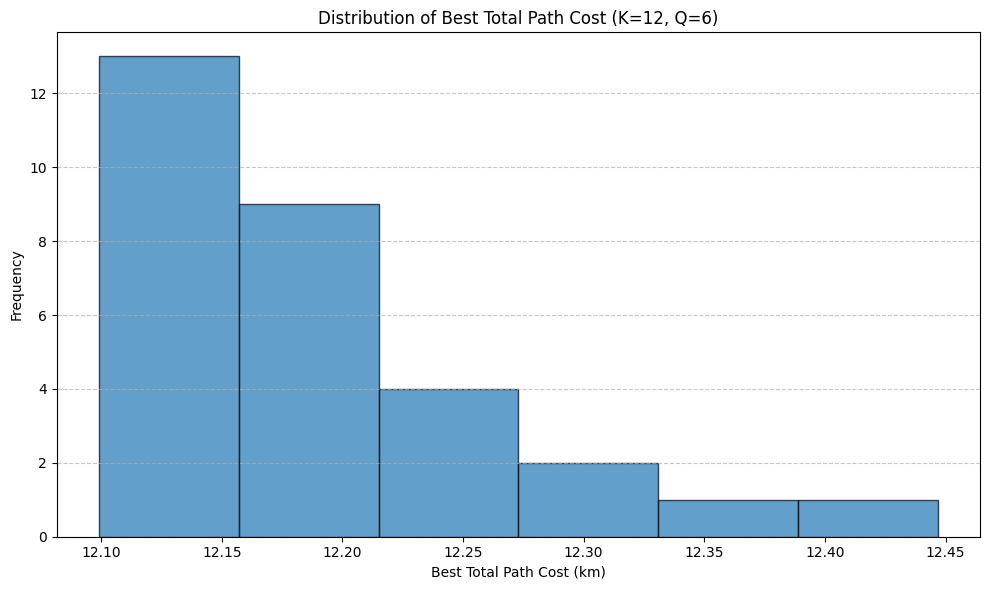

Objective value distribution plot saved to objective_value_distribution_K12_Q6.png

--- Updating and Saving Final Simulation Results to Google Drive ---
Saving final simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Final data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json


In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness, but not used when LOAD_FROM_SAVED_DATASET is True) ---
# These parameters are for the network generation function, which won't be called if loading from file.
ACCRA_LAT_RANGE = 0.02
ACCRA_LON_RANGE = 0.02
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2
MIN_LV_SEGMENT_KM = 0.01
MAX_LV_SEGMENT_KM = 0.20

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    This function is included for completeness but will not be called in this setup
    as LOAD_FROM_SAVED_DATASET is True.
    """
    nodes = []
    edges = []
    current_node_id = 0
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1
    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []
    obstacle_zones = []
    depot_zone_buffer = 0.002
    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1
    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False
    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False
    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001
    global_attempts = 0
    max_global_attempts = num_nodes * 500
    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1
        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)
        if from_node_id >= len(nodes): continue
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']
        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2
        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))
        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))
        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))
            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)
            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue
            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)
            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue
            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue
            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}
    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)
    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))
    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0
    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))
    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else:
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {}

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)}

        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf')

        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3):
                    if i + 1 < len(q_route_original_ids):
                        v_original_id = q_route_original_ids[i+1]
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}

    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx)

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Note: obstacle_zones_data is not passed here, assumed to be part of the general context if needed for raw plot.
    # To re-add obstacle zones to this specific plot, pass obstacle_zones_data as an argument.
    # For now, keeping it consistent with the previous version by removing the parameter.

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments')
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    # Removed obstacle zones here for simplicity, consistent with previous raw plot removal of the param.
    # To re-add, pass obstacle_zones_data as an argument.

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title(f"Synthetic LV Powerline Network: Clustered Nodes (K={num_clusters_for_title}, Q={num_uavs_for_title})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Main Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments')
    ]
    for i in range(num_clusters_for_title): # Use num_clusters_for_title to match the clustering
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig(f"synthetic_lv_network_clustered_K{num_clusters_for_title}_Q{num_uavs_for_title}.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS_actual, bbox_coords, depot_actual_node_id, generated_lv_edges, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    # Removed obstacle zones here for simplicity.
    # To re-add, pass obstacle_zones_data as an argument.

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS_actual)
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS_actual > 1:
                            normalized_uav_q = uav_q / (Q_UAVS_actual - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title(f"Optimized OV and UAV Paths (K={num_clusters_for_title}, Q={num_uavs_for_title})", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig(f"optimized_paths_ov_uav_synthetic_lv_enhanced_K{num_clusters_for_title}_Q{num_uavs_for_title}.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Optimal Cluster Analysis Functions (Elbow and Silhouette) ---

def plot_elbow_method(data_coords, max_clusters=15):
    """
    Plots the Elbow Method for K-Means to help determine optimal K.
    """
    sse = []
    if len(data_coords) < 1:
        print("Not enough data points for Elbow method.")
        return

    max_k_effective = min(max_clusters, len(data_coords))
    k_range = range(1, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(data_coords)
        sse.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.xticks(list(k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_elbow_method.png")
    plt.show()
    print("Elbow Method plot saved to kmeans_elbow_method.png")

    if len(sse) > 2:
        diffs = np.diff(sse)
        diff_of_diffs = np.diff(diffs)
        optimal_k_elbow = np.argmax(diff_of_diffs) + 2
        print(f"Suggested K from Elbow Method (heuristic): {optimal_k_elbow}")
    return sse

def plot_silhouette_score(data_coords, max_clusters=15):
    """
    Plots the Silhouette Score for K-Means to help determine optimal K.
    """
    silhouette_scores = []

    if len(data_coords) < 2:
        print("Not enough data points for Silhouette Score (requires at least 2).")
        return

    max_k_effective = min(max_clusters, len(data_coords) - 1)
    if max_k_effective < 2:
        print("Not enough data points to compute Silhouette Score for multiple clusters.")
        return

    k_range = range(2, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_coords)
        if len(set(labels)) < 2:
            silhouette_scores.append(-1)
            print(f"Skipping Silhouette for K={k} as only 1 cluster formed.")
            continue
        try:
            score = silhouette_score(data_coords, labels)
            silhouette_scores.append(score)
        except ValueError as e:
            print(f"Could not calculate Silhouette Score for K={k}: {e}")
            silhouette_scores.append(-1)

    if not silhouette_scores or all(s == -1 for s in silhouette_scores):
        print("No valid Silhouette Scores could be computed.")
        return

    valid_k_range = [k_range[i] for i, score in enumerate(silhouette_scores) if score != -1]
    valid_scores = [score for score in silhouette_scores if score != -1]

    if not valid_scores:
        print("No valid Silhouette Scores to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.plot(valid_k_range, valid_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.xticks(list(valid_k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_silhouette_score.png")
    plt.show()
    print("Silhouette Score plot saved to kmeans_silhouette_score.png")

    optimal_k_silhouette = valid_k_range[np.argmax(valid_scores)]
    print(f"Suggested K from Silhouette Score: {optimal_k_silhouette}")
    return silhouette_scores


def plot_objective_value_distribution(objective_values, fixed_m_clusters, fixed_q_uavs):
    """
    Plots a histogram of the objective values obtained from multiple runs.
    """
    if not objective_values:
        print("No objective values to plot distribution for.")
        return

    plt.figure(figsize=(10, 6))
    plt.hist(objective_values, bins=max(5, len(objective_values)//5), edgecolor='black', alpha=0.7)
    plt.xlabel('Best Total Path Cost (km)')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Best Total Path Cost (K={fixed_m_clusters}, Q={fixed_q_uavs})')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f"objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")
    plt.show()
    print(f"Objective value distribution plot saved to objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")


# --- Main Execution Flow ---

# Configuration: Always load from JSON for network data. ACO parameters are defined here.
LOAD_FROM_SAVED_DATASET = True

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# --- ACO and Simulation Parameters (DEFINED HERE) ---
N_NODES_CONFIG = 100 # Original number of nodes when dataset was generated (informational)
FIXED_M_CLUSTERS = 12 # <--- FIXED NUMBER OF CLUSTERS for this analysis
FIXED_Q_UAVS = 6 # <--- FIXED NUMBER OF UAVS for this analysis
R_UAV_KM = 5.0 # UAV flight range in km

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50,
    'n_ants_uav': 6,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0,
    'tau0_uav': 1.0
}
# --- END ACO and Simulation Parameters ---

# --- Number of independent runs for analysis ---
NUM_INDEPENDENT_RUNS = 30 # Number of times to run the ACO for statistical analysis


# Global variables for loaded network data (original, unchanged)
all_nodes_original = []
depot_actual_node_id_original = -1
generated_lv_edges_original = []
bbox_coords_original = (0, 0, 0, 0)
obstacle_zones_data_original = []
uav_distances_matrix_original = None
uav_graph_nx_original = None

# Variables to store results from multiple runs
objective_values_over_runs = []
convergence_histories_multiple_runs = [] # To store all convergence curves for potential plotting


# Variables that will hold the results of the *last* run, used for primary visualizations
# These will be updated in the loop to be the results of the final independent run.
visual_all_nodes = []
visual_cluster_centroids = {}
visual_depot_cluster_id = -1
visual_best_overall_cost = float('inf')
visual_best_ov_path_ids = []
visual_best_uav_paths_in_clusters = {}
visual_convergence_history_last_run = []


print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/MyDrive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    exit()


print("\n--- Loading Network Data from Google Drive ---")
if not os.path.exists(SAVED_FILE_PATH):
    print(f"Error: Saved file not found at {SAVED_FILE_PATH}")
    print("Please check the path or generate a new dataset first (by setting LOAD_FROM_SAVED_DATASET=False in a previous run).")
    exit()

try:
    with open(SAVED_FILE_PATH, 'r') as f:
        loaded_data = json.load(f)

    globals()['all_nodes_original'] = loaded_data['nodes']
    globals()['depot_actual_node_id_original'] = loaded_data['depot_actual_node_id']
    globals()['generated_lv_edges_original'] = loaded_data['generated_lv_edges']
    globals()['bbox_coords_original'] = loaded_data['bbox_coords']
    globals()['obstacle_zones_data_original'] = loaded_data['obstacle_zones_data']

    if 'simulation_parameters' in loaded_data and 'N_NODES' in loaded_data['simulation_parameters']:
        globals()['N_NODES_CONFIG'] = loaded_data['simulation_parameters']['N_NODES']


    print("Network data loaded successfully. ACO parameters are defined in the code.")
    print(f"Loaded network contains {len(all_nodes_original)} nodes.")

except Exception as e:
    print(f"Error loading network data from file: {e}")
    print("Please check the file content or path.")
    exit()

# Build UAV distances matrix and NetworkX graph once for the loaded network
print("\nBuilding UAV distances matrix and NetworkX graph for the loaded network...")
uav_distances_matrix_original, uav_graph_nx_original = build_uav_distances_matrix_from_edges_nx(all_nodes_original, generated_lv_edges_original)
print("UAV distances matrix and NetworkX graph built.")

# --- Perform Optimal K-Means Clustering Analysis on the loaded data (informational) ---
print("\n--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---")
coords_for_kmeans_analysis = np.array([[node['lat'], node['lon']] for node in all_nodes_original])

if len(coords_for_kmeans_analysis) == 0:
    print("No data points available for cluster analysis. Skipping.")
else:
    max_clusters_to_test = min(len(coords_for_kmeans_analysis) - 1, 15)
    if max_clusters_to_test < 2:
        print(f"Warning: Only {len(coords_for_kmeans_analysis)} nodes. Cannot perform comprehensive cluster analysis.")
    else:
        print(f"Testing K from 1 to {max_clusters_to_test} for Elbow Method, and 2 to {max_clusters_to_test} for Silhouette Score.")
        print("\nRunning Elbow Method...")
        plot_elbow_method(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\nRunning Silhouette Score analysis...")
        plot_silhouette_score(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\n--- K-Means Cluster Analysis Complete (for reference) ---")
        print(f"\nThis analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS}.")


# --- Perform K-Means Clustering ONCE for FIXED_M_CLUSTERS ---
print(f"\n--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} ---")
current_all_nodes_clustered = [node.copy() for node in all_nodes_original] # Deep copy for modification
coords_fixed_k = np.array([[node['lat'], node['lon']] for node in current_all_nodes_clustered])

if len(current_all_nodes_clustered) < FIXED_M_CLUSTERS:
    print(f"Error: Number of nodes ({len(current_all_nodes_clustered)}) is less than FIXED_M_CLUSTERS ({FIXED_M_CLUSTERS}). Cannot proceed with clustering. Exiting.")
    exit()

kmeans_fixed_k = KMeans(n_clusters=FIXED_M_CLUSTERS, random_state=42, n_init=10)
labels_fixed_k = kmeans_fixed_k.fit_predict(coords_fixed_k)

fixed_clusters_data = {i: [] for i in range(FIXED_M_CLUSTERS)}
for i, label in enumerate(labels_fixed_k):
    current_all_nodes_clustered[i]['cluster_id'] = label
    fixed_clusters_data[label].append(current_all_nodes_clustered[i])

fixed_cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans_fixed_k.cluster_centers_)}

fixed_depot_node_obj = next(node for node in current_all_nodes_clustered if node['id'] == depot_actual_node_id_original)
fixed_depot_cluster_id = fixed_depot_node_obj['cluster_id']
fixed_cluster_centroids[fixed_depot_cluster_id]['lat'] = DEPOT_COORD['lat']
fixed_cluster_centroids[fixed_depot_cluster_id]['lon'] = DEPOT_COORD['lon']
fixed_cluster_centroids[fixed_depot_cluster_id]['id'] = f"D{fixed_depot_cluster_id}"

fixed_all_clusters_for_aco = {
    'centroids': fixed_cluster_centroids,
    'node_sets': fixed_clusters_data
}
print(f"Clustering for FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} complete.")


# --- Main Loop for Multiple Independent Runs ---
print(f"\n--- Starting {NUM_INDEPENDENT_RUNS} independent ACO runs for K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS} ---")

for run_idx in range(NUM_INDEPENDENT_RUNS):
    print(f"\nRunning ACO iteration {run_idx + 1}/{NUM_INDEPENDENT_RUNS}...")

    # Re-initialize pheromones for each independent run
    OV_ACO_PARAMS_RUN = OV_ACO_PARAMS.copy()
    UAV_ACO_PARAMS_RUN = UAV_ACO_PARAMS.copy()
    OV_ACO_PARAMS_RUN['tau0_ov'] = 1.0 # Reset initial pheromone
    UAV_ACO_PARAMS_RUN['tau0_uav'] = 1.0 # Reset initial pheromone

    start_time_run = time.time()
    current_run_best_cost, current_run_best_ov_path_ids, current_run_best_uav_paths_in_clusters, current_run_convergence_history = solve_outer_aco(
        fixed_depot_cluster_id,
        fixed_all_clusters_for_aco,
        current_all_nodes_clustered,
        uav_distances_matrix_original,
        FIXED_Q_UAVS, # Fixed Q for this analysis
        R_UAV_KM,
        OV_ACO_PARAMS_RUN,
        UAV_ACO_PARAMS_RUN
    )
    end_time_run = time.time()
    run_duration = end_time_run - start_time_run

    print(f"  Run {run_idx + 1} finished. Runtime: {run_duration:.2f}s, Best Cost: {current_run_best_cost:.2f}km")

    objective_values_over_runs.append(current_run_best_cost)
    convergence_histories_multiple_runs.append(current_run_convergence_history)

    # Store results from the *last* run for visualization (can be changed to best/median if preferred)
    if run_idx == NUM_INDEPENDENT_RUNS - 1:
        globals()['visual_all_nodes'] = current_all_nodes_clustered
        globals()['visual_cluster_centroids'] = fixed_cluster_centroids
        globals()['visual_depot_cluster_id'] = fixed_depot_cluster_id
        globals()['visual_best_overall_cost'] = current_run_best_cost
        globals()['visual_best_ov_path_ids'] = current_run_best_ov_path_ids
        globals()['visual_best_uav_paths_in_clusters'] = current_run_best_uav_paths_in_clusters
        globals()['visual_convergence_history_last_run'] = current_run_convergence_history


print("\n--- All Independent ACO Runs Complete ---")

# --- Calculate Average and Standard Deviation of Objective Values ---
if objective_values_over_runs:
    average_objective_value = np.mean(objective_values_over_runs)
    std_dev_objective_value = np.std(objective_values_over_runs)

    print("\n--- Objective Value Statistical Analysis ---")
    print(f"Average Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {average_objective_value:.2f} km")
    print(f"Standard Deviation of Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {std_dev_objective_value:.2f} km")
else:
    average_objective_value = np.nan
    std_dev_objective_value = np.nan
    print("\nNo objective values collected for statistical analysis.")


# --- Final Visualizations and Textual Output (Only for the last run's configuration) ---
if visual_best_overall_cost != float('inf'): # Check if visual_results were actually populated
    print(f"\n--- Generating detailed visualizations and textual output for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} ---")

    plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in visual_all_nodes}
    node_labels_map = {node['id']: str(node['id']) for node in visual_all_nodes}

    centroid_plot_ids_map = {}
    for c_id, centroid in visual_cluster_centroids.items():
        plot_id = f"C{c_id}"
        if c_id == visual_depot_cluster_id:
            plot_id = f"DepotC{c_id}"
        plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
        node_labels_map[plot_id] = str(c_id)
        centroid_plot_ids_map[c_id] = plot_id

    cluster_colors_map = plt.get_cmap('tab20', FIXED_M_CLUSTERS)

    plot_raw_powerline_network(all_nodes_original, generated_lv_edges_original, bbox_coords_original, DEPOT_COORD, depot_actual_node_id_original)

    plot_clustered_powerline_network_nx(visual_all_nodes, visual_cluster_centroids, visual_depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges_original, bbox_coords_original, depot_actual_node_id_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    plot_best_paths_nx(visual_all_nodes, visual_best_ov_path_ids, visual_best_uav_paths_in_clusters, visual_cluster_centroids, visual_depot_cluster_id, plot_nodes_coords, FIXED_Q_UAVS, bbox_coords_original, depot_actual_node_id_original, generated_lv_edges_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    print(f"\n--- Running Evaluation Metrics for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (based on last run) ---")
    node_coverage = calculate_node_coverage(visual_all_nodes, depot_actual_node_id_original, visual_best_uav_paths_in_clusters)
    print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")
    edge_coverage = calculate_edge_coverage(visual_all_nodes, generated_lv_edges_original, visual_best_uav_paths_in_clusters, visual_cluster_centroids, uav_graph_nx_original)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")


    print(f"\n--- Optimal Path Details for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (from last run) ---")
    print(f"Best Total Path Cost: {visual_best_overall_cost:.2f} km")

    print("\nOV Best Path Order (Cluster IDs):")
    ov_path_str_display = []
    for c_id in visual_best_ov_path_ids:
        if c_id == visual_depot_cluster_id:
            ov_path_str_display.append(f"DEPOT({c_id})")
        else:
            ov_path_str_display.append(f"C{c_id}")
    print(" -> ".join(ov_path_str_display))

    print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
    for cluster_id, uav_routes in visual_best_uav_paths_in_clusters.items():
        centroid_display = visual_cluster_centroids[cluster_id]
        print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
        for uav_q, route_nodes_ids in uav_routes.items():
            if route_nodes_ids:
                display_sorties = []
                for i in range(0, len(route_nodes_ids), 3):
                    if i + 1 < len(route_nodes_ids):
                        display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")
                print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
            else:
                print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")
else:
    print(f"\nNo detailed visualizations or textual output for K={FIXED_M_CLUSTERS}, Q_UAVS={FIXED_Q_UAVS} because no valid results were stored (e.g., all runs failed).")


# --- Combined Convergence Analysis Visualization (all runs) ---
print("\n--- Plotting Convergence Analysis for all independent runs ---")
plt.figure(figsize=(12, 8))
for i, history in enumerate(convergence_histories_multiple_runs):
    if history:
        plt.plot(range(1, len(history) + 1), history, alpha=0.7, label=f'Run {i+1}')

plt.title(f'Convergence of Hierarchical ACO Algorithm (K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS}, {NUM_INDEPENDENT_RUNS} Runs)')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
max_iters = max([len(h) for h in convergence_histories_multiple_runs if h]) if convergence_histories_multiple_runs else OV_ACO_PARAMS['iters_ov']
plt.xticks(np.arange(0, max_iters + 1, max(1, max_iters // 10)))
if NUM_INDEPENDENT_RUNS <= 10: # Only show legend if not too many runs for readability
    plt.legend(title='Run Number', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for legend
plt.savefig(f"aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
print(f"Combined convergence plot for multiple runs saved to aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
plt.show()

# --- Objective Value Distribution Visualization ---
print("\n--- Plotting Objective Value Distribution ---")
plot_objective_value_distribution(objective_values_over_runs, FIXED_M_CLUSTERS, FIXED_Q_UAVS)


# --- Save final results ---
print("\n--- Updating and Saving Final Simulation Results to Google Drive ---")
try:
    final_data_to_save_raw = {
        "nodes": visual_all_nodes, # From the last run for visualization
        "depot_actual_node_id": depot_actual_node_id_original,
        "generated_lv_edges": generated_lv_edges_original,
        "bbox_coords": bbox_coords_original,
        "obstacle_zones_data": obstacle_zones_data_original,
        "cluster_centroids": visual_cluster_centroids,
        "best_ov_path_ids": visual_best_ov_path_ids,
        "best_uav_paths_in_clusters": visual_best_uav_paths_in_clusters,
        "best_overall_cost": visual_best_overall_cost, # From last run
        "convergence_history_last_run": visual_convergence_history_last_run, # From last run
        "objective_values_over_runs": objective_values_over_runs, # All objective values
        "average_objective_value": average_objective_value, # New
        "std_dev_objective_value": std_dev_objective_value, # New
        "convergence_histories_multiple_runs": convergence_histories_multiple_runs, # All convergence curves
        "simulation_parameters": {
            "N_NODES_CONFIG": N_NODES_CONFIG,
            "FIXED_M_CLUSTERS": FIXED_M_CLUSTERS,
            "FIXED_Q_UAVS": FIXED_Q_UAVS,
            "NUM_INDEPENDENT_RUNS": NUM_INDEPENDENT_RUNS, # New
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

    drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
    full_file_path = os.path.join(drive_folder_path, "ACO_LV_Network_Simulation_dataset.json")

    print(f"Saving final simulation results to: {full_file_path}")
    with open(full_file_path, 'w') as f:
        json.dump(final_data_to_save_converted, f, indent=4)
    print("Final data successfully saved to Google Drive!")
    print(f"File location: {full_file_path}")
except Exception as e:
    print(f"Error saving final data to file: {e}")


extract number of nodes and edges from dataset


--- Mounting Google Drive ---
Mounted at /content/drive
Google Drive mounted.

--- Loading Network Data from Google Drive ---
Network data loaded successfully. ACO parameters are defined in the code.
Loaded network contains 100 nodes.

Nodes in dataset: 100
Edges in dataset: 105

Building UAV distances matrix and NetworkX graph for the loaded network...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.05 seconds.
UAV distances matrix and NetworkX graph built.

--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---
Testing K from 1 to 15 for Elbow Method, and 2 to 15 for Silhouette Score.

Running Elbow Method...


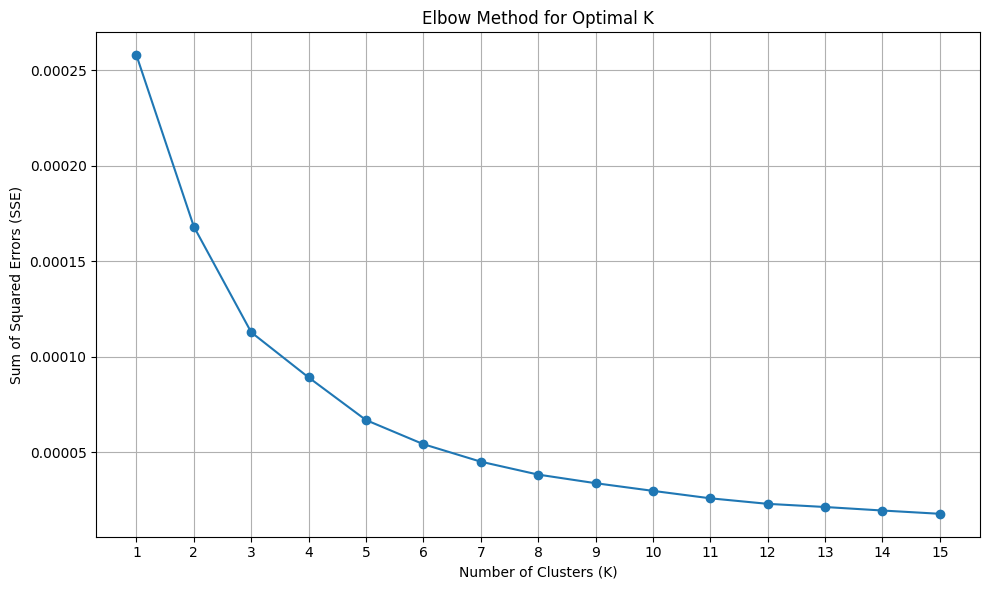

Elbow Method plot saved to kmeans_elbow_method.png
Suggested K from Elbow Method (heuristic): 2

Running Silhouette Score analysis...


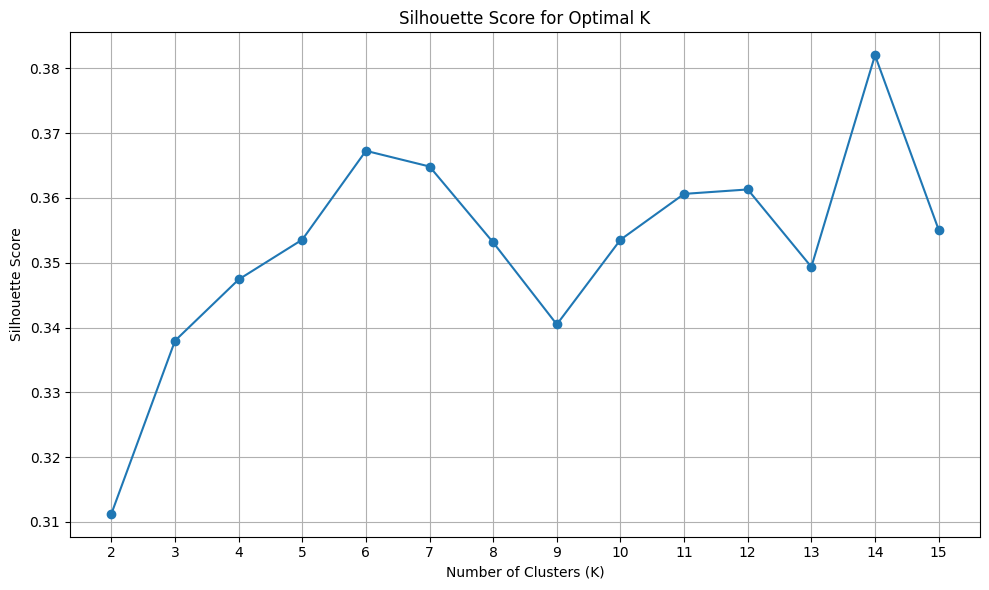

Silhouette Score plot saved to kmeans_silhouette_score.png
Suggested K from Silhouette Score: 14

--- K-Means Cluster Analysis Complete (for reference) ---

This analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = 12.

--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = 12 ---
Clustering for FIXED_M_CLUSTERS = 12 complete.

--- Starting 30 independent ACO runs for K=12, Q=6 ---

Running ACO iteration 1/30...


/tmp/ipython-input-1-236273142.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  Run 1 finished. Runtime: 18.79s, Best Cost: 12.11km

Running ACO iteration 2/30...
  Run 2 finished. Runtime: 14.93s, Best Cost: 12.15km

Running ACO iteration 3/30...
  Run 3 finished. Runtime: 10.73s, Best Cost: 12.26km

Running ACO iteration 4/30...
  Run 4 finished. Runtime: 10.74s, Best Cost: 12.13km

Running ACO iteration 5/30...
  Run 5 finished. Runtime: 9.75s, Best Cost: 12.19km

Running ACO iteration 6/30...
  Run 6 finished. Runtime: 10.15s, Best Cost: 12.13km

Running ACO iteration 7/30...
  Run 7 finished. Runtime: 10.77s, Best Cost: 12.13km

Running ACO iteration 8/30...
  Run 8 finished. Runtime: 10.67s, Best Cost: 12.20km

Running ACO iteration 9/30...
  Run 9 finished. Runtime: 10.46s, Best Cost: 12.27km

Running ACO iteration 10/30...
  Run 10 finished. Runtime: 10.05s, Best Cost: 12.29km

Running ACO iteration 11/30...
  Run 11 finished. Runtime: 10.67s, Best Cost: 12.13km

Running ACO iteration 12/30...
  Run 12 finished. Runtime: 10.68s, Best Cost: 12.21km

Runni

  Run 30 finished. Runtime: 11.43s, Best Cost: 12.13km

--- All Independent ACO Runs Complete ---

--- Objective Value Statistical Analysis ---
Average Total Path Cost over 30 runs: 12.20 km
Standard Deviation of Total Path Cost over 30 runs: 0.08 km

--- Generating detailed visualizations and textual output for K=12, Q_UAVS = 6 ---


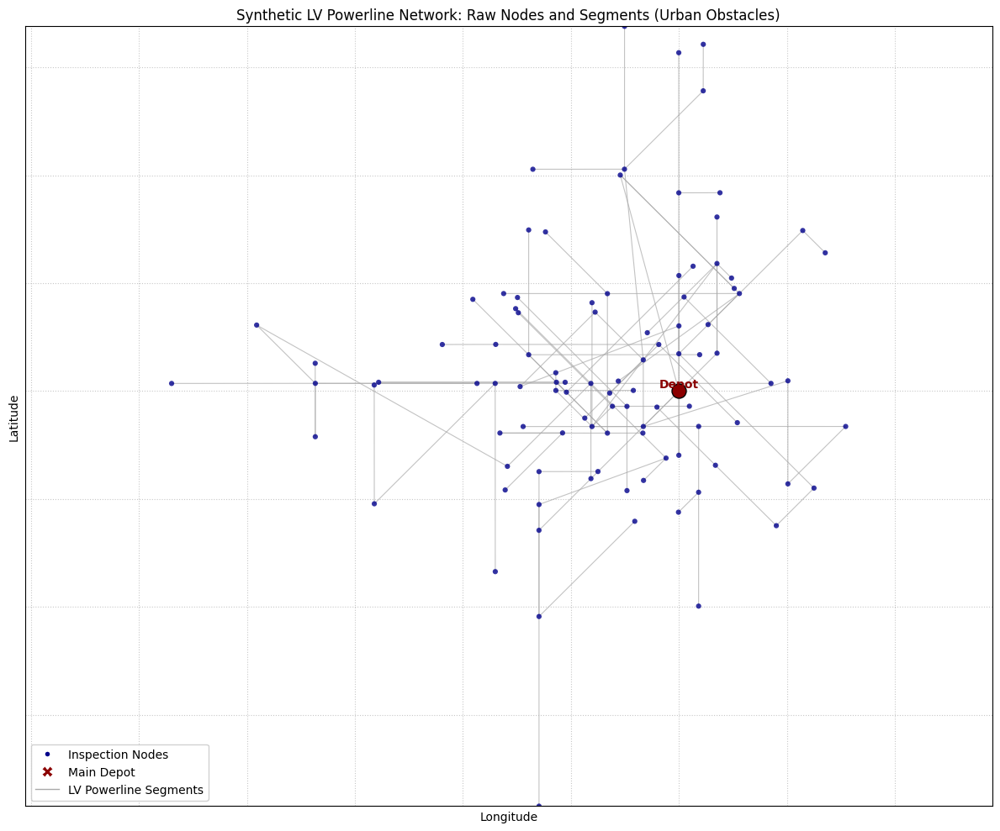

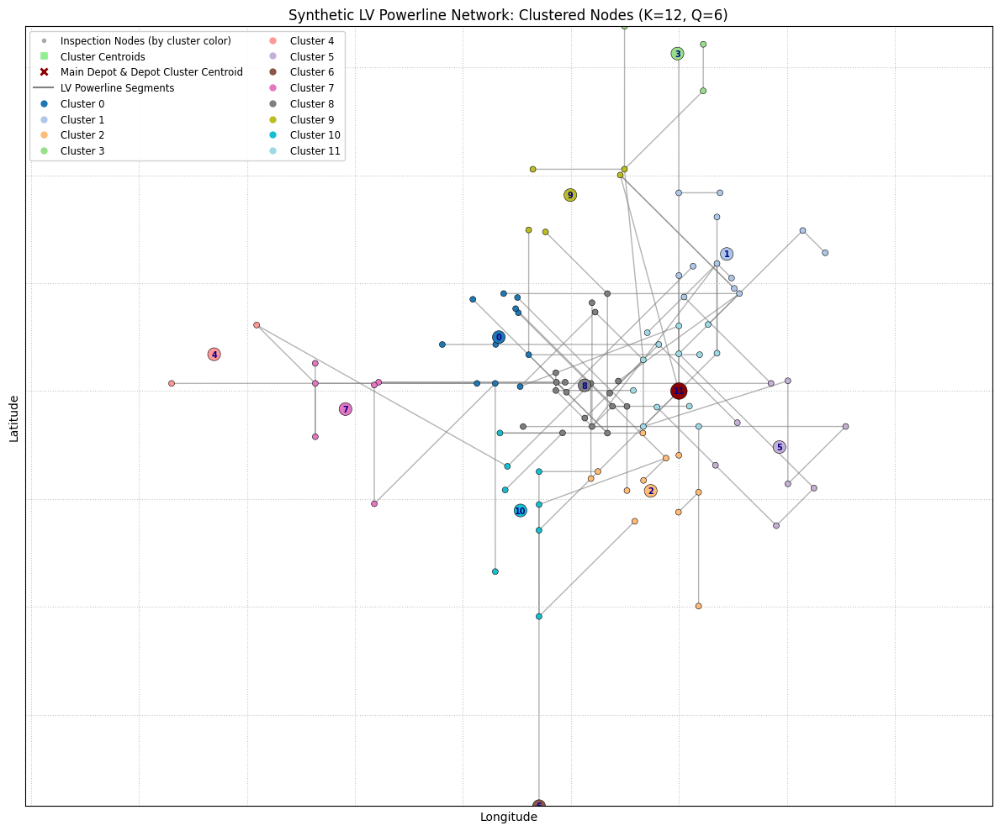

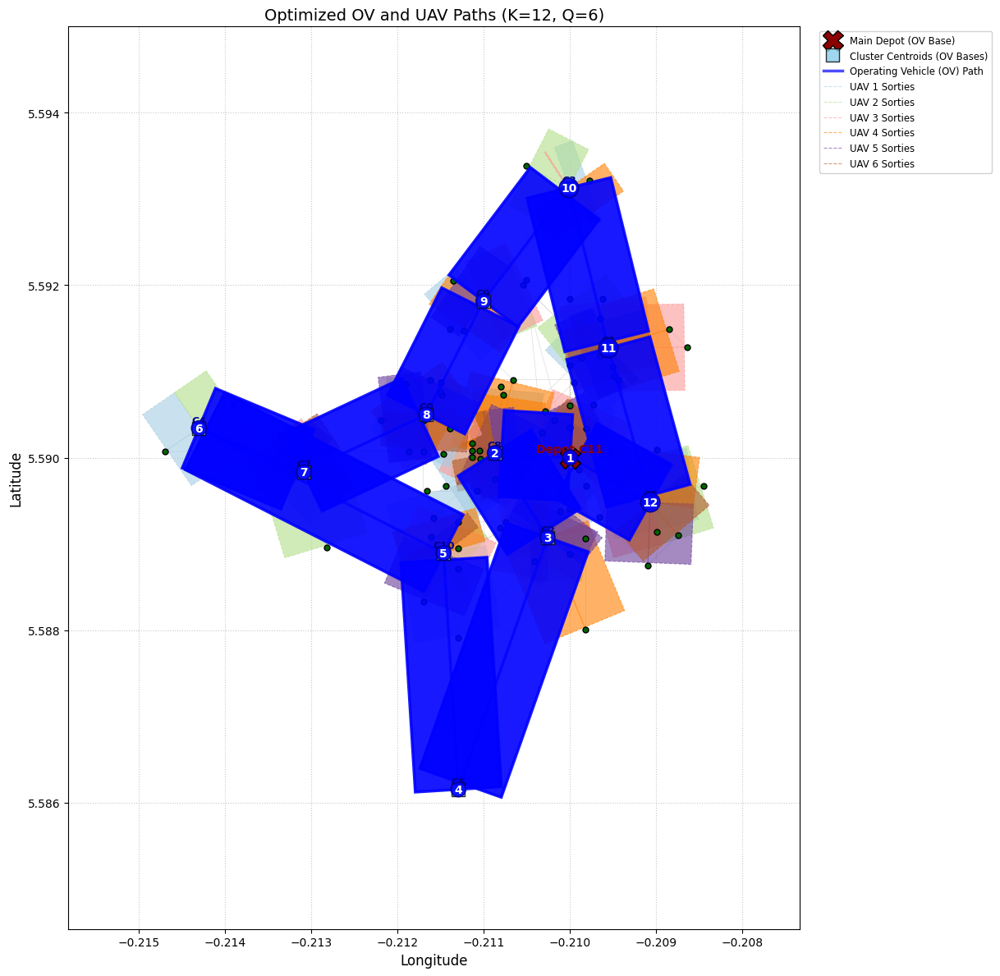


--- Running Evaluation Metrics for K=12, Q_UAVS = 6 (based on last run) ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 95.24% of LV powerline segments traversed.

--- Optimal Path Details for K=12, Q_UAVS = 6 (from last run) ---
Best Total Path Cost: 12.13 km

OV Best Path Order (Cluster IDs):
DEPOT(11) -> C8 -> C2 -> C6 -> C10 -> C4 -> C7 -> C0 -> C9 -> C3 -> C1 -> C5 -> DEPOT(11)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 11 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C11 -> 6 -> OV_C11; OV_C11 -> 2 -> OV_C11; OV_C11 -> 14 -> OV_C11
    UAV 1: OV_C11 -> 65 -> OV_C11; OV_C11 -> 27 -> OV_C11; OV_C11 -> 47 -> OV_C11
    UAV 2: OV_C11 -> 1 -> OV_C11; OV_C11 -> 40 -> OV_C11
    UAV 3: OV_C11 -> 0 -> OV_C11; OV_C11 -> 7 -> OV_C11
    UAV 4: OV_C11 -> 91 -> OV_C11; OV_C11 -> 67 -> OV_C11
    UAV 5: OV_C11 -> 44 -> OV_C11; OV_C11 -> 25 -> OV_C11
  Cluster 8 (OV Base at [5.5901, -0.2109]):
    UAV 0: OV_C8 -> 70 -> OV_C8; OV

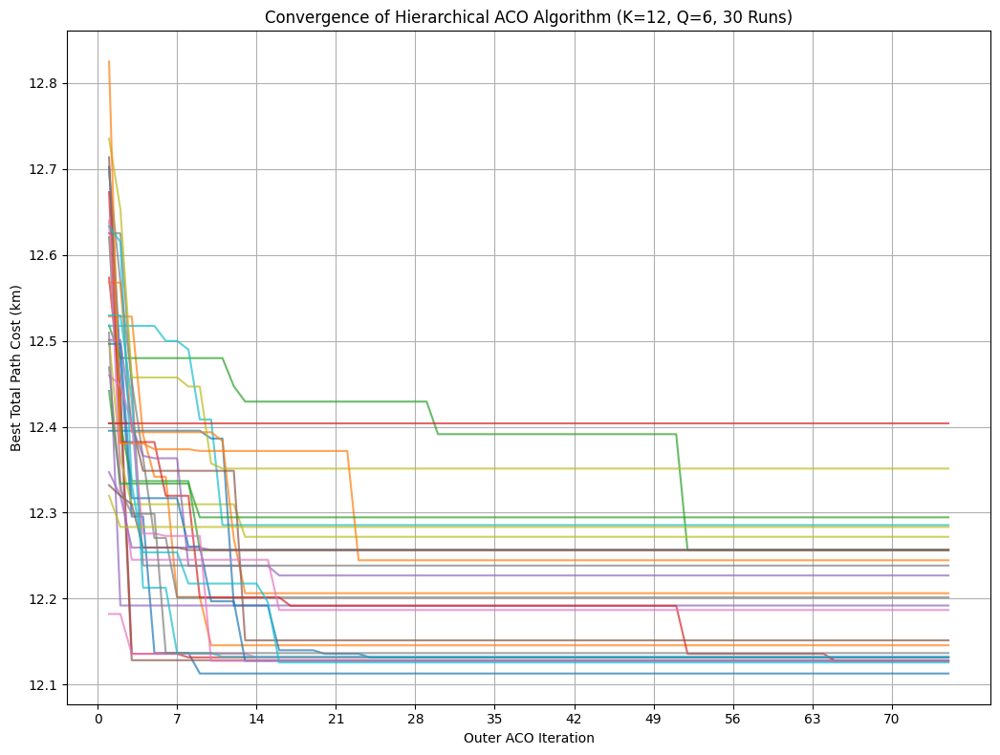


--- Plotting Objective Value Distribution ---


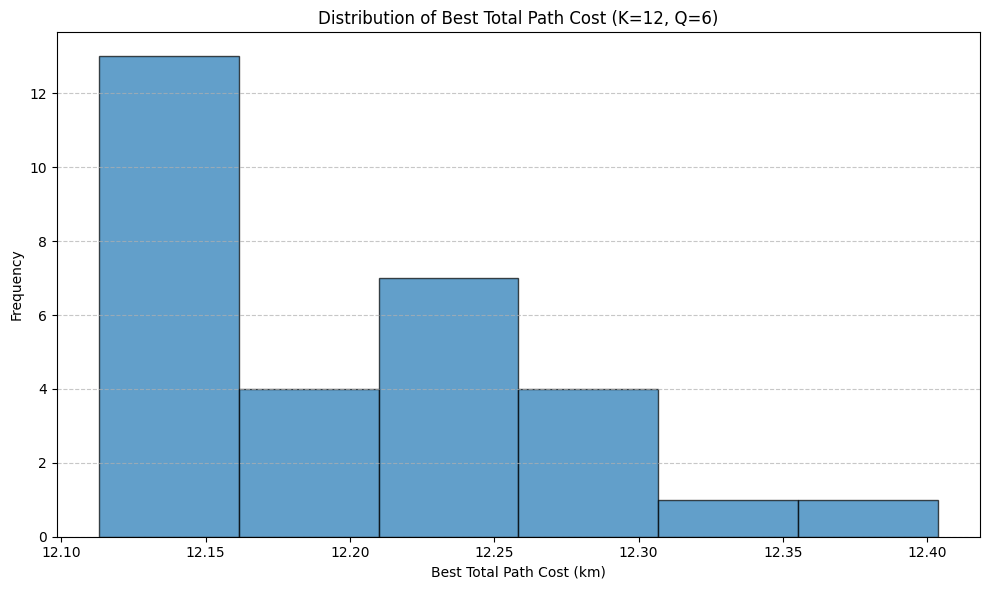

Objective value distribution plot saved to objective_value_distribution_K12_Q6.png

--- Updating and Saving Final Simulation Results to Google Drive ---
Saving final simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Final data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json


In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness, but not used when LOAD_FROM_SAVED_DATASET is True) ---
# These parameters are for the network generation function, which won't be called if loading from file.
ACCRA_LAT_RANGE = 0.02
ACCRA_LON_RANGE = 0.02
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2
MIN_LV_SEGMENT_KM = 0.01
MAX_LV_SEGMENT_KM = 0.20

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    This function is included for completeness but will not be called in this setup
    as LOAD_FROM_SAVED_DATASET is True.
    """
    nodes = []
    edges = []
    current_node_id = 0
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1
    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []
    obstacle_zones = []
    depot_zone_buffer = 0.002
    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1
    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False
    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False
    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001
    global_attempts = 0
    max_global_attempts = num_nodes * 500
    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1
        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)
        if from_node_id >= len(nodes): continue
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']
        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2
        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))
        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))
        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))
            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)
            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue
            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)
            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue
            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue
            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}
    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)
    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))
    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0
    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))
    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else:
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {}

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)}

        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf')

        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3):
                    if i + 1 < len(q_route_original_ids):
                        v_original_id = q_route_original_ids[i+1]
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}

    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx)

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Note: obstacle_zones_data is not passed here, assumed to be part of the general context if needed for raw plot.
    # To re-add obstacle zones to this specific plot, pass obstacle_zones_data as an argument.
    # For now, keeping it consistent with the previous version by removing the parameter.

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments')
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    # Removed obstacle zones here for simplicity, consistent with previous raw plot removal of the param.
    # To re-add, pass obstacle_zones_data as an argument.

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title(f"Synthetic LV Powerline Network: Clustered Nodes (K={num_clusters_for_title}, Q={num_uavs_for_title})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Main Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments')
    ]
    for i in range(num_clusters_for_title): # Use num_clusters_for_title to match the clustering
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig(f"synthetic_lv_network_clustered_K{num_clusters_for_title}_Q{num_uavs_for_title}.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS_actual, bbox_coords, depot_actual_node_id, generated_lv_edges, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    # Removed obstacle zones here for simplicity.
    # To re-add, pass obstacle_zones_data as an argument.

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS_actual)
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS_actual > 1:
                            normalized_uav_q = uav_q / (Q_UAVS_actual - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title(f"Optimized OV and UAV Paths (K={num_clusters_for_title}, Q={num_uavs_for_title})", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig(f"optimized_paths_ov_uav_synthetic_lv_enhanced_K{num_clusters_for_title}_Q{num_uavs_for_title}.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Optimal Cluster Analysis Functions (Elbow and Silhouette) ---

def plot_elbow_method(data_coords, max_clusters=15):
    """
    Plots the Elbow Method for K-Means to help determine optimal K.
    """
    sse = []
    if len(data_coords) < 1:
        print("Not enough data points for Elbow method.")
        return

    max_k_effective = min(max_clusters, len(data_coords))
    k_range = range(1, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(data_coords)
        sse.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.xticks(list(k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_elbow_method.png")
    plt.show()
    print("Elbow Method plot saved to kmeans_elbow_method.png")

    if len(sse) > 2:
        diffs = np.diff(sse)
        diff_of_diffs = np.diff(diffs)
        optimal_k_elbow = np.argmax(diff_of_diffs) + 2
        print(f"Suggested K from Elbow Method (heuristic): {optimal_k_elbow}")
    return sse

def plot_silhouette_score(data_coords, max_clusters=15):
    """
    Plots the Silhouette Score for K-Means to help determine optimal K.
    """
    silhouette_scores = []

    if len(data_coords) < 2:
        print("Not enough data points for Silhouette Score (requires at least 2).")
        return

    max_k_effective = min(max_clusters, len(data_coords) - 1)
    if max_k_effective < 2:
        print("Not enough data points to compute Silhouette Score for multiple clusters.")
        return

    k_range = range(2, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_coords)
        if len(set(labels)) < 2:
            silhouette_scores.append(-1)
            print(f"Skipping Silhouette for K={k} as only 1 cluster formed.")
            continue
        try:
            score = silhouette_score(data_coords, labels)
            silhouette_scores.append(score)
        except ValueError as e:
            print(f"Could not calculate Silhouette Score for K={k}: {e}")
            silhouette_scores.append(-1)

    if not silhouette_scores or all(s == -1 for s in silhouette_scores):
        print("No valid Silhouette Scores could be computed.")
        return

    valid_k_range = [k_range[i] for i, score in enumerate(silhouette_scores) if score != -1]
    valid_scores = [score for score in silhouette_scores if score != -1]

    if not valid_scores:
        print("No valid Silhouette Scores to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.plot(valid_k_range, valid_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.xticks(list(valid_k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_silhouette_score.png")
    plt.show()
    print("Silhouette Score plot saved to kmeans_silhouette_score.png")

    optimal_k_silhouette = valid_k_range[np.argmax(valid_scores)]
    print(f"Suggested K from Silhouette Score: {optimal_k_silhouette}")
    return silhouette_scores


def plot_objective_value_distribution(objective_values, fixed_m_clusters, fixed_q_uavs):
    """
    Plots a histogram of the objective values obtained from multiple runs.
    """
    if not objective_values:
        print("No objective values to plot distribution for.")
        return

    plt.figure(figsize=(10, 6))
    plt.hist(objective_values, bins=max(5, len(objective_values)//5), edgecolor='black', alpha=0.7)
    plt.xlabel('Best Total Path Cost (km)')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Best Total Path Cost (K={fixed_m_clusters}, Q={fixed_q_uavs})')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f"objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")
    plt.show()
    print(f"Objective value distribution plot saved to objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")


# --- Main Execution Flow ---

# Configuration: Always load from JSON for network data. ACO parameters are defined here.
LOAD_FROM_SAVED_DATASET = True

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# --- ACO and Simulation Parameters (DEFINED HERE) ---
N_NODES_CONFIG = 100 # Original number of nodes when dataset was generated (informational)
FIXED_M_CLUSTERS = 12 # <--- FIXED NUMBER OF CLUSTERS for this analysis
FIXED_Q_UAVS = 6 # <--- FIXED NUMBER OF UAVS for this analysis
R_UAV_KM = 5.0 # UAV flight range in km

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50,
    'n_ants_uav': 6,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0,
    'tau0_uav': 1.0
}
# --- END ACO and Simulation Parameters ---

# --- Number of independent runs for analysis ---
NUM_INDEPENDENT_RUNS = 30 # Number of times to run the ACO for statistical analysis


# Global variables for loaded network data (original, unchanged)
all_nodes_original = []
depot_actual_node_id_original = -1
generated_lv_edges_original = []
bbox_coords_original = (0, 0, 0, 0)
obstacle_zones_data_original = []
uav_distances_matrix_original = None
uav_graph_nx_original = None

# Variables to store results from multiple runs
objective_values_over_runs = []
convergence_histories_multiple_runs = [] # To store all convergence curves for potential plotting


# Variables that will hold the results of the *last* run, used for primary visualizations
# These will be updated in the loop to be the results of the final independent run.
visual_all_nodes = []
visual_cluster_centroids = {}
visual_depot_cluster_id = -1
visual_best_overall_cost = float('inf')
visual_best_ov_path_ids = []
visual_best_uav_paths_in_clusters = {}
visual_convergence_history_last_run = []


print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    exit()


print("\n--- Loading Network Data from Google Drive ---")
if not os.path.exists(SAVED_FILE_PATH):
    print(f"Error: Saved file not found at {SAVED_FILE_PATH}")
    print("Please check the path or generate a new dataset first (by setting LOAD_FROM_SAVED_DATASET=False in a previous run).")
    exit()

try:
    with open(SAVED_FILE_PATH, 'r') as f:
        loaded_data = json.load(f)

    globals()['all_nodes_original'] = loaded_data['nodes']
    globals()['depot_actual_node_id_original'] = loaded_data['depot_actual_node_id']
    globals()['generated_lv_edges_original'] = loaded_data['generated_lv_edges']
    globals()['bbox_coords_original'] = loaded_data['bbox_coords']
    globals()['obstacle_zones_data_original'] = loaded_data['obstacle_zones_data']

    if 'simulation_parameters' in loaded_data and 'N_NODES' in loaded_data['simulation_parameters']:
        globals()['N_NODES_CONFIG'] = loaded_data['simulation_parameters']['N_NODES']


    print("Network data loaded successfully. ACO parameters are defined in the code.")
    print(f"Loaded network contains {len(all_nodes_original)} nodes.")

except Exception as e:
    print(f"Error loading network data from file: {e}")
    print("Please check the file content or path.")
    exit()

# --- Extract and Display Number of Nodes and Edges ---
num_nodes_in_dataset = len(all_nodes_original)
num_edges_in_dataset = len(generated_lv_edges_original)
print(f"\nNodes in dataset: {num_nodes_in_dataset}")
print(f"Edges in dataset: {num_edges_in_dataset}")
# --- End Node and Edge Extraction ---


# Build UAV distances matrix and NetworkX graph once for the loaded network
print("\nBuilding UAV distances matrix and NetworkX graph for the loaded network...")
uav_distances_matrix_original, uav_graph_nx_original = build_uav_distances_matrix_from_edges_nx(all_nodes_original, generated_lv_edges_original)
print("UAV distances matrix and NetworkX graph built.")

# --- Perform Optimal K-Means Clustering Analysis on the loaded data (informational) ---
print("\n--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---")
coords_for_kmeans_analysis = np.array([[node['lat'], node['lon']] for node in all_nodes_original])

if len(coords_for_kmeans_analysis) == 0:
    print("No data points available for cluster analysis. Skipping.")
else:
    max_clusters_to_test = min(len(coords_for_kmeans_analysis) - 1, 15)
    if max_clusters_to_test < 2:
        print(f"Warning: Only {len(coords_for_kmeans_analysis)} nodes. Cannot perform comprehensive cluster analysis.")
    else:
        print(f"Testing K from 1 to {max_clusters_to_test} for Elbow Method, and 2 to {max_clusters_to_test} for Silhouette Score.")
        print("\nRunning Elbow Method...")
        plot_elbow_method(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\nRunning Silhouette Score analysis...")
        plot_silhouette_score(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\n--- K-Means Cluster Analysis Complete (for reference) ---")
        print(f"\nThis analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS}.")


# --- Perform K-Means Clustering ONCE for FIXED_M_CLUSTERS ---
print(f"\n--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} ---")
current_all_nodes_clustered = [node.copy() for node in all_nodes_original] # Deep copy for modification
coords_fixed_k = np.array([[node['lat'], node['lon']] for node in current_all_nodes_clustered])

if len(current_all_nodes_clustered) < FIXED_M_CLUSTERS:
    print(f"Error: Number of nodes ({len(current_all_nodes_clustered)}) is less than FIXED_M_CLUSTERS ({FIXED_M_CLUSTERS}). Cannot proceed with clustering. Exiting.")
    exit()

kmeans_fixed_k = KMeans(n_clusters=FIXED_M_CLUSTERS, random_state=42, n_init=10)
labels_fixed_k = kmeans_fixed_k.fit_predict(coords_fixed_k)

fixed_clusters_data = {i: [] for i in range(FIXED_M_CLUSTERS)}
for i, label in enumerate(labels_fixed_k):
    current_all_nodes_clustered[i]['cluster_id'] = label
    fixed_clusters_data[label].append(current_all_nodes_clustered[i])

fixed_cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans_fixed_k.cluster_centers_)}

fixed_depot_node_obj = next(node for node in current_all_nodes_clustered if node['id'] == depot_actual_node_id_original)
fixed_depot_cluster_id = fixed_depot_node_obj['cluster_id']
fixed_cluster_centroids[fixed_depot_cluster_id]['lat'] = DEPOT_COORD['lat']
fixed_cluster_centroids[fixed_depot_cluster_id]['lon'] = DEPOT_COORD['lon']
fixed_cluster_centroids[fixed_depot_cluster_id]['id'] = f"D{fixed_depot_cluster_id}" # Assign a string ID

fixed_all_clusters_for_aco = {
    'centroids': fixed_cluster_centroids,
    'node_sets': fixed_clusters_data
}
print(f"Clustering for FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} complete.")


# --- Main Loop for Multiple Independent Runs ---
print(f"\n--- Starting {NUM_INDEPENDENT_RUNS} independent ACO runs for K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS} ---")

for run_idx in range(NUM_INDEPENDENT_RUNS):
    print(f"\nRunning ACO iteration {run_idx + 1}/{NUM_INDEPENDENT_RUNS}...")

    # Re-initialize pheromones for each independent run
    OV_ACO_PARAMS_RUN = OV_ACO_PARAMS.copy()
    UAV_ACO_PARAMS_RUN = UAV_ACO_PARAMS.copy()
    OV_ACO_PARAMS_RUN['tau0_ov'] = 1.0 # Reset initial pheromone
    UAV_ACO_PARAMS_RUN['tau0_uav'] = 1.0 # Reset initial pheromone

    start_time_run = time.time()
    current_run_best_cost, current_run_best_ov_path_ids, current_run_best_uav_paths_in_clusters, current_run_convergence_history = solve_outer_aco(
        fixed_depot_cluster_id,
        fixed_all_clusters_for_aco,
        current_all_nodes_clustered,
        uav_distances_matrix_original,
        FIXED_Q_UAVS, # Fixed Q for this analysis
        R_UAV_KM,
        OV_ACO_PARAMS_RUN,
        UAV_ACO_PARAMS_RUN
    )
    end_time_run = time.time()
    run_duration = end_time_run - start_time_run

    print(f"  Run {run_idx + 1} finished. Runtime: {run_duration:.2f}s, Best Cost: {current_run_best_cost:.2f}km")

    objective_values_over_runs.append(current_run_best_cost)
    convergence_histories_multiple_runs.append(current_run_convergence_history)

    # Store results from the *last* run for primary visualization
    if run_idx == NUM_INDEPENDENT_RUNS - 1:
        globals()['visual_all_nodes'] = current_all_nodes_clustered
        globals()['visual_cluster_centroids'] = fixed_cluster_centroids
        globals()['visual_depot_cluster_id'] = fixed_depot_cluster_id
        globals()['visual_best_overall_cost'] = current_run_best_cost
        globals()['visual_best_ov_path_ids'] = current_run_best_ov_path_ids
        globals()['visual_best_uav_paths_in_clusters'] = current_run_best_uav_paths_in_clusters
        globals()['visual_convergence_history_last_run'] = current_run_convergence_history


print("\n--- All Independent ACO Runs Complete ---")

# --- Calculate Average and Standard Deviation of Objective Values ---
if objective_values_over_runs:
    average_objective_value = np.mean(objective_values_over_runs)
    std_dev_objective_value = np.std(objective_values_over_runs)

    print("\n--- Objective Value Statistical Analysis ---")
    print(f"Average Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {average_objective_value:.2f} km")
    print(f"Standard Deviation of Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {std_dev_objective_value:.2f} km")
else:
    average_objective_value = np.nan
    std_dev_objective_value = np.nan
    print("\nNo objective values collected for statistical analysis.")


# --- Final Visualizations and Textual Output (Only for the last run's configuration) ---
if visual_best_overall_cost != float('inf'): # Check if visual_results were actually populated
    print(f"\n--- Generating detailed visualizations and textual output for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} ---")

    plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in visual_all_nodes}
    node_labels_map = {node['id']: str(node['id']) for node in visual_all_nodes}

    centroid_plot_ids_map = {}
    for c_id, centroid in visual_cluster_centroids.items():
        plot_id = f"C{c_id}"
        if c_id == visual_depot_cluster_id:
            plot_id = f"DepotC{c_id}"
        plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
        node_labels_map[plot_id] = str(c_id)
        centroid_plot_ids_map[c_id] = plot_id

    cluster_colors_map = plt.get_cmap('tab20', FIXED_M_CLUSTERS)

    plot_raw_powerline_network(all_nodes_original, generated_lv_edges_original, bbox_coords_original, DEPOT_COORD, depot_actual_node_id_original)

    plot_clustered_powerline_network_nx(visual_all_nodes, visual_cluster_centroids, visual_depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges_original, bbox_coords_original, depot_actual_node_id_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    plot_best_paths_nx(visual_all_nodes, visual_best_ov_path_ids, visual_best_uav_paths_in_clusters, visual_cluster_centroids, visual_depot_cluster_id, plot_nodes_coords, FIXED_Q_UAVS, bbox_coords_original, depot_actual_node_id_original, generated_lv_edges_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    print(f"\n--- Running Evaluation Metrics for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (based on last run) ---")
    node_coverage = calculate_node_coverage(visual_all_nodes, depot_actual_node_id_original, visual_best_uav_paths_in_clusters)
    print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")
    edge_coverage = calculate_edge_coverage(visual_all_nodes, generated_lv_edges_original, visual_best_uav_paths_in_clusters, visual_cluster_centroids, uav_graph_nx_original)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")


    print(f"\n--- Optimal Path Details for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (from last run) ---")
    print(f"Best Total Path Cost: {visual_best_overall_cost:.2f} km")

    print("\nOV Best Path Order (Cluster IDs):")
    ov_path_str_display = []
    for c_id in visual_best_ov_path_ids:
        if c_id == visual_depot_cluster_id:
            ov_path_str_display.append(f"DEPOT({c_id})")
        else:
            ov_path_str_display.append(f"C{c_id}")
    print(" -> ".join(ov_path_str_display))

    print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
    for cluster_id, uav_routes in visual_best_uav_paths_in_clusters.items():
        centroid_display = visual_cluster_centroids[cluster_id]
        print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
        for uav_q, route_nodes_ids in uav_routes.items():
            if route_nodes_ids:
                display_sorties = []
                for i in range(0, len(route_nodes_ids), 3):
                    if i + 1 < len(route_nodes_ids):
                        display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")
                print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
            else:
                print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")
else:
    print(f"\nNo detailed visualizations or textual output for K={FIXED_M_CLUSTERS}, Q_UAVS={FIXED_Q_UAVS} because no valid results were stored (e.g., all runs failed).")


# --- Combined Convergence Analysis Visualization (all runs) ---
print("\n--- Plotting Convergence Analysis for all independent runs ---")
plt.figure(figsize=(12, 8))
for i, history in enumerate(convergence_histories_multiple_runs):
    if history:
        plt.plot(range(1, len(history) + 1), history, alpha=0.7, label=f'Run {i+1}')

plt.title(f'Convergence of Hierarchical ACO Algorithm (K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS}, {NUM_INDEPENDENT_RUNS} Runs)')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
max_iters = max([len(h) for h in convergence_histories_multiple_runs if h]) if convergence_histories_multiple_runs else OV_ACO_PARAMS['iters_ov']
plt.xticks(np.arange(0, max_iters + 1, max(1, max_iters // 10)))
if NUM_INDEPENDENT_RUNS <= 10: # Only show legend if not too many runs for readability
    plt.legend(title='Run Number', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for legend
plt.savefig(f"aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
print(f"Combined convergence plot for multiple runs saved to aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
plt.show()

# --- Objective Value Distribution Visualization ---
print("\n--- Plotting Objective Value Distribution ---")
plot_objective_value_distribution(objective_values_over_runs, FIXED_M_CLUSTERS, FIXED_Q_UAVS)


# --- Save final results ---
print("\n--- Updating and Saving Final Simulation Results to Google Drive ---")
try:
    final_data_to_save_raw = {
        "nodes": visual_all_nodes, # From the last run for visualization
        "depot_actual_node_id": depot_actual_node_id_original,
        "num_nodes_in_dataset": num_nodes_in_dataset, # New
        "num_edges_in_dataset": num_edges_in_dataset, # New
        "generated_lv_edges": generated_lv_edges_original,
        "bbox_coords": bbox_coords_original,
        "obstacle_zones_data": obstacle_zones_data_original,
        "cluster_centroids": visual_cluster_centroids,
        "best_ov_path_ids": visual_best_ov_path_ids,
        "best_uav_paths_in_clusters": visual_best_uav_paths_in_clusters,
        "best_overall_cost": visual_best_overall_cost, # From last run
        "convergence_history_last_run": visual_convergence_history_last_run, # From last run
        "objective_values_over_runs": objective_values_over_runs, # All objective values
        "average_objective_value": average_objective_value, # New
        "std_dev_objective_value": std_dev_objective_value, # New
        "convergence_histories_multiple_runs": convergence_histories_multiple_runs, # All convergence curves
        "simulation_parameters": {
            "N_NODES_CONFIG": N_NODES_CONFIG,
            "FIXED_M_CLUSTERS": FIXED_M_CLUSTERS,
            "FIXED_Q_UAVS": FIXED_Q_UAVS,
            "NUM_INDEPENDENT_RUNS": NUM_INDEPENDENT_RUNS, # New
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

    drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
    full_file_path = os.path.join(drive_folder_path, "ACO_LV_Network_Simulation_dataset.json")

    print(f"Saving final simulation results to: {full_file_path}")
    with open(full_file_path, 'w') as f:
        json.dump(final_data_to_save_converted, f, indent=4)
    print("Final data successfully saved to Google Drive!")
    print(f"File location: {full_file_path}")
except Exception as e:
    print(f"Error saving final data to file: {e}")



--- Mounting Google Drive ---
Google Drive already mounted.

--- Loading Network Data from Google Drive ---
Network data loaded successfully. ACO parameters are defined in the code.
Loaded network contains 100 nodes.

Nodes in dataset: 100
Edges in dataset: 105

Bounding Box Coordinates (Lat/Lon):
  Min Latitude: 5.5862
  Max Latitude: 5.5934
  Min Longitude: -0.2147
  Max Longitude: -0.2085

Building UAV distances matrix and NetworkX graph for the loaded network...
Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...
NetworkX APSP computation time: 0.06 seconds.
UAV distances matrix and NetworkX graph built.

--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---
Testing K from 1 to 15 for Elbow Method, and 2 to 15 for Silhouette Score.

Running Elbow Method...


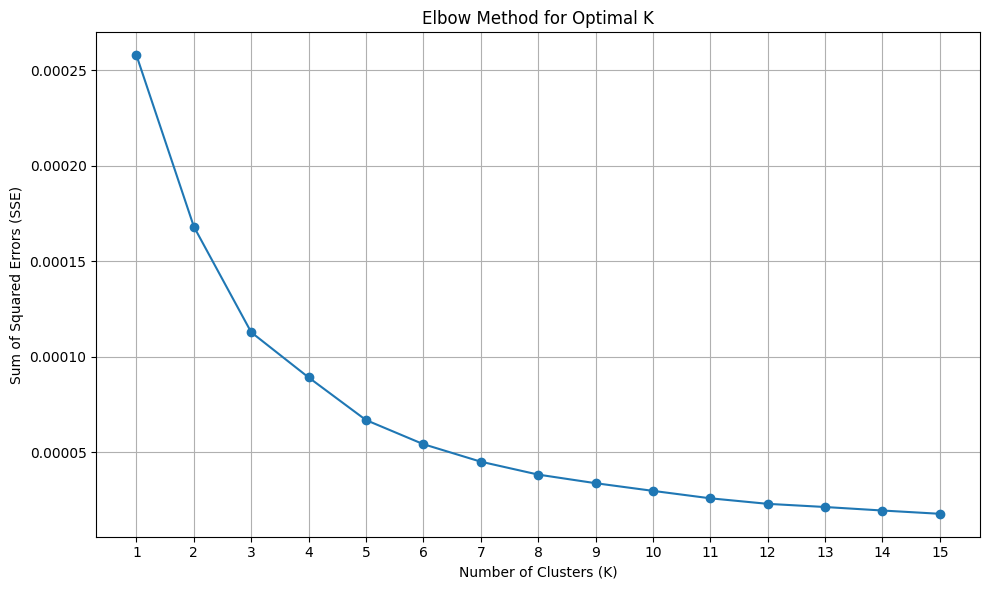

Elbow Method plot saved to kmeans_elbow_method.png
Suggested K from Elbow Method (heuristic): 2

Running Silhouette Score analysis...


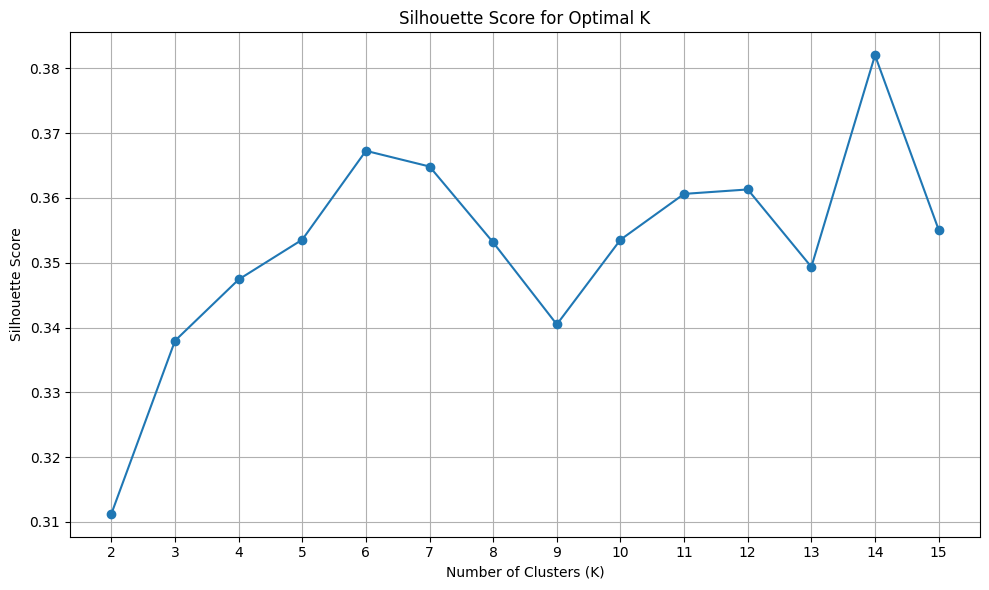

Silhouette Score plot saved to kmeans_silhouette_score.png
Suggested K from Silhouette Score: 14

--- K-Means Cluster Analysis Complete (for reference) ---

This analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = 12.

--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = 12 ---
Clustering for FIXED_M_CLUSTERS = 12 complete.

--- Starting 30 independent ACO runs for K=12, Q=6 ---

Running ACO iteration 1/30...


/tmp/ipython-input-2-2835729744.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  Run 1 finished. Runtime: 18.54s, Best Cost: 12.13km

Running ACO iteration 2/30...
  Run 2 finished. Runtime: 19.76s, Best Cost: 12.14km

Running ACO iteration 3/30...
  Run 3 finished. Runtime: 18.18s, Best Cost: 12.13km

Running ACO iteration 4/30...
  Run 4 finished. Runtime: 13.56s, Best Cost: 12.25km

Running ACO iteration 5/30...
  Run 5 finished. Runtime: 10.80s, Best Cost: 12.11km

Running ACO iteration 6/30...
  Run 6 finished. Runtime: 9.26s, Best Cost: 12.13km

Running ACO iteration 7/30...
  Run 7 finished. Runtime: 10.87s, Best Cost: 12.31km

Running ACO iteration 8/30...
  Run 8 finished. Runtime: 11.77s, Best Cost: 12.13km

Running ACO iteration 9/30...
  Run 9 finished. Runtime: 10.90s, Best Cost: 12.13km

Running ACO iteration 10/30...
  Run 10 finished. Runtime: 9.61s, Best Cost: 12.18km

Running ACO iteration 11/30...
  Run 11 finished. Runtime: 10.31s, Best Cost: 12.17km

Running ACO iteration 12/30...
  Run 12 finished. Runtime: 10.65s, Best Cost: 12.14km

Runnin

  Run 30 finished. Runtime: 9.47s, Best Cost: 12.40km

--- All Independent ACO Runs Complete ---

--- Objective Value Statistical Analysis ---
Average Total Path Cost over 30 runs: 12.20 km
Standard Deviation of Total Path Cost over 30 runs: 0.09 km

--- Generating detailed visualizations and textual output for K=12, Q_UAVS = 6 ---


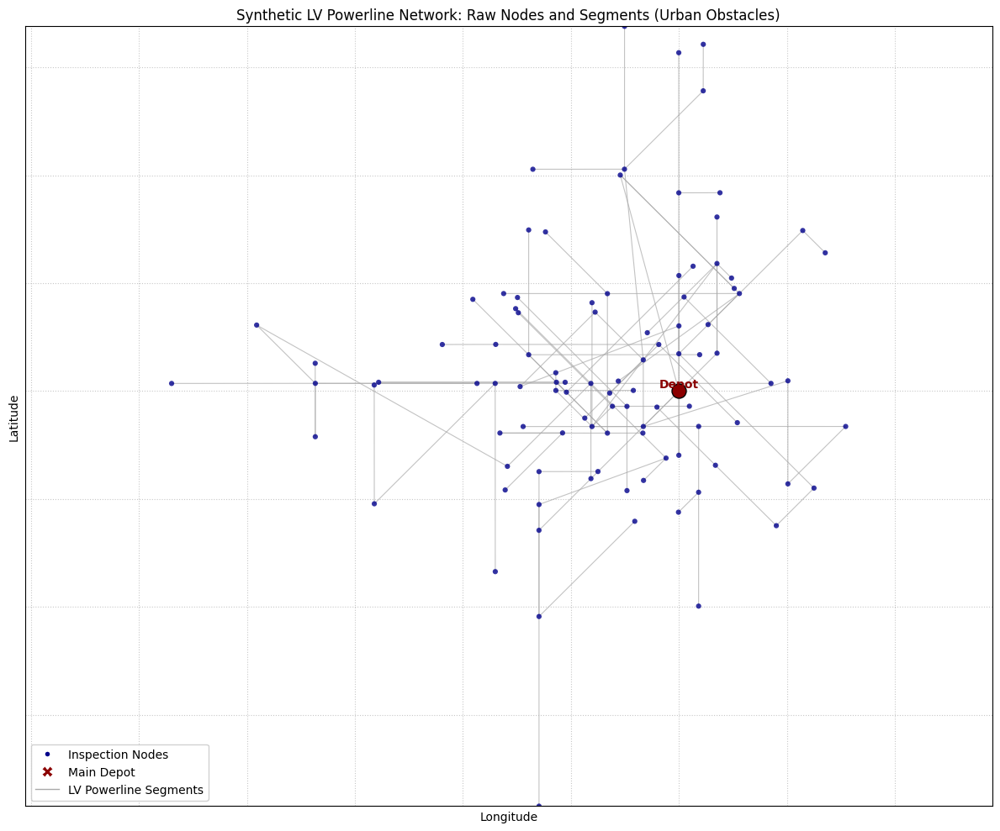

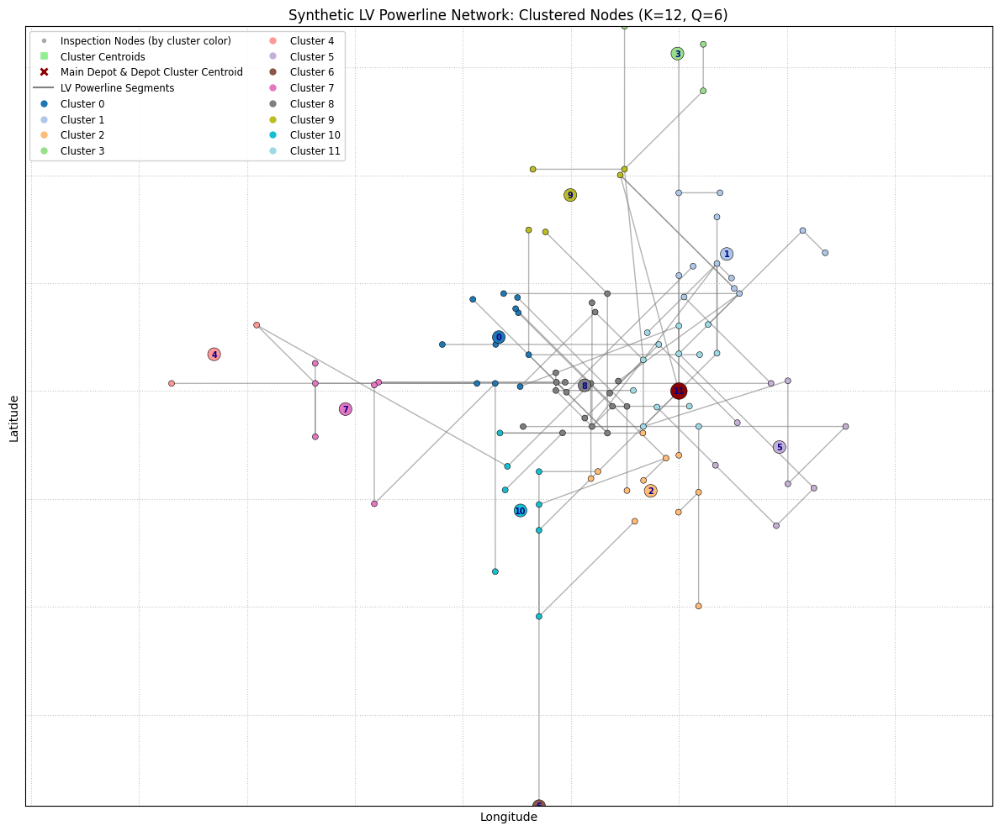

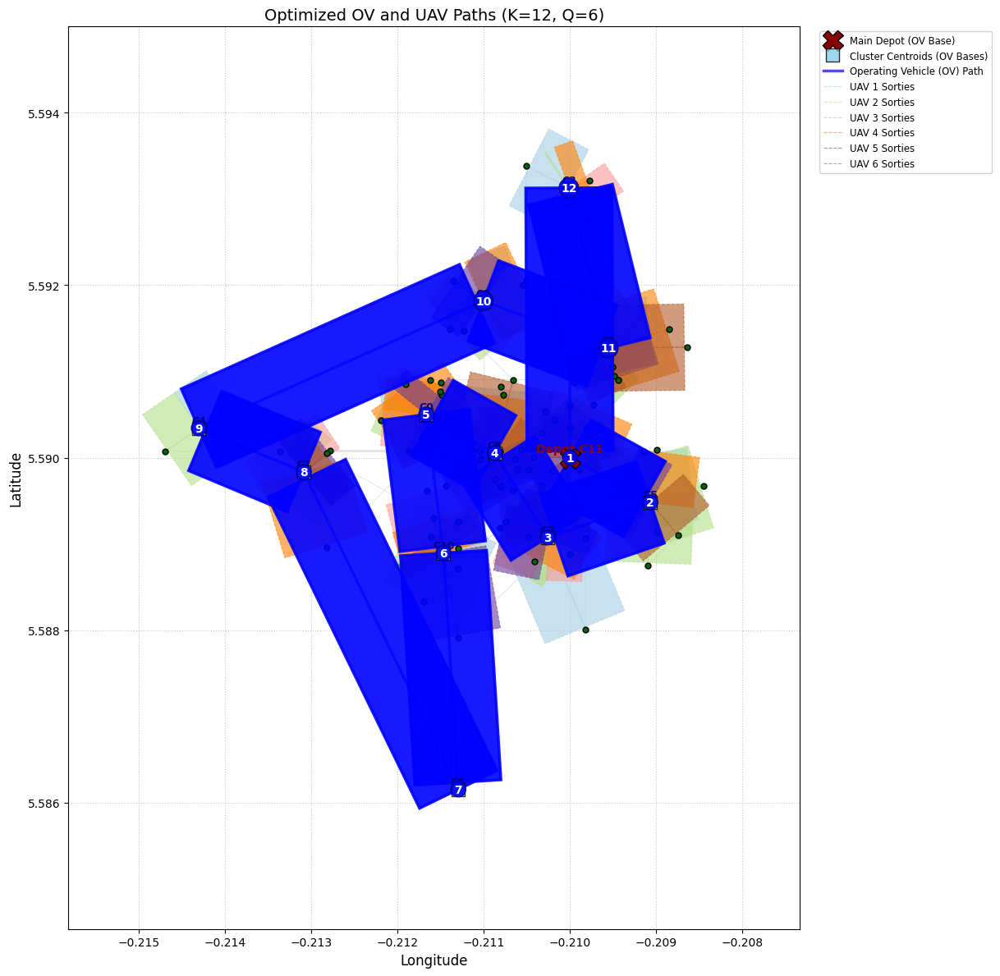


--- Running Evaluation Metrics for K=12, Q_UAVS = 6 (based on last run) ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 95.24% of LV powerline segments traversed.

--- Optimal Path Details for K=12, Q_UAVS = 6 (from last run) ---
Best Total Path Cost: 12.40 km

OV Best Path Order (Cluster IDs):
DEPOT(11) -> C5 -> C2 -> C8 -> C0 -> C10 -> C6 -> C7 -> C4 -> C9 -> C1 -> C3 -> DEPOT(11)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 11 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C11 -> 27 -> OV_C11; OV_C11 -> 0 -> OV_C11; OV_C11 -> 7 -> OV_C11
    UAV 1: OV_C11 -> 67 -> OV_C11; OV_C11 -> 6 -> OV_C11; OV_C11 -> 47 -> OV_C11
    UAV 2: OV_C11 -> 44 -> OV_C11; OV_C11 -> 2 -> OV_C11
    UAV 3: OV_C11 -> 40 -> OV_C11; OV_C11 -> 1 -> OV_C11
    UAV 4: OV_C11 -> 14 -> OV_C11; OV_C11 -> 65 -> OV_C11
    UAV 5: OV_C11 -> 91 -> OV_C11; OV_C11 -> 25 -> OV_C11
  Cluster 5 (OV Base at [5.5895, -0.2091]):
    UAV 0: OV_C5 -> 24 -> OV_C5; OV

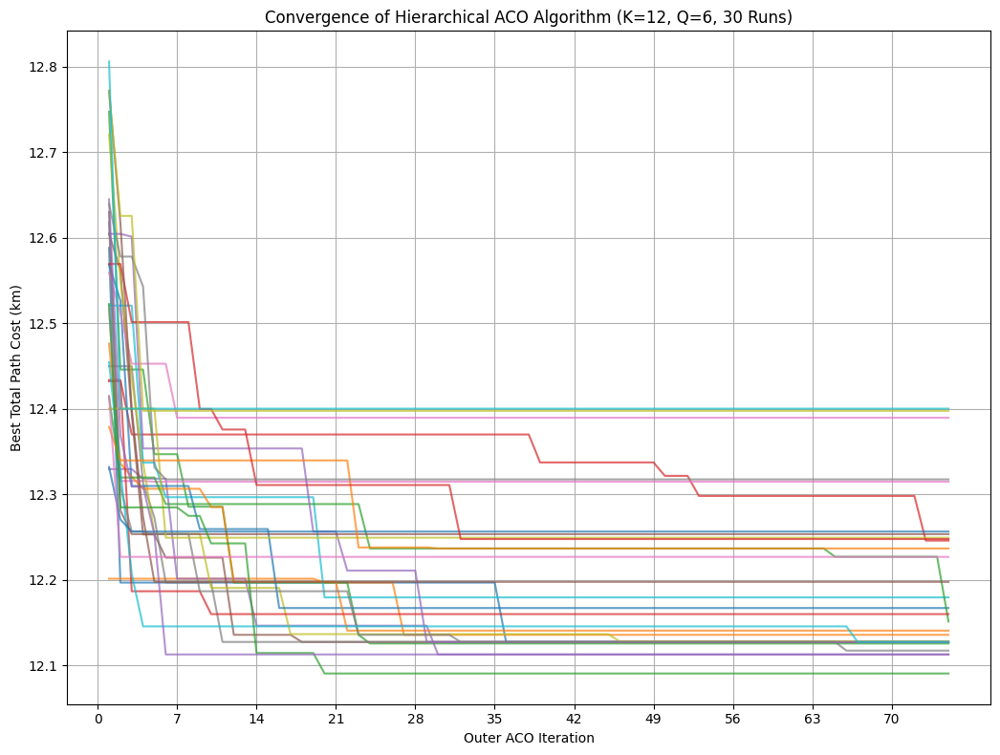


--- Plotting Objective Value Distribution ---


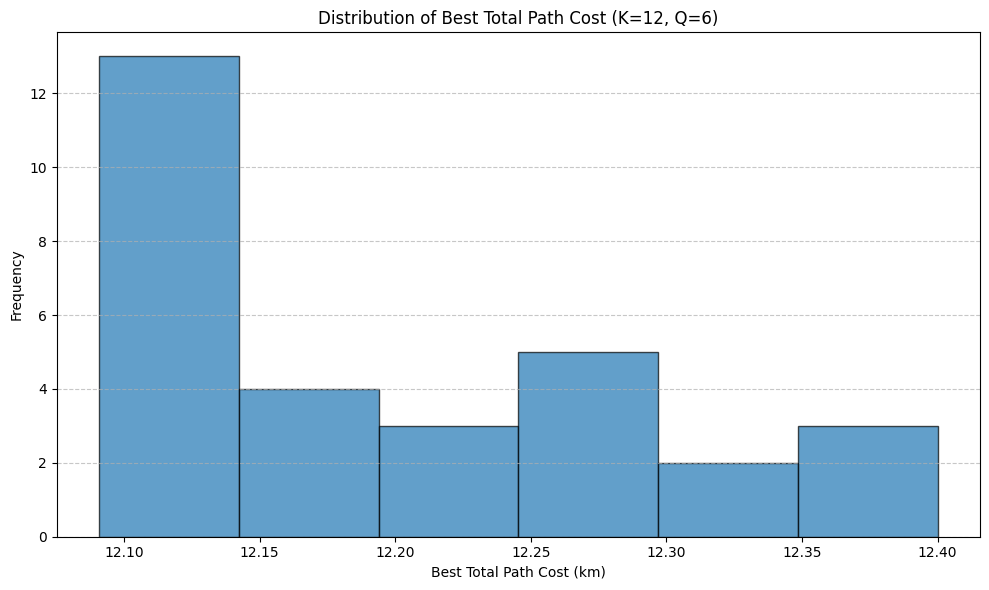

Objective value distribution plot saved to objective_value_distribution_K12_Q6.png

--- Updating and Saving Final Simulation Results to Google Drive ---
Saving final simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Final data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json


In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness, but not used when LOAD_FROM_SAVED_DATASET is True) ---
# These parameters are for the network generation function, which won't be called if loading from file.
ACCRA_LAT_RANGE = 0.02
ACCRA_LON_RANGE = 0.02
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2
MIN_LV_SEGMENT_KM = 0.01
MAX_LV_SEGMENT_KM = 0.20

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    This function is included for completeness but will not be called in this setup
    as LOAD_FROM_SAVED_DATASET is True.
    """
    nodes = []
    edges = []
    current_node_id = 0
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1
    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), []
    obstacle_zones = []
    depot_zone_buffer = 0.002
    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1
    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False
    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1)
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False
    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001
    global_attempts = 0
    max_global_attempts = num_nodes * 500
    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1
        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)
        if from_node_id >= len(nodes): continue
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']
        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2
        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))
        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))
        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))
            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)
            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue
            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)
            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue
            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue
            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist)
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}
    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)
    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))
    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0
    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))
    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else:
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {}

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)}

        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf')

        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3):
                    if i + 1 < len(q_route_original_ids):
                        v_original_id = q_route_original_ids[i+1]
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}

    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx)

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Note: obstacle_zones_data is not passed here, assumed to be part of the general context if needed for raw plot.
    # To re-add obstacle zones to this specific plot, pass obstacle_zones_data as an argument.
    # For now, keeping it consistent with the previous version by removing the parameter.

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments')
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    # Removed obstacle zones here for simplicity, consistent with previous raw plot removal of the param.
    # To re-add, pass obstacle_zones_data as an argument.

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title(f"Synthetic LV Powerline Network: Clustered Nodes (K={num_clusters_for_title}, Q={num_uavs_for_title})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Main Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments')
    ]
    for i in range(num_clusters_for_title): # Use num_clusters_for_title to match the clustering
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig(f"synthetic_lv_network_clustered_K{num_clusters_for_title}_Q{num_uavs_for_title}.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS_actual, bbox_coords, depot_actual_node_id, generated_lv_edges, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    # Removed obstacle zones here for simplicity.
    # To re-add, pass obstacle_zones_data as an argument.

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1),
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS_actual)
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS_actual > 1:
                            normalized_uav_q = uav_q / (Q_UAVS_actual - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title(f"Optimized OV and UAV Paths (K={num_clusters_for_title}, Q={num_uavs_for_title})", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig(f"optimized_paths_ov_uav_synthetic_lv_enhanced_K{num_clusters_for_title}_Q{num_uavs_for_title}.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Optimal Cluster Analysis Functions (Elbow and Silhouette) ---

def plot_elbow_method(data_coords, max_clusters=15):
    """
    Plots the Elbow Method for K-Means to help determine optimal K.
    """
    sse = []
    if len(data_coords) < 1:
        print("Not enough data points for Elbow method.")
        return

    max_k_effective = min(max_clusters, len(data_coords))
    k_range = range(1, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(data_coords)
        sse.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.xticks(list(k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_elbow_method.png")
    plt.show()
    print("Elbow Method plot saved to kmeans_elbow_method.png")

    if len(sse) > 2:
        diffs = np.diff(sse)
        diff_of_diffs = np.diff(diffs)
        optimal_k_elbow = np.argmax(diff_of_diffs) + 2
        print(f"Suggested K from Elbow Method (heuristic): {optimal_k_elbow}")
    return sse

def plot_silhouette_score(data_coords, max_clusters=15):
    """
    Plots the Silhouette Score for K-Means to help determine optimal K.
    """
    silhouette_scores = []

    if len(data_coords) < 2:
        print("Not enough data points for Silhouette Score (requires at least 2).")
        return

    max_k_effective = min(max_clusters, len(data_coords) - 1)
    if max_k_effective < 2:
        print("Not enough data points to compute Silhouette Score for multiple clusters.")
        return

    k_range = range(2, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_coords)
        if len(set(labels)) < 2:
            silhouette_scores.append(-1)
            print(f"Skipping Silhouette for K={k} as only 1 cluster formed.")
            continue
        try:
            score = silhouette_score(data_coords, labels)
            silhouette_scores.append(score)
        except ValueError as e:
            print(f"Could not calculate Silhouette Score for K={k}: {e}")
            silhouette_scores.append(-1)

    if not silhouette_scores or all(s == -1 for s in silhouette_scores):
        print("No valid Silhouette Scores could be computed.")
        return

    valid_k_range = [k_range[i] for i, score in enumerate(silhouette_scores) if score != -1]
    valid_scores = [score for score in silhouette_scores if score != -1]

    if not valid_scores:
        print("No valid Silhouette Scores to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.plot(valid_k_range, valid_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.xticks(list(valid_k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_silhouette_score.png")
    plt.show()
    print("Silhouette Score plot saved to kmeans_silhouette_score.png")

    optimal_k_silhouette = valid_k_range[np.argmax(valid_scores)]
    print(f"Suggested K from Silhouette Score: {optimal_k_silhouette}")
    return silhouette_scores


def plot_objective_value_distribution(objective_values, fixed_m_clusters, fixed_q_uavs):
    """
    Plots a histogram of the objective values obtained from multiple runs.
    """
    if not objective_values:
        print("No objective values to plot distribution for.")
        return

    plt.figure(figsize=(10, 6))
    plt.hist(objective_values, bins=max(5, len(objective_values)//5), edgecolor='black', alpha=0.7)
    plt.xlabel('Best Total Path Cost (km)')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Best Total Path Cost (K={fixed_m_clusters}, Q={fixed_q_uavs})')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f"objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")
    plt.show()
    print(f"Objective value distribution plot saved to objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")


# --- Main Execution Flow ---

# Configuration: Always load from JSON for network data. ACO parameters are defined here.
LOAD_FROM_SAVED_DATASET = True

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# --- ACO and Simulation Parameters (DEFINED HERE) ---
N_NODES_CONFIG = 100 # Original number of nodes when dataset was generated (informational)
FIXED_M_CLUSTERS = 12 # <--- FIXED NUMBER OF CLUSTERS for this analysis
FIXED_Q_UAVS = 6 # <--- FIXED NUMBER OF UAVS for this analysis
R_UAV_KM = 5.0 # UAV flight range in km

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50,
    'n_ants_uav': 6,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0,
    'tau0_uav': 1.0
}
# --- END ACO and Simulation Parameters ---

# --- Number of independent runs for analysis ---
NUM_INDEPENDENT_RUNS = 30 # Number of times to run the ACO for statistical analysis


# Global variables for loaded network data (original, unchanged)
all_nodes_original = []
depot_actual_node_id_original = -1
generated_lv_edges_original = []
bbox_coords_original = (0, 0, 0, 0)
obstacle_zones_data_original = []
uav_distances_matrix_original = None
uav_graph_nx_original = None

# Variables to store results from multiple runs
objective_values_over_runs = []
convergence_histories_multiple_runs = [] # To store all convergence curves for potential plotting


# Variables that will hold the results of the *last* run, used for primary visualizations
# These will be updated in the loop to be the results of the final independent run.
visual_all_nodes = []
visual_cluster_centroids = {}
visual_depot_cluster_id = -1
visual_best_overall_cost = float('inf')
visual_best_ov_path_ids = []
visual_best_uav_paths_in_clusters = {}
visual_convergence_history_last_run = []


print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    exit()


print("\n--- Loading Network Data from Google Drive ---")
if not os.path.exists(SAVED_FILE_PATH):
    print(f"Error: Saved file not found at {SAVED_FILE_PATH}")
    print("Please check the path or generate a new dataset first (by setting LOAD_FROM_SAVED_DATASET=False in a previous run).")
    exit()

try:
    with open(SAVED_FILE_PATH, 'r') as f:
        loaded_data = json.load(f)

    globals()['all_nodes_original'] = loaded_data['nodes']
    globals()['depot_actual_node_id_original'] = loaded_data['depot_actual_node_id']
    globals()['generated_lv_edges_original'] = loaded_data['generated_lv_edges']
    globals()['bbox_coords_original'] = loaded_data['bbox_coords']
    globals()['obstacle_zones_data_original'] = loaded_data['obstacle_zones_data']

    if 'simulation_parameters' in loaded_data and 'N_NODES' in loaded_data['simulation_parameters']:
        globals()['N_NODES_CONFIG'] = loaded_data['simulation_parameters']['N_NODES']


    print("Network data loaded successfully. ACO parameters are defined in the code.")
    print(f"Loaded network contains {len(all_nodes_original)} nodes.")

except Exception as e:
    print(f"Error loading network data from file: {e}")
    print("Please check the file content or path.")
    exit()

# --- Extract and Display Number of Nodes and Edges ---
num_nodes_in_dataset = len(all_nodes_original)
num_edges_in_dataset = len(generated_lv_edges_original)
print(f"\nNodes in dataset: {num_nodes_in_dataset}")
print(f"Edges in dataset: {num_edges_in_dataset}")
# --- End Node and Edge Extraction ---

# --- Display Bounding Box Coordinates ---
min_lat, max_lat, min_lon, max_lon = bbox_coords_original
print(f"\nBounding Box Coordinates (Lat/Lon):")
print(f"  Min Latitude: {min_lat:.4f}")
print(f"  Max Latitude: {max_lat:.4f}")
print(f"  Min Longitude: {min_lon:.4f}")
print(f"  Max Longitude: {max_lon:.4f}")
# --- End Bounding Box Display ---


# Build UAV distances matrix and NetworkX graph once for the loaded network
print("\nBuilding UAV distances matrix and NetworkX graph for the loaded network...")
uav_distances_matrix_original, uav_graph_nx_original = build_uav_distances_matrix_from_edges_nx(all_nodes_original, generated_lv_edges_original)
print("UAV distances matrix and NetworkX graph built.")

# --- Perform Optimal K-Means Clustering Analysis on the loaded data (informational) ---
print("\n--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---")
coords_for_kmeans_analysis = np.array([[node['lat'], node['lon']] for node in all_nodes_original])

if len(coords_for_kmeans_analysis) == 0:
    print("No data points available for cluster analysis. Skipping.")
else:
    max_clusters_to_test = min(len(coords_for_kmeans_analysis) - 1, 15)
    if max_clusters_to_test < 2:
        print(f"Warning: Only {len(coords_for_kmeans_analysis)} nodes. Cannot perform comprehensive cluster analysis.")
    else:
        print(f"Testing K from 1 to {max_clusters_to_test} for Elbow Method, and 2 to {max_clusters_to_test} for Silhouette Score.")
        print("\nRunning Elbow Method...")
        plot_elbow_method(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\nRunning Silhouette Score analysis...")
        plot_silhouette_score(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\n--- K-Means Cluster Analysis Complete (for reference) ---")
        print(f"\nThis analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS}.")


# --- Perform K-Means Clustering ONCE for FIXED_M_CLUSTERS ---
print(f"\n--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} ---")
current_all_nodes_clustered = [node.copy() for node in all_nodes_original] # Deep copy for modification
coords_fixed_k = np.array([[node['lat'], node['lon']] for node in current_all_nodes_clustered])

if len(current_all_nodes_clustered) < FIXED_M_CLUSTERS:
    print(f"Error: Number of nodes ({len(current_all_nodes_clustered)}) is less than FIXED_M_CLUSTERS ({FIXED_M_CLUSTERS}). Cannot proceed with clustering. Exiting.")
    exit()

kmeans_fixed_k = KMeans(n_clusters=FIXED_M_CLUSTERS, random_state=42, n_init=10)
labels_fixed_k = kmeans_fixed_k.fit_predict(coords_fixed_k)

fixed_clusters_data = {i: [] for i in range(FIXED_M_CLUSTERS)}
for i, label in enumerate(labels_fixed_k):
    current_all_nodes_clustered[i]['cluster_id'] = label
    fixed_clusters_data[label].append(current_all_nodes_clustered[i])

fixed_cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans_fixed_k.cluster_centers_)}

fixed_depot_node_obj = next(node for node in current_all_nodes_clustered if node['id'] == depot_actual_node_id_original)
fixed_depot_cluster_id = fixed_depot_node_obj['cluster_id']
fixed_cluster_centroids[fixed_depot_cluster_id]['lat'] = DEPOT_COORD['lat']
fixed_cluster_centroids[fixed_depot_cluster_id]['lon'] = DEPOT_COORD['lon']
fixed_cluster_centroids[fixed_depot_cluster_id]['id'] = f"D{fixed_depot_cluster_id}" # Assign a string ID

fixed_all_clusters_for_aco = {
    'centroids': fixed_cluster_centroids,
    'node_sets': fixed_clusters_data
}
print(f"Clustering for FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} complete.")


# --- Main Loop for Multiple Independent Runs ---
print(f"\n--- Starting {NUM_INDEPENDENT_RUNS} independent ACO runs for K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS} ---")

for run_idx in range(NUM_INDEPENDENT_RUNS):
    print(f"\nRunning ACO iteration {run_idx + 1}/{NUM_INDEPENDENT_RUNS}...")

    # Re-initialize pheromones for each independent run
    OV_ACO_PARAMS_RUN = OV_ACO_PARAMS.copy()
    UAV_ACO_PARAMS_RUN = UAV_ACO_PARAMS.copy()
    OV_ACO_PARAMS_RUN['tau0_ov'] = 1.0 # Reset initial pheromone
    UAV_ACO_PARAMS_RUN['tau0_uav'] = 1.0 # Reset initial pheromone

    start_time_run = time.time()
    current_run_best_cost, current_run_best_ov_path_ids, current_run_best_uav_paths_in_clusters, current_run_convergence_history = solve_outer_aco(
        fixed_depot_cluster_id,
        fixed_all_clusters_for_aco,
        current_all_nodes_clustered,
        uav_distances_matrix_original,
        FIXED_Q_UAVS, # Fixed Q for this analysis
        R_UAV_KM,
        OV_ACO_PARAMS_RUN,
        UAV_ACO_PARAMS_RUN
    )
    end_time_run = time.time()
    run_duration = end_time_run - start_time_run

    print(f"  Run {run_idx + 1} finished. Runtime: {run_duration:.2f}s, Best Cost: {current_run_best_cost:.2f}km")

    objective_values_over_runs.append(current_run_best_cost)
    convergence_histories_multiple_runs.append(current_run_convergence_history)

    # Store results from the *last* run for primary visualization
    if run_idx == NUM_INDEPENDENT_RUNS - 1:
        globals()['visual_all_nodes'] = current_all_nodes_clustered
        globals()['visual_cluster_centroids'] = fixed_cluster_centroids
        globals()['visual_depot_cluster_id'] = fixed_depot_cluster_id
        globals()['visual_best_overall_cost'] = current_run_best_cost
        globals()['visual_best_ov_path_ids'] = current_run_best_ov_path_ids
        globals()['visual_best_uav_paths_in_clusters'] = current_run_best_uav_paths_in_clusters
        globals()['visual_convergence_history_last_run'] = current_run_convergence_history


print("\n--- All Independent ACO Runs Complete ---")

# --- Calculate Average and Standard Deviation of Objective Values ---
if objective_values_over_runs:
    average_objective_value = np.mean(objective_values_over_runs)
    std_dev_objective_value = np.std(objective_values_over_runs)

    print("\n--- Objective Value Statistical Analysis ---")
    print(f"Average Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {average_objective_value:.2f} km")
    print(f"Standard Deviation of Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {std_dev_objective_value:.2f} km")
else:
    average_objective_value = np.nan
    std_dev_objective_value = np.nan
    print("\nNo objective values collected for statistical analysis.")


# --- Final Visualizations and Textual Output (Only for the last run's configuration) ---
if visual_best_overall_cost != float('inf'): # Check if visual_results were actually populated
    print(f"\n--- Generating detailed visualizations and textual output for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} ---")

    plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in visual_all_nodes}
    node_labels_map = {node['id']: str(node['id']) for node in visual_all_nodes}

    centroid_plot_ids_map = {}
    for c_id, centroid in visual_cluster_centroids.items():
        plot_id = f"C{c_id}"
        if c_id == visual_depot_cluster_id:
            plot_id = f"DepotC{c_id}"
        plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
        node_labels_map[plot_id] = str(c_id)
        centroid_plot_ids_map[c_id] = plot_id

    cluster_colors_map = plt.get_cmap('tab20', FIXED_M_CLUSTERS)

    plot_raw_powerline_network(all_nodes_original, generated_lv_edges_original, bbox_coords_original, DEPOT_COORD, depot_actual_node_id_original)

    plot_clustered_powerline_network_nx(visual_all_nodes, visual_cluster_centroids, visual_depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges_original, bbox_coords_original, depot_actual_node_id_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    plot_best_paths_nx(visual_all_nodes, visual_best_ov_path_ids, visual_best_uav_paths_in_clusters, visual_cluster_centroids, visual_depot_cluster_id, plot_nodes_coords, FIXED_Q_UAVS, bbox_coords_original, depot_actual_node_id_original, generated_lv_edges_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    print(f"\n--- Running Evaluation Metrics for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (based on last run) ---")
    node_coverage = calculate_node_coverage(visual_all_nodes, depot_actual_node_id_original, visual_best_uav_paths_in_clusters)
    print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")
    edge_coverage = calculate_edge_coverage(visual_all_nodes, generated_lv_edges_original, visual_best_uav_paths_in_clusters, visual_cluster_centroids, uav_graph_nx_original)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")


    print(f"\n--- Optimal Path Details for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (from last run) ---")
    print(f"Best Total Path Cost: {visual_best_overall_cost:.2f} km")

    print("\nOV Best Path Order (Cluster IDs):")
    ov_path_str_display = []
    for c_id in visual_best_ov_path_ids:
        if c_id == visual_depot_cluster_id:
            ov_path_str_display.append(f"DEPOT({c_id})")
        else:
            ov_path_str_display.append(f"C{c_id}")
    print(" -> ".join(ov_path_str_display))

    print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
    for cluster_id, uav_routes in visual_best_uav_paths_in_clusters.items():
        centroid_display = visual_cluster_centroids[cluster_id]
        print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
        for uav_q, route_nodes_ids in uav_routes.items():
            if route_nodes_ids:
                display_sorties = []
                for i in range(0, len(route_nodes_ids), 3):
                    if i + 1 < len(route_nodes_ids):
                        display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")
                print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
            else:
                print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")
else:
    print(f"\nNo detailed visualizations or textual output for K={FIXED_M_CLUSTERS}, Q_UAVS={FIXED_Q_UAVS} because no valid results were stored (e.g., all runs failed).")


# --- Combined Convergence Analysis Visualization (all runs) ---
print("\n--- Plotting Convergence Analysis for all independent runs ---")
plt.figure(figsize=(12, 8))
for i, history in enumerate(convergence_histories_multiple_runs):
    if history:
        plt.plot(range(1, len(history) + 1), history, alpha=0.7, label=f'Run {i+1}')

plt.title(f'Convergence of Hierarchical ACO Algorithm (K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS}, {NUM_INDEPENDENT_RUNS} Runs)')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
max_iters = max([len(h) for h in convergence_histories_multiple_runs if h]) if convergence_histories_multiple_runs else OV_ACO_PARAMS['iters_ov']
plt.xticks(np.arange(0, max_iters + 1, max(1, max_iters // 10)))
if NUM_INDEPENDENT_RUNS <= 10: # Only show legend if not too many runs for readability
    plt.legend(title='Run Number', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for legend
plt.savefig(f"aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
print(f"Combined convergence plot for multiple runs saved to aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
plt.show()

# --- Objective Value Distribution Visualization ---
print("\n--- Plotting Objective Value Distribution ---")
plot_objective_value_distribution(objective_values_over_runs, FIXED_M_CLUSTERS, FIXED_Q_UAVS)


# --- Save final results ---
print("\n--- Updating and Saving Final Simulation Results to Google Drive ---")
try:
    final_data_to_save_raw = {
        "nodes": visual_all_nodes, # From the last run for visualization
        "depot_actual_node_id": depot_actual_node_id_original,
        "num_nodes_in_dataset": num_nodes_in_dataset, # New
        "num_edges_in_dataset": num_edges_in_dataset, # New
        "bbox_coords": bbox_coords_original, # Already present and updated
        "obstacle_zones_data": obstacle_zones_data_original,
        "cluster_centroids": visual_cluster_centroids,
        "best_ov_path_ids": visual_best_ov_path_ids,
        "best_uav_paths_in_clusters": visual_best_uav_paths_in_clusters,
        "best_overall_cost": visual_best_overall_cost, # From last run
        "convergence_history_last_run": visual_convergence_history_last_run, # From last run
        "objective_values_over_runs": objective_values_over_runs, # All objective values
        "average_objective_value": average_objective_value, # New
        "std_dev_objective_value": std_dev_objective_value, # New
        "convergence_histories_multiple_runs": convergence_histories_multiple_runs, # All convergence curves
        "simulation_parameters": {
            "N_NODES_CONFIG": N_NODES_CONFIG,
            "FIXED_M_CLUSTERS": FIXED_M_CLUSTERS,
            "FIXED_Q_UAVS": FIXED_Q_UAVS,
            "NUM_INDEPENDENT_RUNS": NUM_INDEPENDENT_RUNS, # New
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

    drive_folder_path = '/content/drive/MyDrive/PowerLine/getn/'
    full_file_path = os.path.join(drive_folder_path, "ACO_LV_Network_Simulation_dataset.json")

    print(f"Saving final simulation results to: {full_file_path}")
    with open(full_file_path, 'w') as f:
        json.dump(final_data_to_save_converted, f, indent=4)
    print("Final data successfully saved to Google Drive!")
    print(f"File location: {full_file_path}")
except Exception as e:
    print(f"Error saving final data to file: {e}")


VISUALIZATION OF MEAN/STANDARD DEVIATION OF 30 BEST RUNS


--- Mounting Google Drive ---
Mounted at /content/drive
Google Drive mounted.

--- Attempting to Load Network Data from Google Drive ---
Error loading network data from file: "Missing essential key 'generated_lv_edges' in the loaded JSON data. The dataset file might be corrupted or incomplete. Will generate a new dataset."
Please check the file content. It appears to be missing a required key: "Missing essential key 'generated_lv_edges' in the loaded JSON data. The dataset file might be corrupted or incomplete. Will generate a new dataset.". Will generate a new dataset.

--- Generating a New LV Powerline Network Dataset ---
Saving newly generated network data to Google Drive...
Newly generated dataset saved to /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
New network dataset generated successfully.

Nodes in dataset: 100
Edges in dataset: 107

Bounding Box Coordinates (Lat/Lon):
  Min Latitude: 5.5865
  Max Latitude: 5.5931
  Min Longitude: -0.2131
  Max

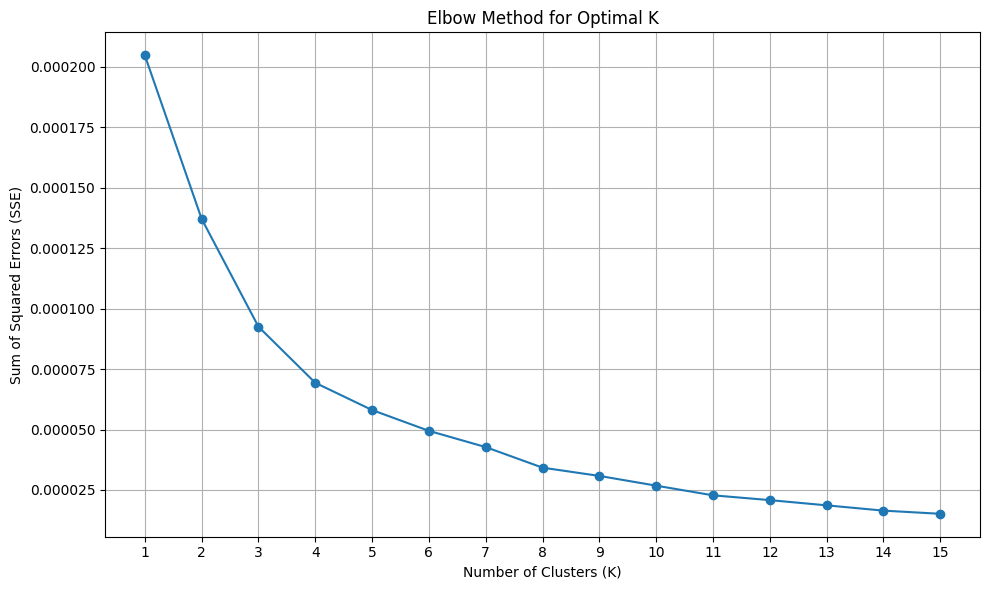

Elbow Method plot saved to kmeans_elbow_method.png
Suggested K from Elbow Method (heuristic): 2

Running Silhouette Score analysis...


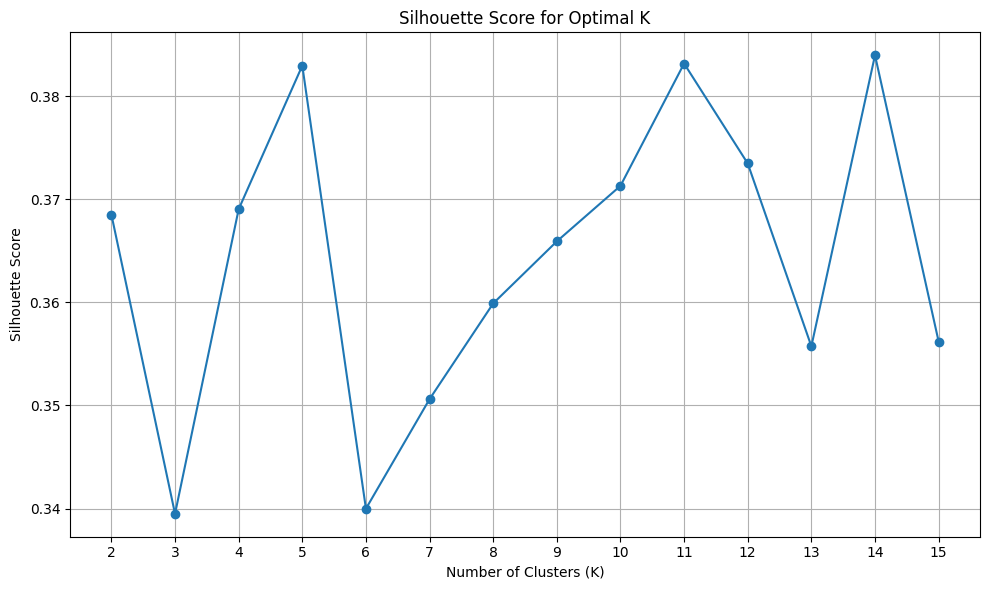

Silhouette Score plot saved to kmeans_silhouette_score.png
Suggested K from Silhouette Score: 14

--- K-Means Cluster Analysis Complete (for reference) ---

This analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = 12.

--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = 12 ---
Clustering for FIXED_M_CLUSTERS = 12 complete.

--- Starting 30 independent ACO runs for K=12, Q=6 ---

Running ACO iteration 1/30...


/tmp/ipython-input-1-1021821634.py:52: RuntimeWarning: divide by zero encountered in divide
  heuristic = np.where(distances > 0, 1.0 / distances, 0.0)


  Run 1 finished. Runtime: 19.29s, Best Cost: 11.15km

Running ACO iteration 2/30...
  Run 2 finished. Runtime: 18.84s, Best Cost: 11.10km

Running ACO iteration 3/30...
  Run 3 finished. Runtime: 11.46s, Best Cost: 11.15km

Running ACO iteration 4/30...
  Run 4 finished. Runtime: 9.84s, Best Cost: 11.52km

Running ACO iteration 5/30...
  Run 5 finished. Runtime: 10.73s, Best Cost: 11.15km

Running ACO iteration 6/30...
  Run 6 finished. Runtime: 10.35s, Best Cost: 11.20km

Running ACO iteration 7/30...
  Run 7 finished. Runtime: 8.88s, Best Cost: 11.51km

Running ACO iteration 8/30...
  Run 8 finished. Runtime: 10.35s, Best Cost: 11.11km

Running ACO iteration 9/30...
  Run 9 finished. Runtime: 11.10s, Best Cost: 11.16km

Running ACO iteration 10/30...
  Run 10 finished. Runtime: 9.64s, Best Cost: 11.24km

Running ACO iteration 11/30...
  Run 11 finished. Runtime: 9.68s, Best Cost: 11.39km

Running ACO iteration 12/30...
  Run 12 finished. Runtime: 10.44s, Best Cost: 11.10km

Running 

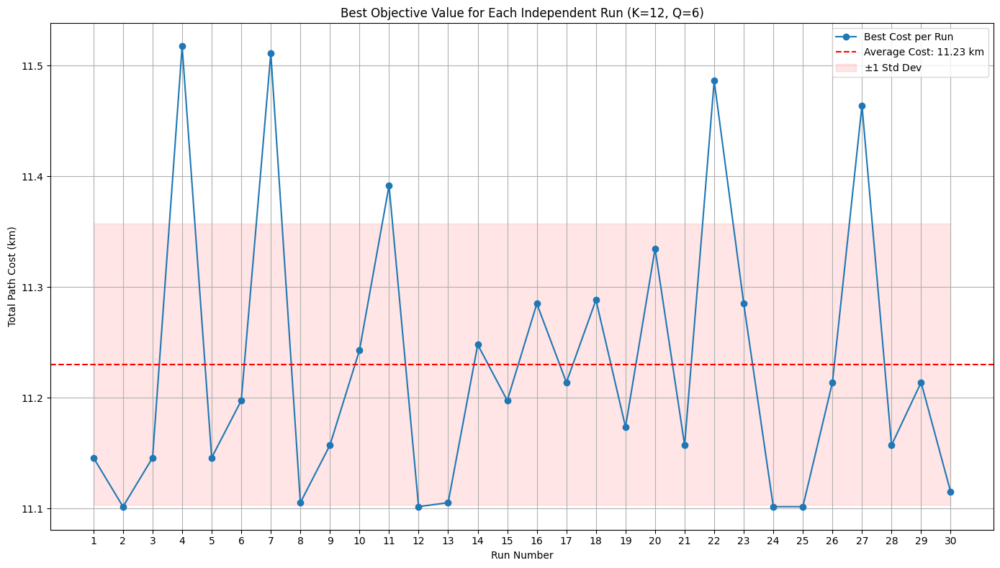

Best objective value per run plot saved to best_objective_value_per_run_K12_Q6.png

--- Generating detailed visualizations and textual output for K=12, Q_UAVS = 6 ---


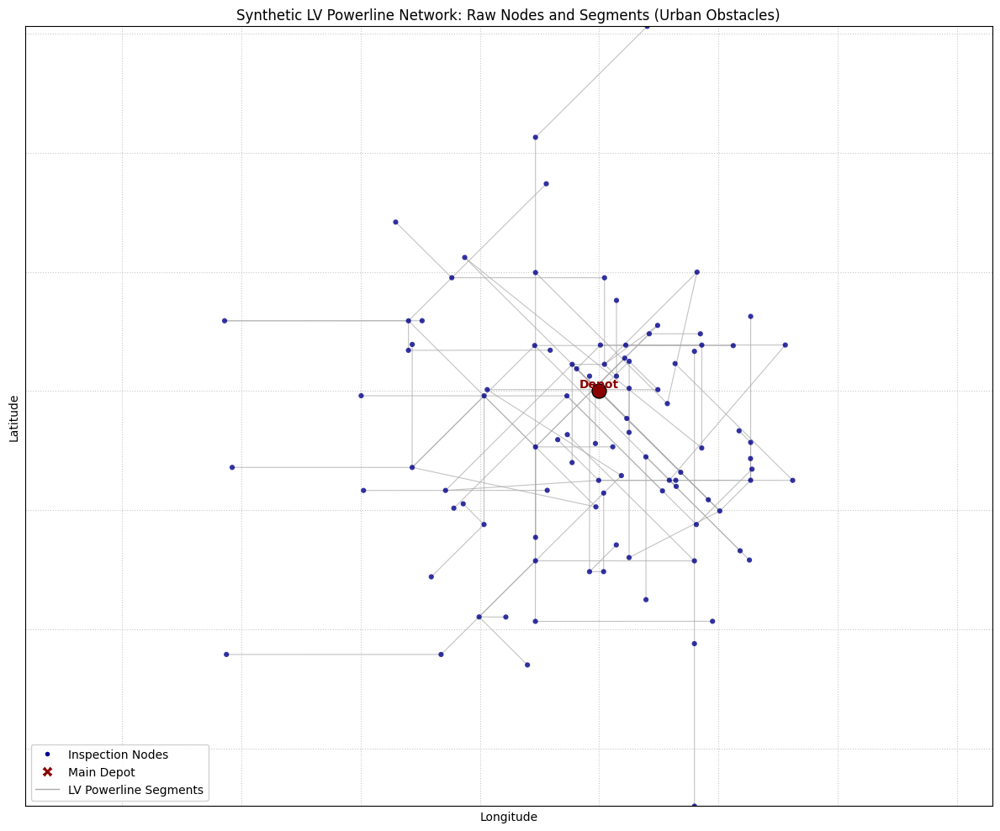

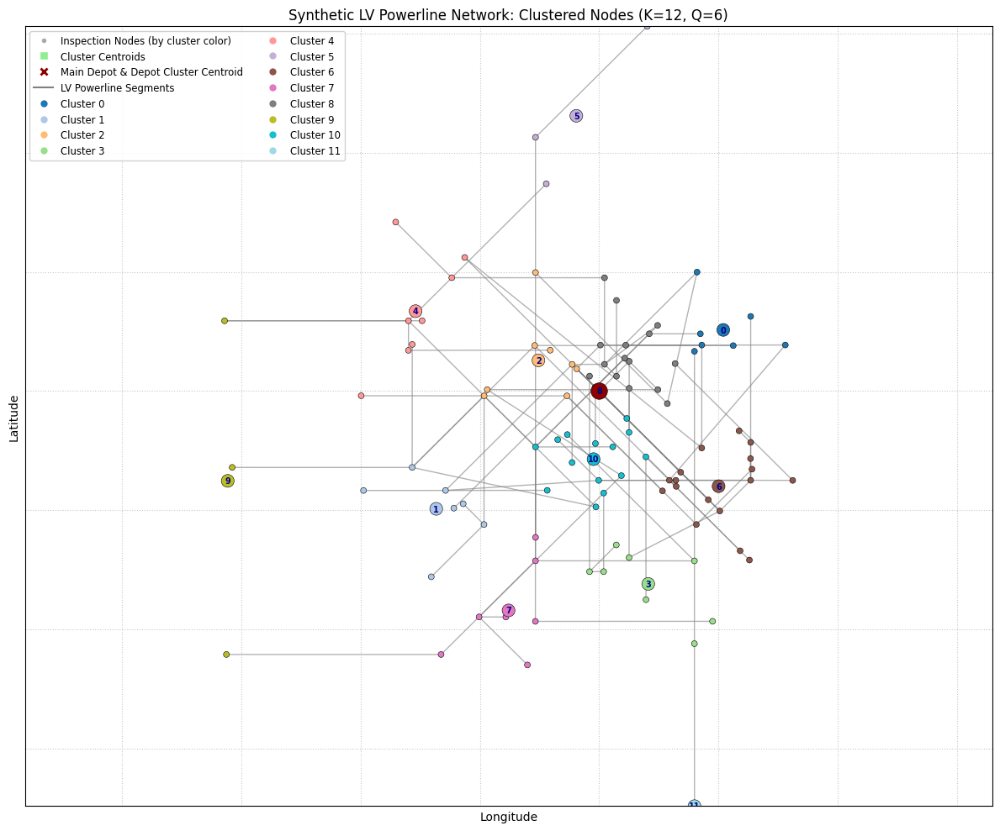

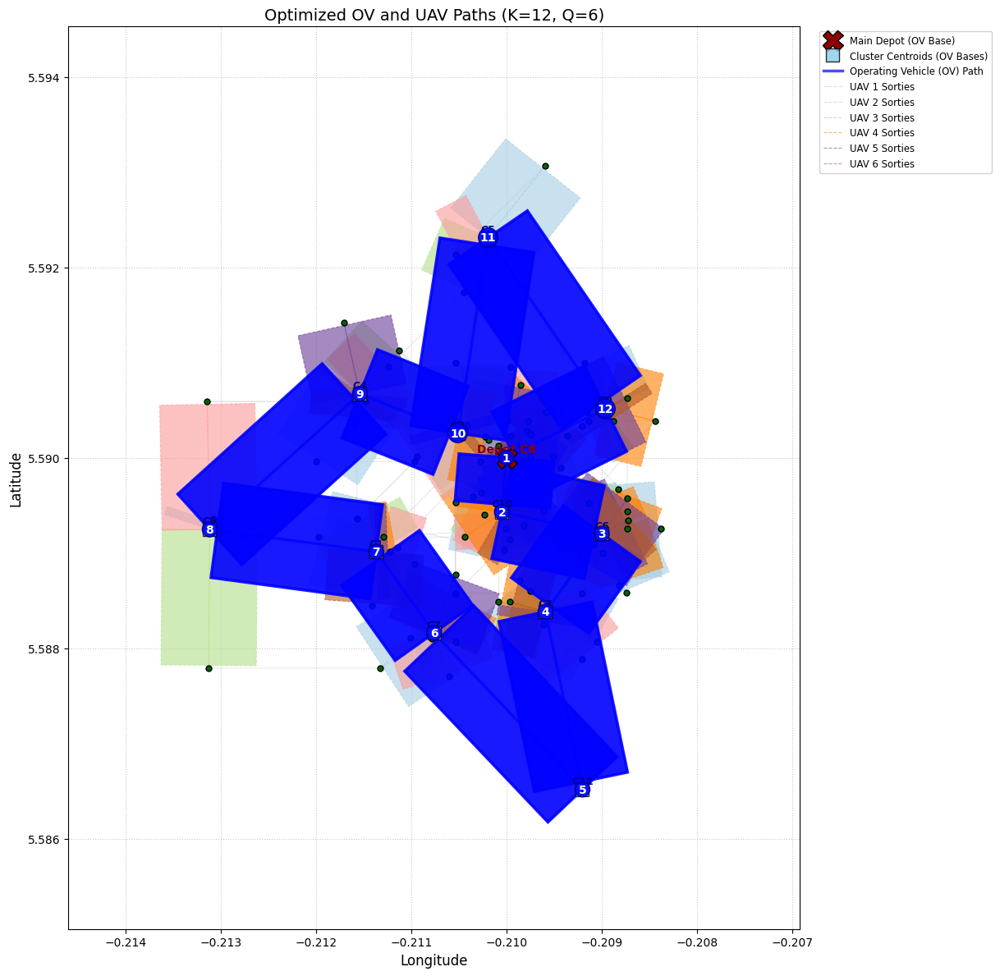


--- Running Evaluation Metrics for K=12, Q_UAVS = 6 (based on last run) ---
Node Coverage: 100.00% of inspection nodes visited.
Edge Coverage: 94.39% of LV powerline segments traversed.

--- Optimal Path Details for K=12, Q_UAVS = 6 (from last run) ---
Best Total Path Cost: 11.11 km

OV Best Path Order (Cluster IDs):
DEPOT(8) -> C10 -> C6 -> C3 -> C11 -> C7 -> C1 -> C9 -> C4 -> C2 -> C5 -> C0 -> DEPOT(8)

UAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):
  Cluster 8 (OV Base at [5.5900, -0.2100]):
    UAV 0: OV_C8 -> 33 -> OV_C8; OV_C8 -> 30 -> OV_C8; OV_C8 -> 27 -> OV_C8
    UAV 1: OV_C8 -> 65 -> OV_C8; OV_C8 -> 39 -> OV_C8; OV_C8 -> 0 -> OV_C8
    UAV 2: OV_C8 -> 5 -> OV_C8; OV_C8 -> 45 -> OV_C8; OV_C8 -> 10 -> OV_C8
    UAV 3: OV_C8 -> 59 -> OV_C8; OV_C8 -> 47 -> OV_C8; OV_C8 -> 1 -> OV_C8
    UAV 4: OV_C8 -> 97 -> OV_C8; OV_C8 -> 64 -> OV_C8; OV_C8 -> 82 -> OV_C8
    UAV 5: OV_C8 -> 4 -> OV_C8; OV_C8 -> 63 -> OV_C8
  Cluster 10 (OV Base at [5.5894, -0.2100]

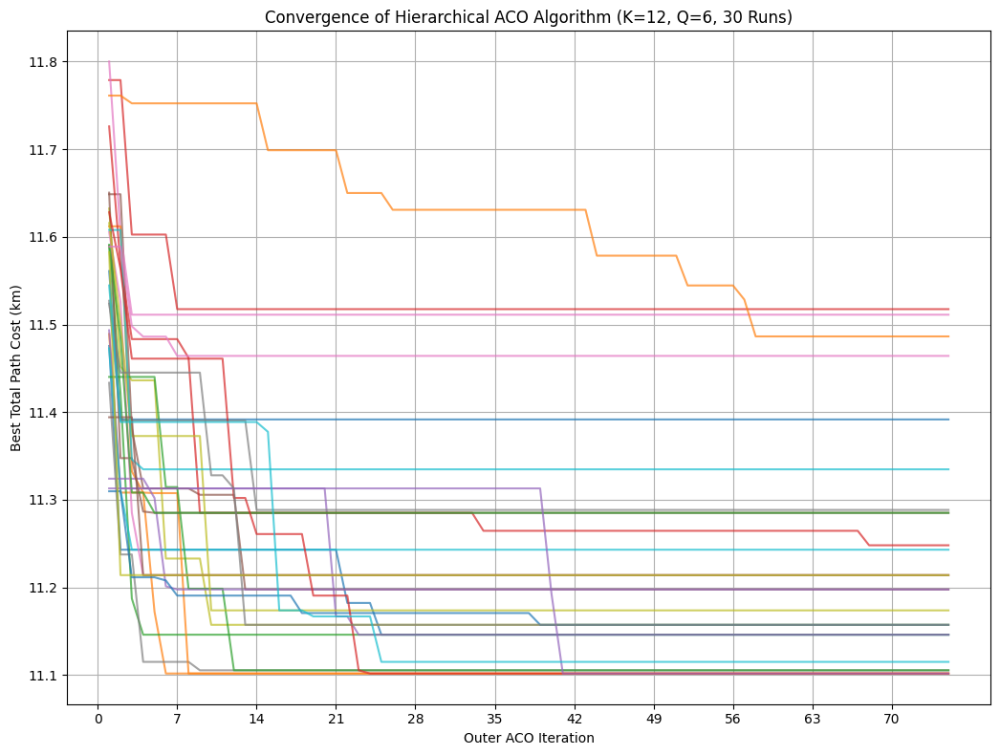


--- Plotting Objective Value Distribution ---


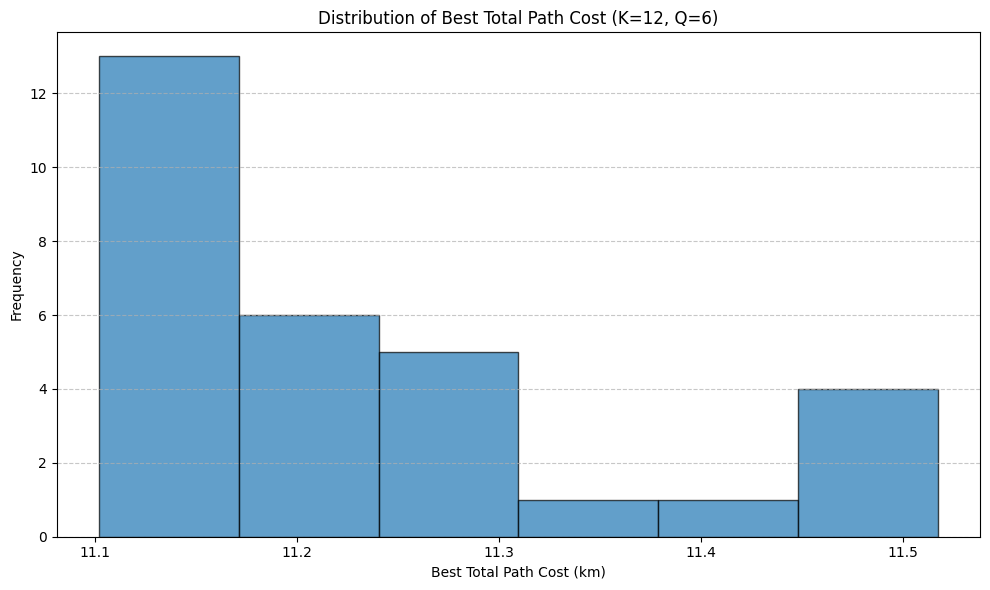

Objective value distribution plot saved to objective_value_distribution_K12_Q6.png

--- Updating and Saving Final Simulation Results to Google Drive ---
Saving final simulation results to: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json
Final data successfully saved to Google Drive!
File location: /content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json


In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness, but not used when LOAD_FROM_SAVED_DATASET is True) ---
# These parameters are for the network generation function, which won't be called if loading from file.
ACCRA_LAT_RANGE = 0.02
ACCRA_LON_RANGE = 0.02
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2
MIN_LV_SEGMENT_KM = 0.01
MAX_LV_SEGMENT_KM = 0.20

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    This function is included for completeness but will not be called in this setup
    as LOAD_FROM_SAVED_DATASET is True.
    """
    nodes = []
    edges = []
    current_node_id = 0
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1
    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), [] # Fixed lon_min_gen typo for lon_max_gen
    obstacle_zones = []
    depot_zone_buffer = 0.002
    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1
    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False
    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1) # Fixed: changed lon1 to lon1
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False
    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001
    global_attempts = 0
    max_global_attempts = num_nodes * 500
    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1
        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)
        if from_node_id >= len(nodes): continue
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']
        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2
        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))
        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))
        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))
            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)
            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue
            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)
            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue
            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue
            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist) # Fixed: changed u_node['id'] to v_node['id']
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}
    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)
    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))
    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0
    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))
    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else:
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {}

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)}

        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf')

        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3):
                    if i + 1 < len(q_route_original_ids):
                        v_original_id = q_route_original_ids[i+1]
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}

    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx)

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Note: obstacle_zones_data is not passed here, assumed to be part of the general context if needed for raw plot.
    # To re-add obstacle zones to this specific plot, pass obstacle_zones_data as an argument.
    # For now, keeping it consistent with the previous version by removing the parameter.

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments')
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    # Removed obstacle zones here for simplicity, consistent with previous raw plot removal of the param.
    # To re-add, pass obstacle_zones_data as an argument.

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title(f"Synthetic LV Powerline Network: Clustered Nodes (K={num_clusters_for_title}, Q={num_uavs_for_title})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Main Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments')
    ]
    for i in range(num_clusters_for_title): # Use num_clusters_for_title to match the clustering
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig(f"synthetic_lv_network_clustered_K{num_clusters_for_title}_Q{num_uavs_for_title}.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS_actual, bbox_coords, depot_actual_node_id, generated_lv_edges, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    # Removed obstacle zones here for simplicity.
    # To re-add, pass obstacle_zones_data as an argument.

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1), # Fixed: changed centroid['lat'] to centroid_loc['lat']
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS_actual)
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS_actual > 1:
                            normalized_uav_q = uav_q / (Q_UAVS_actual - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title(f"Optimized OV and UAV Paths (K={num_clusters_for_title}, Q={num_uavs_for_title})", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig(f"optimized_paths_ov_uav_synthetic_lv_enhanced_K{num_clusters_for_title}_Q{num_uavs_for_title}.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Optimal Cluster Analysis Functions (Elbow and Silhouette) ---

def plot_elbow_method(data_coords, max_clusters=15):
    """
    Plots the Elbow Method for K-Means to help determine optimal K.
    """
    sse = []
    if len(data_coords) < 1:
        print("Not enough data points for Elbow method.")
        return

    max_k_effective = min(max_clusters, len(data_coords))
    k_range = range(1, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(data_coords)
        sse.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.xticks(list(k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_elbow_method.png")
    plt.show()
    print("Elbow Method plot saved to kmeans_elbow_method.png")

    if len(sse) > 2:
        # Simple heuristic to find the "elbow"
        # Look for the point of maximum curvature (largest second derivative)
        diffs = np.diff(sse)
        diff_of_diffs = np.diff(diffs)
        optimal_k_elbow = np.argmax(diff_of_diffs) + 2 # +2 because diff reduces array size twice and K starts from 1
        print(f"Suggested K from Elbow Method (heuristic): {optimal_k_elbow}")
    return sse

def plot_silhouette_score(data_coords, max_clusters=15):
    """
    Plots the Silhouette Score for K-Means to help determine optimal K.
    """
    silhouette_scores = []

    if len(data_coords) < 2:
        print("Not enough data points for Silhouette Score (requires at least 2).")
        return

    max_k_effective = min(max_clusters, len(data_coords) - 1)
    if max_k_effective < 2:
        print("Not enough data points to compute Silhouette Score for multiple clusters.")
        return

    k_range = range(2, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_coords)
        if len(set(labels)) < 2:
            silhouette_scores.append(-1) # Indicate a failure or degenerate case
            print(f"Skipping Silhouette for K={k} as only 1 cluster formed.")
            continue
        try:
            score = silhouette_score(data_coords, labels)
            silhouette_scores.append(score)
        except ValueError as e:
            print(f"Could not calculate Silhouette Score for K={k}: {e}")
            silhouette_scores.append(-1)

    # Filter out invalid scores before plotting
    if not silhouette_scores or all(s == -1 for s in silhouette_scores):
        print("No valid Silhouette Scores could be computed.")
        return

    valid_k_range = [k_range[i] for i, score in enumerate(silhouette_scores) if score != -1]
    valid_scores = [score for score in silhouette_scores if score != -1]

    if not valid_scores:
        print("No valid Silhouette Scores to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.plot(valid_k_range, valid_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.xticks(list(valid_k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_silhouette_score.png")
    plt.show()
    print("Silhouette Score plot saved to kmeans_silhouette_score.png")

    optimal_k_silhouette = valid_k_range[np.argmax(valid_scores)]
    print(f"Suggested K from Silhouette Score: {optimal_k_silhouette}")
    return silhouette_scores


def plot_objective_value_distribution(objective_values, fixed_m_clusters, fixed_q_uavs):
    """
    Plots a histogram of the objective values obtained from multiple runs.
    """
    if not objective_values:
        print("No objective values to plot distribution for.")
        return

    plt.figure(figsize=(10, 6))
    plt.hist(objective_values, bins=max(5, len(objective_values)//5), edgecolor='black', alpha=0.7)
    plt.xlabel('Best Total Path Cost (km)')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Best Total Path Cost (K={fixed_m_clusters}, Q={fixed_q_uavs})')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f"objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")
    plt.show()
    print(f"Objective value distribution plot saved to objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")

def plot_best_objective_value_per_run(objective_values, avg_value, std_dev_value, fixed_m_clusters, fixed_q_uavs):
    """
    Plots the best objective value for each independent run, along with the average
    and a band for +/- 1 standard deviation.
    """
    if not objective_values:
        print("No objective values to plot per-run performance for.")
        return

    runs = np.arange(1, len(objective_values) + 1)

    plt.figure(figsize=(14, 8))
    plt.plot(runs, objective_values, marker='o', linestyle='-', label='Best Cost per Run')
    plt.axhline(avg_value, color='red', linestyle='--', label=f'Average Cost: {avg_value:.2f} km')

    # Shade the +/- 1 Std Dev region
    plt.fill_between(runs, avg_value - std_dev_value, avg_value + std_dev_value,
                     color='red', alpha=0.1, label=r'$\pm 1$ Std Dev')

    plt.title(f'Best Objective Value for Each Independent Run (K={fixed_m_clusters}, Q={fixed_q_uavs})')
    plt.xlabel('Run Number')
    plt.ylabel('Total Path Cost (km)')
    plt.xticks(runs) # Ensure all run numbers are shown on x-axis
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"best_objective_value_per_run_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")
    plt.show()
    print(f"Best objective value per run plot saved to best_objective_value_per_run_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")


# --- Main Execution Flow ---

# Configuration: Always load from JSON for network data. ACO parameters are defined here.
# Changed to initially True, but will be set to False if loading fails.
LOAD_FROM_SAVED_DATASET_INITIAL = True

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# --- ACO and Simulation Parameters (DEFINED HERE) ---
N_NODES_CONFIG = 100 # Original number of nodes when dataset was generated (informational)
FIXED_M_CLUSTERS = 12 # <--- FIXED NUMBER OF CLUSTERS for this analysis
FIXED_Q_UAVS = 6 # <--- FIXED NUMBER OF UAVS for this analysis
R_UAV_KM = 5.0 # UAV flight range in km

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50,
    'n_ants_uav': 6,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0,
    'tau0_uav': 1.0
}
# --- END ACO and Simulation Parameters ---

# --- Number of independent runs for analysis ---
NUM_INDEPENDENT_RUNS = 30 # Number of times to run the ACO for statistical analysis


# Global variables for loaded network data (original, unchanged)
all_nodes_original = []
depot_actual_node_id_original = -1
generated_lv_edges_original = []
bbox_coords_original = (0, 0, 0, 0)
obstacle_zones_data_original = []
uav_distances_matrix_original = None
uav_graph_nx_original = None

# Variables to store results from multiple runs
objective_values_over_runs = []
convergence_histories_multiple_runs = [] # To store all convergence curves for potential plotting


# Variables that will hold the results of the *last* run, used for primary visualizations
# These will be updated in the loop to be the results of the final independent run.
visual_all_nodes = []
visual_cluster_centroids = {}
visual_depot_cluster_id = -1
visual_best_overall_cost = float('inf')
visual_best_ov_path_ids = []
visual_best_uav_paths_in_clusters = {}
visual_convergence_history_last_run = []

# Flag to determine if data was successfully loaded or generated
data_ready = False

print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    # Do not exit here, allow generation fallback
    LOAD_FROM_SAVED_DATASET_INITIAL = False # Force generation if mounting fails


if LOAD_FROM_SAVED_DATASET_INITIAL:
    print("\n--- Attempting to Load Network Data from Google Drive ---")
    if not os.path.exists(SAVED_FILE_PATH):
        print(f"Warning: Saved file not found at {SAVED_FILE_PATH}. Will generate a new dataset.")
        data_ready = False
    else:
        try:
            with open(SAVED_FILE_PATH, 'r') as f:
                loaded_data = json.load(f)

            # Validate essential keys are present in the loaded JSON data
            required_keys = ['nodes', 'depot_actual_node_id', 'generated_lv_edges', 'bbox_coords', 'obstacle_zones_data']
            for key in required_keys:
                if key not in loaded_data:
                    raise KeyError(f"Missing essential key '{key}' in the loaded JSON data. The dataset file might be corrupted or incomplete. Will generate a new dataset.")

            globals()['all_nodes_original'] = loaded_data['nodes']
            globals()['depot_actual_node_id_original'] = loaded_data['depot_actual_node_id']
            globals()['generated_lv_edges_original'] = loaded_data['generated_lv_edges']
            globals()['bbox_coords_original'] = loaded_data['bbox_coords']
            globals()['obstacle_zones_data_original'] = loaded_data['obstacle_zones_data']

            if 'simulation_parameters' in loaded_data and 'N_NODES' in loaded_data['simulation_parameters']:
                globals()['N_NODES_CONFIG'] = loaded_data['simulation_parameters']['N_NODES']

            print("Network data loaded successfully from file.")
            data_ready = True

        except json.JSONDecodeError as e:
            print(f"Error: Failed to parse JSON from {SAVED_FILE_PATH}. The file might be malformed.")
            print(f"Details: {e}")
            print("Will generate a new dataset.")
            data_ready = False
        except KeyError as e:
            print(f"Error loading network data from file: {e}")
            print(f"Please check the file content. It appears to be missing a required key: {e}. Will generate a new dataset.")
            data_ready = False
        except Exception as e:
            print(f"An unexpected error occurred while loading network data: {e}")
            print("Will generate a new dataset.")
            data_ready = False

if not data_ready:
    print("\n--- Generating a New LV Powerline Network Dataset ---")
    # Parameters for network generation (can be adjusted)
    GEN_NUM_NODES = N_NODES_CONFIG # Use the configured node count for generation
    GEN_NUM_OBSTACLE_ZONES = 10
    GEN_OBSTACLE_ZONE_SIZE_FACTOR = 0.20
    GEN_MESHING_PROB = 0.001

    globals()['all_nodes_original'], \
    globals()['depot_actual_node_id_original'], \
    globals()['generated_lv_edges_original'], \
    globals()['bbox_coords_original'], \
    globals()['obstacle_zones_data_original'] = \
        generate_lv_powerline_network(GEN_NUM_NODES, GEN_NUM_OBSTACLE_ZONES, GEN_OBSTACLE_ZONE_SIZE_FACTOR, GEN_MESHING_PROB)

    # Save the newly generated data
    print("Saving newly generated network data to Google Drive...")
    try:
        drive_folder_path = os.path.dirname(SAVED_FILE_PATH)
        if not os.path.exists(drive_folder_path):
            os.makedirs(drive_folder_path)

        generated_data_to_save = {
            "nodes": all_nodes_original,
            "depot_actual_node_id": depot_actual_node_id_original,
            "generated_lv_edges": generated_lv_edges_original,
            "bbox_coords": bbox_coords_original,
            "obstacle_zones_data": obstacle_zones_data_original,
            "simulation_parameters": {
                "N_NODES": GEN_NUM_NODES,
                "NUM_OBSTACLE_ZONES": GEN_NUM_OBSTACLE_ZONES,
                "OBSTACLE_ZONE_SIZE_FACTOR": GEN_OBSTACLE_ZONE_SIZE_FACTOR,
                "MESHING_PROB": GEN_MESHING_PROB
            }
        }
        with open(SAVED_FILE_PATH, 'w') as f:
            json.dump(convert_numpy_types(generated_data_to_save), f, indent=4)
        print(f"Newly generated dataset saved to {SAVED_FILE_PATH}")
    except Exception as e:
        print(f"Error saving newly generated data: {e}. Please check permissions or path.")

    print("New network dataset generated successfully.")
    data_ready = True # Data is now ready, whether loaded or generated
    globals()['N_NODES_CONFIG'] = len(all_nodes_original) # Update N_NODES_CONFIG to actual generated count

if not data_ready:
    print("Critical Error: Could not load or generate network data. Exiting.")
    exit()

# --- Extract and Display Number of Nodes and Edges (after loading/generation) ---
num_nodes_in_dataset = len(all_nodes_original)
num_edges_in_dataset = len(generated_lv_edges_original)
print(f"\nNodes in dataset: {num_nodes_in_dataset}")
print(f"Edges in dataset: {num_edges_in_dataset}")

# --- Display Bounding Box Coordinates (after loading/generation) ---
min_lat, max_lat, min_lon, max_lon = bbox_coords_original
print(f"\nBounding Box Coordinates (Lat/Lon):")
print(f"  Min Latitude: {min_lat:.4f}")
print(f"  Max Latitude: {max_lat:.4f}")
print(f"  Min Longitude: {min_lon:.4f}")
print(f"  Max Longitude: {max_lon:.4f}")


# Build UAV distances matrix and NetworkX graph once for the loaded/generated network
print("\nBuilding UAV distances matrix and NetworkX graph for the network...")
uav_distances_matrix_original, uav_graph_nx_original = build_uav_distances_matrix_from_edges_nx(all_nodes_original, generated_lv_edges_original)
print("UAV distances matrix and NetworkX graph built.")

# --- Perform Optimal K-Means Clustering Analysis on the loaded data (informational) ---
print("\n--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---")
coords_for_kmeans_analysis = np.array([[node['lat'], node['lon']] for node in all_nodes_original])

if len(coords_for_kmeans_analysis) == 0:
    print("No data points available for cluster analysis. Skipping.")
else:
    max_clusters_to_test = min(len(coords_for_kmeans_analysis) - 1, 15)
    if max_clusters_to_test < 2:
        print(f"Warning: Only {len(coords_for_kmeans_analysis)} nodes. Cannot perform comprehensive cluster analysis.")
    else:
        print(f"Testing K from 1 to {max_clusters_to_test} for Elbow Method, and 2 to {max_clusters_to_test} for Silhouette Score.")
        print("\nRunning Elbow Method...")
        plot_elbow_method(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\nRunning Silhouette Score analysis...")
        plot_silhouette_score(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\n--- K-Means Cluster Analysis Complete (for reference) ---")
        print(f"\nThis analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS}.")


# --- Perform K-Means Clustering ONCE for FIXED_M_CLUSTERS ---
print(f"\n--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} ---")
current_all_nodes_clustered = [node.copy() for node in all_nodes_original] # Deep copy for modification
coords_fixed_k = np.array([[node['lat'], node['lon']] for node in current_all_nodes_clustered])

if len(current_all_nodes_clustered) < FIXED_M_CLUSTERS:
    print(f"Error: Number of nodes ({len(current_all_nodes_clustered)}) is less than FIXED_M_CLUSTERS ({FIXED_M_CLUSTERS}). Cannot proceed with clustering. Exiting.")
    exit()

kmeans_fixed_k = KMeans(n_clusters=FIXED_M_CLUSTERS, random_state=42, n_init=10)
labels_fixed_k = kmeans_fixed_k.fit_predict(coords_fixed_k)

fixed_clusters_data = {i: [] for i in range(FIXED_M_CLUSTERS)}
for i, label in enumerate(labels_fixed_k):
    current_all_nodes_clustered[i]['cluster_id'] = label
    fixed_clusters_data[label].append(current_all_nodes_clustered[i])

fixed_cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans_fixed_k.cluster_centers_)}

fixed_depot_node_obj = next(node for node in current_all_nodes_clustered if node['id'] == depot_actual_node_id_original)
fixed_depot_cluster_id = fixed_depot_node_obj['cluster_id']
fixed_cluster_centroids[fixed_depot_cluster_id]['lat'] = DEPOT_COORD['lat']
fixed_cluster_centroids[fixed_depot_cluster_id]['lon'] = DEPOT_COORD['lon']
fixed_cluster_centroids[fixed_depot_cluster_id]['id'] = f"D{fixed_depot_cluster_id}" # Assign a string ID

fixed_all_clusters_for_aco = {
    'centroids': fixed_cluster_centroids,
    'node_sets': fixed_clusters_data
}
print(f"Clustering for FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} complete.")


# --- Main Loop for Multiple Independent Runs ---
print(f"\n--- Starting {NUM_INDEPENDENT_RUNS} independent ACO runs for K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS} ---")

for run_idx in range(NUM_INDEPENDENT_RUNS):
    print(f"\nRunning ACO iteration {run_idx + 1}/{NUM_INDEPENDENT_RUNS}...")

    # Re-initialize pheromones for each independent run
    OV_ACO_PARAMS_RUN = OV_ACO_PARAMS.copy()
    UAV_ACO_PARAMS_RUN = UAV_ACO_PARAMS.copy()
    OV_ACO_PARAMS_RUN['tau0_ov'] = 1.0 # Reset initial pheromone
    UAV_ACO_PARAMS_RUN['tau0_uav'] = 1.0 # Reset initial pheromone

    start_time_run = time.time()
    current_run_best_cost, current_run_best_ov_path_ids, current_run_best_uav_paths_in_clusters, current_run_convergence_history = solve_outer_aco(
        fixed_depot_cluster_id,
        fixed_all_clusters_for_aco,
        current_all_nodes_clustered,
        uav_distances_matrix_original,
        FIXED_Q_UAVS, # Fixed Q for this analysis
        R_UAV_KM,
        OV_ACO_PARAMS_RUN,
        UAV_ACO_PARAMS_RUN
    )
    end_time_run = time.time()
    run_duration = end_time_run - start_time_run

    print(f"  Run {run_idx + 1} finished. Runtime: {run_duration:.2f}s, Best Cost: {current_run_best_cost:.2f}km")

    objective_values_over_runs.append(current_run_best_cost)
    convergence_histories_multiple_runs.append(current_run_convergence_history)

    # Store results from the *last* run for primary visualization
    if run_idx == NUM_INDEPENDENT_RUNS - 1:
        globals()['visual_all_nodes'] = current_all_nodes_clustered
        globals()['visual_cluster_centroids'] = fixed_cluster_centroids
        globals()['visual_depot_cluster_id'] = fixed_depot_cluster_id
        globals()['visual_best_overall_cost'] = current_run_best_cost
        globals()['visual_best_ov_path_ids'] = current_run_best_ov_path_ids
        globals()['visual_best_uav_paths_in_clusters'] = current_run_best_uav_paths_in_clusters
        globals()['visual_convergence_history_last_run'] = current_run_convergence_history


print("\n--- All Independent ACO Runs Complete ---")

# --- Calculate Average and Standard Deviation of Objective Values ---
if objective_values_over_runs:
    average_objective_value = np.mean(objective_values_over_runs)
    std_dev_objective_value = np.std(objective_values_over_runs)

    print("\n--- Objective Value Statistical Analysis ---")
    print(f"Average Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {average_objective_value:.2f} km")
    print(f"Standard Deviation of Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {std_dev_objective_value:.2f} km")

    # --- New Plot: Best Objective Value per Independent Run ---
    plot_best_objective_value_per_run(objective_values_over_runs, average_objective_value, std_dev_objective_value, FIXED_M_CLUSTERS, FIXED_Q_UAVS)

else:
    average_objective_value = np.nan
    std_dev_objective_value = np.nan
    print("\nNo objective values collected for statistical analysis.")


# --- Final Visualizations and Textual Output (Only for the last run's configuration) ---
if visual_best_overall_cost != float('inf'): # Check if visual_results were actually populated
    print(f"\n--- Generating detailed visualizations and textual output for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} ---")

    plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in visual_all_nodes}
    node_labels_map = {node['id']: str(node['id']) for node in visual_all_nodes}

    centroid_plot_ids_map = {}
    for c_id, centroid in visual_cluster_centroids.items():
        plot_id = f"C{c_id}"
        if c_id == visual_depot_cluster_id:
            plot_id = f"DepotC{c_id}"
        plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
        node_labels_map[plot_id] = str(c_id)
        centroid_plot_ids_map[c_id] = plot_id

    cluster_colors_map = plt.get_cmap('tab20', FIXED_M_CLUSTERS)

    plot_raw_powerline_network(all_nodes_original, generated_lv_edges_original, bbox_coords_original, DEPOT_COORD, depot_actual_node_id_original)

    plot_clustered_powerline_network_nx(visual_all_nodes, visual_cluster_centroids, visual_depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges_original, bbox_coords_original, depot_actual_node_id_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    plot_best_paths_nx(visual_all_nodes, visual_best_ov_path_ids, visual_best_uav_paths_in_clusters, visual_cluster_centroids, visual_depot_cluster_id, plot_nodes_coords, FIXED_Q_UAVS, bbox_coords_original, depot_actual_node_id_original, generated_lv_edges_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    print(f"\n--- Running Evaluation Metrics for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (based on last run) ---")
    node_coverage = calculate_node_coverage(visual_all_nodes, depot_actual_node_id_original, visual_best_uav_paths_in_clusters)
    print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")
    edge_coverage = calculate_edge_coverage(visual_all_nodes, generated_lv_edges_original, visual_best_uav_paths_in_clusters, visual_cluster_centroids, uav_graph_nx_original)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")


    print(f"\n--- Optimal Path Details for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (from last run) ---")
    print(f"Best Total Path Cost: {visual_best_overall_cost:.2f} km")

    print("\nOV Best Path Order (Cluster IDs):")
    ov_path_str_display = []
    for c_id in visual_best_ov_path_ids:
        if c_id == visual_depot_cluster_id:
            ov_path_str_display.append(f"DEPOT({c_id})")
        else:
            ov_path_str_display.append(f"C{c_id}")
    print(" -> ".join(ov_path_str_display))

    print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
    for cluster_id, uav_routes in visual_best_uav_paths_in_clusters.items():
        centroid_display = visual_cluster_centroids[cluster_id]
        print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
        for uav_q, route_nodes_ids in uav_routes.items():
            if route_nodes_ids:
                display_sorties = []
                for i in range(0, len(route_nodes_ids), 3):
                    if i + 1 < len(route_nodes_ids):
                        display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")
                print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
            else:
                print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")
else:
    print(f"\nNo detailed visualizations or textual output for K={FIXED_M_CLUSTERS}, Q_UAVS={FIXED_Q_UAVS} because no valid results were stored (e.g., all runs failed).")


# --- Combined Convergence Analysis Visualization (all runs) ---
print("\n--- Plotting Convergence Analysis for all independent runs ---")
plt.figure(figsize=(12, 8))
for i, history in enumerate(convergence_histories_multiple_runs):
    if history:
        plt.plot(range(1, len(history) + 1), history, alpha=0.7, label=f'Run {i+1}')

plt.title(f'Convergence of Hierarchical ACO Algorithm (K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS}, {NUM_INDEPENDENT_RUNS} Runs)')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
max_iters = max([len(h) for h in convergence_histories_multiple_runs if h]) if convergence_histories_multiple_runs else OV_ACO_PARAMS['iters_ov']
plt.xticks(np.arange(0, max_iters + 1, max(1, max_iters // 10)))
if NUM_INDEPENDENT_RUNS <= 10: # Only show legend if not too many runs for readability
    plt.legend(title='Run Number', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for legend
plt.savefig(f"aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
print(f"Combined convergence plot for multiple runs saved to aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
plt.show()

# --- Objective Value Distribution Visualization ---
print("\n--- Plotting Objective Value Distribution ---")
plot_objective_value_distribution(objective_values_over_runs, FIXED_M_CLUSTERS, FIXED_Q_UAVS)


# --- Save final results ---
print("\n--- Updating and Saving Final Simulation Results to Google Drive ---")
try:
    final_data_to_save_raw = {
        "nodes": visual_all_nodes, # From the last run for visualization
        "depot_actual_node_id": depot_actual_node_id_original,
        "num_nodes_in_dataset": num_nodes_in_dataset, # New
        "num_edges_in_dataset": num_edges_in_dataset, # New
        "bbox_coords": bbox_coords_original, # Already present and updated
        "obstacle_zones_data": obstacle_zones_data_original,
        "cluster_centroids": visual_cluster_centroids,
        "best_ov_path_ids": visual_best_ov_path_ids,
        "best_uav_paths_in_clusters": visual_best_uav_paths_in_clusters,
        "best_overall_cost": visual_best_overall_cost, # From last run
        "convergence_history_last_run": visual_convergence_history_last_run, # From last run
        "objective_values_over_runs": objective_values_over_runs, # All objective values
        "average_objective_value": average_objective_value, # New
        "std_dev_objective_value": std_dev_objective_value, # New
        "convergence_histories_multiple_runs": convergence_histories_multiple_runs, # All convergence curves
        "simulation_parameters": {
            "N_NODES_CONFIG": N_NODES_CONFIG,
            "FIXED_M_CLUSTERS": FIXED_M_CLUSTERS,
            "FIXED_Q_UAVS": FIXED_Q_UAVS,
            "NUM_INDEPENDENT_RUNS": NUM_INDEPENDENT_RUNS, # New
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

    drive_folder_path = os.path.dirname(SAVED_FILE_PATH)
    if not os.path.exists(drive_folder_path):
        os.makedirs(drive_folder_path) # Ensure directory exists

    print(f"Saving final simulation results to: {SAVED_FILE_PATH}")
    with open(SAVED_FILE_PATH, 'w') as f:
        json.dump(final_data_to_save_converted, f, indent=4)
    print("Final data successfully saved to Google Drive!")
    print(f"File location: {SAVED_FILE_PATH}")
except Exception as e:
    print(f"Error saving final data to file: {e}")



In [ ]:
import sys
print(sys.version)

3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]


In [ ]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0xffffffff
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data retbleed bhi
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
ad

In [ ]:
!cat /proc/meminfo | grep MemTotal

MemTotal:       13289424 kB


In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


BEST 30

In [ ]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import time
import json
import os
from google.colab import drive

# --- Helper function to convert NumPy types to Python native types for JSON serialization ---
def convert_numpy_types(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, dict):
        return {k: convert_numpy_types(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy_types(elem) for elem in obj]
    else:
        return obj


# --- Haversine Distance Function ---
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371 # Radius of Earth in kilometers

    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance # in kilometers

# --- Pheromone and Heuristic Initialization ---
def initialize_pheromones(num_entities, tau0=1.0):
    return np.full((num_entities, num_entities), tau0)

def calculate_heuristic(distances):
    # Use np.where to handle division by zero for unreachable nodes
    # Unreachable nodes (inf distance) will have 0 heuristic
    heuristic = np.where(distances > 0, 1.0 / distances, 0.0)
    # Set heuristic for self-loops (distances == 0) to 0
    np.fill_diagonal(heuristic, 0)
    return heuristic

# --- Probability Calculation (for a single source node) ---
def calculate_probabilities_from_node(pheromones_row, heuristics_row, visited_nodes_indices_set, alpha, beta):
    numerator_row = np.power(pheromones_row, alpha) * np.power(heuristics_row, beta)

    # Mask out visited nodes for the current ant's tour
    mask = np.zeros_like(numerator_row, dtype=bool)
    mask[list(visited_nodes_indices_set)] = True
    numerator_row[mask] = 0 # Prevent visiting already visited nodes (for this ant's tour)

    denominator = np.sum(numerator_row)

    # Handle cases where denominator is zero to avoid division by zero
    probabilities_row = np.divide(numerator_row, denominator,
                                  out=np.zeros_like(numerator_row),
                                  where=denominator != 0)
    return probabilities_row

# --- Pheromone Update (Evaporation & Deposition) ---
def update_pheromones(pheromones, paths, costs, rho, Q_deposit):
    pheromones *= (1 - rho)
    for path, cost in zip(paths, costs):
        if cost == 0 or cost == np.inf: # Skip if cost is zero or infinite
            continue
        pheromone_to_add = Q_deposit / cost
        for i in range(len(path) - 1):
            u, v = path[i], path[i+1]
            pheromones[u, v] += pheromone_to_add
            pheromones[v, u] += pheromone_to_add # Assuming symmetric

# --- Build UAV Distances Matrix using NetworkX APSP (for generated edges) ---
def build_uav_distances_matrix_from_edges_nx(aco_nodes, aco_edges):
    """
    Calculates all-pairs shortest paths using NetworkX for a given set of nodes and edges.
    Handles disconnected components by penalizing paths that cannot be traversed via existing edges.
    This is crucial for UAVs which must follow the powerline network or incur a significant penalty for off-line travel.
    Returns the distance matrix and the NetworkX graph itself for later path extraction.
    """
    num_nodes = len(aco_nodes)
    id_to_idx = {node['id']: i for i, node in enumerate(aco_nodes)}

    G_nx = nx.Graph()
    for node in aco_nodes:
        G_nx.add_node(node['id'], lat=node['lat'], lon=node['lon'])

    for u_id, v_id, dist in aco_edges:
        if u_id in G_nx.nodes and v_id in G_nx.nodes:
            G_nx.add_edge(u_id, v_id, weight=dist)

    print("Calculating all-pairs shortest paths using NetworkX (repeated Dijkstra's)...")
    start_apsp_time = time.time()

    all_pairs_paths_gen = nx.all_pairs_dijkstra_path_length(G_nx, weight='weight')
    all_pairs_paths = {source: dict(paths) for source, paths in all_pairs_paths_gen}

    end_apsp_time = time.time()
    print(f"NetworkX APSP computation time: {end_apsp_time - start_apsp_time:.2f} seconds.")

    uav_distances = np.full((num_nodes, num_nodes), np.inf)
    np.fill_diagonal(uav_distances, 0)

    for u_id, paths in all_pairs_paths.items():
        u_idx = id_to_idx.get(u_id)
        if u_idx is None: continue

        for v_id, dist in paths.items():
            v_idx = id_to_idx.get(v_id)
            if v_idx is None: continue
            uav_distances[u_idx, v_idx] = dist
            uav_distances[v_idx, u_idx] = dist

    PENALTY_FACTOR = 5.0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i == j: continue

            if uav_distances[i, j] == np.inf:
                lat1, lon1 = aco_nodes[i]['lat'], aco_nodes[i]['lon']
                lat2, lon2 = aco_nodes[j]['lat'], aco_nodes[j]['lon']
                direct_air_dist = haversine_distance(lat1, lon1, lat2, lon2)

                if direct_air_dist == 0:
                    uav_distances[i, j] = 1e-6 * PENALTY_FACTOR
                else:
                    uav_distances[i, j] = direct_air_dist * PENALTY_FACTOR
                uav_distances[j, i] = uav_distances[i, j]

    return uav_distances, G_nx # Return the graph


# --- LV Network Generation (Included for completeness, but not used when LOAD_FROM_SAVED_DATASET is True) ---
# These parameters are for the network generation function, which won't be called if loading from file.
ACCRA_LAT_RANGE = 0.02
ACCRA_LON_RANGE = 0.02
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}
ACCRA_LAT_MIN = DEPOT_COORD['lat'] - ACCRA_LAT_RANGE / 2
ACCRA_LAT_MAX = DEPOT_COORD['lat'] + ACCRA_LAT_RANGE / 2
ACCRA_LON_MIN = DEPOT_COORD['lon'] - ACCRA_LON_RANGE / 2
ACCRA_LON_MAX = DEPOT_COORD['lon'] + ACCRA_LON_RANGE / 2
MIN_LV_SEGMENT_KM = 0.01
MAX_LV_SEGMENT_KM = 0.20

def generate_lv_powerline_network(num_nodes, num_obstacle_zones=10, obstacle_zone_size_factor=0.20, meshing_prob=0.001):
    """
    Generates a synthetic LV powerline network by creating regions of suppressed
    connectivity (simulating buildings/dense areas).
    This function is included for completeness but will not be called in this setup
    as LOAD_FROM_SAVED_DATASET is True.
    """
    nodes = []
    edges = []
    current_node_id = 0
    lat_min_gen, lat_max_gen = ACCRA_LAT_MIN, ACCRA_LAT_MAX
    lon_min_gen, lon_max_gen = ACCRA_LON_MIN, ACCRA_LON_MAX
    depot_node_id = current_node_id
    nodes.append({'id': current_node_id, 'lat': DEPOT_COORD['lat'], 'lon': DEPOT_COORD['lon'], 'is_depot': True})
    current_node_id += 1
    remaining_nodes_to_generate = num_nodes - 1
    if num_nodes < 1: raise ValueError("num_nodes must be at least 1")
    if num_nodes == 1: return nodes, depot_node_id, [], (lat_min_gen, lat_max_gen, lon_min_gen, lon_max_gen), [] # Fixed lon_min_gen typo for lon_max_gen
    obstacle_zones = []
    depot_zone_buffer = 0.002
    for _ in range(num_obstacle_zones):
        zone_width_lat = ACCRA_LAT_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        zone_height_lon = ACCRA_LON_RANGE * obstacle_zone_size_factor * random.uniform(0.8, 1.2)
        attempts = 0
        max_attempts_zone = 100
        while attempts < max_attempts_zone:
            zone_lat_min = random.uniform(lat_min_gen, lat_max_gen - zone_width_lat)
            zone_lon_min = random.uniform(lon_min_gen, lon_max_gen - zone_height_lon)
            zone_lat_max = zone_lat_min + zone_width_lat
            zone_lon_max = zone_lon_min + zone_height_lon
            if not (DEPOT_COORD['lat'] + depot_zone_buffer > zone_lat_min and \
                    DEPOT_COORD['lat'] - depot_zone_buffer < zone_lat_max and \
                    DEPOT_COORD['lon'] + depot_zone_buffer > zone_lon_min and \
                    DEPOT_COORD['lon'] - depot_zone_buffer < zone_lon_max):
                obstacle_zones.append({
                    'lat_min': zone_lat_min, 'lat_max': zone_lat_max,
                    'lon_min': zone_lon_min, 'lon_max': zone_lon_max
                })
                break
            attempts += 1
    def is_point_in_obstacle_zone(lat, lon):
        for zone in obstacle_zones:
            if zone['lat_min'] <= lat <= zone['lat_max'] and \
               zone['lon_min'] <= lon <= zone['lon_max']:
                return True
        return False
    def does_edge_cross_obstacle_zone(lat1, lon1, lat2, lon2, num_checks=5):
        for i in range(num_checks + 1):
            t = i / num_checks
            check_lat = lat1 + t * (lat2 - lat1)
            check_lon = lon1 + t * (lon2 - lon1) # Fixed: changed lon1 to lon1
            if is_point_in_obstacle_zone(check_lat, check_lon):
                return True
        return False
    expandable_nodes = [depot_node_id]
    growth_angles = [0, np.pi/2, np.pi, 3*np.pi/2, np.pi/4, 3*np.pi/4, 5*np.pi/4, 7*np.pi/4]
    JITTER_LAT = 0.000001
    JITTER_LON = 0.000001
    global_attempts = 0
    max_global_attempts = num_nodes * 500
    while remaining_nodes_to_generate > 0 and global_attempts < max_global_attempts:
        global_attempts += 1
        if not expandable_nodes:
            if len(nodes) > 1:
                from_node_id = random.choice(nodes)['id']
            else:
                break
        else:
            from_node_id = random.choice(expandable_nodes)
        if from_node_id >= len(nodes): continue
        from_lat, from_lon = nodes[from_node_id]['lat'], nodes[from_node_id]['lon']
        num_branches_attempt = 1
        if random.random() < 0.2:
            num_branches_attempt = 2
        chosen_angles = random.sample(growth_angles, k=min(num_branches_attempt, len(growth_angles)))
        if random.random() < 0.02:
            chosen_angles.append(random.uniform(0, 2*np.pi))
        for angle in chosen_angles:
            if remaining_nodes_to_generate <= 0: break
            segment_length_km = random.uniform(MIN_LV_SEGMENT_KM, MAX_LV_SEGMENT_KM)
            avg_lat_rad = radians((lat_min_gen + lat_max_gen) / 2)
            lat_offset = segment_length_km * np.sin(angle) / 111
            lon_offset = segment_length_km * np.cos(angle) / (111 * np.cos(avg_lat_rad))
            target_lat = from_lat + lat_offset
            target_lon = from_lon + lon_offset
            new_lat = target_lat + random.uniform(-JITTER_LAT, JITTER_LAT)
            new_lon = target_lon + random.uniform(-JITTER_LON, JITTER_LON)
            new_lat = max(lat_min_gen, min(lat_max_gen, new_lat))
            new_lon = max(lon_min_gen, min(lon_max_gen, new_lon))
            if is_point_in_obstacle_zone(new_lat, new_lon) or \
               does_edge_cross_obstacle_zone(from_lat, from_lon, new_lat, new_lon):
                continue
            dist_calculated = haversine_distance(from_lat, from_lon, new_lat, new_lon)
            is_too_close = False
            for existing_node in nodes:
                if haversine_distance(new_lat, new_lon, existing_node['lat'], existing_node['lon']) < MIN_LV_SEGMENT_KM * 0.5:
                    is_too_close = True
                    break
            if is_too_close: continue
            if MIN_LV_SEGMENT_KM <= dist_calculated <= MAX_LV_SEGMENT_KM and current_node_id < num_nodes:
                nodes.append({'id': current_node_id, 'lat': new_lat, 'lon': new_lon})
                edges.append((from_node_id, current_node_id, dist_calculated))
                if current_node_id not in expandable_nodes:
                    expandable_nodes.append(current_node_id)
                current_node_id += 1
                remaining_nodes_to_generate -= 1
            else:
                if from_node_id not in expandable_nodes:
                    expandable_nodes.append(from_node_id)
    temp_graph = nx.Graph()
    for u,v,d in edges:
        temp_graph.add_edge(u,v, weight=d)
    for u_node in nodes:
        for v_node in nodes:
            if u_node['id'] == v_node['id'] or temp_graph.has_edge(u_node['id'], v_node['id']):
                continue
            dist = haversine_distance(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon'])
            if MIN_LV_SEGMENT_KM * 0.8 <= dist <= MAX_LV_SEGMENT_KM * 1.5:
                if random.random() < meshing_prob and \
                   not does_edge_cross_obstacle_zone(u_node['lat'], u_node['lon'], v_node['lat'], v_node['lon']):
                    edges.append((u_node['id'], v_node['id'], dist))
                    temp_graph.add_edge(u_node['id'], v_node['id'], weight=dist) # Fixed: changed u_node['id'] to v_node['id']
    old_ids = sorted([n['id'] for n in nodes])
    id_map = {old_id: new_idx for new_idx, old_id in enumerate(old_ids)}
    reindexed_nodes = []
    for node in nodes:
        new_node = {'id': id_map[node['id']], 'lat': node['lat'], 'lon': node['lon']}
        if 'is_depot' in node: new_node['is_depot'] = node['is_depot']
        reindexed_nodes.append(new_node)
    reindexed_edges = []
    for u_id, v_id, dist in edges:
        if u_id in id_map and v_id in id_map:
            new_u_id = id_map[u_id]
            new_v_id = id_map[v_id]
            reindexed_edges.append((new_u_id, new_v_id, dist))
            reindexed_edges.append((new_v_id, new_u_id, dist)) # For undirected graph
    unique_edges = set()
    final_edges = []
    for u, v, d in reindexed_edges:
        edge_key = tuple(sorted((u, v)))
        if edge_key not in unique_edges:
            unique_edges.add(edge_key)
            final_edges.append((u, v, d))
    new_depot_id = id_map[depot_node_id] if depot_node_id in id_map else 0
    actual_lats = [n['lat'] for n in reindexed_nodes]
    actual_lons = [n['lon'] for n in reindexed_nodes]
    bbox = (min(actual_lats), max(actual_lats), min(actual_lons), max(actual_lons))
    return reindexed_nodes, new_depot_id, final_edges, bbox, obstacle_zones


# --- Inner ACO Function (adjusted for "one tower per sortie" rule) ---
def solve_inner_aco(cluster_id, nodes_in_cluster, num_uavs, uav_range, uav_distances_all, depot_coords, uav_aco_params, all_nodes_global):
    """
    Solves the UAV routing problem for a single cluster.
    Assumes "one tower per sortie": each UAV flight is from the OV location (cluster centroid)
    to a single inspection node and back to the OV location.
    The inner ACO's goal is to assign all nodes in the cluster to the available UAVs
    such that total UAV flight distance is minimized and individual sortie ranges are met.
    """
    iters_uav = uav_aco_params['iters_uav']
    n_ants_uav = uav_aco_params['n_ants_uav']
    rho_uav = uav_aco_params['rho_uav']
    alpha_uav = uav_aco_params['alpha_uav']
    beta_uav = uav_aco_params['beta_uav']
    q_deposit_uav = uav_aco_params['q_deposit_uav']

    local_nodes = [{'id': -1, 'lat': depot_coords['lat'], 'lon': depot_coords['lon'], 'is_virtual_depot': True}] + nodes_in_cluster
    original_id_to_local_idx = {node['id']: i for i, node in enumerate(local_nodes)}
    global_id_to_global_idx = {node['id']: i for i, node in enumerate(all_nodes_global)}

    num_local_nodes = len(local_nodes)
    local_uav_distances = np.zeros((num_local_nodes, num_local_nodes))

    for i in range(num_local_nodes):
        for j in range(num_local_nodes):
            if i == j:
                local_uav_distances[i, j] = 0
                continue

            if local_nodes[i].get('is_virtual_depot') or local_nodes[j].get('is_virtual_depot'):
                local_uav_distances[i, j] = haversine_distance(
                    local_nodes[i]['lat'], local_nodes[i]['lon'],
                    local_nodes[j]['lat'], local_nodes[j]['lon']
                )
            else:
                id_i = local_nodes[i]['id']
                id_j = local_nodes[j]['id']
                try:
                    global_idx_i = global_id_to_global_idx[id_i]
                    global_idx_j = global_id_to_global_idx[id_j]
                    local_uav_distances[i, j] = uav_distances_all[global_idx_i, global_idx_j]
                except KeyError:
                   print(f"Error: Node ID {id_i} or {id_j} not found in global_id_to_global_idx map for cluster {cluster_id}.")
                   local_uav_distances[i, j] = float('inf')


    pheromones_uav = initialize_pheromones(num_local_nodes, tau0=uav_aco_params['tau0_uav'])
    heuristics_uav = calculate_heuristic(local_uav_distances)

    best_cluster_uav_cost = float('inf')
    best_cluster_uav_routes = {}

    for iter_uav in range(iters_uav):
        ant_current_total_uav_cost = 0.0
        ant_current_uav_routes = {q: [] for q in range(num_uavs)}

        nodes_to_inspect_local_idx = [original_id_to_local_idx[node['id']] for node in nodes_in_cluster]
        random.shuffle(nodes_to_inspect_local_idx)

        nodes_assigned_in_this_ant_tour = []
        successful_assignments_in_ant = 0

        for node_local_idx in nodes_to_inspect_local_idx:
            try:
                sortie_cost = local_uav_distances[0, node_local_idx] + local_uav_distances[node_local_idx, 0]
            except IndexError:
                sortie_cost = float('inf')


            if sortie_cost <= uav_range:
                assigned_uav_q = len(nodes_assigned_in_this_ant_tour) % num_uavs

                depot_original_id = f"OV_C{cluster_id}"
                target_original_id = local_nodes[node_local_idx]['id']

                ant_current_uav_routes[assigned_uav_q].extend([depot_original_id, target_original_id, depot_original_id])

                ant_current_total_uav_cost += sortie_cost
                nodes_assigned_in_this_ant_tour.append(node_local_idx)
                successful_assignments_in_ant += 1

        if successful_assignments_in_ant == len(nodes_in_cluster):
            if ant_current_total_uav_cost < best_cluster_uav_cost:
                best_cluster_uav_cost = ant_current_total_uav_cost
                best_cluster_uav_routes = ant_current_uav_routes
        else:
            ant_current_total_uav_cost = float('inf')

        pheromones_uav *= (1 - rho_uav)

        if ant_current_total_uav_cost != float('inf') and ant_current_total_uav_cost > 0:
            pheromone_to_add = q_deposit_uav / ant_current_total_uav_cost
            for uav_q, q_route_original_ids in ant_current_uav_routes.items():
                for i in range(0, len(q_route_original_ids), 3):
                    if i + 1 < len(q_route_original_ids):
                        v_original_id = q_route_original_ids[i+1]
                        v_local = original_id_to_local_idx.get(v_original_id)

                        if v_local is not None:
                            pheromones_uav[0, v_local] += pheromone_to_add
                            pheromones_uav[v_local, 0] += pheromone_to_add

    if best_cluster_uav_cost == float('inf'):
        print(f"Warning: Cluster {cluster_id} (num_nodes: {len(nodes_in_cluster)}) could not find a valid set of UAV sorties to cover all nodes within range {uav_range:.2f}km.")
        if not nodes_in_cluster:
            return 0.0, {}
        return float('inf'), {}

    return best_cluster_uav_cost, best_cluster_uav_routes


# --- Outer ACO Function ---
def solve_outer_aco(depot_cluster_id, all_clusters_data, all_nodes_coords, uav_distances_all, num_uavs, uav_range, ov_aco_params, uav_aco_params):
    iters_ov = ov_aco_params['iters_ov']
    n_ants_ov = ov_aco_params['n_ants_ov']
    rho_ov = ov_aco_params['rho_ov']
    alpha_ov = ov_aco_params['alpha_ov']
    beta_ov = ov_aco_params['beta_ov']
    q_deposit_ov = ov_aco_params['q_deposit_ov']

    cluster_ids_ordered = sorted(all_clusters_data['centroids'].keys())
    cluster_id_to_idx = {c_id: i for i, c_id in enumerate(cluster_ids_ordered)}
    idx_to_cluster_id = {i: c_id for i, c_id in enumerate(cluster_ids_ordered)}

    num_clusters = len(cluster_ids_ordered)

    ov_distances = np.zeros((num_clusters, num_clusters))
    for i in range(num_clusters):
        for j in range(num_clusters):
            if i == j: continue
            c_id_i = idx_to_cluster_id[i]
            c_id_j = idx_to_cluster_id[j]
            ov_distances[i, j] = haversine_distance(
                all_clusters_data['centroids'][c_id_i]['lat'], all_clusters_data['centroids'][c_id_i]['lon'],
                all_clusters_data['centroids'][c_id_j]['lat'], all_clusters_data['centroids'][c_id_j]['lon']
            )

    pheromones_ov = initialize_pheromones(num_clusters, tau0=ov_aco_params['tau0_ov'])
    heuristics_ov = calculate_heuristic(ov_distances)

    best_total_cost = float('inf')
    best_ov_path_indices = []
    best_uav_paths_in_clusters = {}

    convergence_data = []

    depot_cluster_idx = cluster_id_to_idx[depot_cluster_id]


    for iter_ov in range(iters_ov):
        ant_ov_paths_indices = []
        ant_total_costs = []

        current_iter_best_ov_cost = float('inf')

        for ant_idx in range(n_ants_ov):
            current_ov_path_indices = [depot_cluster_idx]
            visited_cluster_indices = {depot_cluster_idx}
            current_cluster_idx = depot_cluster_idx

            ant_tour_uav_paths = {}
            ant_tour_total_uav_cost = 0.0

            while len(visited_cluster_indices) < num_clusters:
                probabilities = calculate_probabilities_from_node(
                    pheromones_ov[current_cluster_idx, :],
                    heuristics_ov[current_cluster_idx, :],
                    visited_cluster_indices,
                    alpha_ov, beta_ov
                )

                unvisited_indices = [idx for idx in range(num_clusters) if idx not in visited_cluster_indices]

                if not unvisited_indices:
                    break

                valid_probabilities = np.array([probabilities[unvisited_idx] for unvisited_idx in unvisited_indices])

                if np.sum(valid_probabilities) == 0:
                    next_cluster_idx = random.choice(unvisited_indices)
                else:
                    valid_probabilities_normalized = valid_probabilities / np.sum(valid_probabilities)
                    next_cluster_idx = random.choices(unvisited_indices, weights=valid_probabilities_normalized, k=1)[0]

                current_ov_path_indices.append(next_cluster_idx)
                visited_cluster_indices.add(next_cluster_idx)
                current_cluster_idx = next_cluster_idx

            if len(visited_cluster_indices) < num_clusters:
                current_ant_total_cost = float('inf')
                ant_ov_paths_indices.append(current_ov_path_indices)
                ant_total_costs.append(current_ant_total_cost)
                continue

            current_ov_path_indices.append(depot_cluster_idx)

            total_ov_path_length = 0.0
            for i in range(len(current_ov_path_indices) - 1):
                u_idx, v_idx = current_ov_path_indices[i], current_ov_path_indices[i+1]
                total_ov_path_length += ov_distances[u_idx, v_idx]

            processed_clusters_in_ant_tour = set()
            for cluster_idx in current_ov_path_indices[:-1]:
                cluster_id = idx_to_cluster_id[cluster_idx]

                if cluster_id not in processed_clusters_in_ant_tour:
                    nodes_for_this_cluster = [node for node in all_nodes_coords if 'cluster_id' in node and node['cluster_id'] == cluster_id]

                    depot_coords_inner = all_clusters_data['centroids'][cluster_id]

                    cluster_uav_cost, cluster_uav_routes = solve_inner_aco(
                        cluster_id, nodes_for_this_cluster, num_uavs, uav_range,
                        uav_distances_all, depot_coords_inner, uav_aco_params, all_nodes_coords
                    )

                    if cluster_uav_cost == float('inf'):
                        ant_tour_total_uav_cost = float('inf')
                        break

                    ant_tour_total_uav_cost += cluster_uav_cost
                    ant_tour_uav_paths[cluster_id] = cluster_uav_routes
                    processed_clusters_in_ant_tour.add(cluster_id)

            current_ant_total_cost = float('inf')
            if ant_tour_total_uav_cost != float('inf'):
                current_ant_total_cost = total_ov_path_length + ant_tour_total_uav_cost

            ant_ov_paths_indices.append(current_ov_path_indices)
            ant_total_costs.append(current_ant_total_cost)

            if current_ant_total_cost < current_iter_best_ov_cost:
                current_iter_best_ov_cost = current_ant_total_cost
                if current_ant_total_cost < best_total_cost:
                    best_total_cost = current_ant_total_cost
                    best_ov_path_indices = current_ov_path_indices
                    best_uav_paths_in_clusters = ant_tour_uav_paths


        pheromones_ov *= (1 - rho_ov)

        if ant_total_costs:
            best_iter_ant_idx = np.argmin(ant_total_costs)
            best_iter_total_cost = ant_total_costs[best_iter_ant_idx]

            if best_iter_total_cost != float('inf') and best_iter_total_cost > 0:
                best_iter_ant_path_indices = ant_ov_paths_indices[best_iter_ant_idx]
                pheromone_to_add = q_deposit_ov / best_iter_total_cost
                for j in range(len(best_iter_ant_path_indices) - 1):
                    u_idx, v_idx = best_iter_ant_path_indices[j], best_iter_ant_path_indices[j+1]
                    pheromones_ov[u_idx, v_idx] += pheromone_to_add
                    pheromones_ov[v_idx, u_idx] += pheromone_to_add

        convergence_data.append(best_total_cost)

    best_ov_path_ids = [idx_to_cluster_id[idx] for idx in best_ov_path_indices]

    return best_total_cost, best_ov_path_ids, best_uav_paths_in_clusters, convergence_data


# --- Plotting Functions ---

# --- 4.1. Visualization of Dataset BEFORE Clustering (Raw Network) ---
def plot_raw_powerline_network(all_nodes, generated_edges, bbox_coords, DEPOT_COORD, depot_actual_node_id):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()
    G.add_nodes_from([node['id'] for node in all_nodes])

    pos = {node['id']: (node['lon'], node['lat']) for node in all_nodes}

    raw_edges_nx_format = [(u, v) for u, v, _ in generated_edges]
    G.add_edges_from(raw_edges_nx_format)

    # Note: obstacle_zones_data is not passed here, assumed to be part of the general context if needed for raw plot.
    # To re-add obstacle zones to this specific plot, pass obstacle_zones_data as an argument.
    # For now, keeping it consistent with the previous version by removing the parameter.

    nx.draw_networkx_nodes(G, pos, nodelist=[n_id for n_id in G.nodes() if isinstance(n_id, int)], node_size=20, node_color='darkblue', edgecolors='none', alpha=0.8)

    nx.draw_networkx_edges(G, pos, edgelist=raw_edges_nx_format, width=0.8, edge_color='darkgray', alpha=0.7)

    depot_node_raw = next((n for n in all_nodes if n['id'] == depot_actual_node_id), None)
    if depot_node_raw and depot_node_raw['id'] in pos:
        nx.draw_networkx_nodes(G, pos={depot_node_raw['id']: (depot_node_raw['lon'], depot_node_raw['lat'])},
                               nodelist=[depot_node_raw['id']],
                               node_size=150, node_color='darkred', edgecolors='black', linewidths=1.0, label='Main Depot')
        plt.text(depot_node_raw['lon'], depot_node_raw['lat'] + 0.00001, 'Depot', fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold')

    plt.title("Synthetic LV Powerline Network: Raw Nodes and Segments (Urban Obstacles)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.legend(loc='lower left', handles=[
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=5, label='Inspection Nodes'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=10, label='Main Depot'),
        plt.Line2D([0], [0], color='darkgray', linewidth=1, label='LV Powerline Segments')
    ], framealpha=0.9)
    plt.tight_layout()
    plt.savefig("synthetic_lv_network_raw.png")
    plt.show()

# --- 4.2. Visualization of Dataset AFTER Clustering (Clustered Network) ---
def plot_clustered_powerline_network_nx(all_nodes, cluster_centroids, depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_edges, bbox_coords, depot_actual_node_id, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(12, 10))
    G = nx.Graph()

    node_ids_only = [node['id'] for node in all_nodes]
    G.add_nodes_from(node_ids_only)

    centroid_plot_id_list = list(centroid_plot_ids_map.values())
    G.add_nodes_from(centroid_plot_id_list)

    lv_edges_nx_format = [(u, v) for u, v, dist in generated_edges]
    G.add_edges_from(lv_edges_nx_format)

    # Removed obstacle zones here for simplicity, consistent with previous raw plot removal of the param.
    # To re-add, pass obstacle_zones_data as an argument.

    node_colors_list = []
    node_sizes_list = []

    valid_plot_node_ids = set(plot_nodes_coords.keys())

    for n_id in G.nodes():
        if isinstance(n_id, int):
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            node_data = next((node for node in all_nodes if node['id'] == n_id), None)
            if node_data and 'cluster_id' in node_data:
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(node_data['cluster_id'])))
            else:
                node_colors_list.append('lightgray')
            node_sizes_list.append(25)

            if n_id == depot_actual_node_id:
                node_colors_list[-1] = 'darkred'
                node_sizes_list[-1] = 70

        else:
            if n_id not in valid_plot_node_ids:
                node_colors_list.append('lightgray')
                node_sizes_list.append(0)
                continue

            if n_id == f"DepotC{depot_cluster_id}":
                node_colors_list.append('darkred')
                node_sizes_list.append(200)
            else:
                cluster_id_from_str = int(n_id.replace('C', '').replace('Depot', ''))
                node_colors_list.append(mcolors.rgb2hex(cluster_colors_map(cluster_id_from_str)))
                node_sizes_list.append(120)

    nx.draw_networkx_nodes(G, plot_nodes_coords, node_size=node_sizes_list, node_color=node_colors_list, edgecolors='black', linewidths=0.4)

    centroid_label_pos = {p_id: (x, y + 0.000005) for p_id, (x, y) in plot_nodes_coords.items() if not isinstance(p_id, int) and p_id in G.nodes()}
    nx.draw_networkx_labels(G, plot_nodes_coords, labels={p_id: node_labels_map[p_id] for p_id in centroid_plot_ids_map.values() if p_id in G.nodes()},
                             font_size=7, font_weight='bold', font_color='darkblue')

    nx.draw_networkx_edges(G, plot_nodes_coords, edgelist=lv_edges_nx_format, width=1, edge_color='gray', alpha=0.6, label='Generated LV Powerline Segments')

    plt.title(f"Synthetic LV Powerline Network: Clustered Nodes (K={num_clusters_for_title}, Q={num_uavs_for_title})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='darkgray', markersize=5, label='Inspection Nodes (by cluster color)'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=7, label='Cluster Centroids'),
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='darkred', markersize=9, label='Main Depot & Depot Cluster Centroid'),
        plt.Line2D([0], [0], color='gray', linewidth=1.5, label='LV Powerline Segments')
    ]
    for i in range(num_clusters_for_title): # Use num_clusters_for_title to match the clustering
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(cluster_colors_map(i)),
                                           markersize=7, label=f'Cluster {i}'))

    plt.legend(handles=legend_elements, loc='upper left', ncol=2, fontsize='small', framealpha=0.9)

    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout()
    plt.savefig(f"synthetic_lv_network_clustered_K{num_clusters_for_title}_Q{num_uavs_for_title}.png")
    plt.show()

# --- 4.3. Visualization of Best Paths (OV + UAVs) ---
def plot_best_paths_nx(all_nodes, best_ov_path_ids, best_uav_paths_in_clusters, cluster_centroids, depot_cluster_id, plot_nodes_coords, Q_UAVS_actual, bbox_coords, depot_actual_node_id, generated_lv_edges, num_clusters_for_title, num_uavs_for_title):
    plt.figure(figsize=(14, 12))
    ax = plt.gca()

    # Removed obstacle zones here for simplicity.
    # To re-add, pass obstacle_zones_data as an argument.

    for u, v, _ in generated_lv_edges:
        node_u = next((n for n in all_nodes if n['id'] == u), None)
        node_v = next((n for n in all_nodes if n['id'] == v), None)
        if node_u and node_v:
            ax.plot([node_u['lon'], node_v['lon']], [node_u['lat'], node_v['lat']],
                    color='lightgray', linewidth=0.5, alpha=0.8, zorder=1)

    for node_id, (lon, lat) in plot_nodes_coords.items():
        if isinstance(node_id, int):
            ax.plot(lon, lat, 'o', markersize=2, color='lightgray', alpha=0.6, zorder=2)

    all_visited_nodes_by_uavs = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    all_visited_nodes_by_uavs.add(target_node_id)

    for node_id in all_visited_nodes_by_uavs:
        node_data = next((n for n in all_nodes if n['id'] == node_id), None)
        if node_data:
            ax.plot(node_data['lon'], node_data['lat'], 'o', markersize=5, color='darkgreen', markeredgecolor='black', linewidth=0.5, zorder=4, label='_nolegend_')

    for c_id, centroid in cluster_centroids.items():
        if c_id == depot_cluster_id:
            ax.plot(centroid['lon'], centroid['lat'], 'X', markersize=18, color='darkred', markeredgecolor='black', linewidth=1.5, zorder=8, label='Main Depot (OV Base)')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"Depot C{c_id}", fontsize=10, ha='center', va='bottom', color='darkred', fontweight='bold', zorder=9)
        else:
            ax.plot(centroid['lon'], centroid['lat'], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, zorder=7, label='_nolegend_')
            ax.text(centroid['lon'], centroid['lat'] + 0.00003, f"C{c_id}", fontsize=9, ha='center', va='bottom', color='darkblue', fontweight='bold', zorder=8)

    ax.plot([], [], 's', markersize=12, color='skyblue', markeredgecolor='black', linewidth=0.7, alpha=0.8, label='Cluster Centroids (OV Bases)')

    ov_path_coords = []
    for cluster_id in best_ov_path_ids:
        centroid_loc = cluster_centroids[cluster_id]
        ov_path_coords.append((centroid_loc['lon'], centroid_loc['lat']))

    for i in range(len(ov_path_coords) - 1):
        x1, y1 = ov_path_coords[i]
        x2, y2 = ov_path_coords[i+1]
        ax.arrow(x1, y1, x2 - x1, y2 - y1,
                 head_width=0.00005, head_length=0.00008, length_includes_head=True,
                 color='blue', linewidth=2.5, alpha=0.9, zorder=6)
    ax.plot([p[0] for p in ov_path_coords], [p[1] for p in ov_path_coords],
             'b-', linewidth=2.5, alpha=0.7, label='Operating Vehicle (OV) Path', zorder=5)

    for i in range(len(best_ov_path_ids) - 1):
        cluster_id = best_ov_path_ids[i]
        centroid_loc = cluster_centroids[cluster_id]
        ax.text(centroid_loc['lon'], centroid_loc['lat'], str(i+1), # Fixed: changed centroid['lat'] to centroid_loc['lat']
                 color='white', fontsize=10, fontweight='bold', ha='center', va='center',
                 bbox=dict(facecolor='blue', edgecolor='darkblue', boxstyle='circle,pad=0.15', alpha=0.9),
                 zorder=10)

    uav_path_colors = plt.get_cmap('Paired', Q_UAVS_actual)
    uav_labels_added = set()

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        cluster_centroid_loc = cluster_centroids[cluster_id]

        for uav_q, route_nodes_ids in uav_routes.items():
            if not route_nodes_ids:
                continue

            for i in range(0, len(route_nodes_ids), 3):
                if i + 2 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    node_data = next((n for n in all_nodes if n['id'] == target_node_id), None)

                    if node_data:
                        uav_sortie_coords = [
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat']),
                            (node_data['lon'], node_data['lat']),
                            (cluster_centroid_loc['lon'], cluster_centroid_loc['lat'])
                        ]

                        if Q_UAVS_actual > 1:
                            normalized_uav_q = uav_q / (Q_UAVS_actual - 1)
                        else:
                            normalized_uav_q = 0.5

                        color_for_uav = uav_path_colors(normalized_uav_q)
                        label = f'UAV {uav_q+1} Sorties' if uav_q not in uav_labels_added else "_nolegend_"

                        ax.plot([p[0] for p in uav_sortie_coords], [p[1] for p in uav_sortie_coords],
                                  linestyle='--', linewidth=0.8, color=color_for_uav, alpha=0.6, label=label, zorder=3)
                        ax.arrow(uav_sortie_coords[0][0], uav_sortie_coords[0][1],
                                 uav_sortie_coords[1][0] - uav_sortie_coords[0][0],
                                 uav_sortie_coords[1][1] - uav_sortie_coords[0][1],
                                 head_width=0.00002, head_length=0.00003, length_includes_head=True,
                                 color=color_for_uav, linewidth=0.8, linestyle='--', alpha=0.6, zorder=3)
                        uav_labels_added.add(uav_q)


    ax.legend(loc='upper left', fontsize='small', framealpha=0.9, bbox_to_anchor=(1.02, 1))
    plt.title(f"Optimized OV and UAV Paths (K={num_clusters_for_title}, Q={num_uavs_for_title})", fontsize=14)
    plt.xlabel("Longitude", fontsize=12)
    plt.ylabel("Latitude", fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.7)
    plt.axis('equal')
    plt.xlim(bbox_coords[2], bbox_coords[3])
    plt.ylim(bbox_coords[0], bbox_coords[1])
    plt.tight_layout(rect=[0, 0, 0.88, 1])
    plt.savefig(f"optimized_paths_ov_uav_synthetic_lv_enhanced_K{num_clusters_for_title}_Q{num_uavs_for_title}.png", bbox_inches='tight')
    plt.show()

# --- Evaluation Functions ---
def calculate_node_coverage(all_nodes, depot_actual_node_id, best_uav_paths_in_clusters):
    """
    Calculates the percentage of inspection nodes covered by UAV sorties.
    Excludes the main depot node from the total count of 'inspectable' nodes.
    """
    total_inspectable_nodes = [node for node in all_nodes if node['id'] != depot_actual_node_id]
    total_inspectable_node_ids = {node['id'] for node in total_inspectable_nodes}

    covered_node_ids = set()
    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3): # Iterate over (OV->Node->OV) segments
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]
                    if isinstance(target_node_id, int):
                        covered_node_ids.add(target_node_id)

    effectively_covered_node_ids = covered_node_ids.intersection(total_inspectable_node_ids)

    if not total_inspectable_node_ids:
        return 0.0

    coverage = (len(effectively_covered_node_ids) / len(total_inspectable_node_ids)) * 100
    return coverage

def calculate_edge_coverage(all_nodes, generated_lv_edges, best_uav_paths_in_clusters, cluster_centroids, uav_graph_nx):
    """
    Calculates the percentage of unique powerline edges traversed by UAVs.
    Assumes UAVs follow the shortest path along the network from the closest network node
    to their OV base, to the inspection node.
    """
    if not generated_lv_edges:
        return 0.0

    all_original_edges_canonical = set()
    for u, v, _ in generated_lv_edges:
        all_original_edges_canonical.add(tuple(sorted((u, v))))

    covered_edges_canonical = set()

    node_id_to_coords = {node['id']: (node['lat'], node['lon']) for node in all_nodes}

    for cluster_id, uav_routes in best_uav_paths_in_clusters.items():
        ov_base_lat, ov_base_lon = cluster_centroids[cluster_id]['lat'], cluster_centroids[cluster_id]['lon']

        closest_node_to_ov_id = None
        min_dist_to_ov = float('inf')
        for node_id_in_graph in uav_graph_nx.nodes():
            n_lat, n_lon = node_id_to_coords.get(node_id_in_graph)
            if n_lat is None or n_lon is None:
                continue
            dist = haversine_distance(ov_base_lat, ov_base_lon, n_lat, n_lon)
            if dist < min_dist_to_ov:
                min_dist_to_ov = dist
                closest_node_to_ov_id = node_id_in_graph

        if closest_node_to_ov_id is None:
            continue

        for uav_q, route_nodes_ids in uav_routes.items():
            for i in range(0, len(route_nodes_ids), 3):
                if i + 1 < len(route_nodes_ids):
                    target_node_id = route_nodes_ids[i+1]

                    if not isinstance(target_node_id, int) or target_node_id not in uav_graph_nx.nodes():
                        continue

                    try:
                        path_nodes = nx.shortest_path(uav_graph_nx, source=closest_node_to_ov_id, target=target_node_id, weight='weight')
                        for k in range(len(path_nodes) - 1):
                            u, v = path_nodes[k], path_nodes[k+1]
                            covered_edges_canonical.add(tuple(sorted((u, v))))
                    except nx.NetworkXNoPath:
                        pass

    if not all_original_edges_canonical:
        return 0.0

    coverage = (len(covered_edges_canonical) / len(all_original_edges_canonical)) * 100
    return coverage


# --- Optimal Cluster Analysis Functions (Elbow and Silhouette) ---

def plot_elbow_method(data_coords, max_clusters=15):
    """
    Plots the Elbow Method for K-Means to help determine optimal K.
    """
    sse = []
    if len(data_coords) < 1:
        print("Not enough data points for Elbow method.")
        return

    max_k_effective = min(max_clusters, len(data_coords))
    k_range = range(1, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(data_coords)
        sse.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.xticks(list(k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_elbow_method.png")
    plt.show()
    print("Elbow Method plot saved to kmeans_elbow_method.png")

    if len(sse) > 2:
        # Simple heuristic to find the "elbow"
        # Look for the point of maximum curvature (largest second derivative)
        diffs = np.diff(sse)
        diff_of_diffs = np.diff(diffs)
        optimal_k_elbow = np.argmax(diff_of_diffs) + 2 # +2 because diff reduces array size twice and K starts from 1
        print(f"Suggested K from Elbow Method (heuristic): {optimal_k_elbow}")
    return sse

def plot_silhouette_score(data_coords, max_clusters=15):
    """
    Plots the Silhouette Score for K-Means to help determine optimal K.
    """
    silhouette_scores = []

    if len(data_coords) < 2:
        print("Not enough data points for Silhouette Score (requires at least 2).")
        return

    max_k_effective = min(max_clusters, len(data_coords) - 1)
    if max_k_effective < 2:
        print("Not enough data points to compute Silhouette Score for multiple clusters.")
        return

    k_range = range(2, max_k_effective + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_coords)
        if len(set(labels)) < 2:
            silhouette_scores.append(-1) # Indicate a failure or degenerate case
            print(f"Skipping Silhouette for K={k} as only 1 cluster formed.")
            continue
        try:
            score = silhouette_score(data_coords, labels)
            silhouette_scores.append(score)
        except ValueError as e:
            print(f"Could not calculate Silhouette Score for K={k}: {e}")
            silhouette_scores.append(-1)

    # Filter out invalid scores before plotting
    if not silhouette_scores or all(s == -1 for s in silhouette_scores):
        print("No valid Silhouette Scores could be computed.")
        return

    valid_k_range = [k_range[i] for i, score in enumerate(silhouette_scores) if score != -1]
    valid_scores = [score for score in silhouette_scores if score != -1]

    if not valid_scores:
        print("No valid Silhouette Scores to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.plot(valid_k_range, valid_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.xticks(list(valid_k_range))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("kmeans_silhouette_score.png")
    plt.show()
    print("Silhouette Score plot saved to kmeans_silhouette_score.png")

    optimal_k_silhouette = valid_k_range[np.argmax(valid_scores)]
    print(f"Suggested K from Silhouette Score: {optimal_k_silhouette}")
    return silhouette_scores


def plot_objective_value_distribution(objective_values, fixed_m_clusters, fixed_q_uavs):
    """
    Plots a histogram of the objective values obtained from multiple runs.
    """
    if not objective_values:
        print("No objective values to plot distribution for.")
        return

    plt.figure(figsize=(10, 6))
    plt.hist(objective_values, bins=max(5, len(objective_values)//5), edgecolor='black', alpha=0.7)
    plt.xlabel('Best Total Path Cost (km)')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Best Total Path Cost (K={fixed_m_clusters}, Q={fixed_q_uavs})')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f"objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")
    plt.show()
    print(f"Objective value distribution plot saved to objective_value_distribution_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")

def plot_best_objective_value_per_run(objective_values, avg_value, std_dev_value, fixed_m_clusters, fixed_q_uavs):
    """
    Plots the best objective value for each independent run, along with the average
    and a band for +/- 1 standard deviation.
    """
    if not objective_values:
        print("No objective values to plot per-run performance for.")
        return

    runs = np.arange(1, len(objective_values) + 1)

    plt.figure(figsize=(14, 8))
    plt.plot(runs, objective_values, marker='o', linestyle='-', label='Best Cost per Run')
    plt.axhline(avg_value, color='red', linestyle='--', label=f'Average Cost: {avg_value:.2f} km')

    # Shade the +/- 1 Std Dev region
    plt.fill_between(runs, avg_value - std_dev_value, avg_value + std_dev_value,
                     color='red', alpha=0.1, label=r'$\pm 1$ Std Dev')

    plt.title(f'Best Objective Value for Each Independent Run (K={fixed_m_clusters}, Q={fixed_q_uavs})')
    plt.xlabel('Run Number')
    plt.ylabel('Total Path Cost (km)')
    plt.xticks(runs) # Ensure all run numbers are shown on x-axis
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"best_objective_value_per_run_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")
    plt.show()
    print(f"Best objective value per run plot saved to best_objective_value_per_run_K{fixed_m_clusters}_Q{fixed_q_uavs}.png")


# --- Main Execution Flow ---

# Configuration: Always load from JSON for network data. ACO parameters are defined here.
# Changed to initially True, but will be set to False if loading fails.
LOAD_FROM_SAVED_DATASET_INITIAL = True

# Ensure this path matches where your JSON file is located in Google Drive.
SAVED_FILE_PATH = '/content/drive/MyDrive/PowerLine/getn/ACO_LV_Network_Simulation_dataset.json'

# --- ACO and Simulation Parameters (DEFINED HERE) ---
N_NODES_CONFIG = 100 # Original number of nodes when dataset was generated (informational)
FIXED_M_CLUSTERS = 12 # <--- FIXED NUMBER OF CLUSTERS for this analysis
FIXED_Q_UAVS = 6 # <--- FIXED NUMBER OF UAVS for this analysis
R_UAV_KM = 5.0 # UAV flight range in km

# Define fixed depot location (example central Accra)
DEPOT_COORD = {"lat": 5.5900, "lon": -0.2100, "id": -1}

OV_ACO_PARAMS = {
    'iters_ov': 75,
    'n_ants_ov': 7,
    'rho_ov': 0.1,
    'alpha_ov': 1.0,
    'beta_ov': 3.0,
    'q_deposit_ov': 250.0,
    'tau0_ov': 1.0
}

UAV_ACO_PARAMS = {
    'iters_uav': 50,
    'n_ants_uav': 6,
    'rho_uav': 0.1,
    'alpha_uav': 1.0,
    'beta_uav': 3.0,
    'q_deposit_uav': 200.0,
    'tau0_uav': 1.0
}
# --- END ACO and Simulation Parameters ---

# --- Number of independent runs for analysis ---
NUM_INDEPENDENT_RUNS = 30 # Number of times to run the ACO for statistical analysis


# Global variables for loaded network data (original, unchanged)
all_nodes_original = []
depot_actual_node_id_original = -1
generated_lv_edges_original = []
bbox_coords_original = (0, 0, 0, 0)
obstacle_zones_data_original = []
uav_distances_matrix_original = None
uav_graph_nx_original = None

# Variables to store results from multiple runs
objective_values_over_runs = []
convergence_histories_multiple_runs = [] # To store all convergence curves for potential plotting


# Variables that will hold the results of the *last* run, used for primary visualizations
# These will be updated in the loop to be the results of the final independent run.
visual_all_nodes = []
visual_cluster_centroids = {}
visual_depot_cluster_id = -1
visual_best_overall_cost = float('inf')
visual_best_ov_path_ids = []
visual_best_uav_paths_in_clusters = {}
visual_convergence_history_last_run = []

# Flag to determine if data was successfully loaded or generated
data_ready = False

print("\n--- Mounting Google Drive ---")
try:
    if not os.path.exists('/content/drive/My Drive'):
        drive.mount('/content/drive')
        print("Google Drive mounted.")
    else:
        print("Google Drive already mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}. Please manually mount or ensure connectivity.")
    # Do not exit here, allow generation fallback
    LOAD_FROM_SAVED_DATASET_INITIAL = False # Force generation if mounting fails


if LOAD_FROM_SAVED_DATASET_INITIAL:
    print("\n--- Attempting to Load Network Data from Google Drive ---")
    if not os.path.exists(SAVED_FILE_PATH):
        print(f"Warning: Saved file not found at {SAVED_FILE_PATH}. Will generate a new dataset.")
        data_ready = False
    else:
        try:
            with open(SAVED_FILE_PATH, 'r') as f:
                loaded_data = json.load(f)

            # Validate essential keys are present in the loaded JSON data
            required_keys = ['nodes', 'depot_actual_node_id', 'generated_lv_edges', 'bbox_coords', 'obstacle_zones_data']
            for key in required_keys:
                if key not in loaded_data:
                    raise KeyError(f"Missing essential key '{key}' in the loaded JSON data. The dataset file might be corrupted or incomplete. Will generate a new dataset.")

            globals()['all_nodes_original'] = loaded_data['nodes']
            globals()['depot_actual_node_id_original'] = loaded_data['depot_actual_node_id']
            globals()['generated_lv_edges_original'] = loaded_data['generated_lv_edges']
            globals()['bbox_coords_original'] = loaded_data['bbox_coords']
            globals()['obstacle_zones_data_original'] = loaded_data['obstacle_zones_data']

            if 'simulation_parameters' in loaded_data and 'N_NODES' in loaded_data['simulation_parameters']:
                globals()['N_NODES_CONFIG'] = loaded_data['simulation_parameters']['N_NODES']

            print("Network data loaded successfully from file.")
            data_ready = True

        except json.JSONDecodeError as e:
            print(f"Error: Failed to parse JSON from {SAVED_FILE_PATH}. The file might be malformed.")
            print(f"Details: {e}")
            print("Will generate a new dataset.")
            data_ready = False
        except KeyError as e:
            print(f"Error loading network data from file: {e}")
            print(f"Please check the file content. It appears to be missing a required key: {e}. Will generate a new dataset.")
            data_ready = False
        except Exception as e:
            print(f"An unexpected error occurred while loading network data: {e}")
            print("Will generate a new dataset.")
            data_ready = False

if not data_ready:
    print("\n--- Generating a New LV Powerline Network Dataset ---")
    # Parameters for network generation (can be adjusted)
    GEN_NUM_NODES = N_NODES_CONFIG # Use the configured node count for generation
    GEN_NUM_OBSTACLE_ZONES = 10
    GEN_OBSTACLE_ZONE_SIZE_FACTOR = 0.20
    GEN_MESHING_PROB = 0.001

    globals()['all_nodes_original'], \
    globals()['depot_actual_node_id_original'], \
    globals()['generated_lv_edges_original'], \
    globals()['bbox_coords_original'], \
    globals()['obstacle_zones_data_original'] = \
        generate_lv_powerline_network(GEN_NUM_NODES, GEN_NUM_OBSTACLE_ZONES, GEN_OBSTACLE_ZONE_SIZE_FACTOR, GEN_MESHING_PROB)

    # Save the newly generated data
    print("Saving newly generated network data to Google Drive...")
    try:
        drive_folder_path = os.path.dirname(SAVED_FILE_PATH)
        if not os.path.exists(drive_folder_path):
            os.makedirs(drive_folder_path)

        generated_data_to_save = {
            "nodes": all_nodes_original,
            "depot_actual_node_id": depot_actual_node_id_original,
            "generated_lv_edges": generated_lv_edges_original,
            "bbox_coords": bbox_coords_original,
            "obstacle_zones_data": obstacle_zones_data_original,
            "simulation_parameters": {
                "N_NODES": GEN_NUM_NODES,
                "NUM_OBSTACLE_ZONES": GEN_NUM_OBSTACLE_ZONES,
                "OBSTACLE_ZONE_SIZE_FACTOR": GEN_OBSTACLE_ZONE_SIZE_FACTOR,
                "MESHING_PROB": GEN_MESHING_PROB
            }
        }
        with open(SAVED_FILE_PATH, 'w') as f:
            json.dump(convert_numpy_types(generated_data_to_save), f, indent=4)
        print(f"Newly generated dataset saved to {SAVED_FILE_PATH}")
    except Exception as e:
        print(f"Error saving newly generated data: {e}. Please check permissions or path.")

    print("New network dataset generated successfully.")
    data_ready = True # Data is now ready, whether loaded or generated
    globals()['N_NODES_CONFIG'] = len(all_nodes_original) # Update N_NODES_CONFIG to actual generated count

if not data_ready:
    print("Critical Error: Could not load or generate network data. Exiting.")
    exit()

# --- Extract and Display Number of Nodes and Edges (after loading/generation) ---
num_nodes_in_dataset = len(all_nodes_original)
num_edges_in_dataset = len(generated_lv_edges_original)
print(f"\nNodes in dataset: {num_nodes_in_dataset}")
print(f"Edges in dataset: {num_edges_in_dataset}")

# --- Display Bounding Box Coordinates (after loading/generation) ---
min_lat, max_lat, min_lon, max_lon = bbox_coords_original
print(f"\nBounding Box Coordinates (Lat/Lon):")
print(f"  Min Latitude: {min_lat:.4f}")
print(f"  Max Latitude: {max_lat:.4f}")
print(f"  Min Longitude: {min_lon:.4f}")
print(f"  Max Longitude: {max_lon:.4f}")


# Build UAV distances matrix and NetworkX graph once for the loaded/generated network
print("\nBuilding UAV distances matrix and NetworkX graph for the network...")
uav_distances_matrix_original, uav_graph_nx_original = build_uav_distances_matrix_from_edges_nx(all_nodes_original, generated_lv_edges_original)
print("UAV distances matrix and NetworkX graph built.")

# --- Perform Optimal K-Means Clustering Analysis on the loaded data (informational) ---
print("\n--- Performing Optimal K-Means Cluster Analysis (Elbow Method & Silhouette Score) ---")
coords_for_kmeans_analysis = np.array([[node['lat'], node['lon']] for node in all_nodes_original])

if len(coords_for_kmeans_analysis) == 0:
    print("No data points available for cluster analysis. Skipping.")
else:
    max_clusters_to_test = min(len(coords_for_kmeans_analysis) - 1, 15)
    if max_clusters_to_test < 2:
        print(f"Warning: Only {len(coords_for_kmeans_analysis)} nodes. Cannot perform comprehensive cluster analysis.")
    else:
        print(f"Testing K from 1 to {max_clusters_to_test} for Elbow Method, and 2 to {max_clusters_to_test} for Silhouette Score.")
        print("\nRunning Elbow Method...")
        plot_elbow_method(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\nRunning Silhouette Score analysis...")
        plot_silhouette_score(coords_for_kmeans_analysis, max_clusters=max_clusters_to_test)
        print("\n--- K-Means Cluster Analysis Complete (for reference) ---")
        print(f"\nThis analysis is for reference. The ACO simulation will proceed with a FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS}.")


# --- Perform K-Means Clustering ONCE for FIXED_M_CLUSTERS ---
print(f"\n--- Performing K-means clustering ONCE with FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} ---")
current_all_nodes_clustered = [node.copy() for node in all_nodes_original] # Deep copy for modification
coords_fixed_k = np.array([[node['lat'], node['lon']] for node in current_all_nodes_clustered])

if len(current_all_nodes_clustered) < FIXED_M_CLUSTERS:
    print(f"Error: Number of nodes ({len(current_all_nodes_clustered)}) is less than FIXED_M_CLUSTERS ({FIXED_M_CLUSTERS}). Cannot proceed with clustering. Exiting.")
    exit()

kmeans_fixed_k = KMeans(n_clusters=FIXED_M_CLUSTERS, random_state=42, n_init=10)
labels_fixed_k = kmeans_fixed_k.fit_predict(coords_fixed_k)

fixed_clusters_data = {i: [] for i in range(FIXED_M_CLUSTERS)}
for i, label in enumerate(labels_fixed_k):
    current_all_nodes_clustered[i]['cluster_id'] = label
    fixed_clusters_data[label].append(current_all_nodes_clustered[i])

fixed_cluster_centroids = {i: {'lat': centroid[0], 'lon': centroid[1], 'id': i} for i, centroid in enumerate(kmeans_fixed_k.cluster_centers_)}

fixed_depot_node_obj = next(node for node in current_all_nodes_clustered if node['id'] == depot_actual_node_id_original)
fixed_depot_cluster_id = fixed_depot_node_obj['cluster_id']
fixed_cluster_centroids[fixed_depot_cluster_id]['lat'] = DEPOT_COORD['lat']
fixed_cluster_centroids[fixed_depot_cluster_id]['lon'] = DEPOT_COORD['lon']
fixed_cluster_centroids[fixed_depot_cluster_id]['id'] = f"D{fixed_depot_cluster_id}" # Assign a string ID

fixed_all_clusters_for_aco = {
    'centroids': fixed_cluster_centroids,
    'node_sets': fixed_clusters_data
}
print(f"Clustering for FIXED_M_CLUSTERS = {FIXED_M_CLUSTERS} complete.")


# --- Main Loop for Multiple Independent Runs ---
print(f"\n--- Starting {NUM_INDEPENDENT_RUNS} independent ACO runs for K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS} ---")

for run_idx in range(NUM_INDEPENDENT_RUNS):
    print(f"\nRunning ACO iteration {run_idx + 1}/{NUM_INDEPENDENT_RUNS}...")

    # Re-initialize pheromones for each independent run
    OV_ACO_PARAMS_RUN = OV_ACO_PARAMS.copy()
    UAV_ACO_PARAMS_RUN = UAV_ACO_PARAMS.copy()
    OV_ACO_PARAMS_RUN['tau0_ov'] = 1.0 # Reset initial pheromone
    UAV_ACO_PARAMS_RUN['tau0_uav'] = 1.0 # Reset initial pheromone

    start_time_run = time.time()
    current_run_best_cost, current_run_best_ov_path_ids, current_run_best_uav_paths_in_clusters, current_run_convergence_history = solve_outer_aco(
        fixed_depot_cluster_id,
        fixed_all_clusters_for_aco,
        current_all_nodes_clustered,
        uav_distances_matrix_original,
        FIXED_Q_UAVS, # Fixed Q for this analysis
        R_UAV_KM,
        OV_ACO_PARAMS_RUN,
        UAV_ACO_PARAMS_RUN
    )
    end_time_run = time.time()
    run_duration = end_time_run - start_time_run

    print(f"  Run {run_idx + 1} finished. Runtime: {run_duration:.2f}s, Best Cost: {current_run_best_cost:.2f}km")

    objective_values_over_runs.append(current_run_best_cost)
    convergence_histories_multiple_runs.append(current_run_convergence_history)

    # Store results from the *last* run for primary visualization
    if run_idx == NUM_INDEPENDENT_RUNS - 1:
        globals()['visual_all_nodes'] = current_all_nodes_clustered
        globals()['visual_cluster_centroids'] = fixed_cluster_centroids
        globals()['visual_depot_cluster_id'] = fixed_depot_cluster_id
        globals()['visual_best_overall_cost'] = current_run_best_cost
        globals()['visual_best_ov_path_ids'] = current_run_best_ov_path_ids
        globals()['visual_best_uav_paths_in_clusters'] = current_run_best_uav_paths_in_clusters
        globals()['visual_convergence_history_last_run'] = current_run_convergence_history


print("\n--- All Independent ACO Runs Complete ---")

# --- Calculate Average and Standard Deviation of Objective Values ---
if objective_values_over_runs:
    average_objective_value = np.mean(objective_values_over_runs)
    std_dev_objective_value = np.std(objective_values_over_runs)

    print("\n--- Objective Value Statistical Analysis ---")
    print(f"Average Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {average_objective_value:.2f} km")
    print(f"Standard Deviation of Total Path Cost over {NUM_INDEPENDENT_RUNS} runs: {std_dev_objective_value:.2f} km")

    # --- New Plot: Best Objective Value per Independent Run ---
    plot_best_objective_value_per_run(objective_values_over_runs, average_objective_value, std_dev_objective_value, FIXED_M_CLUSTERS, FIXED_Q_UAVS)

else:
    average_objective_value = np.nan
    std_dev_objective_value = np.nan
    print("\nNo objective values collected for statistical analysis.")


# --- Final Visualizations and Textual Output (Only for the last run's configuration) ---
if visual_best_overall_cost != float('inf'): # Check if visual_results were actually populated
    print(f"\n--- Generating detailed visualizations and textual output for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} ---")

    plot_nodes_coords = {node['id']: (node['lon'], node['lat']) for node in visual_all_nodes}
    node_labels_map = {node['id']: str(node['id']) for node in visual_all_nodes}

    centroid_plot_ids_map = {}
    for c_id, centroid in visual_cluster_centroids.items():
        plot_id = f"C{c_id}"
        if c_id == visual_depot_cluster_id:
            plot_id = f"DepotC{c_id}"
        plot_nodes_coords[plot_id] = (centroid['lon'], centroid['lat'])
        node_labels_map[plot_id] = str(c_id)
        centroid_plot_ids_map[c_id] = plot_id

    cluster_colors_map = plt.get_cmap('tab20', FIXED_M_CLUSTERS)

    plot_raw_powerline_network(all_nodes_original, generated_lv_edges_original, bbox_coords_original, DEPOT_COORD, depot_actual_node_id_original)

    plot_clustered_powerline_network_nx(visual_all_nodes, visual_cluster_centroids, visual_depot_cluster_id, cluster_colors_map,
                                        plot_nodes_coords, node_labels_map, centroid_plot_ids_map, generated_lv_edges_original, bbox_coords_original, depot_actual_node_id_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    plot_best_paths_nx(visual_all_nodes, visual_best_ov_path_ids, visual_best_uav_paths_in_clusters, visual_cluster_centroids, visual_depot_cluster_id, plot_nodes_coords, FIXED_Q_UAVS, bbox_coords_original, depot_actual_node_id_original, generated_lv_edges_original, num_clusters_for_title=FIXED_M_CLUSTERS, num_uavs_for_title=FIXED_Q_UAVS)

    print(f"\n--- Running Evaluation Metrics for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (based on last run) ---")
    node_coverage = calculate_node_coverage(visual_all_nodes, depot_actual_node_id_original, visual_best_uav_paths_in_clusters)
    print(f"Node Coverage: {node_coverage:.2f}% of inspection nodes visited.")
    edge_coverage = calculate_edge_coverage(visual_all_nodes, generated_lv_edges_original, visual_best_uav_paths_in_clusters, visual_cluster_centroids, uav_graph_nx_original)
    print(f"Edge Coverage: {edge_coverage:.2f}% of LV powerline segments traversed.")


    print(f"\n--- Optimal Path Details for K={FIXED_M_CLUSTERS}, Q_UAVS = {FIXED_Q_UAVS} (from last run) ---")
    print(f"Best Total Path Cost: {visual_best_overall_cost:.2f} km")

    print("\nOV Best Path Order (Cluster IDs):")
    ov_path_str_display = []
    for c_id in visual_best_ov_path_ids:
        if c_id == visual_depot_cluster_id:
            ov_path_str_display.append(f"DEPOT({c_id})")
        else:
            ov_path_str_display.append(f"C{c_id}")
    print(" -> ".join(ov_path_str_display))

    print("\nUAV Best Paths within Clusters (each sortie: OV Base -> Node -> OV Base):")
    for cluster_id, uav_routes in visual_best_uav_paths_in_clusters.items():
        centroid_display = visual_cluster_centroids[cluster_id]
        print(f"  Cluster {cluster_id} (OV Base at [{centroid_display['lat']:.4f}, {centroid_display['lon']:.4f}]):")
        for uav_q, route_nodes_ids in uav_routes.items():
            if route_nodes_ids:
                display_sorties = []
                for i in range(0, len(route_nodes_ids), 3):
                    if i + 1 < len(route_nodes_ids):
                        display_sorties.append(f"{route_nodes_ids[i]} -> {route_nodes_ids[i+1]} -> {route_nodes_ids[i+2]}")
                print(f"    UAV {uav_q}: {'; '.join(display_sorties)}")
            else:
                print(f"    UAV {uav_q}: (No assigned nodes in this cluster)")
else:
    print(f"\nNo detailed visualizations or textual output for K={FIXED_M_CLUSTERS}, Q_UAVS={FIXED_Q_UAVS} because no valid results were stored (e.g., all runs failed).")


# --- Combined Convergence Analysis Visualization (all runs) ---
print("\n--- Plotting Convergence Analysis for all independent runs ---")
plt.figure(figsize=(12, 8))
for i, history in enumerate(convergence_histories_multiple_runs):
    if history:
        plt.plot(range(1, len(history) + 1), history, alpha=0.7, label=f'Run {i+1}')

plt.title(f'Convergence of Hierarchical ACO Algorithm (K={FIXED_M_CLUSTERS}, Q={FIXED_Q_UAVS}, {NUM_INDEPENDENT_RUNS} Runs)')
plt.xlabel('Outer ACO Iteration')
plt.ylabel('Best Total Path Cost (km)')
plt.grid(True)
max_iters = max([len(h) for h in convergence_histories_multiple_runs if h]) if convergence_histories_multiple_runs else OV_ACO_PARAMS['iters_ov']
plt.xticks(np.arange(0, max_iters + 1, max(1, max_iters // 10)))
if NUM_INDEPENDENT_RUNS <= 10: # Only show legend if not too many runs for readability
    plt.legend(title='Run Number', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for legend
plt.savefig(f"aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
print(f"Combined convergence plot for multiple runs saved to aco_convergence_plot_multiple_runs_K{FIXED_M_CLUSTERS}_Q{FIXED_Q_UAVS}.png")
plt.show()

# --- Objective Value Distribution Visualization ---
print("\n--- Plotting Objective Value Distribution ---")
plot_objective_value_distribution(objective_values_over_runs, FIXED_M_CLUSTERS, FIXED_Q_UAVS)


# --- Save final results ---
print("\n--- Updating and Saving Final Simulation Results to Google Drive ---")
try:
    final_data_to_save_raw = {
        "nodes": visual_all_nodes, # From the last run for visualization
        "depot_actual_node_id": depot_actual_node_id_original,
        "num_nodes_in_dataset": num_nodes_in_dataset, # New
        "num_edges_in_dataset": num_edges_in_dataset, # New
        "bbox_coords": bbox_coords_original, # Already present and updated
        "obstacle_zones_data": obstacle_zones_data_original,
        "cluster_centroids": visual_cluster_centroids,
        "best_ov_path_ids": visual_best_ov_path_ids,
        "best_uav_paths_in_clusters": visual_best_uav_paths_in_clusters,
        "best_overall_cost": visual_best_overall_cost, # From last run
        "convergence_history_last_run": visual_convergence_history_last_run, # From last run
        "objective_values_over_runs": objective_values_over_runs, # All objective values
        "average_objective_value": average_objective_value, # New
        "std_dev_objective_value": std_dev_objective_value, # New
        "convergence_histories_multiple_runs": convergence_histories_multiple_runs, # All convergence curves
        "simulation_parameters": {
            "N_NODES_CONFIG": N_NODES_CONFIG,
            "FIXED_M_CLUSTERS": FIXED_M_CLUSTERS,
            "FIXED_Q_UAVS": FIXED_Q_UAVS,
            "NUM_INDEPENDENT_RUNS": NUM_INDEPENDENT_RUNS, # New
            "R_UAV_KM": R_UAV_KM,
            "OV_ACO_PARAMS": OV_ACO_PARAMS,
            "UAV_ACO_PARAMS": UAV_ACO_PARAMS
        }
    }
    final_data_to_save_converted = convert_numpy_types(final_data_to_save_raw)

    drive_folder_path = os.path.dirname(SAVED_FILE_PATH)
    if not os.path.exists(drive_folder_path):
        os.makedirs(drive_folder_path) # Ensure directory exists

    print(f"Saving final simulation results to: {SAVED_FILE_PATH}")
    with open(SAVED_FILE_PATH, 'w') as f:
        json.dump(final_data_to_save_converted, f, indent=4)
    print("Final data successfully saved to Google Drive!")
    print(f"File location: {SAVED_FILE_PATH}")
except Exception as e:
    print(f"Error saving final data to file: {e}")
